# **Analysis script for BaMV-infected _Dendrocalamus latiflorus_ leaves dataset**
Date: 2025-6-22  
Author: Lxr

# part 0 Load annotation file

## 1.Import packages

In [1]:
import numpy as np
import pandas as pd
import re, sys, os, csv

import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

from venn import venn
from matplotlib.ticker import MultipleLocator

# from tqdm import trange

from sklearn.linear_model import LinearRegression

# from sklearn.metrics import r2_score
from scipy import stats
from scipy.stats import pearsonr

# from statsmodels.stats.multitest import multipletests

# from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
# from mpl_toolkits.axes_grid1.colorbar import colorbar
# from mpl_toolkits.mplot3d import Axes3D

from matplotlib_venn import venn3
from tqdm import trange
from tqdm import tqdm

# import pyranges as pr
import pysam
import random

from collections import Counter

from joblib import Parallel, delayed

#from upsetplot import UpSet
from upsetplot import from_contents, plot

import matplotlib.patches as mpatches

from scipy.stats import zscore

from functools import reduce

from scipy.stats import zscore
from sklearn.cluster import KMeans
from sklearn.cluster import Birch
from scipy.stats import ttest_ind

from collections import defaultdict, Counter
from matplotlib import rcParams
from matplotlib.colors import LinearSegmentedColormap
from scipy.stats import gaussian_kde

import matplotlib.pyplot as plt
from matplotlib_venn import venn2
# config = {
#     "font.family":'Arial', }
# rcParams.update(config) 

from matplotlib.lines import Line2D
from adjustText import adjust_text

In [2]:
from matplotlib import rcParams

config = {
    "font.family":'Arial',  
    "axes.unicode_minus": False, 
    'axes.labelcolor': 'black'
}
# rcParams.update(config) 
# plt.rcParams['font.sans-serif'] = ['Arial']
plt.rcParams.update({'font.size': 9,'axes.unicode_minus':False})
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rcParams['pdf.fonttype']= 42
plt.rc('font',family='Arial') ### Times New Roman

## 2.Load annotation file

In [3]:
def read_anno_gene_level(anno_gene_level_file):
    df = pd.read_csv(
        anno_gene_level_file,
        sep="\t",
        header=0,
        index_col=0,
        names=[
            "scaffold",
            "TSS",
            "TTS",
            "start_codon",
            "end_codon",
            "strand",
            "total_cds_length",
            "total_utr5p_length",
            "total_utr3p_length",
        ],
        # dtype={'scaffold':str,'tss':int,'tts':int,'start_codon':int,'Fnd_codon':int,'strand':str,'total_cds_length':float,'total_utr5p_length':float,'total_utr3p_length':float})
        dtype={
            "scaffold": str,
            "TSS": int,
            "TTS": int,
            "start_codon": int,
            "end_codon": int,
            "strand": str,
            "total_cds_length": float,
            "total_utr5p_length": float,
            "total_utr3p_length": float,
        },
    )
    return df
def read_anno_exon_intron_level(anno_exon_intron_level_file):
    df = pd.read_csv(anno_exon_intron_level_file, sep=",")
    return df

gff_file = "/home/qq/work/lxr/DRS/gene_inf/ma_coding_gene.gff3"
# gff_file="F:\\project\\DRS\\gene_info\\ma_coding_gene.gff3"
gff_list = ["seqid", "source", "type", "start", "end", "score","strand", "phrase","attributes"]
anno = pd.read_csv(
    gff_file,
    sep="\t",
    names=gff_list,
    dtype={
        "seqid": str,
        "source": str,
        "type": str,
        "start": int,
        "end": int,
        "strand": str,
        "attributes": str,
    },
)


def get_parent(info, parent):
    for value in info.split(";"):
        if parent in value:
            return value.split("=")[1]
            
gene_mRNA_ID={}
with open(gff_file, 'r') as f:
    for line in f:
        if line.startswith("#"):
            continue
        info = line.rstrip().split("\t")
        if info[2] == "mRNA":
            gene_id = get_parent(info[8],'Parent')
            transcript_id = get_parent(info[8],'ID')
            gene_mRNA_ID[gene_id] = transcript_id
mRNA_gene_ID={}
with open(gff_file, 'r') as f:
    for line in f:
        if line.startswith("#"):
            continue
        info = line.rstrip().split("\t")
        if info[2] == "mRNA":
            gene_id = get_parent(info[8],'Parent')
            transcript_id = get_parent(info[8],'ID')
            #gene_mRNA_ID[gene_id] = transcript_id
            mRNA_gene_ID[transcript_id]=gene_id

def get_gene(id):
    return mRNA_gene_ID.get(id)

def get_transcript(id):
    return gene_mRNA_ID.get(id)

def get_gff_data(gff_fp):
    gff_data = defaultdict(dict)
    with open(gff_fp, 'r') as f:
        for line in f:
            info = line.rstrip().split('\t')
            chrome, org, ty, st, ed, point, strand, o = info[:-1]
            #print(info[:-1])
            if info[2] in ["gene", "pseudogene", "transposable_element_gene"]:
                gene = re.findall("ID=(.*?);", info[-1])[0]
                gff_data[gene] = defaultdict(dict)
                continue
            elif info[2] in ["mRNA", "pseudogenic_transcript"]:
                transcipt_id = re.findall("ID=(.*?);", info[-1])[0]
                gff_data[gene] = {
                    "strand": strand,
                    "mrna": [int(st), int(ed)],
                    "CDS": [],
                    "3UTR": [],
                    "5UTR": [],
                    "chrome": chrome
                }
                continue
            if "Parent" in info[-1]:
                #transcipt_id = re.findall("Parent=(.*?);", info[-1])[0].split(",")[0]
                #transcipt_id = re.findall("Parent=(.*?)", info[-1])[0]
                transcipt_id = get_parent(info[-1],'Parent')
                #print(transcipt_id)
                if info[2] in ["CDS", "pseudogenic_exon"]:
                    #print(transcipt_id)
                    gff_data[gene]["CDS"].append([int(st), int(ed)])
                elif info[2] == "three_prime_UTR":
                    gff_data[gene]["3UTR"].append([int(st), int(ed)])
                elif info[2] == "five_prime_UTR":
                    gff_data[gene]["5UTR"].append([int(st), int(ed)])
                else:
                    pass
    return gff_data


def get_gene_len(gff_fp):   ## 得到gene的起始和终止碱基位置，以及外显子长度
    gff_data = defaultdict(dict)
    data = {}
    with open(gff_fp, 'r') as f:
        for line in f:
            info = line.rstrip().split('\t')
            chrome, org, ty, st, ed, point, strand, o = info[:-1]
            if info[2] in ["gene", "pseudogene", "transposable_element_gene"]:
                #gene = re.findall("ID=(.*?);", info[-1])[0]
                gene = get_parent(info[-1],'ID')
                gff_data[gene] = [int(st), int(ed)]
            else:
                pass
            if info[2] == "exon":
                #gene = re.findall(r'Parent=(.*?);', line)[0].split(".")[0]
                transcript = get_parent(info[-1],'Parent')
                gene = get_gene(transcript)
                data.setdefault(gene, 0)
                cd = int(info[4]) - int(info[3]) + 1
                data[gene] += cd
    return gff_data, data


def get_gene_strand(gff_fp):    ## 得到gene的正负链信息和染色体位置
    gff_data = defaultdict(dict)
    gff_chr = defaultdict(dict)
    with open(gff_fp, 'r') as f:
        for line in f:
            info = line.rstrip().split('\t')
            chrome, org, ty, st, ed, point, strand, o = info[:-1]
            if info[2] in ["gene", "pseudogenic_transcript", "transposable_element_gene"]:
                gene = re.findall("ID=(.*?);", info[-1])[0]
                gff_data[gene] = strand
                gff_chr[gene] = chrome
            else:
                pass
    return gff_data, gff_chr


def get_cds(gff_fp):
    data = {}
    with open(gff_fp, 'r') as f:
        for line in f:
            info = line.rstrip().split('\t')
            chrome, org, ty, st, ed, point, strand, o, des = info
            if info[2] == "CDS":
                #gene = des.split(";")[0].split(".")[0].split("=")[1]
                transcript = get_parent(info[-1],'Parent')
                gene = get_gene(transcript)
                data.setdefault(gene,[]).append([int(st), int(ed)])
    return data

def get_exon(gff_fp):
    data={}
    with open(gff_fp, 'r') as f:
        for line in f:
            info = line.rstrip().split('\t')
            chrome, org, ty, st, ed, point, strand, o, des = info
            if info[2]=='exon':
                transcript = get_parent(info[-1],'Parent')
                gene = get_gene(transcript)
                data.setdefault(gene,[]).append([int(st), int(ed)])
    return data


anno_gene_level = read_anno_gene_level(
    "/home/qq/work/lxr/DRS/gene_inf/ma_anno_gene_level.txt"
)
anno_exon_intron_level = read_anno_exon_intron_level(
    "/home/qq/work/lxr/DRS/gene_inf/ma_anno_exon_intron_level.txt"
)
anno_cds_level = pd.read_csv(
    "/home/qq/work/lxr/DRS/gene_inf/ma_anno_cds_level.csv", sep="\t"
)
anno_exon_level = anno_exon_intron_level[
    anno_exon_intron_level.label.str.contains("exon", regex=False)
].copy()  # regex:是否使用正则表达式
anno_exon_level = anno_exon_level.set_index("gene_name")

# anno_gene_level = read_anno_gene_level(
#     "F:\\project\\DRS\\gene_info\\ma_anno_gene_level.txt"
# )
# anno_exon_intron_level = read_anno_exon_intron_level(
#     "F:\\project\DRS\\gene_info\\ma_anno_exon_intron_level.txt"
# )
# anno_cds_level = pd.read_csv(
#     "F:\\project\\DRS\\gene_info\\ma_anno_cds_level.csv", sep="\t"
# )
# anno_exon_level = anno_exon_intron_level[
#     anno_exon_intron_level.label.str.contains("exon", regex=False)
# ].copy()  # regex:是否使用正则表达式
# anno_exon_level = anno_exon_level.set_index("gene_name")

# anno_gene_level = read_anno_gene_level("/media/usb/project/DRS/gene_info/ma_anno_gene_level.txt")
# anno_exon_intron_level = read_anno_exon_intron_level("/media/usb/project/DRS/gene_info/ma_anno_exon_intron_level.txt")
# anno_cds_level = pd.read_csv("/media/usb/project/DRS/gene_info/ma_anno_cds_level.csv",sep='\t')
# anno_exon_level = anno_exon_intron_level[anno_exon_intron_level.label.str.contains('exon',regex=False)].copy() #regex:是否使用正则表达式


# gff_fp =  "/home/qq/work/lxr/DRS/gene_inf/ma_coding_gene.gff3"
gff_data = get_gff_data(gff_file)
gff_len, exon_len = get_gene_len(gff_file)
gff_strand, gff_chr = get_gene_strand(gff_file)
gff_cds = get_cds(gff_file)
gff_exon=get_exon(gff_file)

ma_gene_go_des_MF=pd.read_csv('/home/qq/work/lxr/DRS/gene_inf/ma_gene_go_des_MF.csv',sep='\t')
ma_gene_go_des_BP=pd.read_csv('/home/qq/work/lxr/DRS/gene_inf/ma_gene_go_des_BP.csv',sep='\t')
ma_gene_go_des_CC=pd.read_csv('/home/qq/work/lxr/DRS/gene_inf/ma_gene_go_des_CC.csv',sep='\t')

In [4]:
gene_list=pd.read_csv('/home/qq/work/lxr/DRS/script_plot/bamv/gene_list_3.txt',sep='\t')

In [5]:
fp='/home/qq/work/lxr/DRS/script_plot/'
path='/home/qq/work/lxr/DRS/virus_g/nanom6A_result/extract_sg/'

In [ ]:
ma_gene_go_des_MF=pd.read_csv('D:\\Ddata\\fafu\\one\\test\\BaoMC_GuLF\\ma_bamboo_GO\\ma_gene_go_des_MF.csv',sep='\t')
ma_gene_go_des_BP=pd.read_csv('D:\\Ddata\\fafu\\one\\test\\BaoMC_GuLF\\ma_bamboo_GO\\ma_gene_go_des_BP.csv',sep='\t')
ma_gene_go_des_CC=pd.read_csv('D:\\Ddata\\fafu\\one\\test\\BaoMC_GuLF\\ma_bamboo_GO\\ma_gene_go_des_CC.csv',sep='\t')

# part1 BaMV

## 01 Virus genome coverage

In [ ]:
##Coverage calculated from Bedtool
bamvViral = pd.read_csv('/home/qq/work/lxr/DRS/virus_g/run_DRS_virus/bamv/04_minimap_genome/bamv_genome_correct.sorted.bam_depth.txt', sep='\t', names=['chrom', 'pos', 'count'])
cdsanno=pd.read_csv('/home/qq/work/lxr/DRS/virus_g/gene_info/cdsanno.txt',sep='\t')
cdsanno['len'] = cdsanno['end'] - cdsanno['start'] +1

In [12]:
cdsanno

,name,start,end,color,len
0,ORF1,94,4191,#e1f2f5,4098
1,ORF2,4218,4979,#ffedbc,762
2,ORF3,4945,5305,#ffceb3,361
3,ORF4,5299,5454,#f1ccf9,156
4,ORF5,5498,6226,#cbd3fd,729


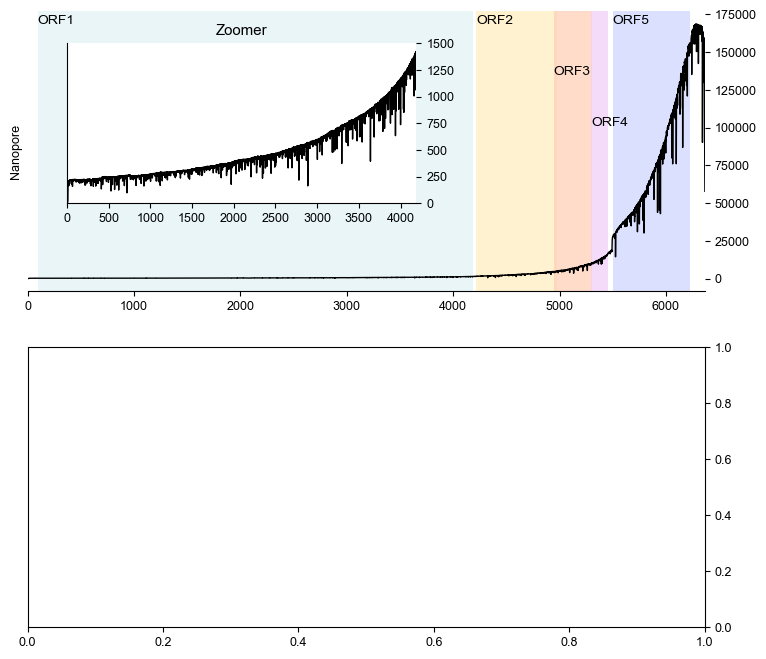

In [13]:
STRIDESIZE = 1 #bins width

mpl.rcParams['ytick.labelright'] = True
mpl.rcParams['ytick.labelleft'] = False
mpl.rcParams['ytick.right'] = True
mpl.rcParams['ytick.left'] = False

def plot_hist(ax, data, title):
    data = data.copy()
    data['binpos'] = np.floor(data['pos'] / STRIDESIZE).astype(int) * STRIDESIZE #np.floor()元素下限
    medcov = data.groupby('binpos').agg({'count': 'median'}) #bins 内取median

    #ax.fill_between(medcov.index, 0, medcov['count'].tolist())
    ax.plot(medcov.index, medcov['count'].tolist(), c='black', lw=1)
    ax.set_xlim(0, len(data))
    ax.set_ylabel(title)
    ax.grid(False)

    for _, row in cdsanno.iterrows():
        ax.axvspan(row['start'], row['end'], fc=row['color'], alpha=.7, zorder=1) #在坐标系添加垂直区域
        if ax is axes[0]:
            if row['name'] == 'ORF3':
                ax.annotate(row['name'], #row['name'].replace('ORF', '')
                        (row['start'] , medcov['count'].max()*0.8),
                        fontsize=10)
            elif row['name'] == 'ORF4':
                ax.annotate(row['name'], #row['name'].replace('ORF', '')
                        (row['start'] , medcov['count'].max()*0.6),
                        fontsize=10)
            else:
                ax.annotate(row['name'], #row['name'].replace('ORF', '')
                            (row['start'] , medcov['count'].max()),
                            fontsize=10)

    for spside in 'top left right'.split():
        plt.setp(ax.spines[spside], visible=False)
    
    ax.grid(False)
    plt.setp(ax.get_xgridlines(), visible=False)

fig, axes = plt.subplots(2, 1, figsize=(8.74, 8))
plot_hist(axes[0], bamvViral, 'Nanopore')
inner_ax = fig.add_axes([0.17, 0.64, 0.4, 0.2]) #x,y,width,height
#inner_ax.plot_hist(axes[1], bamvViral[:4191], 'ORF1')
dat=bamvViral[:4191].copy()
dat['binpos'] = np.floor(dat['pos'] / STRIDESIZE).astype(int) * STRIDESIZE
medcov = dat.groupby('binpos').agg({'count': 'median'})
inner_ax.plot(medcov.index,medcov['count'].tolist(), c='black', lw=1)
inner_ax.spines['right'].set_visible(False)
inner_ax.spines['top'].set_visible(False)
inner_ax.set(title='Zoomer', xlim=(0, 4191),ylim=(0,1500))
# yticks = np.arange(-0.02,0.04,0.01), xticks=[-0.4,0,.4])
plt.savefig(fp+'bamv/BaMV_genomemapped_readdepth.pdf')

## 02 subgenome

In [ ]:
TGBsgRNA_query_name

['15a4f611-4d10-402e-a621-9fc4cedbcd41.fast5',
 'b1a18df1-249c-4b54-844f-4775a62d1b6e.fast5',
 '9de33c4d-4999-4de4-9b24-00cb0ef9d612.fast5',
 '425774ee-3af1-4c9a-8cbc-0705a3cc8459.fast5',
 'bfccaf2e-8739-4c2c-a3f6-66bf711e16f4.fast5',
 '97ec2478-1024-4e2c-ad9b-2fc8c394cdc8.fast5',
 'ed0b6880-6024-4f30-9de9-383f71593449.fast5',
 'c8b89435-4919-4837-9fd8-51e35f92b4f2.fast5',
 '1ea86687-90d2-4f97-acb4-328b2b315524.fast5',
 '96f0c6a8-1c0e-4790-bb6a-f89bc31d90cc.fast5',
 'dc279ec7-93f2-44bc-a95b-79b578ca7a8e.fast5',
 '5f68e2cf-8f3e-4105-8232-a457f6cb3376.fast5',
 'c3bad17f-c587-43a2-9bd2-46c9a5769816.fast5',
 'e57e0590-5d1a-4303-990a-716de198a640.fast5',
 '40feec87-d07b-4727-95ec-cd20b2bf4327.fast5',
 '3e7d867b-7b7a-42ed-ba86-ee1a2f803919.fast5',
 '98433414-5cdf-408c-922c-4907acdbdf0b.fast5',
 'b57a14df-8e69-4668-8035-e61083c9a18a.fast5',
 'b0f1a929-7c9f-481f-951a-52811825b5f0.fast5',
 '70e917cf-699c-43f6-a0d0-3308b8612f3a.fast5',
 '641cdf7c-14bb-401b-82c4-004817408521.fast5',
 'e2920941-1e

In [14]:
cdsanno

,name,start,end,color,len
0,ORF1,94,4191,#e1f2f5,4098
1,ORF2,4218,4979,#ffedbc,762
2,ORF3,4945,5305,#ffceb3,361
3,ORF4,5299,5454,#f1ccf9,156
4,ORF5,5498,6226,#cbd3fd,729


In [ ]:
TGBsgRNA_query_name=[]
bam=pysam.AlignmentFile(f'/home/qq/work/lxr/DRS/virus_g/nanom6A_result/extract.sort.bam','r')
reg=bam.fetch('BaMV-genome')
outfile=pysam.AlignmentFile(path+'/TGBsgRNA_extract.sort.bam','wb',template=bam)
for read in reg:
    if read.flag!=16 and  4198<= read.reference_start< 4218 and 6223<read.reference_end:
        TGBsgRNA_query_name.append(read.query_name)
        outfile.write(read)
        print(read.query_name)
    else:
        continue
print(len(TGBsgRNA_query_name))
outfile.close()

15a4f611-4d10-402e-a621-9fc4cedbcd41.fast5
b1a18df1-249c-4b54-844f-4775a62d1b6e.fast5
9de33c4d-4999-4de4-9b24-00cb0ef9d612.fast5
425774ee-3af1-4c9a-8cbc-0705a3cc8459.fast5
bfccaf2e-8739-4c2c-a3f6-66bf711e16f4.fast5
97ec2478-1024-4e2c-ad9b-2fc8c394cdc8.fast5
ed0b6880-6024-4f30-9de9-383f71593449.fast5
c8b89435-4919-4837-9fd8-51e35f92b4f2.fast5
1ea86687-90d2-4f97-acb4-328b2b315524.fast5
96f0c6a8-1c0e-4790-bb6a-f89bc31d90cc.fast5
dc279ec7-93f2-44bc-a95b-79b578ca7a8e.fast5
5f68e2cf-8f3e-4105-8232-a457f6cb3376.fast5
c3bad17f-c587-43a2-9bd2-46c9a5769816.fast5
e57e0590-5d1a-4303-990a-716de198a640.fast5
40feec87-d07b-4727-95ec-cd20b2bf4327.fast5
3e7d867b-7b7a-42ed-ba86-ee1a2f803919.fast5
98433414-5cdf-408c-922c-4907acdbdf0b.fast5
b57a14df-8e69-4668-8035-e61083c9a18a.fast5
b0f1a929-7c9f-481f-951a-52811825b5f0.fast5
70e917cf-699c-43f6-a0d0-3308b8612f3a.fast5
641cdf7c-14bb-401b-82c4-004817408521.fast5
e2920941-1e7f-4444-aeba-3719c0014b3e.fast5
61608ef9-38f8-4587-a821-d742cb4a6d1b.fast5
322e7522-69

In [ ]:
sgRNA2_query_name=[]
bam=pysam.AlignmentFile(f'/home/qq/work/lxr/DRS/virus_g/nanom6A_result/extract.sort.bam','r')
reg=bam.fetch('BaMV-genome')
outfile=pysam.AlignmentFile(path+'/sgRNA2_extract.sort.bam','wb',template=bam)
for read in reg:
    if read.flag!=16 and 4960<= read.reference_start< 4980 and 6223<read.reference_end:
        sgRNA2_query_name.append(read.query_name)
        outfile.write(read)
        print(read.query_name)
    else:
        continue
print(len(sgRNA2_query_name))
outfile.close()

abd66376-fd17-4d4f-9d96-34072a8b9ee1.fast5
58f9208a-e46c-4b4b-ae80-b2f7da626620.fast5
b0e737ba-7d7d-4090-bbff-b87205691ec9.fast5
fb10e22c-ce81-4303-872a-340d661bdfe8.fast5
9e5e5690-7d72-455c-b102-0c35a6eb1dd2.fast5
918f8453-3b98-42a3-87e3-2c4106fd21ab.fast5
b766b23b-35fc-47cf-bf02-1acf2d5ebd97.fast5
9fde013d-ffee-4d3d-85e8-2f8aa8f8b379.fast5
c75b0f58-0679-4f77-be7c-22b81e17429b.fast5
b2cc005d-e479-40ef-87f0-9ea170ecc3be.fast5
0218bb15-a628-4c05-8da1-9562596684b9.fast5
05eb9c1b-416f-4cfb-8272-8ed8b50adf4b.fast5
c75db50a-3b42-4a5e-84de-213ea39e50f5.fast5
94f46547-690c-4c8f-b312-66b9527dbc09.fast5
2b327fd6-1e68-404b-a956-7898d9ca5ccd.fast5
b77de1b4-4535-40b1-ba38-dc11fbf3348c.fast5
7ba8937e-6550-45ec-8178-75be7b890aea.fast5
66c26cc7-1f58-4764-a6fc-e0320f45fb34.fast5
34661232-23fd-431d-8c82-a24130f45373.fast5
38de666e-2464-47f7-9e9f-8ff354afac09.fast5
c9c708ce-b1fb-4087-a5ea-f0611881b0ff.fast5
1d9dbe53-8e9b-41ba-a80e-207d501960f2.fast5
044723bc-e787-4094-b4d4-6766b035294a.fast5
751c56b3-f0

In [ ]:
CPsgRNA_query_name=[]
bam=pysam.AlignmentFile(f'/home/qq/work/lxr/DRS/virus_g/nanom6A_result/extract.sort.bam','r')
reg=bam.fetch('BaMV-genome')
outfile=pysam.AlignmentFile(path+'/CPsgRNA_extract.sort.bam','wb',template=bam)
for read in reg:
    if read.flag!=16 and 5478<= read.reference_start< 5498 and 6223<read.reference_end:
        CPsgRNA_query_name.append(read.query_name)
        outfile.write(read)
        print(read.query_name)
    else:
        continue
print(len(CPsgRNA_query_name))
outfile.close()

a513cca7-4135-4ffc-ae27-8db41347375f.fast5
10b656a5-dbde-4b90-805b-72e310540a69.fast5
3696200d-062b-40cd-a37e-33a5919a8e0e.fast5
61b0d9ad-0946-4ce4-b958-8749c682c203.fast5
f68cfa5d-4b9e-487c-8be4-29890b5b1f3b.fast5
9533e7dd-7a6f-478d-aa30-395eff6a20c8.fast5
c0438b77-afc4-4615-a7d8-cd7040ce522a.fast5
3866fd25-c7b7-472c-9d67-474262404e9f.fast5
a5c5ca03-8fde-4cf2-871f-9e5741caf8ea.fast5
ae07a37e-c4d6-421d-97c7-2cda9bfd8285.fast5
14a8f105-a223-4487-b6bd-5ebaa8944384.fast5
6559bf34-c883-4bb9-9a90-21576b06cf4c.fast5
38ef30a0-5da5-4ce9-87f3-5a5be5a68e58.fast5
4355d991-8368-41a5-b842-46ab16eb4c2e.fast5
6497d649-af26-4034-9ef2-8320b1bc6eda.fast5
cc887e7a-664f-49db-a1ca-48d63e193d64.fast5
d906725d-281b-4cc1-ab59-bfec04371264.fast5
e5ba273f-e605-4a15-9308-52a11ce850f0.fast5
a8eb5cb9-1269-4348-bef1-161440aec094.fast5
ad5d7115-7ac5-46b7-949d-9fbf42368238.fast5
e8a7f386-c1d8-436a-9cc5-8499858b2c03.fast5
10d636aa-8be8-4aa5-9163-bbecd92ac504.fast5
31baab1b-8e10-40e6-84f4-5b71aecd61e4.fast5
2ed2c070-b7

gRNA_query_name=[]
bam=pysam.AlignmentFile(f'/home/qq/work/lxr/DRS/virus_g/nanom6A_result/extract.sort.bam','r')
reg=bam.fetch('BaMV-genome')
outfile=pysam.AlignmentFile(path+'/gRNA_extract.sort.bam','wb',template=bam)
for read in reg:
    if read.flag!=16 and 0<= read.reference_start< 4191 and 6223<read.reference_end:
        gRNA_query_name.append(read.query_name)
        outfile.write(read)
        print(read.query_name)
    else:
        continue
print(len(gRNA_query_name))
outfile.close()

In [ ]:
read_class={}
for i in TGBsgRNA_query_name:
    read_class[i]='TGBsgRNA'
for i in sgRNA2_query_name:
    read_class[i]='sgRNA2'
for i in CPsgRNA_query_name:
    read_class[i]='CPsgRNA'
for i in gRNA_query_name:
    read_class[i]='gRNA'

In [ ]:
pd.DataFrame.from_dict(read_class,orient='index').reset_index().rename(columns={'index':'fast5',0:'class'}).to_csv(path+'/classed_read_name.csv',index=False)

In [ ]:
genome_abandance=pd.read_csv('/home/qq/work/lxr/DRS/virus_g/nanom6A_result/genome_abandance.0.5.bed.filler.bed',sep='\t',names=['chr','site','gene','fast5','rel_pos','motif'])

In [ ]:
genome_abandance

,chr,site,gene,fast5,rel_pos,motif
0,BaMV-genome,6186,BaMV-genome,0039ca86-6380-42dc-b107-6cd323b47af2.fast5,246,AAACA
1,BaMV-genome,5688,BaMV-genome,0077e4f8-961a-4c03-abf3-4de8639a1540.fast5,564,AAACA
2,BaMV-genome,6186,BaMV-genome,0077e4f8-961a-4c03-abf3-4de8639a1540.fast5,1062,AAACA
3,BaMV-genome,6186,BaMV-genome,00bab56a-8d8e-4180-8285-fc71b7a54c32.fast5,110,AAACA
4,BaMV-genome,6245,BaMV-genome,00bab56a-8d8e-4180-8285-fc71b7a54c32.fast5,169,AAACA
...,...,...,...,...,...,...
408301,BaMV-genome,2261,BaMV-genome,e0ec7761-22a5-4d70-aed7-19c8c9958af9.fast5,1178,GGACT
408302,BaMV-genome,5702,BaMV-genome,e3426810-12fa-4cb3-8cb1-d0652aed0aaf.fast5,296,GGACT
408303,BaMV-genome,5702,BaMV-genome,edf80e34-74cf-45ff-a7a4-7b8ffd74a6d8.fast5,208,GGACT
408304,BaMV-genome,5702,BaMV-genome,ef02cc42-ba2c-4727-be04-0a5fe629f3c3.fast5,586,GGACT


In [ ]:
genome_abandance['name']=np.where(genome_abandance['fast5'].isin(gRNA_query_name),"gRNA",np.where(genome_abandance['fast5'].isin(TGBsgRNA_query_name),"TGBsgRNA",np.where(genome_abandance['fast5'].isin(sgRNA2_query_name),'sgRNA2',np.where(genome_abandance['fast5'].isin(CPsgRNA_query_name),'CPsgRNA','undefined'))))

In [ ]:
genome_abandance.to_csv('/home/qq/work/lxr/DRS/virus_g/nanom6A_result/extract_sg/classified_genome_abandance.csv',sep='\t',index=False)

In [6]:
genome_abandance=pd.read_csv('/home/qq/work/lxr/DRS/virus_g/nanom6A_result/extract_sg/classified_genome_abandance.csv',sep='\t')

In [ ]:
pd.DataFrame.from_dict(read_class,orient='index').reset_index().rename(columns={'index':'fast5',0:'class'}).to_csv(path+'classed_read_name.csv',index=False)

### 1. virus m6A

In [7]:
import pysam
from matplotlib import cm, colors
from copy import deepcopy

In [ ]:
virus_sg_ratio=pd.DataFrame()
n=1
for sgname in ['gRNA','TGBsgRNA','sgRNA2','CPsgRNA']:
    n += 1 
    dat=genome_abandance[genome_abandance['name'] == sgname]
    locals()[sgname+'_ratio']=dat.groupby('site').agg({'fast5':'count'}).rename(columns={'fast5':'mod_num'}).merge(dat[['chr','site','name']],left_index=True,right_on='site',how='left')
    dat_ratio=eval(sgname+'_ratio')
    dat_ratio=dat.groupby('site').agg({'fast5':'count'}).rename(columns={'fast5':'mod_num'})
    dat_ratio['site']=dat_ratio.index
    site_totalnum={}
    for i in dat_ratio.site.unique():
        bam=pysam.AlignmentFile('/home/qq/work/lxr/DRS/virus_g/nanom6A_result/extract_sg/'+sgname+'_extract.sort.bam','r')
        reg=bam.fetch('BaMV-genome')
        site_totalnum[i]=0
        for read in reg:
            #print(read.reference_start,read.reference_end)
            if read.reference_start <= i <= read.reference_end:
                site_totalnum[i] += 1

    dat_ratio['total_num']=site_totalnum.values()
    dat_ratio['mod_ratio'] = dat_ratio['mod_num']/dat_ratio['total_num']
    dat_ratio['gene_name']=sgname
    dat_ratio['scaffold']='BaMV-genome'
    if n ==1 :
        virus_sg_ratio=dat_ratio
    else:
        virus_sg_ratio=pd.concat([dat_ratio,virus_sg_ratio])
# virus_sg_ratio.to_csv('/home/qq/work/lxr/DRS/virus_g/nanom6A_result/extract_sg/virus_sg_ratio.csv',index=False)

[W::hts_idx_load3] The index file is older than the data file: /home/qq/work/lxr/DRS/virus_g/nanom6A_result/extract_sg/gRNA_extract.sort.bam.bai
[W::hts_idx_load3] The index file is older than the data file: /home/qq/work/lxr/DRS/virus_g/nanom6A_result/extract_sg/gRNA_extract.sort.bam.bai
[W::hts_idx_load3] The index file is older than the data file: /home/qq/work/lxr/DRS/virus_g/nanom6A_result/extract_sg/gRNA_extract.sort.bam.bai
[W::hts_idx_load3] The index file is older than the data file: /home/qq/work/lxr/DRS/virus_g/nanom6A_result/extract_sg/gRNA_extract.sort.bam.bai
[W::hts_idx_load3] The index file is older than the data file: /home/qq/work/lxr/DRS/virus_g/nanom6A_result/extract_sg/gRNA_extract.sort.bam.bai
[W::hts_idx_load3] The index file is older than the data file: /home/qq/work/lxr/DRS/virus_g/nanom6A_result/extract_sg/gRNA_extract.sort.bam.bai
[W::hts_idx_load3] The index file is older than the data file: /home/qq/work/lxr/DRS/virus_g/nanom6A_result/extract_sg/gRNA_extrac

In [ ]:
virus_sg_ratio['gene_name'].value_counts()

gene_name
gRNA        122
TGBsgRNA     37
sgRNA2       24
CPsgRNA      20
Name: count, dtype: int64

In [13]:
cdsanno

,name,start,end,color
0,ORF1,94,4191,#e1f2f5
1,ORF2,4218,4979,#ffedbc
2,ORF3,4945,5305,#ffceb3
3,ORF4,5299,5454,#f1ccf9
4,ORF5,5498,6226,#cbd3fd


In [5]:
virus_ratio_df = pd.read_csv('/home/qq/work/lxr/DRS/virus_g/nanom6A_result/extract_sg/virus_sg_ratio.csv',sep=',')

In [156]:
virus_ratio_df

,mod_num,position,total_num,mod_ratio,gene_name,scaffold
0,1132,5507,8927,0.126806,CPsgRNA,BaMV-genome
1,684,5543,8927,0.076621,CPsgRNA,BaMV-genome
2,227,5594,8927,0.025428,CPsgRNA,BaMV-genome
3,923,5659,8927,0.103394,CPsgRNA,BaMV-genome
4,366,5665,8927,0.040999,CPsgRNA,BaMV-genome
...,...,...,...,...,...,...
198,945,6186,1325,0.713208,gRNA,BaMV-genome
199,573,6211,1325,0.432453,gRNA,BaMV-genome
200,66,6222,1325,0.049811,gRNA,BaMV-genome
201,246,6245,1324,0.185801,gRNA,BaMV-genome


In [46]:
bamv_ratio = virus_ratio_df

In [82]:
modpct=bamv_ratio[['gene_name','position','mod_ratio']].pivot(index='position',values='mod_ratio',columns='gene_name').fillna(0)
modcov=bamv_ratio[['gene_name','position','total_num']].pivot(index='position',values='total_num',columns='gene_name').fillna(0)

In [135]:
def get_id(info):
    for value in info.split(';'):
        if 'ID' in value:
            return value.split('=')[1]
def get_name(name):
    return name_dict.get(name)

In [136]:
annotations = pd.read_csv("/home/qq/work/lxr/DRS/virus_g/nanom6A_result/extract_sg/BaMV_sg.txt",sep='\t',names=['chr','ty','start','end','strand','attribute'])
annotations['start'] -= 1
# cdsanno = annotations[annotations['ty']=='CDS']
cdsanno = annotations[annotations['ty']=='mRNA']
cdsanno['name'] = cdsanno['attribute'].apply(get_id)
# name_dict={'gRNA':'BaMV-genome','TGBsgRNA':'BaSGP1','sgRNA2':'BaSGP2','CPsgRNA':'BacpSGP'}
# cdsanno['gene'] = cdsanno['name'].apply(get_name)
# cdsanno=cdsanno.sort_values(by='start')

/tmp/ipykernel_2047689/1494504176.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cdsanno['name'] = cdsanno['attribute'].apply(get_id)


In [137]:
cdsanno

,chr,ty,start,end,strand,attribute,name
1,BaMV-genome,mRNA,0,6366,+,ID=gRNA;Parent=BaMV-genome;Name=gRNA,gRNA
11,BaMV-genome,mRNA,4197,6366,+,ID=TGBsgRNA;Parent=TGBsgRNA;Name=TGBsgRNA,TGBsgRNA
20,BaMV-genome,mRNA,4944,6366,+,ID=sgRNA2;Parent=sgRNA2;Name=sgRNA2,sgRNA2
27,BaMV-genome,mRNA,5497,6366,+,ID=CPsgRNA;Parent=CPsgRNA;Name=CPsgRNA,CPsgRNA


In [32]:
annotations

,chr,ty,start,end,strand,attribute
0,BaMV-genome,gene,0,6366,+,ID=gRNA;Name=gRNA;translate_name=Replicase
1,BaMV-genome,mRNA,0,6366,+,ID=gRNA;Parent=BaMV-genome;Name=gRNA
2,BaMV-genome,five_prime_UTR,0,93,+,ID=gRNA.utr5p1;Parent=gRNA
3,BaMV-genome,exon,0,4191,+,ID=gRNA.exon1;Parent=gRNA
4,BaMV-genome,CDS,93,4191,+,ID=cds.gRNA;Parent=gRNA
5,BaMV-genome,exon,4191,5456,+,ID=gRNA.exon2;Parent=gRNA
6,BaMV-genome,CDS,4217,5456,+,ID=cds.gRNA;Parent=gRNA
7,BaMV-genome,exon,5456,6366,+,ID=gRNA.exon3;Parent=gRNA
8,BaMV-genome,CDS,5497,6226,+,ID=cds.gRNA;Parent=gRNA
9,BaMV-genome,three_prime_UTR,6226,6366,+,ID=gRNA.utr3p1;Parent=gRNA


In [154]:
SHRINK_TO = 4191
# SHRINK_RATIO = 1/10
SHRINK_RATIO = 1
def transform_to_xaxis(positions):
    ret = []
    for v in positions: #relative pos
        if v >= REGIONS_BOUNDARY:
            ret.append((v - REGIONS_BOUNDARY) * REGION2_RATIO + REGIONS_BOUNDARY * REGION1_RATIO)
        else:
            ret.append(v * REGION1_RATIO)
    return ret

MINCOVERAGE = 1
IGNORECDSENDS = 0

# BARLENGTH = 7500 # 0-25000 -> 2500, 25000->30000 -> 5000 = 7500
BARLENGTH = 6366
# REGIONS_BOUNDARY = 25000
REGIONS_BOUNDARY = 4191
# REGION1_RATIO = 1/10
REGION1_RATIO = 1
REGION2_RATIO = 1
BAR_WIDTH = 14 # px

XTICKS_MAJOR = np.hstack([np.arange(0, SHRINK_TO+1, 636), np.arange(SHRINK_TO, 6366, 636)])
XTICKS_TRANSFORMED = transform_to_xaxis(XTICKS_MAJOR)
COLORMAP_GAMMA = 0.75

def build_heat_bar(scores, posleftlim):
    dpoints = np.zeros(BARLENGTH, np.float64) #Return a new array of given shape and type, filled with zeros.
    for pos, score in scores.sort_values().items():
        if pos >= REGIONS_BOUNDARY:
            vpos = (pos - REGIONS_BOUNDARY) * REGION2_RATIO + REGIONS_BOUNDARY * REGION1_RATIO
        else:
            vpos = pos * REGION1_RATIO
        
        draw_range = np.arange((vpos - BAR_WIDTH//2), (vpos + BAR_WIDTH//2)).astype(int)
        # draw_range =  int(vpos)
        dpoints[draw_range] = score

    vleftlim = int(transform_to_xaxis([posleftlim])[0])
    if vleftlim > 0:
        dpoints[:vleftlim] = np.nan

    return dpoints

In [140]:
ORFs = cdsanno['name'].unique().tolist()
# ORFs = ['BaMV-genome' if i =='gRNA' else i for i in ORFs]

In [141]:
ORFs

['gRNA', 'TGBsgRNA', 'sgRNA2', 'CPsgRNA']

/tmp/ipykernel_2047689/3740586036.py:32: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  fig.colorbar(cmb, cax=cbar_ax, orientation='horizontal',label='Modification level')


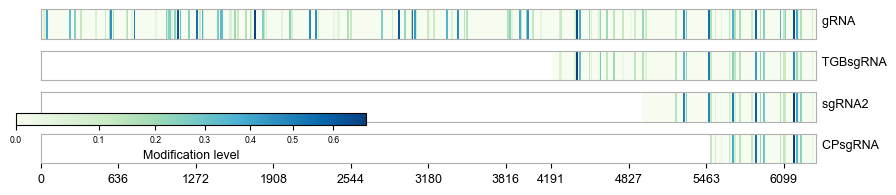

In [155]:
fig, axes = plt.subplots(4, 1, figsize=(10, 2))

for ax, orfname in zip(axes, ORFs):
    has_enough_coverage = (modcov[orfname] >= MINCOVERAGE)
    cdsrange = cdsanno[cdsanno['name'] == orfname].iloc[0]

    in_range = (
        modpct.index.to_series() >= (cdsrange['start'] + IGNORECDSENDS))
    #filter: coverage, cdsstart+IGNORECDSENDS
    filtered_score = modpct[orfname] * has_enough_coverage * in_range
    # print(filtered_score)
    heatscores = build_heat_bar(filtered_score, cdsrange['start'])
    
    #vmin=0, vmax=0.85
    cmb = ax.pcolor([heatscores],  cmap='GnBu', norm=colors.PowerNorm(COLORMAP_GAMMA))
    ax.set_ylim(0, 1)
    ax.set_xticks(XTICKS_TRANSFORMED)
    ax.set_xticklabels(XTICKS_MAJOR)
    ax.text(x=6300,y=0.5,s='    '+orfname)
    # ax.set_ylabel(orfname+'   ',labelpad=1, rotation=0,loc='bottom')

    for direction in 'top bottom left right'.split():
        plt.setp(ax.spines[direction], edgecolor='#b0b0b0')
    plt.setp(ax.get_yticklabels(), visible=False)
    plt.setp(ax.get_yticklines(), visible=False)
    if orfname != 'CPsgRNA':
        plt.setp(ax.get_xticklabels(), visible=False)
        plt.setp(ax.get_xticklines(), visible=False)
# plt.annotate(x=636,s='Modification level')
cbar_ax = fig.add_axes([0.1, 0.3, 0.35, 0.06])
#colorbar 即主图旁一个长条状的小图，能够辅助表示主图中 colormap 的颜色组成和颜色与数值的对应关系
fig.colorbar(cmb, cax=cbar_ax, orientation='horizontal',label='Modification level')
cbar_ax.tick_params(labelsize='x-small')
plt.subplots_adjust(hspace=.4)

# plt.savefig(fp+'cand-modification-positions.pdf')

### 2. modified motif

In [157]:
genome_abandance

,chr,site,gene,fast5,rel_pos,motif,name
0,BaMV-genome,6186,BaMV-genome,0039ca86-6380-42dc-b107-6cd323b47af2.fast5,246,AAACA,undefined
1,BaMV-genome,5688,BaMV-genome,0077e4f8-961a-4c03-abf3-4de8639a1540.fast5,564,AAACA,undefined
2,BaMV-genome,6186,BaMV-genome,0077e4f8-961a-4c03-abf3-4de8639a1540.fast5,1062,AAACA,undefined
3,BaMV-genome,6186,BaMV-genome,00bab56a-8d8e-4180-8285-fc71b7a54c32.fast5,110,AAACA,undefined
4,BaMV-genome,6245,BaMV-genome,00bab56a-8d8e-4180-8285-fc71b7a54c32.fast5,169,AAACA,undefined
...,...,...,...,...,...,...,...
408301,BaMV-genome,2261,BaMV-genome,e0ec7761-22a5-4d70-aed7-19c8c9958af9.fast5,1178,GGACT,gRNA
408302,BaMV-genome,5702,BaMV-genome,e3426810-12fa-4cb3-8cb1-d0652aed0aaf.fast5,296,GGACT,undefined
408303,BaMV-genome,5702,BaMV-genome,edf80e34-74cf-45ff-a7a4-7b8ffd74a6d8.fast5,208,GGACT,CPsgRNA
408304,BaMV-genome,5702,BaMV-genome,ef02cc42-ba2c-4727-be04-0a5fe629f3c3.fast5,586,GGACT,undefined


In [7]:
df=pd.DataFrame(genome_abandance[genome_abandance['name'] != 'undefined'][['fast5','motif']].value_counts(),columns=['count']).reset_index()

In [8]:
df=pd.DataFrame(genome_abandance[['name','motif']].value_counts(),columns=['count']).reset_index()

In [9]:
df

,name,motif,count
0,undefined,AAACA,147575
1,undefined,AAACC,54658
2,undefined,GAACC,51054
3,undefined,AAACT,38367
4,undefined,AGACC,36009
5,CPsgRNA,AAACA,11724
6,undefined,AGACT,9952
7,CPsgRNA,AAACT,6238
8,CPsgRNA,AAACC,6222
9,undefined,GAACA,6159


In [10]:
df_wide=pd.DataFrame(df.pivot(index='name',columns='motif',values='count'))

In [12]:
df_wide=df_wide.fillna(0)
df_wide_2 = df_wide.div(df_wide.sum(axis=1), axis=0)
df_wide_2['gene']=df_wide.index
df_wide_2=df_wide_2.iloc[0:4]
sort_list=['gRNA','TGBsgRNA','sgRNA2','CPsgRNA']
df_wide_2=df_wide_2.loc[sort_list]
df_wide_2=df_wide_2[df_wide_2.loc['gRNA'][:-1].sort_values(ascending=False).index]

In [14]:
df_wide_2.columns[:-1]

Index(['AAACA', 'AAACT', 'GAACC', 'AGACC', 'GGACA', 'AAACC', 'GAACT', 'GGACC',
       'GGACT', 'GAACA', 'AGACA'],
      dtype='object', name='motif')

In [15]:
def get_float(n):
    return float(n)

In [16]:
round(df_wide_2.loc['gRNA'],4)

motif
AAACA    0.2519
AAACT    0.1636
GAACC    0.1424
AGACC    0.0799
GGACA    0.0753
AAACC    0.0712
GAACT    0.0517
GGACC    0.0496
GGACT    0.0470
GAACA    0.0236
AGACA    0.0231
AGACT    0.0207
Name: gRNA, dtype: float64

In [17]:
df_wide_2.sum(axis=1)

name
gRNA        1.0
TGBsgRNA    1.0
sgRNA2      1.0
CPsgRNA     1.0
dtype: float64

In [18]:
df_wide_2

motif,AAACA,AAACT,GAACC,AGACC,GGACA,AAACC,GAACT,GGACC,GGACT,GAACA,AGACA,AGACT
name,,,,,,,,,,,,
gRNA,0.251889,0.163587,0.142425,0.079916,0.075284,0.071237,0.051685,0.049588,0.047004,0.023599,0.023112,0.020674
TGBsgRNA,0.270270,0.131757,0.202703,0.057432,0.101351,0.101351,0.016892,0.054054,0.020270,0.010135,0.027027,0.006757
sgRNA2,0.428152,0.131965,0.185728,0.060606,0.000000,0.127077,0.022483,0.000000,0.021505,0.015640,0.000000,0.006843
CPsgRNA,0.338277,0.179987,0.121790,0.066276,0.000000,0.179526,0.032662,0.000000,0.040020,0.032806,0.000000,0.008656


In [ ]:
kmers

Index(['AAACA', 'AAACT', 'GAACC', 'AGACC', 'GGACA', 'AAACC', 'GAACT', 'GGACC',
       'GGACT', 'GAACA', 'AGACA'],
      dtype='object', name='motif')

In [19]:
df_wide_2*100

motif,AAACA,AAACT,GAACC,AGACC,GGACA,AAACC,GAACT,GGACC,GGACT,GAACA,AGACA,AGACT
name,,,,,,,,,,,,
gRNA,25.188941,16.358672,14.242528,7.991613,7.528402,7.123702,5.168463,4.958799,4.700375,2.359940,2.311180,2.067385
TGBsgRNA,27.027027,13.175676,20.270270,5.743243,10.135135,10.135135,1.689189,5.405405,2.027027,1.013514,2.702703,0.675676
sgRNA2,42.815249,13.196481,18.572825,6.060606,0.000000,12.707722,2.248289,0.000000,2.150538,1.564027,0.000000,0.684262
CPsgRNA,33.827688,17.998730,12.179006,6.627618,0.000000,17.952565,3.266201,0.000000,4.001962,3.280628,0.000000,0.865601


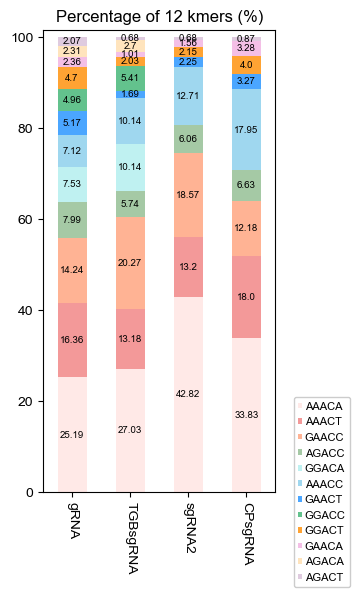

In [ ]:
###kmer分布比例图

# plt.bar(df[df['sample'] == 'ADAR-366-6_L1_132A32']['sample'],df[df['sample'] == 'ADAR-366-6_L1_132A32']['count'])
# plt.bar(x, y, align='center', color='#66c2a5', tick_label=['A', 'B', 'C', 'D', 'E'], label='班级A')
plt.figure(figsize=(3,6))
colors = ['mistyrose','lightcoral','lightsalmon','darkseagreen','paleturquoise','skyblue','dodgerblue','mediumseagreen','darkorange','#f2b0e0','navajowhite','Thistle']
# colors=sns.palplot(sns.color_palette('Set3'))
kmers = df_wide_2.columns[:]
#y=df_wide['kong']
i=0
for i,color in zip(range(len(kmers)),colors):
    if i == 0 :
        # plt.bar(df_wide['sample'],df_wide[muts[i]],color=color, tick_label=['AD_355','AD_364','AD_366','B8BA','FTOAD','MTAA','T2A','T8A'], label=muts[i])
        bars=plt.bar(df_wide_2.index,df_wide_2[kmers[i]][0:4]*100,color=color, label=kmers[i],width=0.5,linewidth=0.3,alpha=0.8)
        i += 1
        for bar in bars:
            height=bar.get_height()
            if height !=0:
                plt.text(bar.get_x()+bar.get_width()/2,bar.get_y()+height/2,str(round(height,2)),fontsize=7, ha='center', va='center', color='black')
        #tick_label=[''], 
    else:
        y = df_wide_2[kmers[:i]].T.sum()*100
        bars=plt.bar(df_wide_2.index,df_wide_2[kmers[i]]*100, align='center', bottom=y, color=color, label=kmers[i],width=0.5,linewidth=0.3,alpha=0.8)
        i +=1
        for bar in bars:
            height=bar.get_height()
            if height !=0:
                plt.text(bar.get_x()+bar.get_width()/2,bar.get_y()+height/2,str(round(height,2)),fontsize=7, ha='center', va='center', color='black')
plt.ylim(0.0,101.5)
plt.xlim(-0.5,3.5)
plt.xticks(rotation=270)
plt.title('Percentage of 12 kmers (%)',fontsize=12)           ###handlelength修改图例长度和宽度；handletexpad修改符号与文字间隔，facecolor、framealpha修改背景色和透明度
plt.legend(bbox_to_anchor=(1.2, -0.0),loc=10,ncol=1,fontsize=8,handlelength=0.35,handleheight=0.4, handletextpad=0.2,facecolor='white',framealpha=1)
#plt.text(1,1,df_wide.loc[1,['count']])
plt.savefig('/home/qq/work/lxr/DRS/virus_g/nanom6A_result/extract_sg/virusRNA_kmer_mutpercentage_3.pdf',bbox_inches='tight')

### 3.virus PAL

In [162]:
classified_genome_abandance = pd.read_csv(path+"classified_genome_abandance.csv",sep='\t')

In [164]:
Rep1_polya_results = pd.read_csv("/home/qq/work/lxr/DRS/virus_g/run_DRS_virus/bamv/05_polya_tail/Rep1_polya_results.tsv",sep='\t')
Rep2_polya_results = pd.read_csv("/home/qq/work/lxr/DRS/virus_g/run_DRS_virus/bamv/05_polya_tail/Rep2_polya_results.tsv",sep='\t')

In [165]:
polya_virus=pd.concat([Rep1_polya_results[Rep1_polya_results['qc_tag']=='PASS'],Rep2_polya_results[Rep2_polya_results['qc_tag']=='PASS']])

In [166]:
classified_genome_abandance['fast5'] = classified_genome_abandance['fast5'].str.replace('.fast5','')

In [167]:
classed_read_name = pd.read_csv(path+"classed_read_name.csv")
classed_read_name['fast5'] = classed_read_name['fast5'].str.replace('.fast5','')

In [169]:
polya_virus_class=polya_virus.merge(classed_read_name,left_on='readname',right_on='fast5')

In [170]:
median_polya={}
for c_name,temp in polya_virus_class.groupby('class'):
    median_virus=temp.polya_length.median()
    median_polya[c_name]=median_virus

<Figure size 450x350 with 0 Axes>

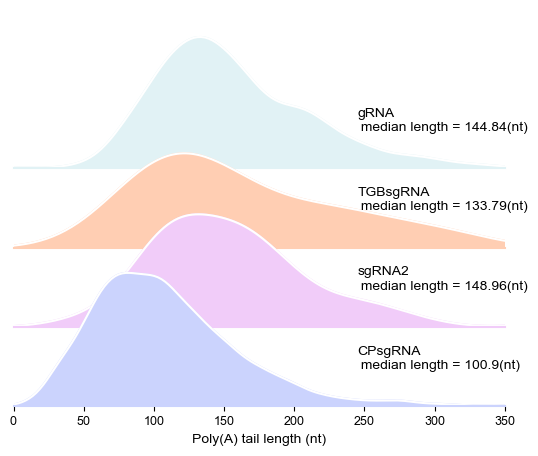

In [173]:
palette_virus=["#e1f2f5", "#ffceb3","#f1ccf9","#cbd3fd"]#'#c5d9ea','#e8d2c4','#82c91e','#da77f2','#fd7e14'
categories=polya_virus_class['class'].unique()
fig=plt.figure(figsize=(4.5,3.5))
g=sns.FacetGrid(polya_virus_class,row='class',hue='class',aspect=5,height=1.2,palette=palette_virus[0:4],xlim=(0,350),ylim=(0,0.01))
g.map(sns.kdeplot,'polya_length',fill=True,common_norm=False,alpha=1,linewidth=1.5)
g.map(sns.kdeplot,'polya_length' ,color='white',linewidth=1.5,alpha=1)
def label(a,color,label):
    ax=plt.gca()
    ax.text(.7,.3,s=(label + '\n median length = '+str(median_polya[label])+'(nt)'),color='black',fontsize=10,va='center',ha='left',transform=ax.transAxes)
g.map(label,'class')
g.map(plt.axhline,y=0,lw=1.5,clip_on=False)
g.set_ylabels('')
g.set_xlabels('Poly(A) tail length (nt)',fontsize=10)
# Adjust the subplots to make room for the labels
g.fig.subplots_adjust(hspace=-0.5)
for ax in g.axes.flat:
    ax.set_facecolor('none')
for ax in g.axes.flat[:-1]:
    ax.tick_params(length=0)
g.set(yticks=[])
g.set_titles('')
g.despine(bottom=True,left=True)
# g.set(xticks=[])
# g.fig.subplots_adjust(hspace=-0.5)
# plt.savefig(path+'gRNA_sgRNA_polyAlen.pdf',format="pdf",dpi=600,bbox_inches="tight",transparent=True)

In [174]:
polya_virus_class.to_csv(path+'polya_virus_class.csv',index=False)

## 03 potential chimeric reads

In [ ]:
fussion={}
virus_chr = "BaMV-genome"
host_chr = "chrHost"
host_end_range = 50
virus_end_range_start=5457
virus_end_range_end=6369
fp='/home/qq/work/lxr/DRS/fussion/correct_transcriptome/'
# 打开 BAM 文件
# 打开 BAM 文件
###samtools view -h -q 20 bamv_transcriptome_ma_virus.sorted.bam |grep  -e '^@' -e  'SA:Z' |grep -e '^@' -e  'BaMV-genome'  |samtools sort -o potential_fussion.bam
bamfile = pysam.AlignmentFile(fp+"potential_fussion.bam", "rb")
for read in bamfile:
    if read.reference_start <= host_end_range or read.reference_end >= (read.reference_length - host_end_range):
        if read.is_reverse:
            strand_host = "-"
        else:
            strand_host = "+"
        if read.has_tag("SA"):
            sa_tag = read.get_tag("SA")
            
            # 解析次要比对信息
            for sa_alignment in sa_tag.split(";"):
                if sa_alignment:
                    fields = sa_alignment.split(",")
                    rname = fields[0]      # 次要比对染色体
                    pos = int(fields[1])   # 次要比对起始位置
                    strand=fields[2]
                    if rname == virus_chr and virus_end_range_start <= pos <= virus_end_range_end and strand_host==strand:
                            fussion.append(read.query_name)
                            print(f"Fusion candidate: Read {read.query_name} :{pos} has primary alignment at host end and secondary alignment at virus end.")


Fusion candidate: Read f2fa57fb-5371-4a78-b509-42f0c014e6b1 :6305 has primary alignment at host end and secondary alignment at virus end.
Fusion candidate: Read f9961b1a-87b8-40c7-804c-ba7beb0e8fb4 :6310 has primary alignment at host end and secondary alignment at virus end.
Fusion candidate: Read c7929184-0b83-414b-b257-5e7b4ad4cf9c :6300 has primary alignment at host end and secondary alignment at virus end.
Fusion candidate: Read 4f27685b-ffa7-4e60-8142-c29075fc744b :6306 has primary alignment at host end and secondary alignment at virus end.
Fusion candidate: Read 683e331d-dbf5-47a8-961e-b4af2842a408 :6305 has primary alignment at host end and secondary alignment at virus end.
Fusion candidate: Read 9bb8c5d8-e1ad-48b1-b5cc-232dac37da06 :6309 has primary alignment at host end and secondary alignment at virus end.
Fusion candidate: Read f6c41ea4-9b4c-4e3a-9773-e74cd98df858 :6310 has primary alignment at host end and secondary alignment at virus end.
Fusion candidate: Read da9828a4-ed

In [ ]:
df=pd.DataFrame.from_dict(gene_sa,orient='index')
df=df[df['mapq'] >20]
df_use=pd.DataFrame()
for read,temp in df.groupby('read_name'):
    tmp=temp.sort_values('flag')
    df_use=pd.concat([df_use,pd.DataFrame(tmp.iloc[0,:]).T],axis=0)
    df_use['type']=df_use['primary_gene'].apply(lambda x: 'virus' if x == 'BaMV-genome' else 'host')

In [182]:
cdsanno=pd.read_csv('/home/qq/work/lxr/DRS/virus_g/gene_info/cdsanno.txt',sep='\t')
cdsanno['len']=cdsanno['end']-cdsanno['start']+1

In [183]:
cdsanno

,name,start,end,color,len
0,ORF1,94,4191,#e1f2f5,4098
1,ORF2,4218,4979,#ffedbc,762
2,ORF3,4945,5305,#ffceb3,361
3,ORF4,5299,5454,#f1ccf9,156
4,ORF5,5498,6226,#cbd3fd,729


In [178]:
df_use=pd.read_csv('/home/qq/work/lxr/DRS/fussion/correct_transcriptome/fusion_point_dla_virus.csv',index_col=0)

In [179]:
pos_readnum=df_use['virus_pos'].value_counts().reset_index()

In [180]:
pos_readnum

,virus_pos,count
0,6262,47
1,5494,45
2,6243,44
3,6239,41
4,6277,36
...,...,...
710,5760,1
711,5854,1
712,505,1
713,6163,1


In [184]:
patch_positions=[(94,4097),(4218,758),(4946,356),(5299,155),(5498,725)]
patch_label=cdsanno.name
patch_color=cdsanno['color']

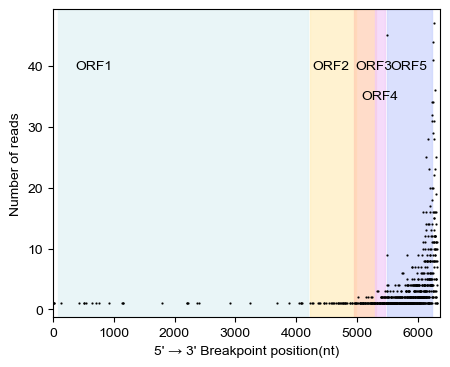

In [ ]:
fig,ax = plt.subplots(figsize=(5,4))
length=6366
for (start,width),color,label in zip(patch_positions,patch_color,patch_label):
    #rect = plt.Rectangle((start,-1.5),width,2,color=,edgecolor=(0, 0, 0, 0.7),linewidth=1,alpha=0.3)
    if label == 'ORF4':
        ax.text(start + width /2 , 35,label, ha='center',va='center',color='black',fontsize=10)
    else:
        ax.text(start +width /15 , 40,label, ha='left',va='center',color='black',fontsize=10)
    ax.axvspan(start,start+width,color=color,alpha=.7)
sns.scatterplot(x=pos_readnum['virus_pos'],y=pos_readnum['count'],ax=ax,legend=False,color='black',s=2,edgecolor='black')
pp=pos_readnum[pos_readnum['virus_pos'].isin([5494])]
sns.lineplot(x=pp['virus_pos'],y=pp['count'],ax=ax,legend=False,color='red')
ax.set_xlim(0,length)
# ax.set_ylim(-1.5,45)
#ax.set_xlabel('Genomic coordinate',fontsize=10)
ax.set_xlabel("5' → 3' Breakpoint position(nt)")
ax.set_ylabel('Number of reads',fontsize=10)

    ##ax.add_patch(rect)
plt.savefig('/home/qq/work/lxr/DRS/virus_g/nanom6A_result/extract_sg/fusion_readnum_on_virus.pdf', bbox_inches="tight")

In [185]:
pos_readnum_2=df_use.groupby('type')['virus_pos'].value_counts().reset_index()

In [187]:
deseq2_bamv_ck_res=pd.read_csv('/home/qq/work/lxr/DRS/wig/deseq2_bamv_ck_res_1.5.csv')

In [188]:
BaMV_TPM=[]
CK_TPM=[]
host_gene=[]
for index,row in df_use.iterrows():
    #print(row)
    if 'BaMV' in row[0]:
        host_gene.append(row[1])
        if len(deseq2_bamv_ck_res[deseq2_bamv_ck_res['gene_name']==row[1]].BaMV_TPM) != 0:
            BaMV_TPM.append(float(deseq2_bamv_ck_res[deseq2_bamv_ck_res['gene_name']==row[1]].BaMV_TPM))
        else:
            BaMV_TPM.append(None)
        if len(deseq2_bamv_ck_res[deseq2_bamv_ck_res['gene_name']==row[1]].CK_TPM) != 0:
            CK_TPM.append(float(deseq2_bamv_ck_res[deseq2_bamv_ck_res['gene_name']==row[1]].CK_TPM))
        else:
            CK_TPM.append(None)
    elif 'evm' in row[0]:
        host_gene.append(row[0])
        BaMV_TPM.append(float(deseq2_bamv_ck_res[deseq2_bamv_ck_res['gene_name']==row[0]].BaMV_TPM))
        CK_TPM.append(float(deseq2_bamv_ck_res[deseq2_bamv_ck_res['gene_name']==row[0]].CK_TPM))

/tmp/ipykernel_2047689/2501393078.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if 'BaMV' in row[0]:
/tmp/ipykernel_2047689/2501393078.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  elif 'evm' in row[0]:
/tmp/ipykernel_2047689/2501393078.py:17: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  host_gene.append(row[0])
/tmp/ipykernel_2047689/2501393078.py:18: FutureWarning: Series.__getitem__ treating keys as positions is dep

In [ ]:
# df_use['BaMV_TPM']=BaMV_TPM
# df_use['CK_TPM']=CK_TPM
df_use['host_gene']=host_gene

In [ ]:
df_use.to_csv('/home/qq/work/lxr/DRS/fussion/correct_transcriptome/fusion_point_dla_virus.csv')

In [ ]:
df_use=pd.read_csv('/home/qq/work/lxr/DRS/fussion/correct_transcriptome/fusion_point_dla_virus.csv',index_col=0)

In [ ]:
df_use

,primary_gene,secondary_gene,flag,read_name,virus_pos,host_pos,strand,host_M_len,virus_M_len,mapq,label,type,BaMV_TPM,CK_TPM,host_gene
000ff5f6-f328-46c0-97b3-d31cdc46776e_flag0,evm.model.FRAGSCAFF_34.106,BaMV-genome,0,000ff5f6-f328-46c0-97b3-d31cdc46776e,6187,972,+,261,169,20,ORF5,host,38.237238,34.999647,evm.model.FRAGSCAFF_34.106
0026dd7c-42a4-44cf-8e7e-fb9cdc59affa_flag0,BaMV-genome,evm.model.ORIGINAL_746.35,0,0026dd7c-42a4-44cf-8e7e-fb9cdc59affa,5767,388,+,630,590,60,ORF5,virus,866.844616,1355.846554,evm.model.ORIGINAL_746.35
005df4d4-58bf-4c10-918a-399801b28695_flag0,evm.model.FRAGSCAFF_411.83,BaMV-genome,0,005df4d4-58bf-4c10-918a-399801b28695,6276,1229,+,245,90,26,NaN,host,607.915584,967.940633,evm.model.FRAGSCAFF_411.83
0089cd72-b767-472e-bae6-e0c923f3a15b_flag0,evm.model.FRAGSCAFF_51.106.1,BaMV-genome,0,0089cd72-b767-472e-bae6-e0c923f3a15b,5832,1231,+,933,491,60,ORF5,host,75.661525,73.382092,evm.model.FRAGSCAFF_51.106.1
0091a3a1-aac1-4689-831d-e375e75844f5_flag0,BaMV-genome,evm.model.ORIGINAL_2094.34,0,0091a3a1-aac1-4689-831d-e375e75844f5,6082,547,+,90,276,60,ORF5,virus,1395.917058,1818.046666,evm.model.ORIGINAL_2094.34
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ffabe776-98ed-4925-9258-08787798534b_flag0,evm.model.FRAGSCAFF_50.722,BaMV-genome,0,ffabe776-98ed-4925-9258-08787798534b,6281,354,+,334,78,7,NaN,host,11823.292490,12943.573080,evm.model.FRAGSCAFF_50.722
ffaeec50-219e-491a-8e2c-6d3db6649336_flag0,evm.model.FRAGSCAFF_400.896,BaMV-genome,0,ffaeec50-219e-491a-8e2c-6d3db6649336,6279,842,+,245,87,9,NaN,host,382.109361,322.276687,evm.model.FRAGSCAFF_400.896
ffb1c4a6-14dd-4944-8db2-8d73fba03a55_flag0,evm.model.ORIGINAL_4848.194,BaMV-genome,0,ffb1c4a6-14dd-4944-8db2-8d73fba03a55,6134,299,+,840,229,60,ORF5,host,98.258533,122.602790,evm.model.ORIGINAL_4848.194
ffc52400-d8b1-4d4e-8c75-915c373569d4_flag0,BaMV-genome,evm.model.FRAGSCAFF_217.57,0,ffc52400-d8b1-4d4e-8c75-915c373569d4,6137,538,+,113,221,60,ORF5,virus,1552.663580,1503.340075,evm.model.FRAGSCAFF_217.57


In [ ]:
breakpoints_TPM={}
for gene,temp in df_use.groupby('host_gene'):
    n_breakpoints=len(temp.host_pos.unique())
    n_reads=len(temp.read_name.unique())
    BaMV_TPM=temp.BaMV_TPM.unique()[0]
    CK_TPM=temp.CK_TPM.unique()[0]
    breakpoints_TPM[gene]={'gene':gene,'n_breakpoints':n_breakpoints,'n_reads':n_reads,'BaMV_TPM':BaMV_TPM,'CK_TPM':CK_TPM}


In [ ]:
breakpoints_TPM_df=pd.DataFrame.from_dict(breakpoints_TPM,orient='index')

In [ ]:
breakpoints_TPM_df.sort_values('n_breakpoints')

,gene,n_breakpoints,n_reads,BaMV_TPM,CK_TPM
evm.model.ORIGINAL_981.115,evm.model.ORIGINAL_981.115,1,1,114.862678,163.397641
evm.model.FRAGSCAFF_63.29.1,evm.model.FRAGSCAFF_63.29.1,1,1,184.810443,170.281910
evm.model.FRAGSCAFF_63.100,evm.model.FRAGSCAFF_63.100,1,1,20.676127,13.397932
evm.model.FRAGSCAFF_62.134,evm.model.FRAGSCAFF_62.134,1,1,138.286590,83.096649
evm.model.FRAGSCAFF_62.121,evm.model.FRAGSCAFF_62.121,1,1,13.618035,13.688921
...,...,...,...,...,...
evm.model.FRAGSCAFF_383.43,evm.model.FRAGSCAFF_383.43,20,22,4990.873264,6703.944146
evm.model.ORIGINAL_5525.40,evm.model.ORIGINAL_5525.40,27,34,7776.460147,11309.582950
evm.model.FRAGSCAFF_50.722,evm.model.FRAGSCAFF_50.722,41,50,11823.292490,12943.573080
evm.model.FRAGSCAFF_362.24,evm.model.FRAGSCAFF_362.24,41,44,14361.526170,20886.700010


In [ ]:
breakpoints_TPM_df.sort_values('n_breakpoints')

,gene,n_breakpoints,n_reads,BaMV_TPM,CK_TPM
evm.model.ORIGINAL_981.115,evm.model.ORIGINAL_981.115,1,1,114.862678,163.397641
evm.model.FRAGSCAFF_63.29.1,evm.model.FRAGSCAFF_63.29.1,1,1,184.810443,170.281910
evm.model.FRAGSCAFF_63.100,evm.model.FRAGSCAFF_63.100,1,1,20.676127,13.397932
evm.model.FRAGSCAFF_62.134,evm.model.FRAGSCAFF_62.134,1,1,138.286590,83.096649
evm.model.FRAGSCAFF_62.121,evm.model.FRAGSCAFF_62.121,1,1,13.618035,13.688921
...,...,...,...,...,...
evm.model.FRAGSCAFF_383.43,evm.model.FRAGSCAFF_383.43,20,22,4990.873264,6703.944146
evm.model.ORIGINAL_5525.40,evm.model.ORIGINAL_5525.40,27,34,7776.460147,11309.582950
evm.model.FRAGSCAFF_50.722,evm.model.FRAGSCAFF_50.722,41,50,11823.292490,12943.573080
evm.model.FRAGSCAFF_362.24,evm.model.FRAGSCAFF_362.24,41,44,14361.526170,20886.700010


In [ ]:
plot_df=breakpoints_TPM_df.sort_values('n_breakpoints').melt(value_vars=['BaMV_TPM','CK_TPM'],id_vars=['gene','n_breakpoints','n_reads'],value_name='TPM')

In [ ]:
plot_df['sample'] = ['BaMV'] * int(len(plot_df)/2) + ['CK'] * int(len(plot_df)/2)

In [ ]:
plot_df['label']=plot_df['n_breakpoints'].apply(lambda x:x if x<8 else 8)

In [ ]:
breakpoints_TPM_df.to_csv('/home/qq/work/lxr/DRS/nanoSPA/NanoSPA-master/extra/project/DRS/result/07_virus/extract_sg/fussion_result/breakpoints_TPM_df.csv',sep='\t')

In [ ]:
breakpoints_TPM_df

,gene,n_breakpoints,n_reads,variable,TPM,label,sample
0,evm.model.ORIGINAL_981.115,1,1,BaMV_TPM,114.862678,1,BaMV
1,evm.model.FRAGSCAFF_63.29.1,1,1,BaMV_TPM,184.810443,1,BaMV
2,evm.model.FRAGSCAFF_63.100,1,1,BaMV_TPM,20.676127,1,BaMV
3,evm.model.FRAGSCAFF_62.134,1,1,BaMV_TPM,138.286590,1,BaMV
4,evm.model.FRAGSCAFF_62.121,1,1,BaMV_TPM,13.618035,1,BaMV
...,...,...,...,...,...,...,...
3561,evm.model.FRAGSCAFF_383.43,20,22,CK_TPM,6703.944146,8,CK
3562,evm.model.ORIGINAL_5525.40,27,34,CK_TPM,11309.582950,8,CK
3563,evm.model.FRAGSCAFF_50.722,41,50,CK_TPM,12943.573080,8,CK
3564,evm.model.FRAGSCAFF_362.24,41,44,CK_TPM,20886.700010,8,CK


In [ ]:
breakpoints_TPM_df.sort_values('n_breakpoints')['n_breakpoints'].value_counts().sort_index()

n_breakpoints
1     2922
2      400
3      100
4       42
5       26
6       26
7        8
8        2
9        2
10       2
11       4
13      10
14       6
17       2
18       4
20       2
27       2
41       4
43       2
Name: count, dtype: int64

[-0.6499999999999999, -0.22999999999999995]
[0.35, 0.7699999999999999]
[1.3499999999999999, 1.7699999999999998]
[2.3500000000000005, 2.7700000000000005]
[3.3500000000000005, 3.7700000000000005]
[4.35, 4.77]
[5.35, 5.77]
[6.35, 6.77]


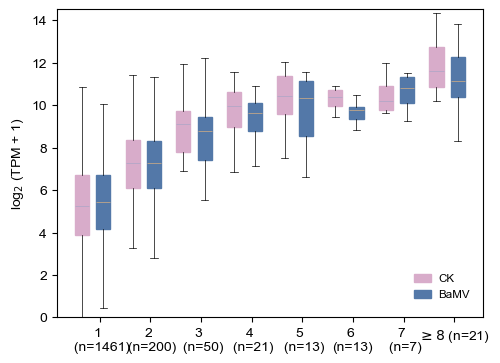

In [ ]:
fig,ax=plt.subplots(figsize=(5.5,4))
for sample in ['CK','BaMV']:
    for i in breakpoints_TPM_df.label.unique():
        locals()[sample+'_'+'label'+str(i)]=np.log2(breakpoints_TPM_df[(breakpoints_TPM_df['sample']==sample) & (breakpoints_TPM_df['label']==int(i))]['TPM']+1).dropna()
#colors = ["#ef87a2","#4e66ab",]
colors=["#d8acca","#5378a8"]
# colors_r = ["lightcoral", "lightcoral","dodgerblue","dodgerblue",  "mediumseagreen","mediumseagreen","orange","orange"]
#colors_r = ["#ef87a2","#ef87a2","#4e66ab","#4e66ab"]
colors_r=["#d8acca","#d8acca","#5378a8","#5378a8"]
colors_2 =  ["#aba6c6", "#d7af83"]
label_n={'1':'1 \n (n=1461)','2': '2 \n (n=200)','3': '3 \n (n=50)','4':'4 \n (n=21)','5':'5 \n (n=13)','6':'6 \n(n=13)','7': '7 \n (n=7)','8':r'$\geq 8$ (n=21)'}
labels=breakpoints_TPM_df.label.unique()
legend_labels=['CK','BaMV']
group_number=len(legend_labels)
x_loc = np.arange(len(labels))-0.3
total_width = 0.7
box_total_width = total_width * 0.8
interval_total_width = total_width * 0.2
box_width = box_total_width / group_number
###计算所有box的总间隔
if group_number == 1:
    interval_width = interval_total_width
else:
    interval_width = interval_total_width / (group_number - 1)
###计算在x轴起始坐标
if group_number % 2 == 0:
    x1_box = x_loc - (group_number / 2 - 1) * box_width/2 - box_width - (group_number / 2 - 1) * interval_width - interval_width / 2
    
    #x1_box = x_loc - (group_number / 2 - 1) * box_width/2 - (group_number / 2 - 1) * interval_width
else:
    #x轴的两个起始坐标
    x1_box = x_loc - ((group_number - 1)/2) * box_width - ((group_number - 1)/3) * interval_width
#计算每个box左坐标
x_list_box = [x1_box + box_width * i + interval_width * i for i in range(group_number)]

x_list_box_new = []

for i in range(len(legend_labels)):
    for j in range(len(labels)):
        x_list_box_new.append(x_list_box[i][j])
x_list_box_new = sorted(x_list_box_new)

x_list_box_final = []
for i in range(len(labels)):
    #x_list_box_final.append(x_list_box_new[3 * i:3 * (i + 1)])
    x_list_box_final.append(x_list_box_new[2 * i:2 * (i + 1)])

for i in labels:
    df_ck=eval('CK'+'_'+'label'+str(i))
    df_bamv=eval('BaMV'+'_'+'label'+str(i))
    print(x_list_box_final[int(i)-1])
    locals()['bplot'+str(i)]=plt.boxplot([df_ck,df_bamv],labels=legend_labels,patch_artist=True,positions=x_list_box_final[int(i)-1],widths=box_width,showfliers=False)
    bplot=eval('bplot'+str(i))
    for patch, color in zip(bplot["medians"], colors_2):
        patch.set_color(color)
        patch.set_linewidth(0.5)
    for patch, color in zip(bplot["boxes"], colors):
        patch.set_linewidth(1)
        patch.set_color(color)
    for patch, color in zip(bplot["whiskers"], colors_r):
        patch.set_linewidth(0.5)
    for patch, color in zip(bplot["caps"], colors_r):
        patch.set_linewidth(0.5)

ax.grid(True, ls=':', color='b', alpha=0.0)
ax.set_xticks(x_loc)
ax.set_ylim(0,14.5)
ax.set_xticklabels([label_n.get(str(label)) for label in labels])
ax.set_ylabel("log$_2$ (TPM + 1)")
# plt.show()
# ax = plt.gca()
# ax.spines['top'].set_color('none')
# ax.spines['right'].set_color('none')
# adjust_spines(ax, ['left', 'bottom'])
plt.legend(handles=bplot8['boxes'], loc='center left', bbox_to_anchor=(0.8, 0.1),
           facecolor='None', frameon=False, ncol=1, markerscale=2, borderaxespad=1,
           handletextpad=0.6, fontsize='small', labels=legend_labels,handlelength=1.5)

plt.savefig('/home/qq/work/lxr/DRS/fussion/plot/breakpoint_and_TPM_2.pdf', bbox_inches="tight",transparent=True)

In [ ]:
plot_df.to_csv('/home/qq/work/lxr/DRS/nanoSPA/NanoSPA-master/extra/project/DRS/result/07_virus/extract_sg/fussion_result/plotdat_breakpoint_and_TPM.csv',index=False)

In [ ]:
pro_abundance=pd.read_csv('/home/qq/work/lxr/DRS/fussion/plot/pro_abundance.csv',index_col=0)

In [ ]:
pro_abundance

,bamv_rep1(Normalized),bamv_rep2(Normalized),bamv_rep3(Normalized),ck_rep1(Normalized),ck_rep2(Normalized),ck_rep3(Normalized),log2fc,fc,ttest_pval1,Dla1_(FC_1.5_label),...,bamv_pro(Normalized),ck_pro(Normalized),bamv_rep1(Scaled),bamv_rep2(Scaled),bamv_rep3(Scaled),ck_rep1(Scaled),ck_rep2(Scaled),ck_rep3(Scaled),bamv_pro(Scaled),ck_pro(Scaled)
evm.model.ORIGINAL_5229.70,12752.6,14946.4,14953.8,16504.7,16780.8,18316.4,-0.274784,0.826574,0.032046,stable,...,14217.600000,17200.633333,81.2,95.1,95.2,105.1,106.8,116.6,90.500000,109.500000
evm.model.FRAGSCAFF_259.922,115937.1,119482.5,105951.4,114602.0,106162.9,123454.9,-0.011990,0.991724,0.889722,stable,...,113790.333333,114739.933333,101.5,104.6,92.7,100.3,92.9,108.0,99.600000,100.400000
evm.model.FRAGSCAFF_182.98,380597.3,349491.9,305504.8,460382.9,389667.2,385236.2,-0.254387,0.838343,0.111242,stable,...,345198.000000,411762.100000,100.6,92.3,80.7,121.6,103.0,101.8,91.200000,108.800000
evm.model.FRAGSCAFF_52.47,52244.8,52197.0,52523.4,79750.0,71292.8,70213.1,-0.495271,0.709428,0.002075,stable,...,52321.733333,73751.966667,82.9,82.8,83.3,126.5,113.1,111.4,83.000000,117.000000
evm.model.FRAGSCAFF_120.407,124512.6,140185.4,129203.1,111550.0,106139.2,119145.4,0.225793,1.169420,0.033559,stable,...,131300.366667,112278.200000,102.2,115.1,106.1,91.6,87.1,97.8,107.800000,92.166667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
evm.model.FRAGSCAFF_226.197,358.9,381.0,498.7,531.0,639.2,567.9,-0.488801,0.712617,0.036340,stable,...,412.866667,579.366667,72.3,76.8,100.5,107.0,128.8,114.5,83.200000,116.766667
evm.model.FRAGSCAFF_323.605,753.4,880.8,606.8,650.6,846.7,703.5,0.026115,1.018266,0.898337,stable,...,747.000000,733.600000,101.8,119.0,82.0,87.9,114.4,95.0,100.933333,99.100000
evm.model.FRAGSCAFF_154.219,287.2,348.9,286.7,211.4,201.2,224.5,0.534498,1.448438,0.011839,stable,...,307.600000,212.366667,110.5,134.2,110.3,81.3,77.4,86.3,118.333333,81.666667
evm.model.ORIGINAL_609.30_evm.model.ORIGINAL_609.31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,stable,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
breakpoints_TPM_df = breakpoints_TPM_df.set_index('gene',drop=False)

In [ ]:
pro_plot_df=breakpoints_TPM_df.merge(pro_abundance[['ck_pro(Normalized)','bamv_pro(Normalized)']],left_index=True,right_index=True).dropna()

In [ ]:
pro_plot_df

,gene,n_breakpoints,n_reads,variable,TPM,label,sample,ck_pro(Normalized),bamv_pro(Normalized)
gene,,,,,,,,,
evm.model.ORIGINAL_981.115,evm.model.ORIGINAL_981.115,1,1,BaMV_TPM,114.862678,1,BaMV,5725.666667,5235.633333
evm.model.FRAGSCAFF_63.29.1,evm.model.FRAGSCAFF_63.29.1,1,1,BaMV_TPM,184.810443,1,BaMV,674.966667,1170.366667
evm.model.FRAGSCAFF_62.134,evm.model.FRAGSCAFF_62.134,1,1,BaMV_TPM,138.286590,1,BaMV,5436.500000,7038.333333
evm.model.FRAGSCAFF_59.30,evm.model.FRAGSCAFF_59.30,1,1,BaMV_TPM,99.804484,1,BaMV,5442.066667,7342.600000
evm.model.FRAGSCAFF_59.16,evm.model.FRAGSCAFF_59.16,1,1,BaMV_TPM,60.323880,1,BaMV,16627.966667,20891.966667
...,...,...,...,...,...,...,...,...,...
evm.model.ORIGINAL_979.28,evm.model.ORIGINAL_979.28,14,14,CK_TPM,1183.650824,8,CK,45607.233333,46474.700000
evm.model.FRAGSCAFF_40.29,evm.model.FRAGSCAFF_40.29,18,18,CK_TPM,3117.396715,8,CK,3112.766667,2713.033333
evm.model.FRAGSCAFF_383.43,evm.model.FRAGSCAFF_383.43,20,22,CK_TPM,6703.944146,8,CK,173786.966667,134589.000000


In [ ]:
pro_plot_df.dropna()

,gene,n_breakpoints,n_reads,variable,pro
0,evm.model.FRAGSCAFF_1.45_evm.model.FRAGSCAFF_1.47,4,4,ck_pro(Normalized),26018.300000
1,evm.model.FRAGSCAFF_102.11,3,3,ck_pro(Normalized),17068.066667
2,evm.model.FRAGSCAFF_106.118,1,1,ck_pro(Normalized),2522.200000
3,evm.model.FRAGSCAFF_112.16,1,1,ck_pro(Normalized),12587.300000
4,evm.model.FRAGSCAFF_112.63,4,4,ck_pro(Normalized),2060.600000
...,...,...,...,...,...
1559,evm.model.ORIGINAL_979.208,1,1,bamv_pro(Normalized),4357.833333
1560,evm.model.ORIGINAL_979.28,14,14,bamv_pro(Normalized),46474.700000
1561,evm.model.ORIGINAL_979.343,2,2,bamv_pro(Normalized),17661.000000
1562,evm.model.ORIGINAL_979.52,1,1,bamv_pro(Normalized),19593.133333


In [ ]:
pro_plot_df=pro_plot_df.melt(value_vars=['ck_pro(Normalized)','bamv_pro(Normalized)'],id_vars=['gene', 'n_breakpoints', 'n_reads'],value_name='pro')

In [ ]:
pro_plot_df['sample']=['CK']* int(len(pro_plot_df)/2) + ['BaMV']* int(len(pro_plot_df)/2)

In [ ]:
pro_plot_df['label']=pro_plot_df['n_breakpoints'].apply(lambda x:x if x<8 else 8)

In [ ]:
pro_plot_df['n_breakpoints'].value_counts().sort_index()

n_breakpoints
1     1206
2      220
3       54
4       24
5       14
6       18
7        8
8        2
9        2
11       2
14       6
18       2
20       2
27       2
41       2
Name: count, dtype: int64

[-0.6499999999999999, -0.22999999999999995]
[0.35, 0.7699999999999999]
[1.3499999999999999, 1.7699999999999998]
[2.3500000000000005, 2.7700000000000005]
[3.3500000000000005, 3.7700000000000005]
[4.35, 4.77]
[5.35, 5.77]
[6.35, 6.77]


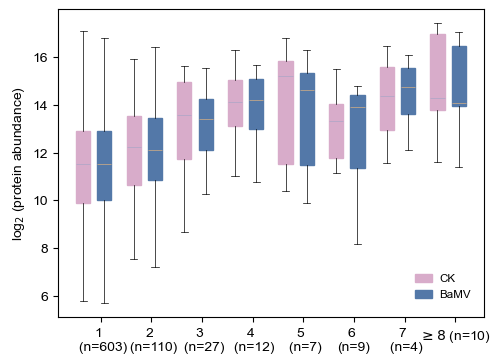

In [ ]:
fig,ax=plt.subplots(figsize=(5.5,4))
for sample in ['CK','BaMV']:
    for i in breakpoints_TPM_df.label.unique():
        locals()[sample+'_'+'label'+str(i)]=np.log2(pro_plot_df[(pro_plot_df['sample']==sample) & (pro_plot_df['label']==int(i))]['pro']).dropna()
#colors = ["#ef87a2","#4e66ab",]
colors=["#d8acca","#5378a8"]
# colors_r = ["lightcoral", "lightcoral","dodgerblue","dodgerblue",  "mediumseagreen","mediumseagreen","orange","orange"]
#colors_r = ["#ef87a2","#ef87a2","#4e66ab","#4e66ab"]
colors_r=["#d8acca","#d8acca","#5378a8","#5378a8"]
colors_2 =  ["#aba6c6", "#d7af83"]
#label_n={'1 \n (603 proteins)','2 \n (110 proteins)','3 \n (27 proteins)','4 \n (12 proteins)','5 \n (7 proteins)','6 \n (9 proteins)','7 \n (4 proteins)','>=8 \n (10 proteins)}
label_n={'1':'1 \n (n=603)','2': '2 \n (n=110)','3': '3 \n (n=27)','4':'4 \n (n=12)','5':'5 \n (n=7)','6':'6 \n(n=9)','7': '7 \n (n=4)','8':r'$\geq 8$ (n=10)'}
labels=breakpoints_TPM_df.label.unique()
legend_labels=['CK','BaMV']
group_number=len(legend_labels)
x_loc = np.arange(len(labels))-0.3
total_width = 0.7
box_total_width = total_width * 0.8
interval_total_width = total_width * 0.2
box_width = box_total_width / group_number
###计算所有box的总间隔
if group_number == 1:
    interval_width = interval_total_width
else:
    interval_width = interval_total_width / (group_number - 1)
###计算在x轴起始坐标
if group_number % 2 == 0:
    x1_box = x_loc - (group_number / 2 - 1) * box_width/2 - box_width - (group_number / 2 - 1) * interval_width - interval_width / 2
    
    #x1_box = x_loc - (group_number / 2 - 1) * box_width/2 - (group_number / 2 - 1) * interval_width
else:
    #x轴的两个起始坐标
    x1_box = x_loc - ((group_number - 1)/2) * box_width - ((group_number - 1)/3) * interval_width
#计算每个box左坐标
x_list_box = [x1_box + box_width * i + interval_width * i for i in range(group_number)]

x_list_box_new = []

for i in range(len(legend_labels)):
    for j in range(len(labels)):
        x_list_box_new.append(x_list_box[i][j])
x_list_box_new = sorted(x_list_box_new)

x_list_box_final = []
for i in range(len(labels)):
    #x_list_box_final.append(x_list_box_new[3 * i:3 * (i + 1)])
    x_list_box_final.append(x_list_box_new[2 * i:2 * (i + 1)])

for i in labels:
    df_ck=eval('CK'+'_'+'label'+str(i))
    df_bamv=eval('BaMV'+'_'+'label'+str(i))
    print(x_list_box_final[int(i)-1])
    locals()['bplot'+str(i)]=plt.boxplot([df_ck,df_bamv],labels=legend_labels,patch_artist=True,positions=x_list_box_final[int(i)-1],widths=box_width,showfliers=False)
    bplot=eval('bplot'+str(i))
    for patch, color in zip(bplot["medians"], colors_2):
        patch.set_color(color)
        patch.set_linewidth(0.5)
    for patch, color in zip(bplot["boxes"], colors):
        patch.set_linewidth(1)
        patch.set_color(color)
    for patch, color in zip(bplot["whiskers"], colors_r):
        patch.set_linewidth(0.5)
    for patch, color in zip(bplot["caps"], colors_r):
        patch.set_linewidth(0.5)

ax.grid(True, ls=':', color='b', alpha=0.0)
ax.set_xticks(x_loc)
# ax.set_ylim(0,14.5)
ax.set_xticklabels([label_n.get(str(label)) for label in labels])
ax.set_ylabel("log$_2$ (protein abundance)")
# plt.show()
# ax = plt.gca()
# ax.spines['top'].set_color('none')
# ax.spines['right'].set_color('none')
# adjust_spines(ax, ['left', 'bottom'])
plt.legend(handles=bplot8['boxes'], loc='center left', bbox_to_anchor=(0.8, 0.1),
           facecolor='None', frameon=False, ncol=1, markerscale=2, borderaxespad=1,
           handletextpad=0.6, fontsize='small', labels=legend_labels,handlelength=1.5)

plt.savefig('/home/qq/work/lxr/DRS/fussion/plot/breakpoint_and_PRO.pdf', bbox_inches="tight",transparent=True)

# Part2 Dla

## 01 Full length ratio

In [102]:
def read_bam(bam_p):
    reads = pysam.AlignmentFile(bam_p, "rb")
    data = defaultdict(dict)
    for read in reads:
        data[read.qname]["chrom"] = read.reference_name
        #data[read.qname]["CIGAR"] = read.cigarstring
        data[read.qname]["alen"] = read.alen
        data[read.qname]["quality"] = read.mapping_quality
        if read.is_reverse:
            data[read.qname]["strand"] = "-"
        else:
            data[read.qname]["strand"] = "+"
        data[read.qname]["ref_st"] = read.reference_start + 1
        #data[read.qname]["ref_st"] = read.reference_start + 1 

        #data[read.qname]["ref_ed"] = read.reference_end
        data[read.qname]["ref_ed"] = read.reference_end + 1
    reads.close()
    return data


def get_gene_len(gff_fp):
    gff_data = defaultdict(dict)
    data = {}
    with open(gff_fp, 'r') as f:
        for line in f:
            info = line.rstrip().split('\t')
            chrome, org, ty, st, ed, point, strand, o = info[:-1]
            if info[2] in ["gene", "pseudogene", "transposable_element_gene"]:
                gene = re.findall("ID=(.*?);", info[-1])[0]
                gff_data[gene] = [int(st), int(ed)]
            else:
                pass
            if info[2] == "exon":
                gene = re.findall("Parent=(.*?)", info[-1])[0]
                data.setdefault(gene, 0)
                cd = int(info[4]) - int(info[3]) + 1
                data[gene] += cd
    return gff_data, data


def get_gene_strand(gff_fp):
    gff_data = defaultdict(dict)
    gff_chr = defaultdict(dict)
    with open(gff_fp, 'r') as f:
        for line in f:
            info = line.rstrip().split('\t')
            chrome, org, ty, st, ed, point, strand, o = info[:-1]
            if info[2] in ["gene", "pseudogenic_transcript", "transposable_element_gene"]:
                gene = re.findall("ID=(.*?);", info[-1])[0]
                gff_data[gene] = strand
                gff_chr[gene] = chrome
            else:
                pass
    return gff_data, gff_chr

In [103]:
gff_fp = "/home/qq/work/lxr/DRS/gene_inf/ma_coding_gene.gff3"
# gff_fp="F:\\project\\DRS\\gene_info\\ma_coding_gene.gff3"
gff_len, exon_len = get_gene_len(gff_fp)
gff_strand, gff_chr = get_gene_strand(gff_fp)

In [104]:
sample_n={'ck':'CK','bamv':'BaMV'}
df = pd.DataFrame()
for sample in ["ck","bamv"]:
    fp = f"/home/qq/work/lxr/DRS/run_DRS_{sample}/04_minimap_genome/{sample}_genome_correct_2308.sorted.bam"
    bam = read_bam(fp)
    bam_turn = pd.DataFrame.from_dict(bam, orient='index')
    bam_turn["sample"] = sample_n[sample]
    df = pd.concat([df, bam_turn])
    print(sample, "Finish")

[W::hts_idx_load3] The index file is older than the data file: /home/qq/work/lxr/DRS/run_DRS_ck/04_minimap_genome/ck_genome_correct_2308.sorted.bam.bai


ck Finish
bamv Finish


In [105]:
p = pd.DataFrame()
for sample in ["ck","bamv"]:
    fp = f"/home/qq/work/lxr/DRS/run_DRS_{sample}/05_polya_tail/{sample}_polya_results_pass.tsv"
    poly = pd.read_csv(fp, sep="\t", usecols=["readname", "polya_length", "qc_tag"], index_col=0)
    p = pd.concat([p, poly])
    print(sample, "poly(A) tail Finish")
df = pd.concat([df, p], axis=1, join="outer")
df = df[df["chrom"].notna()]

ck poly(A) tail Finish
bamv poly(A) tail Finish


In [106]:
assign = pd.DataFrame()
for sample in ["ck","bamv"]:
    fp = f"/home/qq/work/lxr/DRS/run_DRS_{sample}/06_featureCounts_new/{sample}_genome_correct_2308.sorted.bam.featureCounts"
    f = pd.read_csv(fp, sep="\t", index_col=0, header=None, usecols=[0,3], names=["read_name", "Assigned_gene"])
    assign = pd.concat([assign, f])
    print(sample, "FeatureCount Assigned Gene Finish")
df = pd.concat([df, assign], axis=1, join="outer")

ck FeatureCount Assigned Gene Finish
bamv FeatureCount Assigned Gene Finish


In [107]:
assign

,Assigned_gene
read_name,
70fcefa7-e354-4c5b-a1c6-7df0e935c301,evm.TU.FRAGSCAFF_24.8
cf5933ae-0f1e-4acb-a7d9-655999ae2933,evm.TU.FRAGSCAFF_24.8
a8c7a7b3-009b-4558-9f89-6640945eb112,evm.TU.FRAGSCAFF_24.8
067622d6-42eb-4eb1-9d77-478cd4dd43dc,evm.TU.FRAGSCAFF_24.8
a7b07835-ebba-435d-9d7a-f152237cd817,evm.TU.FRAGSCAFF_24.8
...,...
7d24549e-9d26-4fe8-b27c-d872937a7371,evm.TU.FRAGSCAFF_341.6
5038b4ca-7b8f-4a7d-9ce8-c49837a8234f,evm.TU.FRAGSCAFF_341.6
5d869a9f-055c-4842-9f59-1ae41c8532d7,evm.TU.FRAGSCAFF_341.6


In [53]:
df

,chrom,alen,quality,strand,ref_st,ref_ed,sample,polya_length,qc_tag,Assigned_gene,polya_length,qc_tag,Assigned_gene,Assigned_gene
70fcefa7-e354-4c5b-a1c6-7df0e935c301,chr4.1,3962,60,+,73193,77155,CK,NaN,NaN,evm.TU.FRAGSCAFF_24.8,NaN,NaN,evm.TU.FRAGSCAFF_24.8,evm.TU.FRAGSCAFF_24.8
cf5933ae-0f1e-4acb-a7d9-655999ae2933,chr4.1,3897,60,+,73240,77137,CK,92.70,PASS,evm.TU.FRAGSCAFF_24.8,92.70,PASS,evm.TU.FRAGSCAFF_24.8,evm.TU.FRAGSCAFF_24.8
a8c7a7b3-009b-4558-9f89-6640945eb112,chr4.1,3845,60,+,73259,77104,CK,68.08,PASS,evm.TU.FRAGSCAFF_24.8,68.08,PASS,evm.TU.FRAGSCAFF_24.8,evm.TU.FRAGSCAFF_24.8
067622d6-42eb-4eb1-9d77-478cd4dd43dc,chr4.1,3867,60,+,73263,77130,CK,46.70,PASS,evm.TU.FRAGSCAFF_24.8,46.70,PASS,evm.TU.FRAGSCAFF_24.8,evm.TU.FRAGSCAFF_24.8
a7b07835-ebba-435d-9d7a-f152237cd817,chr4.1,3988,60,+,73264,77252,CK,52.14,PASS,evm.TU.FRAGSCAFF_24.8,52.14,PASS,evm.TU.FRAGSCAFF_24.8,evm.TU.FRAGSCAFF_24.8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7d24549e-9d26-4fe8-b27c-d872937a7371,chr31.1,507,60,-,28307015,28307522,BaMV,51.21,PASS,evm.TU.FRAGSCAFF_341.6,51.21,PASS,evm.TU.FRAGSCAFF_341.6,evm.TU.FRAGSCAFF_341.6
5038b4ca-7b8f-4a7d-9ce8-c49837a8234f,chr31.1,335,60,-,28307031,28307366,BaMV,NaN,NaN,evm.TU.FRAGSCAFF_341.6,NaN,NaN,evm.TU.FRAGSCAFF_341.6,evm.TU.FRAGSCAFF_341.6
5d869a9f-055c-4842-9f59-1ae41c8532d7,chr31.1,1294,60,-,28307044,28308338,BaMV,121.28,PASS,evm.TU.FRAGSCAFF_341.6,121.28,PASS,evm.TU.FRAGSCAFF_341.6,evm.TU.FRAGSCAFF_341.6
2403219f-a619-41df-a751-958651a6cb3a,chr31.1,707,60,-,28307064,28307771,BaMV,NaN,NaN,evm.TU.FRAGSCAFF_341.6,NaN,NaN,evm.TU.FRAGSCAFF_341.6,evm.TU.FRAGSCAFF_341.6


NAT

In [108]:
for label, reads in df.groupby("Assigned_gene"):    
    if label:
        df.loc[reads.index, "NAT"] = reads.apply(lambda x:False if x["strand"] == gff_strand[x["Assigned_gene"]] else True, axis=1)

In [109]:
assign = df[df["NAT"] == False] #NAT: Native anti-transcript
assign[["alen", "ref_st", "ref_ed", "quality"]] = assign[["alen", "ref_st", "ref_ed", "quality"]].astype(int)

/tmp/ipykernel_2054639/498086218.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  assign[["alen", "ref_st", "ref_ed", "quality"]] = assign[["alen", "ref_st", "ref_ed", "quality"]].astype(int)


In [87]:
assign

,chrom,alen,quality,strand,ref_st,ref_ed,sample,polya_length,qc_tag,Assigned_gene,NAT
70fcefa7-e354-4c5b-a1c6-7df0e935c301,chr4.1,3962,60,+,73193,77156,CK,NaN,NaN,evm.TU.FRAGSCAFF_24.8,False
cf5933ae-0f1e-4acb-a7d9-655999ae2933,chr4.1,3897,60,+,73240,77138,CK,92.70,PASS,evm.TU.FRAGSCAFF_24.8,False
a8c7a7b3-009b-4558-9f89-6640945eb112,chr4.1,3845,60,+,73259,77105,CK,68.08,PASS,evm.TU.FRAGSCAFF_24.8,False
067622d6-42eb-4eb1-9d77-478cd4dd43dc,chr4.1,3867,60,+,73263,77131,CK,46.70,PASS,evm.TU.FRAGSCAFF_24.8,False
a7b07835-ebba-435d-9d7a-f152237cd817,chr4.1,3988,60,+,73264,77253,CK,52.14,PASS,evm.TU.FRAGSCAFF_24.8,False
...,...,...,...,...,...,...,...,...,...,...,...
7d24549e-9d26-4fe8-b27c-d872937a7371,chr31.1,507,60,-,28307015,28307523,BaMV,51.21,PASS,evm.TU.FRAGSCAFF_341.6,False
5038b4ca-7b8f-4a7d-9ce8-c49837a8234f,chr31.1,335,60,-,28307031,28307367,BaMV,NaN,NaN,evm.TU.FRAGSCAFF_341.6,False
5d869a9f-055c-4842-9f59-1ae41c8532d7,chr31.1,1294,60,-,28307044,28308339,BaMV,121.28,PASS,evm.TU.FRAGSCAFF_341.6,False
2403219f-a619-41df-a751-958651a6cb3a,chr31.1,707,60,-,28307064,28307772,BaMV,NaN,NaN,evm.TU.FRAGSCAFF_341.6,False


full length

In [110]:
def get_cds(gff_fp):
    data = {}
    with open(gff_fp, 'r') as f:
        for line in f:
            info = line.rstrip().split('\t')
            chrome, org, ty, st, ed, point, strand, o, des = info
            if info[2] == "CDS":
                gene = mRNA_gene_ID[re.findall('cds\.(.*)',des.split(";")[0])[0]]
                data.setdefault(gene,[]).append([int(st), int(ed)])
    return data


def mark_full(x,phar,num=20):
    ''' 
    ref_st : the position in read to the translation start site
    '''
    gene = x["Assigned_gene"]
    phar.update(1)
    if gff_strand[gene] == "+":
        pos = x["ref_st"] - cds_start[gene]
        if  pos <= num:
            return True
        else:
            return False
    else:
        pos = x["ref_ed"] - cds_start[gene]
        if pos >= -num:
            return True
        else:
            return False


def calculate_read_percent(x, phar):
    st, ed = gff_len[x["Assigned_gene"]]
    phar.update(1)
    per = x["alen"] / abs(st -ed + 1)
    return round(per, 4)


    
gff_cds = get_cds(gff_fp)
#####
##### mark the start point of translation
##### 
cds_start = {}
for gene, values in gff_cds.items():
    strand = gff_strand[gene]
    if strand == "+":
        cds_start[gene] = gff_cds[gene][0][0]
    else:
        cds_start[gene] = gff_cds[gene][0][1]

In [111]:
phar = tqdm(total=len(assign))
assign.loc[assign.index, "Full_length"] = assign.apply(mark_full, args=(phar,), axis=1)
phar.close()

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 1359342/1361118 [00:19<00:00, 73003.20it/s]/tmp/ipykernel_2054639/2625618050.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  assign.loc[assign.index, "Full_length"] = assign.apply(mark_full, args=(phar,), axis=1)
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1361118/1361118 [00:20<00:00, 66781.35it/s]


In [28]:
assign

,chrom,alen,quality,strand,ref_st,ref_ed,sample,polya_length,qc_tag,Assigned_gene,NAT,Full_length,Read_percent
70fcefa7-e354-4c5b-a1c6-7df0e935c301,chr4.1,3962,60,+,73194,77155,CK,NaN,NaN,evm.TU.FRAGSCAFF_24.8,False,True,0.8362
cf5933ae-0f1e-4acb-a7d9-655999ae2933,chr4.1,3897,60,+,73241,77137,CK,92.70,PASS,evm.TU.FRAGSCAFF_24.8,False,True,0.8225
a8c7a7b3-009b-4558-9f89-6640945eb112,chr4.1,3845,60,+,73260,77104,CK,68.08,PASS,evm.TU.FRAGSCAFF_24.8,False,True,0.8115
067622d6-42eb-4eb1-9d77-478cd4dd43dc,chr4.1,3867,60,+,73264,77130,CK,46.70,PASS,evm.TU.FRAGSCAFF_24.8,False,True,0.8162
a7b07835-ebba-435d-9d7a-f152237cd817,chr4.1,3988,60,+,73265,77252,CK,52.14,PASS,evm.TU.FRAGSCAFF_24.8,False,True,0.8417
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7d24549e-9d26-4fe8-b27c-d872937a7371,chr31.1,507,60,-,28307016,28307522,BaMV,51.21,PASS,evm.TU.FRAGSCAFF_341.6,False,False,0.0986
5038b4ca-7b8f-4a7d-9ce8-c49837a8234f,chr31.1,335,60,-,28307032,28307366,BaMV,NaN,NaN,evm.TU.FRAGSCAFF_341.6,False,False,0.0651
5d869a9f-055c-4842-9f59-1ae41c8532d7,chr31.1,1294,60,-,28307045,28308338,BaMV,121.28,PASS,evm.TU.FRAGSCAFF_341.6,False,False,0.2516
2403219f-a619-41df-a751-958651a6cb3a,chr31.1,707,60,-,28307065,28307771,BaMV,NaN,NaN,evm.TU.FRAGSCAFF_341.6,False,False,0.1375


In [112]:
phar = tqdm(total=len(assign))
assign.loc[assign.index, "Read_percent"] = assign.apply(calculate_read_percent, args=(phar,), axis=1)
phar.close()

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 1359709/1361118 [00:22<00:00, 60693.62it/s]/tmp/ipykernel_2054639/1919486291.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  assign.loc[assign.index, "Read_percent"] = assign.apply(calculate_read_percent, args=(phar,), axis=1)
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1361118/1361118 [00:23<00:00, 57435.44it/s]


In [23]:
assign

,chrom,alen,quality,strand,ref_st,ref_ed,sample,polya_length,qc_tag,Assigned_gene,NAT
70fcefa7-e354-4c5b-a1c6-7df0e935c301,chr4.1,3962,60,+,73194,77155,CK,NaN,NaN,evm.TU.FRAGSCAFF_24.8,False
cf5933ae-0f1e-4acb-a7d9-655999ae2933,chr4.1,3897,60,+,73241,77137,CK,92.70,PASS,evm.TU.FRAGSCAFF_24.8,False
a8c7a7b3-009b-4558-9f89-6640945eb112,chr4.1,3845,60,+,73260,77104,CK,68.08,PASS,evm.TU.FRAGSCAFF_24.8,False
067622d6-42eb-4eb1-9d77-478cd4dd43dc,chr4.1,3867,60,+,73264,77130,CK,46.70,PASS,evm.TU.FRAGSCAFF_24.8,False
a7b07835-ebba-435d-9d7a-f152237cd817,chr4.1,3988,60,+,73265,77252,CK,52.14,PASS,evm.TU.FRAGSCAFF_24.8,False
...,...,...,...,...,...,...,...,...,...,...,...
7d24549e-9d26-4fe8-b27c-d872937a7371,chr31.1,507,60,-,28307016,28307522,BaMV,51.21,PASS,evm.TU.FRAGSCAFF_341.6,False
5038b4ca-7b8f-4a7d-9ce8-c49837a8234f,chr31.1,335,60,-,28307032,28307366,BaMV,NaN,NaN,evm.TU.FRAGSCAFF_341.6,False
5d869a9f-055c-4842-9f59-1ae41c8532d7,chr31.1,1294,60,-,28307045,28308338,BaMV,121.28,PASS,evm.TU.FRAGSCAFF_341.6,False
2403219f-a619-41df-a751-958651a6cb3a,chr31.1,707,60,-,28307065,28307771,BaMV,NaN,NaN,evm.TU.FRAGSCAFF_341.6,False


In [ ]:
# assign.to_csv('/home/qq/work/lxr/DRS/APA_2_result/assign.csv',index=True)

In [ ]:
# assign = pd.read_csv('/home/qq/work/lxr/DRS/APA_2_result/assign.csv',index_col=0)
# assign = pd.read_csv('/home/qq/work/lxr/DRS/script_plot/bamv/assign.csv',index_col=0)

In [113]:
transcriptome_rpm, drs_read = {}, {}
full_df = {}
for sample, data in assign.groupby("sample"):
    drs_read[sample] = len(data)
    transcriptome_rpm[sample], full_df[sample] = {}, defaultdict(dict)
    for gene, genes in data.groupby("Assigned_gene"):
        transcriptome_rpm[sample][gene] = len(genes)
        for tag, reads in genes.groupby("Full_length"):
            full_df[sample][gene][tag] = len(reads)

In [30]:
full_df

{'BaMV': defaultdict(dict,
             {'evm.TU.FRAGSCAFF_1.28': {False: 5},
              'evm.TU.FRAGSCAFF_1.32': {False: 1},
              'evm.TU.FRAGSCAFF_1.33': {False: 9},
              'evm.TU.FRAGSCAFF_1.37': {False: 1},
              'evm.TU.FRAGSCAFF_1.40': {False: 3, True: 1},
              'evm.TU.FRAGSCAFF_1.43': {False: 1},
              'evm.TU.FRAGSCAFF_1.45_evm.TU.FRAGSCAFF_1.47': {False: 172,
               True: 131},
              'evm.TU.FRAGSCAFF_1.68': {False: 4},
              'evm.TU.FRAGSCAFF_1.71': {False: 9},
              'evm.TU.FRAGSCAFF_1.73': {False: 1},
              'evm.TU.FRAGSCAFF_1.9': {False: 7},
              'evm.TU.FRAGSCAFF_102.11': {False: 974, True: 91},
              'evm.TU.FRAGSCAFF_102.13': {False: 46, True: 1},
              'evm.TU.FRAGSCAFF_102.14': {False: 1},
              'evm.TU.FRAGSCAFF_102.15': {False: 2},
              'evm.TU.FRAGSCAFF_102.18': {False: 47},
              'evm.TU.FRAGSCAFF_102.2': {False: 1},
              

### 1. Full length reads coverage

In [7]:
anno_cds_level_groups = anno_cds_level.groupby(["gene_name", "label_group"])
# re-scale the widths of the 5'UTR and 3'UTR relative to the CDS (which is set constant to a width of 1 unit)
# 1.calculate a simple scale factor (SF)
utr5p_sf = (
    anno_gene_level.total_utr5p_length.dropna().median()
    / anno_gene_level.total_cds_length.dropna().median()
)
utr3p_sf = (
    anno_gene_level.total_utr3p_length.dropna().median()
    / anno_gene_level.total_cds_length.dropna().median()
)
# 2.The SF for the 5'UTR is 0.18 and for the 3'UTR is 0.34. Next, the following code rescales these relatively position accordingly
# re_bm_ratio_df = get_rel_pos_and_rescale(
#     bm_ratio_df, anno_gene_level, anno_cds_level_groups
# )
# re_ck_ratio_df = get_rel_pos_and_rescale(
#     ck_ratio_df, anno_gene_level, anno_cds_level_groups
# )

In [9]:
assign=pd.read_csv(fp+'bamv/assign.csv',index_col=0)
assign['gene_name']=assign['Assigned_gene'].apply(get_transcript)

In [19]:
anno_gene_level=anno_gene_level.fillna(0)
anno_gene_level['total_length']=anno_gene_level['total_cds_length']+anno_gene_level['total_utr5p_length']+anno_gene_level['total_utr3p_length']

In [20]:
read_pos={}
sample_dict={'ck':'CK','bamv':'BaMV'}
full_dict={True:'full',False:'nonfull'}
for sample in ['ck','bamv']:
    read_pos[sample_dict.get(sample)]={}
    fp='/home/qq/work/lxr/DRS/run_DRS_'+sample+'/04_minimap_transcriptome/'
    # 打开输入和输出的 BAM 文件
    input_bam = pysam.AlignmentFile(fp+sample+'_transcriptome_correct.sorted.bam', "rb")  # 以读取模式打开
    for j in [True,False]:
        read_pos[sample_dict.get(sample)][full_dict.get(j)]={}
        output_bam = pysam.AlignmentFile(fp+sample+'_'+full_dict.get(j)+'_transcriptome_correct.sorted.bam', "wb", header=input_bam.header)  # 以写入模式打开，保持原始头部信息
        reads_set=set(assign[(assign['Full_length']==j) & (assign['sample']==sample_dict.get(sample)) & (assign['NAT']!=True)].index)
        # 遍历 BAM 文件中的每条读段
        for read in input_bam.fetch():
            # 判断读段的相关信息
            # 例如：过滤掉低质量的读段（映射质量小于20）
            if read.query_name in reads_set:
                assign_gene=assign.loc[read.query_name]['gene_name']
                if read.reference_name==assign_gene: #同一个读段比对到转录本或基因的结果可能不同
                    if read.is_reverse:
                        strand = '-'
                    else:
                        strand = '+'
                # 如果符合条件，写入输出文件
                    output_bam.write(read)
                    read_pos[sample_dict.get(sample)][full_dict.get(j)][read.query_name]={'ref_name': read.reference_name,'ref_st':read.reference_start,'ref_ed':read.reference_end,'strand':strand}

# 关闭文件
input_bam.close()
output_bam.close()


In [24]:
def get_rel_axis(pos,label,strand,ref_strand,anno_part):
    rel_distance=float()
    rel_axis=float()
    if strand == '+':
    #if strand == ref_strand: ##读段的方向和转录本法相相同
        if label=='utr5p':
            rel_distance=pos / anno_part['total_utr5p_length'] #计算相对距离
            rel_axis=rel_distance*utr5p_sf #计算在坐标系上的位置
        elif label == 'cds':
            rel_distance=(pos - anno_part['total_utr5p_length']) / anno_part['total_cds_length']
            rel_axis=rel_distance+utr5p_sf
        elif label == 'utr3p':
            rel_distance=(pos - anno_part['total_utr5p_length']-anno_part['total_cds_length']) / anno_part['total_utr3p_length']
            rel_axis = rel_distance*utr3p_sf + utr5p_sf +1 
    elif strand == '-':
    #elif strand != ref_strand:
        if label=='utr5p':
            rel_distance= (anno_part['total_length']-pos) / anno_part['total_utr5p_length']
            rel_axis=rel_distance*utr5p_sf
        elif label == 'cds':
            rel_distance=(anno_part['total_length']- pos - anno_part['total_utr5p_length']) / anno_part['total_cds_length']
            rel_axis=rel_distance+utr5p_sf
        elif label == 'utr3p':
            rel_distance=( anno_part['total_utr3p_length'] - pos) / anno_part['total_utr3p_length']
            rel_axis = rel_distance*utr3p_sf + utr5p_sf +1 
    return rel_distance,rel_axis

In [25]:
def get_positive_label(pos,utr3p_len,utr5p_len,cds_len,strand,ref_strand):
    if strand == ref_strand:
        if strand == '+':
            TSS_pos=utr5p_len
            TTS_pos=utr5p_len+cds_len
            if TSS_pos <= pos <= TTS_pos:
                return 'cds'
            elif pos<TSS_pos: #utr3p和utr5p为0时在TSS和TTS位点上起始和终止的读段标记为cds
                return 'utr5p'
            elif pos > TTS_pos:
                return 'utr3p'   
            else:
                return np.NAN
        elif strand == '-':
            TTS_pos=utr3p_len
            TSS_pos=utr3p_len+cds_len
            if TTS_pos <= pos <= TSS_pos:
                return 'cds'
            elif  pos < TTS_pos:#utr3p和utr5p为0时在TSS和TTS位点上起始和终止的读段标记为cds
                return 'utr3p'
            elif pos > TSS_pos:
                return 'utr5p'   
            else:
                return np.NAN
    elif strand != ref_strand: #考虑基因的方向性和读段的方向性
        if strand == '+':
            TSS_pos=utr5p_len
            TTS_pos=utr5p_len+cds_len
            if TSS_pos <= pos <= TTS_pos:
                return 'cds'
            elif pos < TSS_pos:
                return 'utr5p'

            elif pos > TTS_pos:
                return 'utr3p'  
            else:
                return np.NAN 
        elif strand == '-':
            TTS_pos=utr3p_len
            TSS_pos=utr3p_len+cds_len
            if TTS_pos <= pos <= TSS_pos:
                return 'cds'
            elif pos < TTS_pos:
                return 'utr3p'

            elif pos > TSS_pos:
                return 'utr5p'  
            else:
                return np.NAN 

In [22]:
for sample,part in read_pos.items():
    for ty,use_reads in part.items():
        for read,value in use_reads.items():
            gene_name=value['ref_name']
            ref_st=value['ref_st']
            ref_ed=value['ref_ed']
            strand=value['strand']
            anno_part=anno_gene_level.loc[gene_name]
            ref_strand=anno_part['strand']
            # if strand == '+':
            #     TSS_pos=anno_part['total_utr5p_length']
            #     TTS_pos= TSS_pos+ anno_part['total_cds_length']
            # elif strand =='-':
            #     TTS_pos=anno_part['total_utr3p_length']
            #     TSS_pos = TTS_pos+ anno_part['total_cds_length']
            # st_label=reads_info[read]['st_label']
            # ed_label=reads_info[read]['ed_label']
            utr5p_len=anno_part['total_utr5p_length']
            utr3p_len=anno_part['total_utr3p_length']
            cds_len=anno_part['total_cds_length']
            st_label=get_positive_label(ref_st,utr3p_len,utr5p_len,cds_len,strand,ref_strand)
            ed_label=get_positive_label(ref_ed,utr3p_len,utr5p_len,cds_len,strand,ref_strand)
            read_pos[sample][ty][read]['st_label']=st_label
            read_pos[sample][ty][read]['ed_label']=ed_label
            st_relaxis=get_rel_axis(ref_st,st_label,strand,ref_strand,anno_part)#pos,label,strand,anno_part
            ed_relaxis=get_rel_axis(ref_ed,ed_label,strand,ref_strand,anno_part)#pos,label,strand,anno_part
            read_pos[sample][ty][read]['st_relaxis']=st_relaxis
            read_pos[sample][ty][read]['ed_relaxis']=ed_relaxis

In [26]:
transcript_len=int(utr5p_sf+1+utr3p_sf)+1
##创建一个数组来储存覆盖度
rel_pos_cov={}

for ty in ['full','nonfull']:
    #rel_pos_cov[sample][ty]=np.zeros(transcript_len)
    # 设定我们用0.01的步长来进行覆盖度的计算
    step_size = 0.01
    num_positions = int(transcript_len / step_size)  # 将转录本分成150个小区间
    if ty == 'full':
        cov=np.zeros(num_positions)
    # 创建一个数组来记录每个位置的覆盖数据（存储的是读段的起始和终止位置）
    #coverage = [[] for _ in range(num_positions)]
        for sample in ['CK','BaMV']:
            for reads,info in read_pos[sample][ty].items():
                p1,p2=info['st_relaxis'][1],info['ed_relaxis'][1]
                st,ed=int(min(p1,p2)/step_size),int(max(p1,p2)/step_size)
                cov[st:ed] +=1
            rel_pos_cov[ty]=cov
    elif ty == 'nonfull':
        for sample in ['CK','BaMV']:
            cov2=np.zeros(num_positions)
            #rel_pos_cov[sample]={}
            for reads,info in read_pos[sample][ty].items():
                p1,p2=info['st_relaxis'][1],info['ed_relaxis'][1]
                st,ed=int(min(p1,p2)/step_size),int(max(p1,p2)/step_size)
                cov2[st:ed] +=1
            rel_pos_cov[sample+'nonfull']=cov2

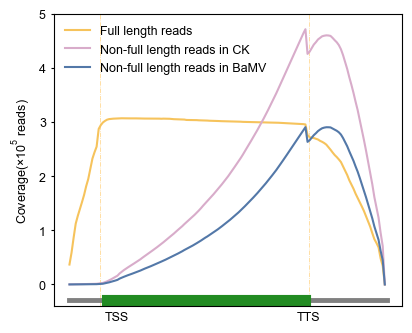

In [28]:
f, ax = plt.subplots(figsize=(4.5, 3.8))
# f, ax = plt.subplots(1,1,figsize=(10, 6))
#sns.set_style('ticks')
tss = utr5p_sf
tts = utr5p_sf + 1
end = utr5p_sf + utr3p_sf + 1


scale_ls_x = np.linspace(0, 1.6, 8)
index_ls_x = ["","TSS","","","","TTS","",""]
plt.xticks(scale_ls_x, index_ls_x,fontsize=9)
# ax.set_ylim(-0.15,2.4)
ax.vlines(x=tss, ymax=8, ymin=-0.4, linestyle='-.',linewidth =0.5,colors='orange',alpha=.5)
ax.vlines(x=tts, ymax=8, ymin=-0.4, linestyle='-.',linewidth =0.5,colors='orange',alpha=.5)

# ax.plot([tss, tss], [0, 8.5], linestyle='--', lw=0.5, color="pink")
# ax.plot([tts, tts], [0, 8.5], linestyle='--', lw=0.5, color="pink")
ax.plot([0, end], [-0.28, -0.28], lw=3.5, color="grey")
ax.plot([tss+0.03, tts-0.02], [-0.29, -0.29], lw=8, color="forestgreen")
datas=['full','nonfull']
colors=["#f6c35c",'#d8acca','#5378a8']#["#f6c35c",'#6bbccf']#['#6bbccf','#f6aa5c']
labels=['Full length reads','Non-full length reads in CK','Non-full length reads in BaMV']
for ty,color,label in zip(rel_pos_cov.keys(),colors,labels):
    ax.plot(np.arange(0, 1.52, step_size), rel_pos_cov[ty][0:152]/100000,label=label,c=color)

    ax.legend(
    loc="upper left",
    fontsize=9,
    frameon=False,
    mode=None,
    ncol=1,
    #bbox_to_anchor=(0.1, 0.65, 0.8, 0.8),
)
ax=plt.gca()
ax.xaxis.set_tick_params(size=0)
ax.yaxis.set_tick_params(length=2)
# ax.grid(False)
# ax.spines['bottom'].set_linewidth(0)
# ax.spines['left'].set_linewidth(1)
# ax.spines['right'].set_linewidth(0)
# ax.spines['top'].set_linewidth(0)

ax.set_ylim(-0.4,5)
ax.set_ylabel("Coverage(×$\mathregular{10^5}$ reads)", fontsize=9)
ax.set_xlabel('')
ax.set_yticks(np.arange(0,6))
ax.set_yticklabels(np.arange(0,6),size=9)
# ax.set_title('Coverage of full-length and nonfull-length reads along mRNA',fontsize=10)
plt.savefig('/home/qq/work/lxr/DRS/script_plot/bamv/full length/'+'full_nonfull_length_coverage_2.pdf',bbox_inches='tight',transparent=True,dpi=600)

In [14]:
full_fp='/home/qq/work/lxr/DRS/script_plot/bamv/full length/'

full length ratio in sample

In [114]:
result = {}
for sample, samples in assign.groupby("sample"):
    print(sample)
    for tag, reads in samples.groupby("Full_length"):
        if tag:
            print(len(reads) / len(samples))
            result[sample] = len(reads) / len(samples)


BaMV
0.2220991706451218
CK
0.23802519855612894


In [115]:
d=pd.DataFrame(data={'ratio':[23.78,22.18],'sample':['CK','BaMV']})

(array([ 0.,  5., 10., 15., 20., 25., 30.]),
 [Text(0, 0.0, '0'),
  Text(0, 5.0, '5'),
  Text(0, 10.0, '10'),
  Text(0, 15.0, '15'),
  Text(0, 20.0, '20'),
  Text(0, 25.0, '25'),
  Text(0, 30.0, '30')])

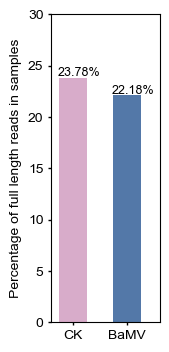

In [47]:
bwith=.8
fig=plt.figure(figsize=(1.4,4))
plt.bar(x=[0.2,0.45],height=d['ratio'],width=.13,color=['#d8acca','#5378a8'])
plt.ylim(0,30)
ax = plt.gca()
ax.spines['bottom'].set_linewidth(bwith)
ax.spines['left'].set_linewidth(bwith)
ax.spines['top'].set_linewidth(bwith)
ax.spines['right'].set_linewidth(bwith)
plt.tick_params(width=1, length=2)#设置刻度线宽度，长度
plt.yticks(fontsize=9)
plt.ylabel('Percentage of full length reads in samples',fontsize=10)
plt.xticks(fontsize=9)
plt.xlim(0.1,0.6)
plt.xticks(ticks=[0.2,0.45],labels=['CK','BaMV'])
plt.text(0.13,24,'23.78%',fontsize=9)
plt.text(0.38,22.3,'22.18%',fontsize=9)
plt.tick_params(length=2,labelsize=9)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
# plt.savefig('F:\\project\\DRS\\result\\08_full_length\\assign_full_length\\Full-ratio-total.pdf',bbox_inches='tight',transparent=True,dpi=300)

In [116]:
def cal_rel_pos(df, ref_ed, ref_st):
    st, ed, strand = df[["ref_st", "ref_ed", "strand"]]
    cd = ref_ed - ref_st
    if strand == "+":
        rel_st = (st - ref_st) / cd
        rel_ed = (ed - ref_st) / cd 
    else:
        rel_st = (ref_ed - ed) / cd
        rel_ed = (ref_ed - st) / cd
    return rel_st, rel_ed


def cal_rel_st_pos(df, ref_st, ref_ed, cd):
    st, ed, strand = df[["ref_st", "ref_ed", "strand"]]
    if strand == "+":
        return (st - ref_st) 
    else:
        return (ref_ed - ed)



def cal_density(df,result, bins=100):
    st, ed = int(df["rel_st"]*bins), int(df["rel_ed"]*bins)
    if ed > bins:
        ed = bins
    if st < 0:
        st = 0
    for x in range(st, ed):
        result[x] += 1

    
def get_plot_values(data):
    total = sum(data.values())
    x, y = [], []
    for bin, value in sorted(data.items()):
        x.append(bin)
        y.append(value / total)
    return x, y

In [117]:
with tqdm(total=len(assign)) as phar:
    for gene, temp in assign.groupby("Assigned_gene"):
        strand = gff_data[gene]["strand"]
        ref_st, ref_ed = gff_len[gene]
        cd = ref_ed - ref_st
        if strand == "+":
            assign.loc[temp.index, ["rel_st"]] = (temp["ref_st"] - ref_st) / cd
            assign.loc[temp.index, ["rel_ed"]] = (temp["ref_ed"] - ref_st) / cd
            phar.update(len(temp))
        else:
            assign.loc[temp.index, ["rel_st"]] = (ref_ed - temp["ref_ed"]) / cd
            assign.loc[temp.index, ["rel_ed"]] = (ref_ed - temp["ref_st"]) / cd
            phar.update(len(temp))

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1361118/1361118 [01:47<00:00, 12633.05it/s]


### 2. different full length ratio

In [18]:
data

,CK-nofull,CK-full,BaMV-nofull,BaMV-full
evm.TU.FRAGSCAFF_1.28,14.0,1.0,5.0,0.0
evm.TU.FRAGSCAFF_1.32,1.0,0.0,1.0,0.0
evm.TU.FRAGSCAFF_1.33,19.0,0.0,9.0,0.0
evm.TU.FRAGSCAFF_1.37,1.0,0.0,1.0,0.0
evm.TU.FRAGSCAFF_1.40,6.0,0.0,3.0,1.0
...,...,...,...,...
evm.TU.ORIGINAL_979.295,0.0,1.0,1.0,0.0
evm.TU.ORIGINAL_979.392,0.0,1.0,1.0,0.0
evm.TU.ORIGINAL_980.12,0.0,1.0,3.0,0.0
evm.TU.ORIGINAL_981.25,0.0,1.0,1.0,3.0


In [118]:
sample='BaMV'
dmso = pd.DataFrame.from_dict(full_df["CK"], orient="index").fillna(0)
dmso.columns = ["CK-nofull", "CK-full"]
data = pd.DataFrame.from_dict(full_df[sample], orient="index").fillna(0)
data.columns = [f"{sample}-nofull", f"{sample}-full"]
data = pd.concat([dmso,data], join="inner", axis=1)

In [119]:
############################
### Fisher extract test ###
##########################
def get_fisher_test(df, phar=False):
    tab1 = df[:2]
    tab2 = df[2:4]
    stat, p = stats.fisher_exact([tab1, tab2])
    if phar:
        phar.update(1)
    return p


phar = tqdm(total=len(data))
data["pvalue"] = data.apply(get_fisher_test, args=(phar,), axis=1)
phar.close()

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 24214/24214 [00:19<00:00, 1267.93it/s]


In [75]:
data

,CK-nofull,CK-full,BaMV-nofull,BaMV-full,pvalue
evm.TU.FRAGSCAFF_1.28,14.0,1.0,5.0,0.0,1.000000
evm.TU.FRAGSCAFF_1.32,1.0,0.0,1.0,0.0,1.000000
evm.TU.FRAGSCAFF_1.33,19.0,0.0,9.0,0.0,1.000000
evm.TU.FRAGSCAFF_1.37,1.0,0.0,1.0,0.0,1.000000
evm.TU.FRAGSCAFF_1.40,6.0,0.0,3.0,1.0,0.400000
...,...,...,...,...,...
evm.TU.ORIGINAL_979.295,0.0,1.0,1.0,0.0,1.000000
evm.TU.ORIGINAL_979.392,0.0,1.0,1.0,0.0,1.000000
evm.TU.ORIGINAL_980.12,0.0,1.0,3.0,0.0,0.250000
evm.TU.ORIGINAL_981.25,0.0,1.0,1.0,3.0,1.000000


In [120]:
data['CK_ratio'] = data['CK-full'] / (data['CK-nofull'] + data['CK-full'])
data['BaMV_ratio'] = data['BaMV-full'] / (data['BaMV-nofull'] + data['BaMV-full'])

In [121]:
data['log2fc']= np.log2(data['BaMV_ratio'] / data['CK_ratio'])

/home/qq/work/systools/miniconda3/envs/rna/lib/python3.10/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [122]:
data['label'] = np.where((data['pvalue'] < 0.05) & (data['log2fc'] <0),'down',np.where((data['pvalue'] < 0.05) & (data['log2fc'] >0),'up','stable'))

In [123]:
data.label.value_counts()

label
stable    23806
down        360
up           48
Name: count, dtype: int64

In [ ]:
data.label.value_counts()

#将全长比对到基因组比比对到转录本的得到的差异数目更多一点
#down    363
# up       70

stable    23806
down        360
up           48
Name: label, dtype: int64

In [75]:
data['id'] = data.index

In [76]:
data['gene_name']=data['id'].apply(get_transcript)

In [ ]:
data.to_csv(fp+'full_length_ratio_pv.csv')

In [77]:
for sample in ["BaMV"]:
    dmso = pd.DataFrame.from_dict(full_df["CK"], orient="index").fillna(0)
    dmso.columns = ["CK-nofull", "CK-full"]
    data = pd.DataFrame.from_dict(full_df[sample], orient="index").fillna(0)
    data.columns = [f"{sample}-nofull", f"{sample}-full"]
    data = pd.concat([data, dmso], join="inner", axis=1)
    data[:] = data[:].astype(int)

    phar = tqdm(total=len(data))
    data["pvalue"] = data.apply(get_fisher_test, args=(phar,), axis=1)
    phar.close()

    data = data[data["pvalue"] < 0.05]
    data["CK-ratio"] = data["CK-full"] / (data["CK-full"] + data["CK-nofull"])
    data[f"{sample}-ratio"] = data[f"{sample}-full"] / (data[f"{sample}-full"] + data[f"{sample}-nofull"])
    data["foldchange"] = np.log2(data[f"{sample}-ratio"] / data["CK-ratio"])
    data["label"] = data["foldchange"].apply(lambda x:"up" if x > 0 else "down")
    data.to_csv(fp+f"Full-ratio-significant-changed-gene-{sample}.csv")
    print(sample, "FINISH")

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 24214/24214 [00:21<00:00, 1109.73it/s]

BaMV FINISH



/home/qq/work/systools/miniconda3/envs/rna/lib/python3.10/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


full length ratio scatter plot 

In [ ]:
data=pd.read_csv('F:\\project\\DRS\\result\\08_full_length\\assign_full_length\\full_length_ratio_pv.csv',index_col=0)

In [ ]:
data

,CK-nofull,CK-full,BaMV-nofull,BaMV-full,pvalue,CK_ratio,BaMV_ratio,log2fc,label,id,gene_name
evm.TU.FRAGSCAFF_1.28,14.0,1.0,5.0,0.0,1.000000,0.066667,0.000000,-inf,stable,evm.TU.FRAGSCAFF_1.28,evm.model.FRAGSCAFF_1.28
evm.TU.FRAGSCAFF_1.32,1.0,0.0,1.0,0.0,1.000000,0.000000,0.000000,NaN,stable,evm.TU.FRAGSCAFF_1.32,evm.model.FRAGSCAFF_1.32
evm.TU.FRAGSCAFF_1.33,19.0,0.0,9.0,0.0,1.000000,0.000000,0.000000,NaN,stable,evm.TU.FRAGSCAFF_1.33,evm.model.FRAGSCAFF_1.33
evm.TU.FRAGSCAFF_1.37,1.0,0.0,1.0,0.0,1.000000,0.000000,0.000000,NaN,stable,evm.TU.FRAGSCAFF_1.37,evm.model.FRAGSCAFF_1.37
evm.TU.FRAGSCAFF_1.40,6.0,0.0,3.0,1.0,0.400000,0.000000,0.250000,inf,stable,evm.TU.FRAGSCAFF_1.40,evm.model.FRAGSCAFF_1.40
...,...,...,...,...,...,...,...,...,...,...,...
evm.TU.ORIGINAL_979.295,0.0,1.0,1.0,0.0,1.000000,1.000000,0.000000,-inf,stable,evm.TU.ORIGINAL_979.295,evm.model.ORIGINAL_979.295
evm.TU.ORIGINAL_979.392,0.0,1.0,1.0,0.0,1.000000,1.000000,0.000000,-inf,stable,evm.TU.ORIGINAL_979.392,evm.model.ORIGINAL_979.392
evm.TU.ORIGINAL_980.12,0.0,1.0,3.0,0.0,0.250000,1.000000,0.000000,-inf,stable,evm.TU.ORIGINAL_980.12,evm.model.ORIGINAL_980.12
evm.TU.ORIGINAL_981.25,0.0,1.0,1.0,3.0,1.000000,1.000000,0.750000,-0.415037,stable,evm.TU.ORIGINAL_981.25,evm.model.ORIGINAL_981.25


In [ ]:
data['label'].unique()

array(['stable', 'down', 'up'], dtype=object)

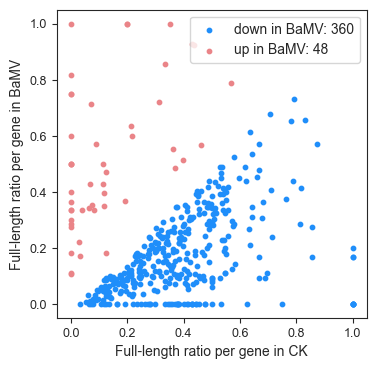

In [ ]:
fp='F:\\project\\DRS\\result\\08_full_length\\assign_full_length\\'
fig, ax = plt.subplots(1, figsize=(4,4))
#temp_color = {"down":"dodgerblue", "up":"orangered"}
temp_color={'up':'#ea8488','down':'#1f8efa'}
sample='BaMV'

for label, values in data[data['label'].isin(['up','down'])].groupby("label"):
    ax.scatter(x=values["CK_ratio"], y=values[f"{sample}_ratio"], s=10, label=f"{label} in {sample}: {len(values)}", color=temp_color[label])

ax.legend(frameon=True, fontsize=10)
ax.set_ylabel(f"Full-length ratio per gene in {sample}", fontsize=10)
ax.set_xlabel("Full-length ratio per gene in CK", fontsize=10)
plt.savefig(fp+"Full-length-percent-VS-ck.pdf", bbox_inches="tight",transparent=True,dpi=600)

## 02 AS 

### 1. AS events generated from Suppa2

In [215]:
suppa_result='/home/qq/work/lxr/DRS/suppa_nanopore/'
as_fp='/home/qq/work/lxr/DRS/script_plot/bamv/AS/'

In [217]:
as_anno = pd.read_csv(suppa_result+"dla_nanopore_merge.gtf",skiprows=[0,1],sep='\t',
names=['chr','source','type','start','end','score','strand','phase','attr'])

/tmp/ipykernel_49458/2090303766.py:1: DtypeWarning: Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.
  as_anno = pd.read_csv(suppa_result+"dla_nanopore_merge.gtf",skiprows=[0,1],sep='\t',


In [224]:
as_num = defaultdict(dict)
events = ["RI","SE", "A3SS","A5SS", "AF", "AL", "MX"]
as_path = as_fp
#as_path = "/media/Sorata/data3/bamboo/9_AS/SUPPA/06_single"
for sample in ["ck", "bamv",'dla_merge']:
    for event in events:
        with open(as_path+f"{sample}_nanopore_{event}_strict.ioe") as f:
            n = 0
            next(f)
            as_num[sample][event] = 0
            for line in f:
                as_num[sample][event] += 1

In [225]:
for sample in ["ck", "bamv",'dla_merge']:
    print(sample, '-----------')
    for e, v in as_num[sample].items():
        print(e, v, v/sum(as_num[sample].values()))

ck -----------
RI 1491 0.2863453043979259
SE 561 0.1077395813328212
A3SS 1457 0.27981563280199734
A5SS 1174 0.22546571922412137
AF 290 0.05569425772997887
AL 223 0.042826963702707894
MX 11 0.0021125408104474747
bamv -----------
RI 1212 0.3410241980866629
SE 316 0.08891389983117615
A3SS 867 0.24395047833427125
A5SS 789 0.22200337647720877
AF 206 0.057962858750703436
AL 156 0.04389420371412493
MX 8 0.0022509848058525606
dla_merge -----------
RI 2021 0.2988318793434866
SE 722 0.10675735620286855
A3SS 1887 0.2790181871950318
A5SS 1477 0.2183942037557297
AF 381 0.05633594558627828
AL 261 0.03859234067721425
MX 14 0.0020700872393908027


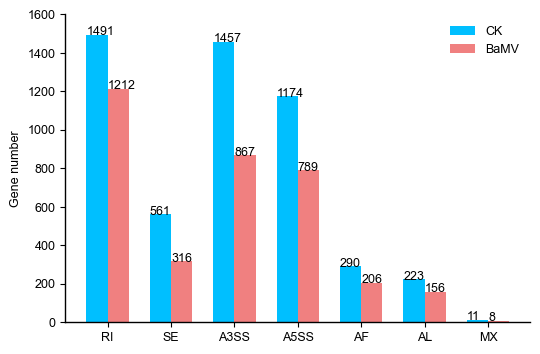

In [226]:
fig, ax = plt.subplots(1, figsize=(6,4))
wd = 0.8

####
pos = [x*3*wd for x in range(0, len(as_num["ck"]))]
for x, y in zip(pos, as_num["ck"].values()):
    ax.text(x-wd/2, y , s=y)
ax.bar(height=as_num["ck"].values(), x=pos, label="CK", color="deepskyblue")

####
pos2 = [x+wd for x in pos]
for x, y in zip(pos2, as_num["bamv"].values()):
    ax.text(x-wd/2, y , s=y)
ax.bar(height=as_num["bamv"].values(), x=pos2, label="BaMV", color="lightcoral")


#####
pos3 = [x+wd/2 for x in pos]
ax.set_xticks(labels=events, ticks=pos3)


ax.legend(frameon=False)
ax.set_ylim(0, 1600)
ax.set_ylabel("Gene number")
ax.spines['bottom'].set_linewidth(1)
ax.spines['left'].set_linewidth(1)
ax.spines['right'].set_linewidth(0)
ax.spines['top'].set_linewidth(0)
plt.savefig(as_fp + "AS-bar-1.pdf", bbox_inches="tight")

In [228]:
as_num = defaultdict(dict)
as_path = "F:\\project\\DRS\\result\\06_AS\\suppa_nanopore\\illu_diffPSI\\suppa2\\dla_nanopore_merge\\"
as_event = defaultdict(dict)
for event in ["A3SS","A5SS", "AF", "AL", "MX", "RI", "SE"]:
    as_num[event] = []
    with open(as_fp+f"/dla_merge_nanopore_{event}_strict.ioe") as f:
        n = 0
        next(f)
        for line in f:
            transcripts = line.split("\t")[3].split(",")
            as_num[event] += transcripts
            for transcript in transcripts:
                as_event.setdefault(transcript, "|")
                as_event[transcript] += f"{event}|"
    as_num[event] = list(set(as_num[event]))

/home/qq/work/systools/miniconda3/envs/rna/lib/python3.10/site-packages/upsetplot/data.py:385: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df.fillna(False, inplace=True)
/home/qq/work/systools/miniconda3/envs/rna/lib/python3.10/site-packages/upsetplot/plotting.py:795: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.

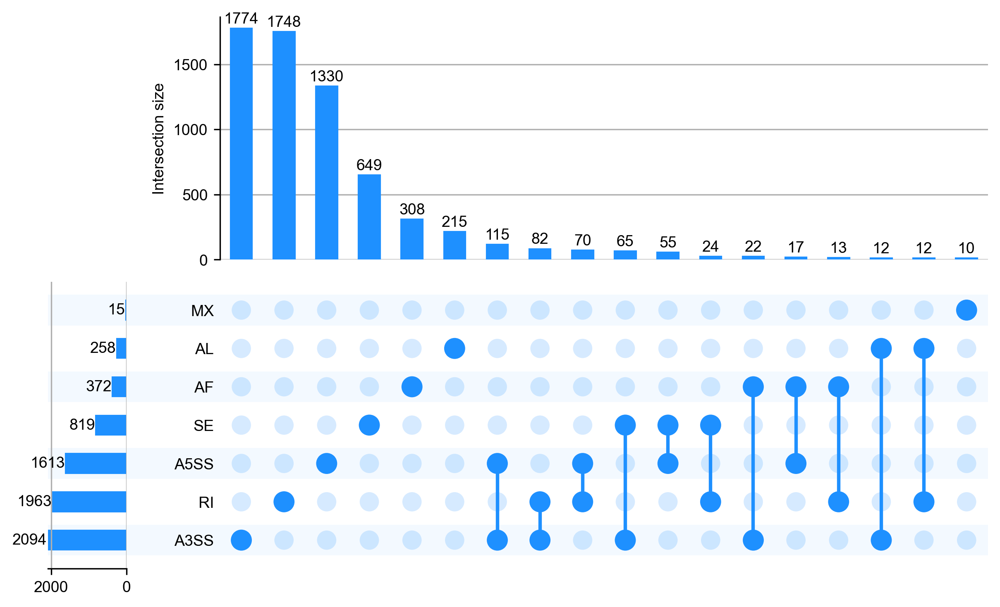

In [229]:
example = from_contents(as_num)
fig = plt.figure(dpi=300)
plot(example, show_counts="%d", min_subset_size=10, fig=fig, sort_by="cardinality",facecolor='#1e90ff')
# plt.ylabel('Number of up-regulated proteins')
plt.savefig(as_fp+"upset.pdf", bbox_inches="tight",transparent=True)   

### 2. PSI calculate

In [230]:
psivec = pd.read_csv(as_fp+"project_diffSplice.psivec",sep='\t')
dpsi=pd.read_csv(as_fp+"project_diffSplice.dpsi",sep='\t')

In [231]:
fp_1= "/home/qq/work/lxr/DRS/suppa_nanopore/stringtie/dla_nanopore_merge.stringtie.gtf"
stringtie_gene_transcript={}
use_t=[]
with open(fp_1) as f:
    for line in f:
        if line.startswith('#'):
            continue
        info = line.strip().split('\t')
        chrome, org, ty, st, ed, point, strand, p, o = info[:]    
        if ty == 'transcript': 
            gene=o.split('"')[1]
            transcript=o.split('"')[3]
            #if gene not in stringtie_gene_transcript:
            stringtie_gene_transcript[transcript]=defaultdict()
            stringtie_gene_transcript[transcript]={
                'gene_id':gene,
                'chrome':chrome,
                'mRNA':[int(st),int(ed)],'strand':strand}
            
            #     use_t.append(transcript)
            # else:
            #     stringtie_gene_transcript[transcript].append(gene)
            #     use_t.append(transcript)

In [232]:
diff_dpsi= dpsi[(abs(dpsi['treat-control_dPSI']) > 0.1) & (dpsi['treat-control_p-val'] < 0.05)]

In [233]:
def mark_as(x):
    if x == "A3":
        return "o"
    elif x == "A5":
        return "v"
    elif x == "SE":
        return "s"
    elif x == "RI":
        return "H"
    elif x == "AF":
        return "*"
    elif x == "AL":
        return "D"
    else:
        return "d"       


#diffas = diffas[diffas["DMSO-DZnepA_p-val"] < 0.05]
dpsi["event"] = dpsi.apply(lambda x:x.name.split(":")[0].split(";")[1], axis=1)
dpsi["log10pv"] = -np.log10(dpsi["treat-control_p-val"])
dpsi["mark"] = dpsi["event"].apply(mark_as)
dpsi

/home/qq/work/systools/miniconda3/envs/rna/lib/python3.10/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


,treat-control_dPSI,treat-control_p-val,event,log10pv,mark
MSTRG.10005;SE:chr2.1:3146985-3147058:3147104-3150797:-,0.060284,0.170829,SE,0.767438,s
MSTRG.10006;RI:chr2.1:3198841:3198909-3199016:3199118:+,-0.099709,0.172827,RI,0.762388,H
MSTRG.10006;RI:chr2.1:3199016:3199118-3199387:3199473:+,-0.290243,0.172827,RI,0.762388,H
MSTRG.10009;A5:chr2.1:3249602-3249685:3249602-3249689:-,0.007395,0.348651,A5,0.457609,v
MSTRG.1000;RI:chr1.1:50608992:50609068-50609154:50609220:-,-0.322944,0.120879,RI,0.917649,H
...,...,...,...,...,...
MSTRG.9984;SE:chr2.1:2770260-2775109:2775202-2775363:-,0.030711,0.263237,SE,0.579653,s
MSTRG.9985;RI:chr2.1:2786786:2786872-2786977:2787574:+,-0.136065,0.124376,RI,0.905265,H
MSTRG.9991;A5:chr2.1:2931549-2931886:2931549-2931890:-,-0.085418,0.190310,A5,0.720539,v
MSTRG.999;RI:chr1.1:50575268:50575439-50575536:50575646:+,0.223429,0.079920,RI,1.097344,H


In [234]:
dpsi.to_csv(as_fp+'dpsi_asmark.csv')

/tmp/ipykernel_49458/4229829180.py:12: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = values["event"].drop_duplicates()[0]
/tmp/ipykernel_49458/4229829180.py:15: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label = values["event"].drop_duplicates()[0]


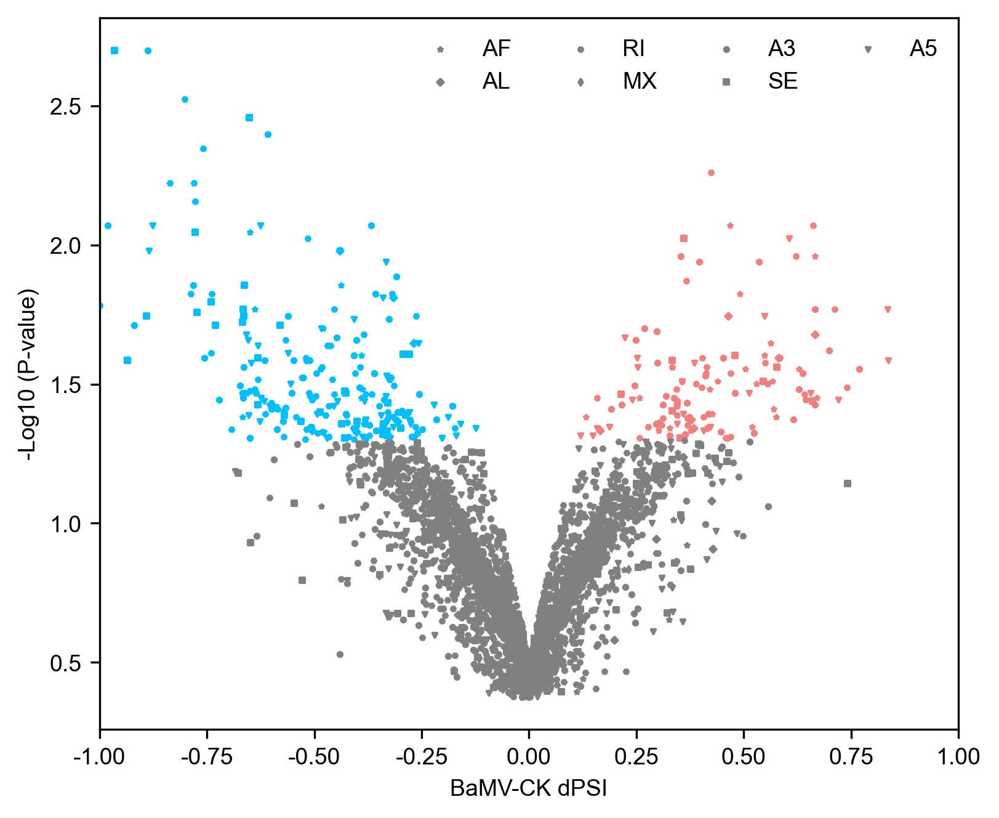

In [237]:
fig, ax = plt.subplots(1, dpi=300,figsize=(6,5))
diff =  dpsi[(abs(dpsi['treat-control_dPSI']) > 0.1) & (dpsi['treat-control_p-val'] < 0.05)]
nodiff =  dpsi[(abs(dpsi['treat-control_dPSI']) < 0.1) | (dpsi['treat-control_p-val'] >= 0.05)]

up = diff[diff["treat-control_dPSI"] > 0]
down = diff[diff["treat-control_dPSI"] < 0]

for mark, values in down.groupby("mark"):
    
    ax.scatter(values["treat-control_dPSI"], values["log10pv"], marker=mark, s=3, color="deepskyblue")
for mark, values in up.groupby("mark"):
    label = values["event"].drop_duplicates()[0]
    ax.scatter(values["treat-control_dPSI"], values["log10pv"], marker=mark, s=3, color="lightcoral")
for mark, values in nodiff.groupby("mark"):
    label = values["event"].drop_duplicates()[0]
    ax.scatter(values["treat-control_dPSI"], values["log10pv"], marker=mark, s=3, color="grey", label=label)
ax.legend(frameon=False, ncol=4)
ax.set_xlabel("BaMV-CK dPSI")
ax.set_ylabel("-Log10 (P-value)")
plt.xlim(-1,1.0)
plt.savefig(as_fp+"PSI_plot.pdf", bbox_inches="tight",transparent=True)

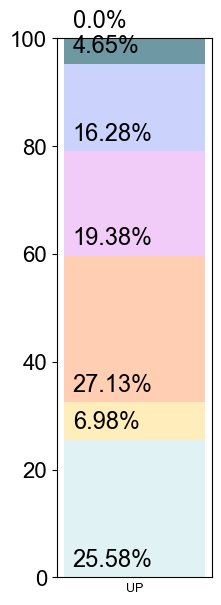

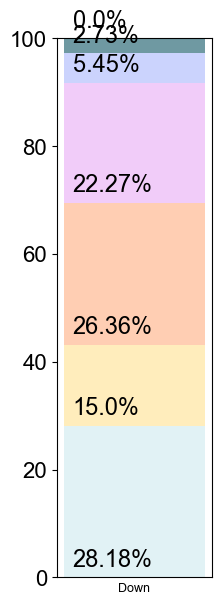

In [236]:
fp='F:\\project\DRS\\result\\06_AS\\suppa_nanopore\\illu_diffPSI\\suppa2\\suppa_quant\\quant_gtf_nanopore_merge\\'
fig = plt.figure(figsize=(2,7))
y = 0
#colors = {"RI":"lightcoral", "SE":"deepskyblue", "A3":"mediumspringgreen", "A5":"slategray", "AF":"m", "AL":"khaki", "MX":"k"}
colors = {"RI":"#e1f2f5", "SE":"#ffedbc", "A3":"#ffceb3", "A5":"#f1ccf9", "AF":"#cbd3fd", "AL":"#6f99a2", "MX":"#a899aa"}
for e in colors:
    v = up[up["event"] == e]
    v = (len(v) / len(up)) * 100
    plt.bar(height=v, bottom=y, x=1, color=colors[e])
    plt.text(1-0.35, y+2, s=f"{round(v,2)}%",fontsize=17)
    y += v
plt.xlabel("UP")
plt.xticks([])
plt.tick_params(axis='y', labelsize=16)
plt.savefig(fp+"3.up.pdf", bbox_inches="tight")


fig = plt.figure(figsize=(2,7))
y = 0
for e in colors:
    v = down[down["event"] == e]
    v = (len(v) / len(down)) * 100
    plt.bar(height=v, bottom=y, x=1, color=colors[e])
    plt.text(1-0.35, y+2, s=f"{round(v,2)}%",fontsize=17)
    y += v
plt.xlabel("Down")
plt.xticks([])
plt.tick_params(axis='y', labelsize=16)
plt.savefig(as_fp+"3.down.pdf", bbox_inches="tight")

In [238]:
dpsi[(dpsi['treat-control_p-val'] < 0.05) & (dpsi['event'] == 'RI')]

,treat-control_dPSI,treat-control_p-val,event,log10pv,mark
MSTRG.10050;RI:chr2.1:4320657:4320713-4320822:4320899:+,0.312550,0.041958,RI,1.377185,H
MSTRG.10051;RI:chr2.1:4429002:4429108-4429216:4429319:-,0.549253,0.026474,RI,1.577188,H
MSTRG.10169;RI:chr2.1:8844997:8845346-8845445:8845620:+,-0.466924,0.037962,RI,1.420650,H
MSTRG.10777;RI:chr2.1:44942878:44943021-44943091:44943274:+,0.356118,0.030969,RI,1.509072,H
MSTRG.10989;RI:chr2.1:52892402:52893129-52893378:52893902:+,0.469926,0.028971,RI,1.538036,H
...,...,...,...,...,...
MSTRG.8857;RI:chr18.1:15612814:15612899-15613007:15613317:+,-0.567092,0.021978,RI,1.658011,H
MSTRG.8924;RI:chr18.1:17314415:17314527-17314621:17315001:+,-0.692820,0.045954,RI,1.337676,H
MSTRG.9825;RI:chr19.1:30479884:30480002-30480105:30480196:-,-0.571030,0.039461,RI,1.403837,H
MSTRG.9862;RI:chr19.1:31082110:31082240-31082321:31082476:+,0.333008,0.027473,RI,1.561101,H


## 03 Proteomic data

* **Read the result file exported by Proteome Discoverer, and the raw protein abundance is normalized using the total sample intensity of BaMVrep2**
* **Differentially expressed proteins (DEPs) were identified using a fold change threshold > 1.5 and a P-value < 0.05.**

### 1. DE pro

In [7]:
wig_fp='/home/qq/work/lxr/DRS/wig/'
pro_fp='/home/qq/work/lxr/DRS/script_plot/bamv/pro/'

In [8]:
pro_abundance=pd.read_csv(wig_fp+"pro_abundance.csv",index_col=0)
deseq2_bamv_ck_res=pd.read_csv(wig_fp+'deseq2_bamv_ck_res_1.5.csv')

In [182]:
deseq2_bamv_ck_res

,Row.names,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,Dla-BaMV-1_L1_150A50,Dla-BaMV-2_L2_152A52,Dla-BaMV-3_L2_153A53,...,gene_id,gene_name,BaMV_1_TPM,BaMV_2_TPM,BaMV_3_TPM,CK_1_TPM,CK_2_TPM,CK_3_TPM,BaMV_TPM,CK_TPM
0,evm.TU.ORIGINAL_4567.71,5140.934179,5.643929,0.275470,20.488390,2.730000e-93,9.500000e-89,2673,2929,2468,...,evm.TU.ORIGINAL_4567.71,evm.model.ORIGINAL_4567.71,1028.500381,1519.093835,569.451527,17.674054,15.856590,15.571672,1039.015248,16.367439
1,evm.TU.FRAGSCAFF_182.98,1672.549351,4.522568,0.233399,19.376968,1.210000e-83,2.100000e-79,856,871,901,...,evm.TU.FRAGSCAFF_182.98,evm.model.FRAGSCAFF_182.98,396.154106,543.335752,250.046797,14.699932,13.084232,13.023034,396.512218,13.602399
2,evm.TU.FRAGSCAFF_279.183,266.848970,4.163525,0.216070,19.269368,9.710000e-83,1.130000e-78,119,122,199,...,evm.TU.FRAGSCAFF_279.183,evm.model.FRAGSCAFF_279.183,34.540388,47.730921,34.636934,2.213366,1.510086,1.457495,38.969414,1.726982
3,evm.TU.ORIGINAL_6592.105,332.216010,6.046171,0.327610,18.455365,4.720000e-76,4.100000e-72,194,160,191,...,evm.TU.ORIGINAL_6592.105,evm.model.ORIGINAL_6592.105,264.753630,294.320090,156.307447,2.048564,1.961857,4.410206,238.460389,2.806876
4,evm.TU.FRAGSCAFF_230.829,182.662554,4.460126,0.254662,17.513925,1.120000e-68,7.800000e-65,101,86,105,...,evm.TU.FRAGSCAFF_230.829,evm.model.FRAGSCAFF_230.829,44.534524,51.113265,27.763285,1.694434,1.237562,1.446854,41.137024,1.459617
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50393,evm.TU.FRAGSCAFF_125.59,0.057366,2.694235,4.080473,0.660275,5.090772e-01,NaN,0,0,0,...,evm.TU.FRAGSCAFF_125.59,evm.model.FRAGSCAFF_125.59,0.000000,0.000000,0.000000,0.000000,0.247676,0.000000,0.000000,0.082559
50394,evm.TU.FRAGSCAFF_125.45,0.492316,2.722976,2.712009,1.004044,3.153574e-01,NaN,0,0,1,...,evm.TU.FRAGSCAFF_125.45,evm.model.FRAGSCAFF_125.45,0.000000,0.000000,1.008578,0.000000,0.115136,0.083620,0.336193,0.066252
50395,evm.TU.FRAGSCAFF_125.36,0.186876,0.794069,3.432446,0.231342,8.170491e-01,NaN,0,0,0,...,evm.TU.FRAGSCAFF_125.36,evm.model.FRAGSCAFF_125.36,0.000000,0.000000,0.000000,0.074089,0.042234,0.030673,0.000000,0.048999
50396,evm.TU.FRAGSCAFF_224.6,0.122719,1.380579,4.006246,0.344607,7.303902e-01,NaN,0,0,0,...,evm.TU.FRAGSCAFF_224.6,evm.model.FRAGSCAFF_224.6,0.000000,0.000000,0.000000,0.067692,0.000000,0.112099,0.000000,0.059930


In [129]:
pro_abundance

,bamv_rep1(Normalized),bamv_rep2(Normalized),bamv_rep3(Normalized),ck_rep1(Normalized),ck_rep2(Normalized),ck_rep3(Normalized),log2fc,fc,ttest_pval1,Dla1_(FC_1.5_label),...,bamv_pro(Normalized),ck_pro(Normalized),bamv_rep1(Scaled),bamv_rep2(Scaled),bamv_rep3(Scaled),ck_rep1(Scaled),ck_rep2(Scaled),ck_rep3(Scaled),bamv_pro(Scaled),ck_pro(Scaled)
evm.model.ORIGINAL_5229.70,12752.6,14946.4,14953.8,16504.7,16780.8,18316.4,-0.274784,0.826574,0.032046,stable,...,14217.600000,17200.633333,81.2,95.1,95.2,105.1,106.8,116.6,90.500000,109.500000
evm.model.FRAGSCAFF_259.922,115937.1,119482.5,105951.4,114602.0,106162.9,123454.9,-0.011990,0.991724,0.889722,stable,...,113790.333333,114739.933333,101.5,104.6,92.7,100.3,92.9,108.0,99.600000,100.400000
evm.model.FRAGSCAFF_182.98,380597.3,349491.9,305504.8,460382.9,389667.2,385236.2,-0.254387,0.838343,0.111242,stable,...,345198.000000,411762.100000,100.6,92.3,80.7,121.6,103.0,101.8,91.200000,108.800000
evm.model.FRAGSCAFF_52.47,52244.8,52197.0,52523.4,79750.0,71292.8,70213.1,-0.495271,0.709428,0.002075,stable,...,52321.733333,73751.966667,82.9,82.8,83.3,126.5,113.1,111.4,83.000000,117.000000
evm.model.FRAGSCAFF_120.407,124512.6,140185.4,129203.1,111550.0,106139.2,119145.4,0.225793,1.169420,0.033559,stable,...,131300.366667,112278.200000,102.2,115.1,106.1,91.6,87.1,97.8,107.800000,92.166667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
evm.model.FRAGSCAFF_226.197,358.9,381.0,498.7,531.0,639.2,567.9,-0.488801,0.712617,0.036340,stable,...,412.866667,579.366667,72.3,76.8,100.5,107.0,128.8,114.5,83.200000,116.766667
evm.model.FRAGSCAFF_323.605,753.4,880.8,606.8,650.6,846.7,703.5,0.026115,1.018266,0.898337,stable,...,747.000000,733.600000,101.8,119.0,82.0,87.9,114.4,95.0,100.933333,99.100000
evm.model.FRAGSCAFF_154.219,287.2,348.9,286.7,211.4,201.2,224.5,0.534498,1.448438,0.011839,stable,...,307.600000,212.366667,110.5,134.2,110.3,81.3,77.4,86.3,118.333333,81.666667
evm.model.ORIGINAL_609.30_evm.model.ORIGINAL_609.31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,stable,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [147]:
a=pro_abundance.dropna().sort_values('log2fc')
a['rank']=range(len(a))
pro_abundance_plot=pd.DataFrame(pro_abundance[pro_abundance['ttest_pval1'] <0.05]['log2fc'].dropna(how='all'))

In [148]:
pro_abundance_plot=pro_abundance_plot.sort_values('log2fc')

In [149]:
pro_abundance_plot['rank']=range(2202)

In [150]:
important_gene={'evm.model.FRAGSCAFF_20.188.1':'NLR-C3','evm.model.FRAGSCAFF_188.176':'APX1','evm.model.ORIGINAL_4848.194':'APX2','evm.model.FRAGSCAFF_119.275':'APX3','evm.model.FRAGSCAFF_143.250':'APX4',
                'evm.model.FRAGSCAFF_190.1332':'PEX11B','evm.model.FRAGSCAFF_455.77':'DVR','evm.model.FRAGSCAFF_426.552':'LBD29-1','evm.model.FRAGSCAFF_173.412':'LBD29-2','evm.model.ORIGINAL_1673.789':'LBD29-3',
                'evm.model.FRAGSCAFF_224.3':'CTSL1','evm.model.FRAGSCAFF_190.574':'CTSL2'}

In [151]:
a

,bamv_rep1(Normalized),bamv_rep2(Normalized),bamv_rep3(Normalized),ck_rep1(Normalized),ck_rep2(Normalized),ck_rep3(Normalized),log2fc,fc,ttest_pval1,Dla1_(FC_1.5_label),...,ck_pro(Normalized),bamv_rep1(Scaled),bamv_rep2(Scaled),bamv_rep3(Scaled),ck_rep1(Scaled),ck_rep2(Scaled),ck_rep3(Scaled),bamv_pro(Scaled),ck_pro(Scaled),rank
evm.model.ORIGINAL_5229.177,197.5,202.1,701.8,820.9,1513.6,1184.1,-1.675663,0.313022,0.036596,down,...,1172.866667,25.7,26.2,91.1,106.6,196.6,153.8,47.666667,152.333333,0
evm.model.ORIGINAL_6123.227,177.3,228.3,343.8,911.0,453.5,1014.2,-1.666365,0.315046,0.038752,down,...,792.900000,34.0,43.8,65.9,174.7,87.0,194.5,47.900000,152.066667,1
evm.model.FRAGSCAFF_120.247,241.9,285.6,839.0,1129.6,1458.8,1375.3,-1.536362,0.344754,0.016042,down,...,1321.233333,27.2,32.1,94.4,127.2,164.2,154.8,51.233333,148.733333,2
evm.model.FRAGSCAFF_76.107,275.6,263.4,568.8,696.8,1461.4,858.8,-1.445417,0.367186,0.065769,stable,...,1005.666667,40.1,38.3,82.7,101.3,212.6,124.9,53.700000,146.266667,3
evm.model.FRAGSCAFF_196.730,363.8,414.6,881.6,1437.8,1613.2,1312.7,-1.394369,0.380411,0.008433,down,...,1454.566667,36.2,41.3,87.8,143.2,160.7,130.8,55.100000,144.900000,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
evm.model.FRAGSCAFF_395.173,6526.5,3044.2,878.4,1231.2,354.9,414.7,2.384730,5.222461,0.166874,stable,...,666.933333,314.5,146.7,42.3,59.3,17.1,20.0,167.833333,32.133333,7030
evm.model.FRAGSCAFF_450.76,1676.1,2334.0,1129.3,245.4,347.0,380.3,2.401533,5.283643,0.016659,up,...,324.233333,164.5,229.1,110.9,24.1,34.1,37.3,168.166667,31.833333,7031
evm.model.FRAGSCAFF_221.88,9753.3,10331.9,7906.8,513.2,634.1,1249.8,3.545653,11.677444,0.000370,up,...,799.033333,192.6,204.0,156.1,10.1,12.5,24.7,184.233333,15.766667,7032
evm.model.ORIGINAL_5504.89,5392.6,7659.4,16409.8,621.9,805.1,992.5,3.606065,12.176813,0.055100,stable,...,806.500000,101.5,144.1,308.8,11.7,15.2,18.7,184.800000,15.200000,7033


In [152]:
from adjustText import adjust_text

Looks like you are using a tranform that doesn't support FancyArrowPatch, using ax.annotate instead. The arrows might strike through texts. Increasing shrinkA in arrowprops might help.
/tmp/ipykernel_15975/1448648475.py:39: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  plt.legend([s1,s2,s3],labels=['All proteins (n=7035)','Up-regulated proteins (n=329)','Down-regulated proteins (n=297)'],frameon=False,fontsize=9,loc='best')


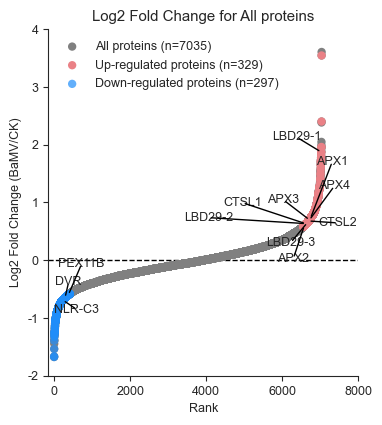

In [153]:
fig=plt.figure(figsize=(4,4.5))

s1=sns.scatterplot(data=a,x='rank',y='log2fc',edgecolor='none',color='gray',zorder=2 )
s2=sns.scatterplot(data=a[(a['ttest_pval1']<0.05) & (a['log2fc'] >0.58)],x='rank',y='log2fc',edgecolor='none',color='#ea8186',zorder=2)#'purple',
s3=sns.scatterplot(data=a[(a['ttest_pval1']<0.05) & (a['log2fc'] <-0.58)],x='rank',y='log2fc',edgecolor='none',color='#1f8efa',alpha=.7,zorder=2)#'blue'
sns.despine()
plt.ylim(-2,4)
plt.xlim(-150,8000)
plt.axhline(0, color='black', linestyle='--', lw=1,zorder=1 )
plt.xlabel('Rank')
plt.ylabel('Log2 Fold Change (BaMV/CK)',fontsize=9)
plt.title('Log2 Fold Change for All proteins')
genes = important_gene.values()
positions=[]
for gene in important_gene.keys():
    x=a.loc[gene,'rank']
    y=a.loc[gene,'log2fc']
    positions.append((x,y))


# Annotate the genes with arrows
texts=[]
texts_t=[]
for gene, pos in zip(genes, positions):
    # plt.annotate(gene, xy=pos, xytext=(pos[0]+0.5, pos[1]+5),
    #             arrowprops=dict(facecolor='black', arrowstyle="->"),
    #             fontsize=10, color='black', ha='center')
    text=plt.text(pos[0], pos[1], gene,
            fontsize=9, ha='right', va='bottom')
            #bbox=dict(facecolor='None', alpha=0.5, edgecolor='none'))
    #texts.append(text)
    texts.append(text)
    texts_t.append((pos[0], pos[1],text))
#adjust_text(texts, army=None, force_text=0.5) #, only_move={'points':'y', 'text':'y'}
adjust_text(texts,  force_text=.8,force_points=4,arrowprops=dict(arrowstyle="-", color='black', lw=1))#,only_move={'text':'y'})
# for x, y, text in texts_t:
#     print([x, x], [0, y])
#     plt.plot([x, x], [0, y], color='black', linestyle='--', linewidth=0.5)
plt.legend([s1,s2,s3],labels=['All proteins (n=7035)','Up-regulated proteins (n=329)','Down-regulated proteins (n=297)'],frameon=False,fontsize=9,loc='best')
plt.savefig(pro_fp+'DE_pro_logfc_curve.pdf', format='pdf', dpi=600, bbox_inches='tight',transparent = True)

TF DEPs heatmap

In [170]:
DEP_TF=pd.read_csv(pro_fp+"PlantTF_2.txt",sep='\t',names=['gene_name','name','TF','ath_id'],usecols=[0,1,2,3],header=None)

In [171]:
DEP_TF

,gene_name,name,TF,ath_id
0,evm.model.FRAGSCAFF_419.187,NF-YB13,NF-YB,AT5G23090.4
1,evm.model.FRAGSCAFF_424.158,NAC29,NAC,AT1G69490.1
2,evm.model.ORIGINAL_2592.404,GATA28,GATA,AT1G51600.2
3,evm.model.ORIGINAL_4567.14,FAR1-5,FAR1,AT4G38180.1
4,evm.model.ORIGINAL_5103.276,NAC47,NAC,AT3G04070.1
5,evm.model.FRAGSCAFF_16.106,BLH6,TALE,AT4G34610.2
6,evm.model.FRAGSCAFF_245.149,FES1,C3H,AT2G33835.1


In [172]:
DEP_TF=DEP_TF.merge(pro_abundance,left_on='gene_name',right_index=True)

In [173]:
DEP_TF

,gene_name,name,TF,ath_id,bamv_rep1(Normalized),bamv_rep2(Normalized),bamv_rep3(Normalized),ck_rep1(Normalized),ck_rep2(Normalized),ck_rep3(Normalized),...,bamv_pro(Normalized),ck_pro(Normalized),bamv_rep1(Scaled),bamv_rep2(Scaled),bamv_rep3(Scaled),ck_rep1(Scaled),ck_rep2(Scaled),ck_rep3(Scaled),bamv_pro(Scaled),ck_pro(Scaled)
0,evm.model.FRAGSCAFF_419.187,NF-YB13,NF-YB,AT5G23090.4,1061.7,1005.8,797.2,569.1,601.4,603.1,...,954.900000,591.200000,137.3,130.1,103.1,73.6,77.8,78.0,123.500000,76.466667
1,evm.model.FRAGSCAFF_424.158,NAC29,NAC,AT1G69490.1,1743.1,1913.7,1695.2,1010.2,1140.8,1003.8,...,1784.000000,1051.600000,122.9,135.0,119.6,71.3,80.5,70.8,125.833333,74.200000
2,evm.model.ORIGINAL_2592.404,GATA28,GATA,AT1G51600.2,3803.1,2919.8,2499.5,976.7,662.4,1132.1,...,3074.133333,923.733333,190.3,146.1,125.0,48.9,33.1,56.6,153.800000,46.200000
3,evm.model.ORIGINAL_4567.14,FAR1-5,FAR1,AT4G38180.1,883.6,1022.1,1851.9,2431.5,3183.8,2717.0,...,1252.533333,2777.433333,43.9,50.7,91.9,120.7,158.0,134.8,62.166667,137.833333
4,evm.model.ORIGINAL_5103.276,NAC47,NAC,AT3G04070.1,4205.2,4415.6,2820.1,1460.1,1493.0,2427.7,...,3813.633333,1793.600000,150.0,157.5,100.6,52.1,53.3,86.6,136.033333,64.000000
5,evm.model.FRAGSCAFF_16.106,BLH6,TALE,AT4G34610.2,269.0,271.9,252.4,178.1,139.0,173.1,...,264.433333,163.400000,125.7,127.1,118.0,83.3,65.0,80.9,123.600000,76.400000
6,evm.model.FRAGSCAFF_245.149,FES1,C3H,AT2G33835.1,728.8,603.7,945.7,199.8,213.7,338.1,...,759.400000,250.533333,144.3,119.6,187.3,39.6,42.3,66.9,150.400000,49.600000


In [174]:
plot_dat=DEP_TF.set_index('name')[['ck_rep1(Scaled)',
       'ck_rep2(Scaled)', 'ck_rep3(Scaled)','bamv_rep1(Scaled)',
       'bamv_rep2(Scaled)', 'bamv_rep3(Scaled)']]

In [175]:
plot_dat.columns=['CK-1','CK-2','CK-3','BaMV-1','BaMV-2','BaMV-3']

In [176]:
plot_dat

,CK-1,CK-2,CK-3,BaMV-1,BaMV-2,BaMV-3
name,,,,,,
NF-YB13,73.6,77.8,78.0,137.3,130.1,103.1
NAC29,71.3,80.5,70.8,122.9,135.0,119.6
GATA28,48.9,33.1,56.6,190.3,146.1,125.0
FAR1-5,120.7,158.0,134.8,43.9,50.7,91.9
NAC47,52.1,53.3,86.6,150.0,157.5,100.6
BLH6,83.3,65.0,80.9,125.7,127.1,118.0
FES1,39.6,42.3,66.9,144.3,119.6,187.3


<Figure size 600x400 with 0 Axes>

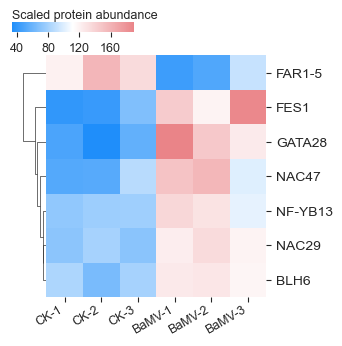

In [177]:
fig=plt.figure(figsize=(6,4))
# fig_width = cell_width * data.shape[1]
# fig_height = cell_height * data.shape[0]
colors = ["#1f8efa", "#ffffff", "#ea8488"]  # 蓝 → 白 → 红
cmap = LinearSegmentedColormap.from_list("custom_div", colors) #palette_DEP
cluster_map=sns.clustermap(plot_dat, linewidths=0.002, linecolor="white",cmap=cmap,figsize=(3.5,3.5),yticklabels=True,dendrogram_ratio=(0.1,0.1),
                           cbar_pos=(0.01, 0.95, 0.35, 0.03),cbar_kws={'orientation':'horizontal'},col_cluster=False)
cluster_map.ax_heatmap.set_xticklabels(cluster_map.ax_heatmap.get_xticklabels(),rotation=30,ha='right')
colorbar=cluster_map.ax_heatmap.collections[0].colorbar
ticks = [ 40,80,120,160] 
colorbar.set_ticks(ticks)
colorbar.set_ticklabels([f"{i}" for i in ticks],fontsize=9)
colorbar.ax.tick_params(axis='y', rotation=0, length=0.1)  
colorbar.ax.set_title('Scaled protein abundance',fontsize=9,loc='left',pad=0.3) #设置cbar标题
for label in cluster_map.ax_heatmap.get_yticklabels():
    label.set_rotation(0)
    label.set_fontsize(10)
cluster_map.ax_heatmap.set_ylabel('') 
# cluster_map.ax_row_dendrogram.set_visible(False) #设置行聚类树不可见
cluster_map.ax_heatmap.tick_params(pad=1,axis="x")
plt.savefig(pro_fp+'DEPs_TF_heatmap_2.pdf',bbox_inches='tight',transparent=True)

DE photosynthesis

In [178]:
photosynthesis=pd.read_csv(pro_fp+"photosynthesis.csv")

In [179]:
photosynthesis

,Function,Dla_gene_id,Type,name,Oryza sativa homology,log2FC
0,Light-harvesting complexes(LHC),evm.model.FRAGSCAFF_261.832,LHCB5,DlaLHCB5,Os11g0242800,-0.65
1,Light-harvesting complexes(LHC),evm.model.FRAGSCAFF_123.70,ChlABB,DlaChlABB1,Os03g0592500,-0.90
2,Light-harvesting complexes(LHC),evm.model.ORIGINAL_2563.357,ChlABB,DlaChlABB2,Os07g0558400,-0.63
3,Light-harvesting complexes(LHC),evm.model.ORIGINAL_4302.309,ChlABB,DlaChlABB3,Os09g0439500,-0.66
4,Light-harvesting complexes(LHC),evm.model.FRAGSCAFF_133.296,ChlABB,DlaChlABB4,-,-0.90
5,Light-harvesting complexes(LHC),evm.model.FRAGSCAFF_330.48,ChlABB,DlaChlABB5,Os07g0562700,-0.62
6,Light-harvesting complexes(LHC),evm.model.ORIGINAL_5389.31,ChlABB,DlaChlABB6,-,-0.72
7,Light-harvesting complexes(LHC),evm.model.FRAGSCAFF_426.172,DegQ,DlaDegQ,-,-0.64
8,Oxygen-evolving complexes(OEC),evm.model.FRAGSCAFF_129.366,Psb28,DlaPsb28,Os01g0938100,-0.72
9,Oxygen-evolving complexes(OEC),evm.model.FRAGSCAFF_129.399,PsbP,DlaPsbP,-,-0.72


In [184]:
deseq2_bamv_ck_res

,Row.names,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,Dla-BaMV-1_L1_150A50,Dla-BaMV-2_L2_152A52,Dla-BaMV-3_L2_153A53,...,gene_id,gene_name,BaMV_1_TPM,BaMV_2_TPM,BaMV_3_TPM,CK_1_TPM,CK_2_TPM,CK_3_TPM,BaMV_TPM,CK_TPM
0,evm.TU.ORIGINAL_4567.71,5140.934179,5.643929,0.275470,20.488390,2.730000e-93,9.500000e-89,2673,2929,2468,...,evm.TU.ORIGINAL_4567.71,evm.model.ORIGINAL_4567.71,1028.500381,1519.093835,569.451527,17.674054,15.856590,15.571672,1039.015248,16.367439
1,evm.TU.FRAGSCAFF_182.98,1672.549351,4.522568,0.233399,19.376968,1.210000e-83,2.100000e-79,856,871,901,...,evm.TU.FRAGSCAFF_182.98,evm.model.FRAGSCAFF_182.98,396.154106,543.335752,250.046797,14.699932,13.084232,13.023034,396.512218,13.602399
2,evm.TU.FRAGSCAFF_279.183,266.848970,4.163525,0.216070,19.269368,9.710000e-83,1.130000e-78,119,122,199,...,evm.TU.FRAGSCAFF_279.183,evm.model.FRAGSCAFF_279.183,34.540388,47.730921,34.636934,2.213366,1.510086,1.457495,38.969414,1.726982
3,evm.TU.ORIGINAL_6592.105,332.216010,6.046171,0.327610,18.455365,4.720000e-76,4.100000e-72,194,160,191,...,evm.TU.ORIGINAL_6592.105,evm.model.ORIGINAL_6592.105,264.753630,294.320090,156.307447,2.048564,1.961857,4.410206,238.460389,2.806876
4,evm.TU.FRAGSCAFF_230.829,182.662554,4.460126,0.254662,17.513925,1.120000e-68,7.800000e-65,101,86,105,...,evm.TU.FRAGSCAFF_230.829,evm.model.FRAGSCAFF_230.829,44.534524,51.113265,27.763285,1.694434,1.237562,1.446854,41.137024,1.459617
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50393,evm.TU.FRAGSCAFF_125.59,0.057366,2.694235,4.080473,0.660275,5.090772e-01,NaN,0,0,0,...,evm.TU.FRAGSCAFF_125.59,evm.model.FRAGSCAFF_125.59,0.000000,0.000000,0.000000,0.000000,0.247676,0.000000,0.000000,0.082559
50394,evm.TU.FRAGSCAFF_125.45,0.492316,2.722976,2.712009,1.004044,3.153574e-01,NaN,0,0,1,...,evm.TU.FRAGSCAFF_125.45,evm.model.FRAGSCAFF_125.45,0.000000,0.000000,1.008578,0.000000,0.115136,0.083620,0.336193,0.066252
50395,evm.TU.FRAGSCAFF_125.36,0.186876,0.794069,3.432446,0.231342,8.170491e-01,NaN,0,0,0,...,evm.TU.FRAGSCAFF_125.36,evm.model.FRAGSCAFF_125.36,0.000000,0.000000,0.000000,0.074089,0.042234,0.030673,0.000000,0.048999
50396,evm.TU.FRAGSCAFF_224.6,0.122719,1.380579,4.006246,0.344607,7.303902e-01,NaN,0,0,0,...,evm.TU.FRAGSCAFF_224.6,evm.model.FRAGSCAFF_224.6,0.000000,0.000000,0.000000,0.067692,0.000000,0.112099,0.000000,0.059930


In [185]:
photosynthesis=photosynthesis.merge(deseq2_bamv_ck_res[deseq2_bamv_ck_res['gene_name'].isin(photosynthesis.Dla_gene_id)][['gene_name','log2FoldChange']],left_on='Dla_gene_id',right_on='gene_name',how='left')

In [186]:
plot_dat=photosynthesis.melt(id_vars='name',value_vars=['log2FC','log2FoldChange']).replace('log2FC','protein').replace('log2FoldChange','gene')

In [187]:
plot_dat['value']

0    -0.650000
1    -0.900000
2    -0.630000
3    -0.660000
4    -0.900000
5    -0.620000
6    -0.720000
7    -0.640000
8    -0.720000
9    -0.720000
10   -0.780000
11   -0.780000
12   -0.634034
13   -0.729938
14   -1.208153
15   -0.869688
16   -0.665548
17   -0.492313
18   -0.938993
19   -0.228505
20   -0.895610
21    0.231764
22   -0.517527
23   -0.192271
Name: value, dtype: float64

/tmp/ipykernel_15975/1081080064.py:15: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(),rotation=45)


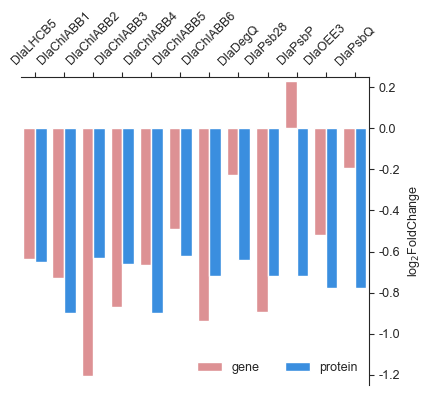

In [188]:
plot_dat2=plot_dat
plt.figure(figsize=(4.5,4))
ax=sns.barplot(x=plot_dat['name'],y=plot_dat['value'],hue=plot_dat['variable'],hue_order=['gene','protein'],palette=['#ea8488','#1f8efa'])
plt.ylim(-1.25,0.25)
# plt.ylim(0,12)
# sns.despine()
plt.legend(frameon=False,loc='lower right',ncol=2)
plt.xticks(rotation=45)
plt.xlabel('')
plt.ylabel('log$_2$FoldChange')
ax.xaxis.set_label_position('top')# 设置标签位置
ax.xaxis.tick_top() 
ax.yaxis.tick_right()                     # 刻度线到右边
ax.yaxis.set_label_position("right") 
ax.set_xticklabels(ax.get_xticklabels(),rotation=45)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
plt.savefig(pro_fp+'photosynthesis_gene_protein_FC_2.pdf',dpi=600,transparent=True,bbox_inches='tight')

### 2. PPI

In [232]:
string_MCL_cluster=pd.read_csv(pro_fp+"string_MCL_cluster_descriptions.tsv",sep='\t')

In [241]:
string_MCL_cluster

,#clustering method,cluster number,cluster color,hex color,gene count,primary description,secondary description,tertiary description,protein names,protein name
0,MCL,1,Red,#ff0000,17,-,-,-,"A0A0N7KIR1, Q75IA5_ORYSJ, Q84NX8_ORYSJ, Q6ZIA1...",A0A0N7KIR1
1,MCL,1,Red,#ff0000,17,-,-,-,"A0A0N7KIR1, Q75IA5_ORYSJ, Q84NX8_ORYSJ, Q6ZIA1...",Q75IA5_ORYSJ
2,MCL,1,Red,#ff0000,17,-,-,-,"A0A0N7KIR1, Q75IA5_ORYSJ, Q84NX8_ORYSJ, Q6ZIA1...",Q84NX8_ORYSJ
3,MCL,1,Red,#ff0000,17,-,-,-,"A0A0N7KIR1, Q75IA5_ORYSJ, Q84NX8_ORYSJ, Q6ZIA1...",Q6ZIA1_ORYSJ
4,MCL,1,Red,#ff0000,17,-,-,-,"A0A0N7KIR1, Q75IA5_ORYSJ, Q84NX8_ORYSJ, Q6ZIA1...",P0582D05.130-1
...,...,...,...,...,...,...,...,...,...,...
140,MCL,34,Hot Pink 2,#ef75c2,2,-,-,-,"Q84JG9_ORYSJ, RIBA3",RIBA3
141,MCL,35,Hot Pink,#ef75b3,1,-,-,-,Q0DJC3_ORYSJ,Q0DJC3_ORYSJ
142,MCL,36,Pale Violet Red,#ef75a3,1,-,-,-,Q0JJY1_ORYSJ,Q0JJY1_ORYSJ
143,MCL,37,Pink,#ef7594,1,-,-,-,Q7XTF0_ORYSJ,Q7XTF0_ORYSJ


In [234]:
string_MCL_cluster['protein name']=string_MCL_cluster['protein names'].str.split(', ')

In [235]:
string_MCL_cluster.explode('protein name').reset_index(drop=True).to_csv(pro_fp+"DEPs_string_MCL_cluster.txt",sep='\t',index=False)

In [236]:
osa_ma_1 = pd.read_csv('/home/qq/work/lxr/DRS/script_plot/bamv/osa_ma_1.transcript.txt',sep='\t',names=['gene_name','rice_id'])

In [242]:
osa_ma_1[osa_ma_1['gene_name'].isin(pro_abundance[pro_abundance['Dla1_(FC_1.5_label)']!='stable'].index)].to_csv(pro_fp+'osa_ma_DEPs_list.csv',index=False)

In [246]:
string_MCL_cluster=pd.read_csv(pro_fp+"DEPs_string_MCL_cluster.txt",sep='\t')
string_mapping=pd.read_csv(pro_fp+"string_mapping.tsv",sep='\t')

In [247]:
string_mapping

,#node1,node2,node1_string_id,node2_string_id,neighborhood_on_chromosome,gene_fusion,phylogenetic_cooccurrence,homology,coexpression,experimentally_determined_interaction,database_annotated,automated_textmining,combined_score,#node1_ma,node2_ma
0,A0A0N7KIR1,Q75IA5_ORYSJ,39947.A0A0N7KIR1,39947.Q75IA5,0.000,0,0.000,0.000,0.094,0.559,0.180,0.000,0.643,evm.model.FRAGSCAFF_271.277,evm.model.FRAGSCAFF_158.457
1,A0A0N7KIR1,Q338J4_ORYSJ,39947.A0A0N7KIR1,39947.Q338J4,0.000,0,0.000,0.000,0.351,0.000,0.000,0.474,0.644,evm.model.FRAGSCAFF_271.277,evm.model.FRAGSCAFF_271.36.3
2,A0A0N7KIR1,Q84NX8_ORYSJ,39947.A0A0N7KIR1,39947.Q84NX8,0.000,0,0.000,0.000,0.000,0.584,0.224,0.000,0.663,evm.model.FRAGSCAFF_271.277,evm.model.FRAGSCAFF_295.92
3,A0A0N7KIR1,Q6ZIA1_ORYSJ,39947.A0A0N7KIR1,39947.Q6ZIA1,0.000,0,0.000,0.000,0.130,0.537,0.252,0.000,0.672,evm.model.FRAGSCAFF_271.277,evm.model.FRAGSCAFF_455.272
4,A0A0N7KIR1,P0582D05.130-1,39947.A0A0N7KIR1,39947.P41095,0.000,0,0.000,0.000,0.092,0.580,0.224,0.043,0.678,evm.model.FRAGSCAFF_271.277,evm.model.ORIGINAL_4187.60
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
360,SSII-3,SUS2,39947.Q0DDE3,39947.P30298,0.046,0,0.000,0.000,0.000,0.099,0.541,0.140,0.615,evm.model.FRAGSCAFF_20.225,evm.model.FRAGSCAFF_284.449
361,SSII-3,WAXY,39947.Q0DDE3,39947.Q0DEV5,0.000,0,0.128,0.824,0.000,0.000,0.840,0.142,0.869,evm.model.FRAGSCAFF_20.225,evm.model.ORIGINAL_5229.157
362,SUS2,WAXY,39947.P30298,39947.Q0DEV5,0.046,0,0.000,0.000,0.000,0.099,0.940,0.261,0.956,evm.model.FRAGSCAFF_284.449,evm.model.ORIGINAL_5229.157
363,TUBB3,TubA,39947.Q40665,39947.Q10PW2,0.000,0,0.074,0.920,0.429,0.556,0.776,0.137,0.946,evm.model.ORIGINAL_4749.222,evm.model.FRAGSCAFF_218.69


In [244]:
string_MCL_cluster

,#clustering method,cluster number,cluster color,hex color,gene count,primary description,secondary description,tertiary description,protein names,protein name
0,MCL,1,Red,#ff0000,17,-,-,-,"A0A0N7KIR1, Q75IA5_ORYSJ, Q84NX8_ORYSJ, Q6ZIA1...",A0A0N7KIR1
1,MCL,1,Red,#ff0000,17,-,-,-,"A0A0N7KIR1, Q75IA5_ORYSJ, Q84NX8_ORYSJ, Q6ZIA1...",Q75IA5_ORYSJ
2,MCL,1,Red,#ff0000,17,-,-,-,"A0A0N7KIR1, Q75IA5_ORYSJ, Q84NX8_ORYSJ, Q6ZIA1...",Q84NX8_ORYSJ
3,MCL,1,Red,#ff0000,17,-,-,-,"A0A0N7KIR1, Q75IA5_ORYSJ, Q84NX8_ORYSJ, Q6ZIA1...",Q6ZIA1_ORYSJ
4,MCL,1,Red,#ff0000,17,-,-,-,"A0A0N7KIR1, Q75IA5_ORYSJ, Q84NX8_ORYSJ, Q6ZIA1...",P0582D05.130-1
...,...,...,...,...,...,...,...,...,...,...
140,MCL,34,Hot Pink 2,#ef75c2,2,-,-,-,"Q84JG9_ORYSJ, RIBA3",RIBA3
141,MCL,35,Hot Pink,#ef75b3,1,-,-,-,Q0DJC3_ORYSJ,Q0DJC3_ORYSJ
142,MCL,36,Pale Violet Red,#ef75a3,1,-,-,-,Q0JJY1_ORYSJ,Q0JJY1_ORYSJ
143,MCL,37,Pink,#ef7594,1,-,-,-,Q7XTF0_ORYSJ,Q7XTF0_ORYSJ


In [245]:
df_1=string_MCL_cluster.merge(string_mapping[['queryItem','preferredName','annotation']],left_on='protein names',right_on='preferredName')

KeyError: "None of [Index(['queryItem', 'preferredName', 'annotation'], dtype='object')] are in the [columns]"

In [222]:
df_2=df_1.merge(osa_ma_1,left_on='queryItem',right_on='rice_id')

In [216]:
df_2.to_csv(pro_fp+'DEPs_string_MCL_cluster.txt',index=False,sep='\t')

In [217]:
string_interactions_short = pd.read_csv(pro_fp+"string_interactions_short.tsv",sep='\t')
string_mapping = pd.read_csv(pro_fp+"string_mapping.tsv",sep='\t')

In [ ]:
string_mapping = string_mapping.merge(osa_ma_1,left_on='queryItem',right_on='rice_id')
rice_id={}
for index ,row in string_mapping.iterrows():
    rice_id[row['preferredName']]=[row['gene_name'],row['stringId']]

In [212]:
def get_node(id):
    return rice_id.get(id)[0]

In [213]:
string_interactions_short.to_csv(pro_fp+"string_mapping.tsv",sep='\t',index=False)

In [ ]:
string_interactions_short['#node1_ma']=string_interactions_short['#node1'].apply(get_node)

In [ ]:
string_interactions_short['node2_ma']=string_interactions_short['node2'].apply(get_node)

In [248]:
string_interactions_short.to_csv(pro_fp+"string_interactions_short (2).tsv",sep='\t',index=False)

In [249]:
string_node_degrees = pd.read_csv(pro_fp+"string_node_degrees (1).tsv",sep='\t')

In [250]:
string_node_degrees.columns

Index(['#node', 'identifier', 'node_degree', '#node_ma'], dtype='object')

In [251]:
string_node_degrees.merge(pro_abundance['log2fc'],left_on='#node_ma',right_index=True,how='left')

,#node,identifier,node_degree,#node_ma,log2fc
0,Os01t0121700-01,39947.Q9ARU4,0,evm.model.ORIGINAL_2449.269,-0.715718
1,Os01t0135700-01,39947.Q5ZCK5,1,evm.model.FRAGSCAFF_136.136,0.882589
2,Os01t0196600-01,39947.Q7F5L2,6,evm.model.FRAGSCAFF_226.174,-0.635899
3,Os01t0212400-01,39947.Q5QNI2,0,evm.model.FRAGSCAFF_390.222,0.882875
4,Os01t0238600-01,39947.Q9FTU2,0,evm.model.FRAGSCAFF_390.400,0.638293
...,...,...,...,...,...
274,Os12t0590500-00,39947.B9GE13,0,evm.model.FRAGSCAFF_349.207,-0.971441
275,Os12t0595800-01,39947.B7EKS1,0,evm.model.FRAGSCAFF_149.402,1.185286
276,Os12t0597400-01,39947.Q2QMN9,0,evm.model.FRAGSCAFF_349.232,-0.822686
277,Os12t0636200-01,39947.Q2QLM6,0,evm.model.FRAGSCAFF_16.106,0.694496


In [252]:
string_node_degrees.to_csv(pro_fp+"string_node_degrees (1).tsv",sep='\t',index=False)

### 3. PTR

In [9]:
inte_rna_pro_logfc=deseq2_bamv_ck_res[['log2FoldChange','gene_name']].merge(pro_abundance['log2fc'],left_on='gene_name',right_index=True).rename(columns={'log2FoldChange':'rna_logfc','log2fc':'protein_logfc'}).dropna()

In [10]:
inte_rna_pro_logfc

,rna_logfc,gene_name,protein_logfc
1,4.522568,evm.model.FRAGSCAFF_182.98,-0.254387
3,6.046171,evm.model.ORIGINAL_6592.105,1.172235
13,1.781141,evm.model.ORIGINAL_6248.285,0.149837
14,2.911880,evm.model.FRAGSCAFF_146.122,0.830567
15,1.987099,evm.model.ORIGINAL_3934.209,1.421307
...,...,...,...
50105,-0.852649,evm.model.FRAGSCAFF_218.102,0.006298
50106,-0.112749,evm.model.FRAGSCAFF_218.96,-0.408867
50273,1.310466,evm.model.FRAGSCAFF_371.12,0.369491
50325,-2.320793,evm.model.ORIGINAL_3934.52,0.913730


In [11]:
inte_rna_pro_logfc['log10_FC(pro/rna)']=np.log10(2**inte_rna_pro_logfc['protein_logfc'] / 2**inte_rna_pro_logfc['rna_logfc']).dropna()

In [257]:
inte_rna_pro_logfc.to_csv(pro_fp+'inte_rna_pro_logfc.csv',index=False)

In [13]:
inte_rna_pro_logfc

,rna_logfc,gene_name,protein_logfc,log10_FC(pro/rna)
1,4.522568,evm.model.FRAGSCAFF_182.98,-0.254387,-1.438007
3,6.046171,evm.model.ORIGINAL_6592.105,1.172235,-1.467201
13,1.781141,evm.model.ORIGINAL_6248.285,0.149837,-0.491071
14,2.911880,evm.model.FRAGSCAFF_146.122,0.830567,-0.626538
15,1.987099,evm.model.ORIGINAL_3934.209,1.421307,-0.170320
...,...,...,...,...
50105,-0.852649,evm.model.FRAGSCAFF_218.102,0.006298,0.258569
50106,-0.112749,evm.model.FRAGSCAFF_218.96,-0.408867,-0.089141
50273,1.310466,evm.model.FRAGSCAFF_371.12,0.369491,-0.283262
50325,-2.320793,evm.model.ORIGINAL_3934.52,0.913730,0.973688


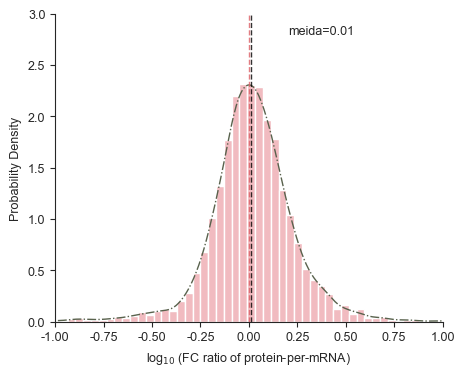

In [259]:
fig,ax=plt.subplots(figsize=(5,4))
inte_rna_pro_logfc['log10_FC(pro/rna)'].plot(kind='hist',density=True,bins=80,edgecolor="white",histtype="bar",color='#f1bbc0')
inte_rna_pro_logfc['log10_FC(pro/rna)'].plot(kind='density',linestyle='dashdot',color='#59624d',linewidth=1)
plt.ylim(0,3.0)
plt.xlim(-1,1.0)
plt.text(s='meida=%s' % (round(inte_rna_pro_logfc['log10_FC(pro/rna)'].median(),2)),x=0.2,y=2.8)
plt.vlines(x=round(inte_rna_pro_logfc['log10_FC(pro/rna)'].median(),2),ymax=3.0,ymin=0,colors='black',linewidth=1,alpha=.8,linestyles='--')
plt.xlabel(r'log$_{10}$ (FC ratio of protein-per-mRNA)')
plt.ylabel('Probability Density')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
plt.vlines(x=0,ymax=3.0,ymin=0,colors='#db5e64',linestyles='--',alpha=.8,linewidth=1)
plt.savefig(pro_fp+'all_log10FC_protein-per-mRNA_densit.pdf',transparent=True)

In [263]:
deseq2_bamv_ck_res['sig'].value_counts()

sig
none    46095
down     2164
up       2139
Name: count, dtype: int64

In [15]:
down_pro=pro_abundance[(pro_abundance['fc'] < 1/1.5) & (pro_abundance['ttest_pval1'] < 0.05)].index
up_pro=pro_abundance[(pro_abundance['fc'] > 1.5) & (pro_abundance['ttest_pval1'] < 0.05)].index
change_pro= set(up_pro) | set(up_pro)
change_rna=set(deseq2_bamv_ck_res[deseq2_bamv_ck_res['sig']!='none']['gene_name'])
change_pro_and_protein=set(change_rna | change_pro)

In [16]:
len(change_pro_and_protein)

4548

In [18]:
len(inte_rna_pro_logfc[inte_rna_pro_logfc.gene_name.isin(change_pro_and_protein)])

1394

In [274]:
inte_rna_pro_logfc[~inte_rna_pro_logfc.gene_name.isin(change_pro_and_protein)]

,rna_logfc,gene_name,protein_logfc,log10_FC(pro/rna)
448,-0.543522,evm.model.ORIGINAL_3006.119,-0.062937,0.144671
826,-0.564459,evm.model.ORIGINAL_4625.63,0.236226,0.241030
924,-0.561699,evm.model.FRAGSCAFF_102.18,-0.345569,0.065062
991,-0.557854,evm.model.FRAGSCAFF_133.44,-0.086875,0.141779
1000,-0.576686,evm.model.ORIGINAL_6124.284,-0.639363,-0.018868
...,...,...,...,...
50081,-2.092359,evm.model.FRAGSCAFF_218.265,0.126679,0.667997
50105,-0.852649,evm.model.FRAGSCAFF_218.102,0.006298,0.258569
50106,-0.112749,evm.model.FRAGSCAFF_218.96,-0.408867,-0.089141
50273,1.310466,evm.model.FRAGSCAFF_371.12,0.369491,-0.283262


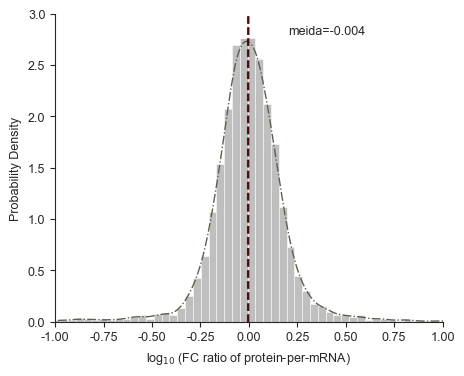

In [275]:
fig,ax=plt.subplots(figsize=(5,4))
inte_rna_pro_logfc[~inte_rna_pro_logfc.gene_name.isin(change_pro_and_protein)]['log10_FC(pro/rna)'].plot(kind='hist',density=True,bins=80,edgecolor="white",histtype="bar",color='#b8b8b8',alpha=0.9,linewidth=0.4)
inte_rna_pro_logfc[~inte_rna_pro_logfc.gene_name.isin(change_pro_and_protein)]['log10_FC(pro/rna)'].plot(kind='density',linestyle='dashdot',color='#59624d',linewidth=1)
plt.ylim(0,3.0)
plt.xlim(-1,1.0)
plt.text(s='meida=%s' % (round(inte_rna_pro_logfc[~inte_rna_pro_logfc.gene_name.isin(change_pro_and_protein)]['log10_FC(pro/rna)'].median(),3)),x=0.2,y=2.8)
plt.vlines(x=0,ymax=3.0,ymin=0,colors='#db5e64',linestyles='--',alpha=.8)
#plt.vlines(x=-0.035,ymax=3.0,ymin=0,linestyles='dotted',alpha=.8,colors='black')
#plt.text(s='meida=%s' %(-0.035),x=-0.5,y=2.3)
plt.vlines(x=round(inte_rna_pro_logfc[~inte_rna_pro_logfc.gene_name.isin(change_pro_and_protein)]['log10_FC(pro/rna)'].median(),3),ymax=3.0,ymin=0,linestyles='--',alpha=.8,colors='black')
plt.xlabel(r'log$_{10}$ (FC ratio of protein-per-mRNA)')
plt.ylabel('Probability Density')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
plt.savefig(pro_fp+'unchange_gene_log10FC_protein-per-mRNA_densit.pdf',bbox_inches='tight',transparent=True)

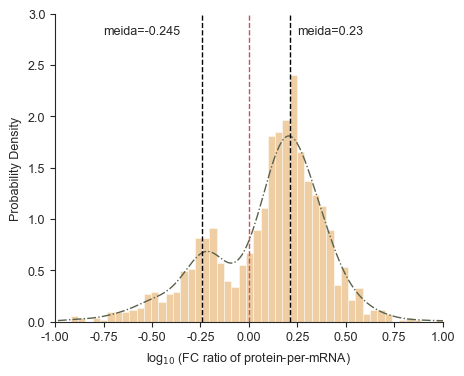

In [276]:
fig,ax=plt.subplots(figsize=(5,4))
inte_rna_pro_logfc[inte_rna_pro_logfc.gene_name.isin(change_pro_and_protein)]['log10_FC(pro/rna)'].plot(kind='hist',density=True,bins=80,histtype="bar",color='#ecc28e',linewidth=0.4,alpha=0.8,edgecolor='white')
inte_rna_pro_logfc[inte_rna_pro_logfc.gene_name.isin(change_pro_and_protein)]['log10_FC(pro/rna)'].plot(kind='density',linestyle='dashdot',color='#59624d',linewidth=1)
plt.ylim(0,3.0)
plt.xlim(-1,1.0)
plt.text(s='meida=%s' % (round(inte_rna_pro_logfc[(inte_rna_pro_logfc.gene_name.isin(change_pro_and_protein))  & (inte_rna_pro_logfc['log10_FC(pro/rna)']>0) ]['log10_FC(pro/rna)'].median(),3)),x=0.25,y=2.8)
plt.vlines(x=0,ymax=3.0,ymin=0,colors='#c5555a',linestyles='--',linewidth=1)
plt.vlines(x=-0.24,ymax=3.0,ymin=0,linestyles='--',colors='black',linewidth=1)
plt.text(s='meida=%s' %(round(inte_rna_pro_logfc[(inte_rna_pro_logfc.gene_name.isin(change_pro_and_protein))  & (inte_rna_pro_logfc['log10_FC(pro/rna)']<0) ]['log10_FC(pro/rna)'].median(),3)),x=-0.75,y=2.8)
plt.vlines(x=round(inte_rna_pro_logfc[inte_rna_pro_logfc.gene_name.isin(change_pro_and_protein)]['log10_FC(pro/rna)'].median(),2)+0.05,ymax=3.0,ymin=0,linestyles='--',colors='black',linewidth=1)
plt.xlabel(r'log$_{10}$ (FC ratio of protein-per-mRNA)')
plt.ylabel('Probability Density')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
plt.savefig(pro_fp+'change_gene_log10FC_protein-per-mRNA_densit.pdf')

/tmp/ipykernel_15975/413761040.py:16: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  plt.legend([l1,l2],labels=['Up-regulated proteins','Down-regulated proteins'],frameon=False,loc='upper left',handlelength=0.5,handletextpad=0.3)


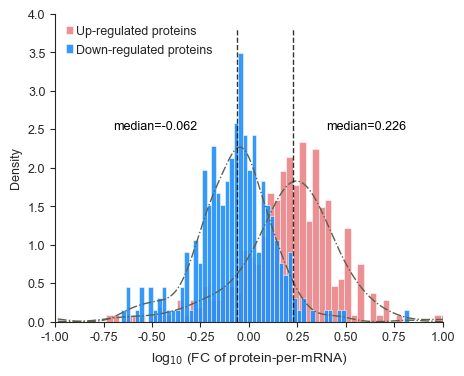

In [277]:
a=inte_rna_pro_logfc[inte_rna_pro_logfc['gene_name'].isin(set(pro_abundance[pro_abundance['Dla1_(FC_1.5_label)']=='up'].index))] 
b=inte_rna_pro_logfc[inte_rna_pro_logfc['gene_name'].isin(set(pro_abundance[pro_abundance['Dla1_(FC_1.5_label)']=='down'].index))] 
fig=plt.figure(figsize=(5,4))
# l1=sns.histplot(x=a['log10_FC(pro/rna)'],color='#800080',alpha=0.7)
# l2=sns.histplot(x=b['log10_FC(pro/rna)'],color='#1d70a9')
l1=a['log10_FC(pro/rna)'].plot(kind='hist',density=True,bins=80,edgecolor="white",histtype="bar",color='#ea8488',alpha=0.9,linewidth=0.4)
l2=b['log10_FC(pro/rna)'].plot(kind='hist',density=True,bins=80,edgecolor="white",histtype="bar",color='#1f8efa',alpha=0.9,linewidth=0.4)
a['log10_FC(pro/rna)'].plot(kind='density',linestyle='dashdot',color='#59624d',linewidth=1)
b['log10_FC(pro/rna)'].plot(kind='density',linestyle='dashdot',color='#59624d',linewidth=1)
plt.ylim(0,4.0)
plt.xlim(-1,1)
plt.text(s='median=%s' % (round(a['log10_FC(pro/rna)'].median(),3)),x=0.4,y=2.5,color='black')
plt.vlines(x=a['log10_FC(pro/rna)'].median(),ymax=3.8,ymin=0,colors='black',alpha=.8,linestyles='--',linewidth=1)
plt.vlines(x=b['log10_FC(pro/rna)'].median(),ymax=3.8,ymin=0,linestyles='--',alpha=.8,colors='black',linewidth=1)
plt.text(s='median=%s' % (round(b['log10_FC(pro/rna)'].median(),3)),x=-0.7,y=2.5,color='black')#,bbox_to_anchor=(0.47,0.1)
plt.legend([l1,l2],labels=['Up-regulated proteins','Down-regulated proteins'],frameon=False,loc='upper left',handlelength=0.5,handletextpad=0.3)
plt.xlabel(r'log$_{10}$ (FC of protein-per-mRNA)',fontsize=10)
sns.despine()
plt.savefig(pro_fp+'DE_protein_PTR_density_2.pdf',bbox_inches=False,transparent=True)


In [281]:
up_pro_illu=set(pro_abundance[pro_abundance['Dla1_(FC_1.5_label)'] =='up'].index) & set(deseq2_bamv_ck_res[deseq2_bamv_ck_res['sig']=='up'].gene_name)
down_pro_illu=set(pro_abundance[pro_abundance['Dla1_(FC_1.5_label)'] =='down'].index) & set(deseq2_bamv_ck_res[deseq2_bamv_ck_res['sig']=='down'].gene_name)

In [282]:
up_pro_gene = pro_abundance[(pro_abundance['ttest_pval1'] < 0.05) & (pro_abundance['log2fc'] > np.log2(1.5))].index
down_pro_gene = pro_abundance[(pro_abundance['ttest_pval1'] < 0.05) & (pro_abundance['log2fc'] < -np.log2(1.5))].index

In [283]:
up_illu_gene = deseq2_bamv_ck_res[(deseq2_bamv_ck_res.log2FoldChange > np.log2(1.5)) & (deseq2_bamv_ck_res.padj < 0.05)].gene_name
down_illu_gene = deseq2_bamv_ck_res[(deseq2_bamv_ck_res.log2FoldChange < -np.log2(1.5)) & (deseq2_bamv_ck_res.padj < 0.05)].gene_name

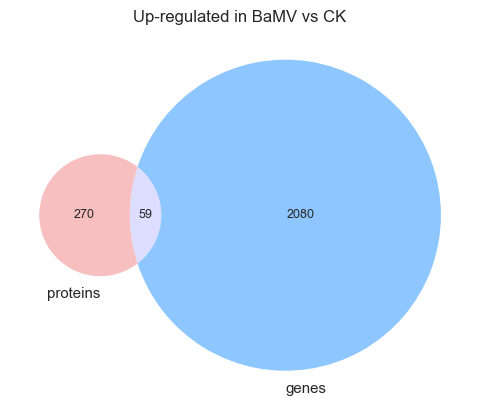

In [287]:
venn2([set(up_pro_gene),set(up_illu_gene)],set_labels=['proteins','genes'],set_colors=["lightcoral","dodgerblue"],
      alpha=0.5)
plt.title('Up-regulated in BaMV vs CK',font={'family':'Arial', 'size':12})
plt.savefig(pro_fp+'Up_regulated_pro1.5_illu1.5_venn.pdf', format='pdf', dpi=600, bbox_inches='tight',transparent = True)

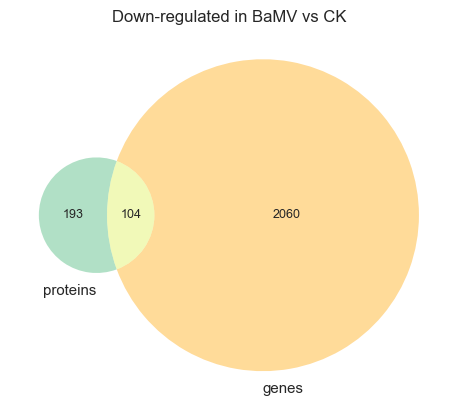

In [288]:
venn2([set(down_pro_gene),set(down_illu_gene)],set_labels=['proteins','genes'],set_colors=["mediumseagreen","orange"],
      alpha=0.4)
plt.title('Down-regulated in BaMV vs CK',font={'family':'Arial', 'size':12})
plt.savefig(pro_fp+'Down_regulated_pro1.5_illu1.5_venn.pdf', format='pdf', dpi=600, bbox_inches='tight',transparent = True)

### 4. full length RPM & Porteins relationship

In [5]:
assign=pd.read_csv("/home/qq/work/lxr/DRS/script_plot/bamv/assign.csv",index_col=0)

In [6]:
bamv_sum=len(assign[assign['sample']=='BaMV'])
ck_sum=len(assign[assign['sample']=='CK'])

In [7]:
ck_sum

838302

In [8]:
# bamv_sf=1000000 / 526971
# ck_sf=1000000 / 844249

In [9]:
bamv_sf=1000000 / 522816
ck_sf=1000000 / 838302

In [10]:
sf={'BaMV':1000000 / 522816,'CK':1000000 / 838302}

In [ ]:
full_length_count=pd.DataFrame(columns=['gene_name','count','Full_length','sample'])
for sample,samples in assign.groupby('sample'):
    for gene,temp in samples.groupby('Assigned_gene'):
        full_count=len(temp[temp['Full_length']==True])
        nonfull_count=len(temp[temp['Full_length']==False])
        full_row=pd.DataFrame([{'gene_id':gene,'count':full_count,'RPM':full_count*sf[sample],'Full_length':True,'sample':sample}])
        nonfull_row=pd.DataFrame([{'gene_id':gene,'count':nonfull_count,'RPM':nonfull_count*sf[sample],'Full_length':False,'sample':sample}])
        full_length_count=pd.concat([full_length_count,full_row], ignore_index=True)
        full_length_count=pd.concat([full_length_count,nonfull_row], ignore_index=True)

In [ ]:
full_length_count['gene_name']=full_length_count['gene_id'].apply(get_transcript)

In [ ]:
full_length_count[(full_length_count['gene_name']=='evm.model.FRAGSCAFF_1.28')]['RPM'].replace(0,np.NAN).dropna()

In [ ]:
pd.DataFrame(assign[(assign['Full_length']==True) & (assign['sample']=='CK')].gene_name.unique(),columns=['id']).to_csv(full_fp+'ck_fullreads_gene.csv',index=False)
pd.DataFrame(assign[(assign['Full_length']==False) & (assign['sample']=='CK')].gene_name.unique(),columns=['id']).to_csv(full_fp+'ck_nonfullreads_gene.csv',index=False)
pd.DataFrame(assign[(assign['Full_length']==True) & (assign['sample']=='BaMV')].gene_name.unique(),columns=['id']).to_csv(full_fp+'bamv_fullreads_gene.csv',index=False)
pd.DataFrame(assign[(assign['Full_length']==False) & (assign['sample']=='BaMV')].gene_name.unique(),columns=['id']).to_csv(full_fp+'bamv_nonfullreads_gene.csv',index=False)

In [69]:
pro_abundance.columns

Index(['bamv_rep1(Normalized)', 'bamv_rep2(Normalized)',
       'bamv_rep3(Normalized)', 'ck_rep1(Normalized)', 'ck_rep2(Normalized)',
       'ck_rep3(Normalized)', 'log2fc', 'fc', 'ttest_pval1',
       'Dla1_(FC_1.5_label)', 'Dla1_(FC_1.3_label)', 'bamv_pro(Normalized)',
       'ck_pro(Normalized)', 'bamv_rep1(Scaled)', 'bamv_rep2(Scaled)',
       'bamv_rep3(Scaled)', 'ck_rep1(Scaled)', 'ck_rep2(Scaled)',
       'ck_rep3(Scaled)', 'bamv_pro(Scaled)', 'ck_pro(Scaled)'],
      dtype='object')

In [ ]:
full_length_count_ck=full_length_count[full_length_count['sample']=='CK'].merge(pro_abundance['ck_pro(Normalized)'],left_on='gene_id',right_index=True,how='left').rename(columns={"ck_pro(Normalized)":'pro_Normalized'})

In [ ]:
full_length_count_bamv=full_length_count[full_length_count['sample']=='BaMV'].merge(pro_abundance['bamv_pro(Normalized)'],left_on='gene_id',right_index=True,how='left').rename(columns={"bamv_pro(Normalized)":'pro_Normalized'})

In [ ]:
full_length_count=pd.concat([full_length_count_ck,full_length_count_bamv])

In [82]:
full_length_count.to_csv(full_fp+'full_length_count.csv',index=False)

In [15]:
full_length_count=pd.read_csv(full_fp+'full_length_count.csv')

In [16]:
full_length_count

,gene_id,count,Full_length,sample,RPM,gene_name,pro_Normalized
0,evm.TU.FRAGSCAFF_1.28,1,True,CK,1.184485,evm.model.FRAGSCAFF_1.28,NaN
1,evm.TU.FRAGSCAFF_1.28,14,False,CK,16.582785,evm.model.FRAGSCAFF_1.28,NaN
2,evm.TU.FRAGSCAFF_1.32,0,True,CK,0.000000,evm.model.FRAGSCAFF_1.32,NaN
3,evm.TU.FRAGSCAFF_1.32,1,False,CK,1.184485,evm.model.FRAGSCAFF_1.32,NaN
4,evm.TU.FRAGSCAFF_1.33,0,True,CK,0.000000,evm.model.FRAGSCAFF_1.33,2790.733333
...,...,...,...,...,...,...,...
112011,evm.TU.ORIGINAL_981.88,1,False,BaMV,1.897638,evm.model.ORIGINAL_981.88,NaN
112012,evm.TU.ORIGINAL_981.98,0,True,BaMV,0.000000,evm.model.ORIGINAL_981.98,2637.366667
112013,evm.TU.ORIGINAL_981.98,6,False,BaMV,11.385826,evm.model.ORIGINAL_981.98,2637.366667
112014,evm.TU.ORIGINAL_981.99,1,True,BaMV,1.897638,evm.model.ORIGINAL_981.99,NaN


In [40]:
dat=full_length_count[~(full_length_count['RPM'].replace(0,np.NAN).isna()) & ~(full_length_count['pro_Normalized'].isna())]

In [41]:
dat['RPM']=dat.apply(lambda row:row['count']*ck_sf if row['sample']=='CK' else row['count']*bamv_sf,axis=1)

/tmp/ipykernel_49458/1009080360.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dat['RPM']=dat.apply(lambda row:row['count']*ck_sf if row['sample']=='CK' else row['count']*bamv_sf,axis=1)


In [47]:
dat

,gene_id,count,Full_length,sample,RPM,gene_name,pro_Normalized
5,evm.TU.FRAGSCAFF_1.33,19,False,CK,22.664863,evm.model.FRAGSCAFF_1.33,2790.733333
12,evm.TU.FRAGSCAFF_1.45_evm.TU.FRAGSCAFF_1.47,258,True,CK,307.764982,evm.model.FRAGSCAFF_1.45_evm.model.FRAGSCAFF_1.47,26018.300000
13,evm.TU.FRAGSCAFF_1.45_evm.TU.FRAGSCAFF_1.47,280,False,CK,334.008508,evm.model.FRAGSCAFF_1.45_evm.model.FRAGSCAFF_1.47,26018.300000
20,evm.TU.FRAGSCAFF_102.11,252,True,CK,300.607657,evm.model.FRAGSCAFF_102.11,17068.066667
21,evm.TU.FRAGSCAFF_102.11,1878,False,CK,2240.242776,evm.model.FRAGSCAFF_102.11,17068.066667
...,...,...,...,...,...,...,...
111991,evm.TU.ORIGINAL_981.198,7,False,BaMV,13.389032,evm.model.ORIGINAL_981.198,1807.866667
111993,evm.TU.ORIGINAL_981.201,1,False,BaMV,1.912719,evm.model.ORIGINAL_981.201,2157.666667
112006,evm.TU.ORIGINAL_981.81,15,True,BaMV,28.690782,evm.model.ORIGINAL_981.81,469.166667
112007,evm.TU.ORIGINAL_981.81,19,False,BaMV,36.341657,evm.model.ORIGINAL_981.81,469.166667


In [132]:
dat=full_length_count[~(full_length_count['RPM'].replace(0,np.NAN).isna()) & ~(full_length_count['pro_Normalized'].isna())]

In [135]:
full_nonfull_rpm_pro_dat=dat

0.323484889004539
0.2944827243489976


/tmp/ipykernel_49458/78383135.py:22: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  plt.legend([l_CK,l_BaMV],labels=['CK n=3901','BaMV n=3163'],frameon=False)


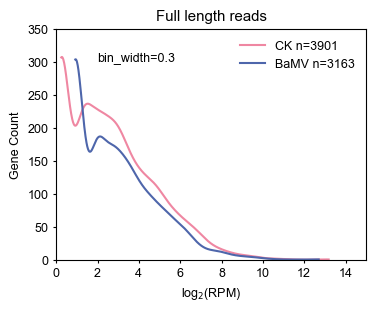

In [139]:
plt.figure(figsize=(4,3))
sample_c={'CK':"#ef87a2",'BaMV':"#4e66ab"}
for sample in ['CK','BaMV']:
    data=np.log2(full_nonfull_rpm_pro_dat[(full_nonfull_rpm_pro_dat['sample']==sample) & (full_nonfull_rpm_pro_dat['Full_length']==True)]['RPM'])
    count, bins, ignored = plt.hist(data, bins=40, alpha=0, density=False)
    # sns.histplot(x=np.log2(pro_abundance['ck_pro(Normalized)'].dropna()),kde=True)
    kde=gaussian_kde(data)
    x=np.linspace(min(data),max(data),1000)
##计算kde并调整y轴为频率 频率=kde*binwidth*data_n
    kde_values=kde(x)
    bin_width=np.diff(bins)[0]##每个bin宽度
    kde_values=kde_values*bin_width*len(data)
    locals()['l_'+sample]=plt.plot(x,kde_values,color=sample_c[sample],lw=1.5)
    print(bin_width)

#l1=sns.kdeplot(x=np.log2(full_nonfull_rpm_pro_dat[(full_nonfull_rpm_pro_dat['sample']=='CK') & (full_nonfull_rpm_pro_dat['Full_length']==True)]['RPM']+1),color='#ef87a2')
#l2=sns.kdeplot(x=np.log2(full_nonfull_rpm_pro_dat[(full_nonfull_rpm_pro_dat['sample']=='BaMV') & (full_nonfull_rpm_pro_dat['Full_length']==True)]['RPM']+1),color='#4e66ab')
plt.xlim(0,15)
plt.ylim(0,350)
# plt.yticks(np.arange(0,0.5,0.1),labels=[0,0.1,0.2,0.3,0.4])
plt.tick_params(length=2,labelsize=9)
plt.legend([l_CK,l_BaMV],labels=['CK n=3901','BaMV n=3163'],frameon=False)
plt.xlabel('log$_2$(RPM)')
plt.title('Full length reads')
plt.text(2,300,'bin_width=%s' % (round(bin_width,1)))
plt.ylabel('Gene Count')
plt.savefig(full_fp+'Full length reads density.pdf',bbox_inches='tight')

0.34225813556341544
0.3174404799769679


/tmp/ipykernel_49458/1592627183.py:23: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  plt.legend([l_CK,l_BaMV],labels=['CK n=6413','BaMV n=6294'],frameon=False)


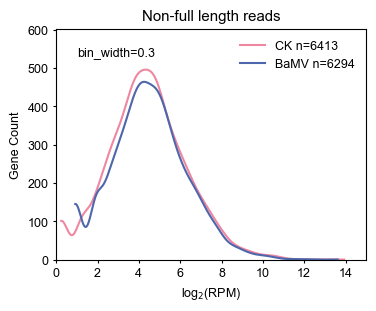

In [142]:
plt.figure(figsize=(4,3))
sample_c={'CK':"#ef87a2",'BaMV':"#4e66ab"}
for sample in ['CK','BaMV']:
    data=np.log2(full_nonfull_rpm_pro_dat[(full_nonfull_rpm_pro_dat['sample']==sample) & (full_nonfull_rpm_pro_dat['Full_length']==False)]['RPM'])
    count, bins, ignored = plt.hist(data, bins=40, alpha=0, density=False)
    # sns.histplot(x=np.log2(pro_abundance['ck_pro(Normalized)'].dropna()),kde=True)
    kde=gaussian_kde(data)
    x=np.linspace(min(data),max(data),1000)
##计算kde并调整y轴为频率 频率=kde*binwidth*data_n
    kde_values=kde(x)
    bin_width=np.diff(bins)[0]##每个bin宽度
    kde_values=kde_values*bin_width*len(data)
    locals()['l_'+sample]=plt.plot(x,kde_values,color=sample_c[sample],lw=1.5)
    print(bin_width)
# l1=sns.kdeplot(x=np.log2(full_nonfull_rpm_pro_dat[(full_nonfull_rpm_pro_dat['sample']=='CK') & (full_nonfull_rpm_pro_dat['Full_length']==False)]['RPM']+1),color='#ef87a2')
# l2=sns.kdeplot(x=np.log2(full_nonfull_rpm_pro_dat[(full_nonfull_rpm_pro_dat['sample']=='BaMV') & (full_nonfull_rpm_pro_dat['Full_length']==False)]['RPM']+1),color='#4e66ab')
plt.xlim(0,15)
# plt.ylim(0,0.27)
plt.tick_params(length=2,labelsize=9)
yticks_positions = ax.get_yticks()
plt.text(1,530,'bin_width=%s' % (round(bin_width,1)))
plt.ylabel('Gene Count')
plt.legend([l_CK,l_BaMV],labels=['CK n=6413','BaMV n=6294'],frameon=False)
plt.xlabel('log$_2$(RPM)')

plt.title('Non-full length reads')
plt.savefig(full_fp+'Non-full length reads density.pdf',bbox_inches='tight')

0.14871841588329238
0.14391065839704087


/tmp/ipykernel_49458/3800372359.py:23: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  plt.legend([l_ck,l_bamv],labels=['CK n=7037','BaMV n=7037'],frameon=False)


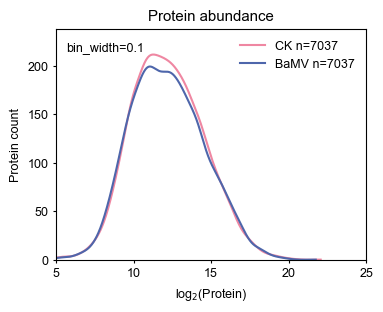

In [143]:
fig = plt.figure(figsize=(4,3))
sample_c={'ck':"#ef87a2",'bamv':"#4e66ab"}
for sample in ['ck','bamv']:
    data=np.log2(pro_abundance[sample+'_pro(Normalized)'].dropna())
    count, bins, ignored = plt.hist(data, bins=100, alpha=0, density=False)
    # sns.histplot(x=np.log2(pro_abundance['ck_pro(Normalized)'].dropna()),kde=True)
    kde=gaussian_kde(data)
    x=np.linspace(min(data),max(data),1000)
##计算kde并调整y轴为频率 频率=kde*binwidth*data_n
    kde_values=kde(x)
    bin_width=np.diff(bins)[0]##每个bin宽度
    kde_values=kde_values*bin_width*len(data)
    locals()['l_'+sample]=plt.plot(x,kde_values,color=sample_c[sample],lw=1.5)
    print(bin_width)
# l1=sns.histplot(x=data,color='#ef87a2',alpha=0.3,edgecolor=None)
# l2=sns.histplot(x=np.log2(pro_abundance['bamv_pro(Normalized)'].dropna()),color='#4e66ab',alpha=0.3,edgecolor=None)
plt.tick_params(length=2,labelsize=9)
# plt.ylim(0,0.22)
plt.xlabel(r'log$_2$(Protein)')
plt.xlim(5,20)
plt.text(5.5,215,'bin_width=%s' % (round(bin_width,1)))
plt.xticks(np.arange(5,25,4),labels=[5,10,15,20,25])
plt.legend([l_ck,l_bamv],labels=['CK n=7037','BaMV n=7037'],frameon=False)
plt.title('Protein abundance')
plt.ylabel('Protein count')
plt.savefig(full_fp+'protein abundance density.pdf',bbox_inches='tight')

#### (1) Pearson's correlation coefficient in diffenrent RPM cutoff

In [21]:
def get_label(rpm):
    log2rpm=np.log2(rpm)
    label=''
    if log2rpm >=9:
        label=9
    elif log2rpm >=6:
        label=6
    elif log2rpm >=1:
        label=1
    else:
        label='other'
    return label
dat['log2rpm_label']=dat['RPM'].apply(get_label)

/tmp/ipykernel_49458/1472183734.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dat['log2rpm_label']=dat['RPM'].apply(get_label)


In [22]:
dat

,gene_id,count,Full_length,sample,RPM,gene_name,pro_Normalized,log2rpm_label
5,evm.TU.FRAGSCAFF_1.33,19,False,CK,22.664863,evm.model.FRAGSCAFF_1.33,2790.733333,1
12,evm.TU.FRAGSCAFF_1.45_evm.TU.FRAGSCAFF_1.47,258,True,CK,307.764982,evm.model.FRAGSCAFF_1.45_evm.model.FRAGSCAFF_1.47,26018.300000,6
13,evm.TU.FRAGSCAFF_1.45_evm.TU.FRAGSCAFF_1.47,280,False,CK,334.008508,evm.model.FRAGSCAFF_1.45_evm.model.FRAGSCAFF_1.47,26018.300000,6
20,evm.TU.FRAGSCAFF_102.11,252,True,CK,300.607657,evm.model.FRAGSCAFF_102.11,17068.066667,6
21,evm.TU.FRAGSCAFF_102.11,1878,False,CK,2240.242776,evm.model.FRAGSCAFF_102.11,17068.066667,9
...,...,...,...,...,...,...,...,...
111991,evm.TU.ORIGINAL_981.198,7,False,BaMV,13.389032,evm.model.ORIGINAL_981.198,1807.866667,1
111993,evm.TU.ORIGINAL_981.201,1,False,BaMV,1.912719,evm.model.ORIGINAL_981.201,2157.666667,other
112006,evm.TU.ORIGINAL_981.81,15,True,BaMV,28.690782,evm.model.ORIGINAL_981.81,469.166667,1
112007,evm.TU.ORIGINAL_981.81,19,False,BaMV,36.341657,evm.model.ORIGINAL_981.81,469.166667,1


In [23]:
log2rpm_pro_cor=pd.DataFrame(columns=['log2rpm_label','sample','full_length','cor','pv','gene_n'])
for sample,samples in dat.groupby('sample'):
    for full,temps in samples.groupby('Full_length'):
        for label,temp in temps.groupby('log2rpm_label'):
            gene_n=len(temp)
            rpm_v=np.log2(temp['RPM'])
            pro_v=np.log2(temp['pro_Normalized'])
            cor,pv=pearsonr(rpm_v,pro_v)
            log2rpm_pro_cor_row=pd.DataFrame([{'log2rpm_label':label,'sample':sample,'full_length':full,'cor':cor,'pv':pv,'gene_n':gene_n}])
            log2rpm_pro_cor=pd.concat([log2rpm_pro_cor,log2rpm_pro_cor_row],ignore_index=True)

/tmp/ipykernel_49458/2677593016.py:10: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  log2rpm_pro_cor=pd.concat([log2rpm_pro_cor,log2rpm_pro_cor_row],ignore_index=True)
/tmp/ipykernel_49458/2677593016.py:8: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  cor,pv=pearsonr(rpm_v,pro_v)
/tmp/ipykernel_49458/2677593016.py:8: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  cor,pv=pearsonr(rpm_v,pro_v)
/tmp/ipykernel_49458/2677593016.py:8: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  cor,pv=pearsonr(rpm_v,pro_v)
/tmp/ipykernel_49458/2677593016.py:8: ConstantInputWarning: An input array is constant; the c

In [147]:
df

,log2rpm_label,sample,full_length,cor,pv,gene_n
0,1,BaMV,False,0.259860,1.838370e-73,4704
1,6,BaMV,False,0.171736,5.280696e-09,1141
2,9,BaMV,False,0.093742,4.022086e-01,82
3,other,BaMV,False,NaN,NaN,367
8,1,CK,False,0.268809,9.762685e-83,4953
9,6,CK,False,0.212780,6.998795e-13,1115
10,9,CK,False,0.155534,1.281977e-01,97
11,other,CK,False,NaN,NaN,248


In [24]:
log2rpm_pro_cor[log2rpm_pro_cor['full_length']==True]

,log2rpm_label,sample,full_length,cor,pv,gene_n
4,1,BaMV,True,0.103450,4.180848e-06,1971
5,6,BaMV,True,0.133830,5.337711e-02,209
6,9,BaMV,True,0.260239,2.678107e-01,20
7,other,BaMV,True,NaN,NaN,963
12,1,CK,True,0.131455,9.252208e-12,2669
13,6,CK,True,0.213102,3.373608e-04,279
14,9,CK,True,0.278592,1.774904e-01,25
15,other,CK,True,NaN,NaN,928


/tmp/ipykernel_31278/1534968610.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['sample']=pd.Categorical(df['sample'],categories=['CK','BaMV'],ordered=True)
/tmp/ipykernel_31278/1534968610.py:12: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  ax[0].legend([a_1],labels=['',f'Log2(RPM)>=1, n=2675 1971','Log2(RPM)>=6, n=273 209','Log2(RPM)>=9, n=25 20',''],frameon=False,loc='lower left',fontsize=9)
/tmp/ipykernel_31278/1534968610.py:13: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  ax[1].legend([a_1],labels=['',f'Log2(RPM)>=1, n=4953 4704 ','Log2(RPM)>=6, n=1115 1141','Log2(RPM)>=9, n=97 82',''],frameon=False,loc='lower right',fontsize=9,bbox_to_ancho

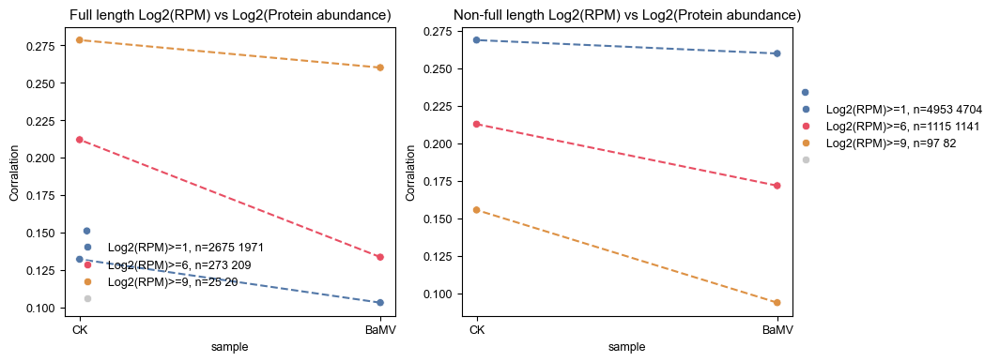

In [151]:
fig,ax=plt.subplots(1,2,figsize=(10,4))
full_ty={True:'Full',False:'Non-full'}
for ty,i in zip([True,False],range(2)):
    df=log2rpm_pro_cor[log2rpm_pro_cor['full_length']==ty]
    df['sample']=pd.Categorical(df['sample'],categories=['CK','BaMV'],ordered=True)
    a_1=sns.scatterplot(data=df,x='sample',y='cor',hue='log2rpm_label',palette=["#5378a8","#e84e63","#dd9144",'#c8c8c8'],ax=ax[i])
    label_c={1:"#5378a8",6:"#e84e63",9:"#dd9144",'other':'#c8c8c8'}
    for label in label_c.keys():
        ax[i].plot([1,0],df[df['log2rpm_label']==label]['cor'],linestyle='--',color=label_c[label])
    ax[i].set_ylabel('Corralation')
    ax[i].set_title(full_ty[ty]+' length Log2(RPM) vs Log2(Protein abundance)')
    ax[0].legend([a_1],labels=['',f'Log2(RPM)>=1, n=2675 1971','Log2(RPM)>=6, n=273 209','Log2(RPM)>=9, n=25 20',''],frameon=False,loc='lower left',fontsize=9)
    ax[1].legend([a_1],labels=['',f'Log2(RPM)>=1, n=4953 4704 ','Log2(RPM)>=6, n=1115 1141','Log2(RPM)>=9, n=97 82',''],frameon=False,loc='lower right',fontsize=9,bbox_to_anchor=(1.6, 0.5), borderaxespad=0.)
plt.savefig(full_fp+'full_nonfull_rpm_pro_cor.pdf',bbox_inches='tight')

In [153]:
df

,log2rpm_label,sample,full_length,cor,pv,gene_n
0,1,BaMV,False,0.259860,1.838370e-73,4704
1,6,BaMV,False,0.171736,5.280696e-09,1141
2,9,BaMV,False,0.093742,4.022086e-01,82
3,other,BaMV,False,NaN,NaN,367
8,1,CK,False,0.268809,9.762685e-83,4953
9,6,CK,False,0.212780,6.998795e-13,1115
10,9,CK,False,0.155534,1.281977e-01,97
11,other,CK,False,NaN,NaN,248


In [154]:
df.to_csv(full_fp+'nonfull_kegg_term_cor_changed_pvalue.csv',index=False)

#### (2) Pearson coeffecient change from various KEGG enriched gene cluster in BaMV vs CK

In [19]:
full_fp='/home/qq/work/lxr/DRS/script_plot/bamv/full length/'
bamv_full_length_kegg = pd.read_csv(full_fp+"bamv_full_length_kegg.csv")
bamv_nonfull_length_kegg = pd.read_csv(full_fp+"bamv_nonfull_length_kegg.csv")
ck_full_length_kegg = pd.read_csv(full_fp+"ck_full_length_kegg.csv")
ck_nonfull_length_kegg = pd.read_csv(full_fp+"ck_nonfull_length_kegg.csv")

In [20]:
bamv_full_length_kegg

,ID,Description,GeneRatio,BgRatio,pvalue,p.adjust,qvalue,geneID,Count
0,K03671,thioredoxin 1,36/8163,115/97265,1.864482e-12,3.061479e-09,2.590648e-09,evm.model.FRAGSCAFF_250.709/evm.model.ORIGINAL...,36
1,K02183,calmodulin,33/8163,139/97265,3.705566e-08,2.884870e-05,2.441200e-05,evm.model.FRAGSCAFF_301.676/evm.model.ORIGINAL...,33
2,K01092,myo-inositol-1(or 4)-monophosphatase [EC:3.1.3...,16/8163,40/97265,5.270773e-08,2.884870e-05,2.441200e-05,evm.model.FRAGSCAFF_268.728/evm.model.FRAGSCAF...,16
3,K22376,E3 ubiquitin-protein ligase KCMF1 [EC:2.3.2.27],15/8163,39/97265,2.538395e-07,1.042011e-04,8.817582e-05,evm.model.ORIGINAL_3707.32_evm.model.ORIGINAL_...,15
4,K03676,glutaredoxin 3,22/8163,82/97265,7.203188e-07,2.050337e-04,1.735012e-04,evm.model.FRAGSCAFF_250.368/evm.model.FRAGSCAF...,22
...,...,...,...,...,...,...,...,...,...
317,K09753,cinnamoyl-CoA reductase [EC:1.2.1.44],12/8163,84/97265,4.765815e-02,2.460839e-01,2.082382e-01,evm.model.ORIGINAL_5142.208/evm.model.FRAGSCAF...,12
318,K08967,"1,2-dihydroxy-3-keto-5-methylthiopentene dioxy...",4/8163,17/97265,4.867863e-02,2.482308e-01,2.100549e-01,evm.model.FRAGSCAFF_223.1302/evm.model.FRAGSCA...,4
319,K13137,serine-threonine kinase receptor-associated pr...,4/8163,17/97265,4.867863e-02,2.482308e-01,2.100549e-01,evm.model.FRAGSCAFF_197.555/evm.model.ORIGINAL...,4
320,K20362,protein transport protein YIF1,4/8163,17/97265,4.867863e-02,2.482308e-01,2.100549e-01,evm.model.ORIGINAL_5397.116/evm.model.ORIGINAL...,4


In [49]:
np.log2(rpm_l)

58182     5.968599
58442     0.924205
60698     7.782186
65504     5.246133
66556     0.924205
68688     2.924205
73696     2.509167
76600     3.731559
79688     6.209607
81512     2.509167
91166     2.924205
92944     3.509167
95546     4.094130
95658     3.246133
96274     2.924205
98234     5.624644
101980    7.782186
102646    6.133658
102808    6.447766
106370    6.924205
106964    4.624644
109996    1.924205
Name: RPM, dtype: float64

In [50]:
np.log2(pro_l)

evm.model.ORIGINAL_5718.383      14.447774
evm.model.FRAGSCAFF_113.116      13.888930
evm.model.ORIGINAL_4288.205      12.875513
evm.model.FRAGSCAFF_331.47       11.643405
evm.model.FRAGSCAFF_250.709      11.820365
evm.model.FRAGSCAFF_129.911      12.084122
evm.model.ORIGINAL_1374.25       11.684939
evm.model.ORIGINAL_2314.273      12.491536
evm.model.FRAGSCAFF_371.537      11.673854
evm.model.ORIGINAL_4665.157      11.285287
evm.model.ORIGINAL_2711.34        7.029747
evm.model.ORIGINAL_5780.248.1    10.981758
evm.model.FRAGSCAFF_68.215       11.682439
evm.model.ORIGINAL_2094.45       11.127779
evm.model.FRAGSCAFF_283.2        10.855959
evm.model.ORIGINAL_6724.258       9.441077
evm.model.FRAGSCAFF_212.46       11.066470
evm.model.FRAGSCAFF_184.178.1     9.727126
evm.model.ORIGINAL_4683.87       10.228899
evm.model.FRAGSCAFF_116.99        9.672249
evm.model.ORIGINAL_2088.100       9.079129
evm.model.FRAGSCAFF_190.1205          -inf
Name: bamv_pro(Normalized), dtype: float64

In [ ]:
dat=full_length_count[~(full_length_count['RPM'].replace(0,np.NAN).isna()) & ~(full_length_count['pro_Normalized'].isna())]

In [99]:
#bamv_full_cor,bamv_non_cor,ck_full_cor,ck_non_cor={},{},{},{}
#full_cor_pv={}
df_2=pd.DataFrame()
ty_bool={'full':True,'nonfull':False}
sample_n={'bamv':'BaMV','ck':'CK'}
for sample in ['bamv','ck']:
    for ty in ['full','nonfull']:
        df=eval(sample+'_'+ty+'_length_kegg')
        print(sample+'_'+ty+'_length_kegg')
        add_l=pd.DataFrame(columns=['GO','Des','count','geneID','cor','pv','label'])
        for index,row in df.iterrows():            
            go_id=row['ID']
            go_Des=row['Description']
            genes=row['geneID'].split('/')
            #temp=full_length_count[(full_length_count['gene_name'].isin(genes)) & (full_length_count['Full_length']==ty_bool[ty]) & (full_length_count['sample']==sample_n[sample]) & (full_length_count['RPM']!=0)]
            #temp=full_length_count[(full_length_count['gene_name'].isin(genes)) & (full_length_count['Full_length']==ty_bool[ty]) & (full_length_count['sample']==sample_n[sample])].fillna(0)
            temp=dat[(dat['gene_name'].isin(genes)) & (dat['Full_length']==ty_bool[ty]) & (dat['sample']==sample_n[sample])].fillna(0)            
            # temp_2=pro_abundance[(pro_abundance.index.isin(genes))].fillna(0)
            # gene_s=set(temp_2.index) & set(temp['gene_name'].unique())
            # rpm_l=temp[temp['gene_name'].isin(gene_s)]['RPM'].dropna()#.replace(0,np.NAN).dropna()
            # pro_l=temp_2[temp_2.index.isin(gene_s)][sample+'_pro(Normalized)'].dropna()
            rpm_l=temp['RPM']
            pro_l=temp['pro_Normalized']
            if len(rpm_l) >=2 and len(pro_l)>=2:
                cor,pv=pearsonr(np.log2(rpm_l+1),np.log2(pro_l+1))
                if go_id=='K01623':
                    print(cor,pv,rpm_l,temp,pro_l,temp_2)
                #if pv <0.05:
                new_row=pd.DataFrame([{'GO':go_id,'Des':go_Des,'count':row['Count'],'geneID':row['geneID'],'cor':cor,'pv':pv,'label':ty+'_'+sample}])
                add_l=pd.concat([add_l,new_row],ignore_index=True)
        #df_2=pd.DataFrame(add_l)
        #df=df.merge(add_l,left_on='ID',right_on='GO')
        df_2=pd.concat([df_2,add_l])

bamv_full_length_kegg
0.6078503929643517 0.027534193079499912 57964     174.057412
58234     185.533725
60730      17.214469
77738     101.374097
86136     172.144693
86934      59.294283
89156       1.912719
96248      11.476313
102950      5.738156
104266     24.865345
106406     49.730689
107088      1.912719
110880      3.825438
Name: RPM, dtype: float64                          gene_id  count  Full_length sample         RPM  \
57964    evm.TU.FRAGSCAFF_102.11     91         True   BaMV  174.057412   
58234   evm.TU.FRAGSCAFF_113.202     97         True   BaMV  185.533725   
60730   evm.TU.FRAGSCAFF_129.961      9         True   BaMV   17.214469   
77738   evm.TU.FRAGSCAFF_294.209     53         True   BaMV  101.374097   
86136   evm.TU.FRAGSCAFF_425.281     90         True   BaMV  172.144693   
86934     evm.TU.FRAGSCAFF_43.87     31         True   BaMV   59.294283   
89156    evm.TU.FRAGSCAFF_50.622      1         True   BaMV    1.912719   
96248    evm.TU.ORIGINAL_2314.25      6

/tmp/ipykernel_49458/1245407776.py:30: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  add_l=pd.concat([add_l,new_row],ignore_index=True)
/tmp/ipykernel_49458/1245407776.py:25: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  cor,pv=pearsonr(np.log2(rpm_l+1),np.log2(pro_l+1))


bamv_nonfull_length_kegg


/tmp/ipykernel_49458/1245407776.py:30: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  add_l=pd.concat([add_l,new_row],ignore_index=True)


0.6419281850034966 0.013323518014607207 57965     1862.988126
58235     1597.120211
60731      164.493818
67699      185.533725
77739     1013.740972
86137     1157.194883
86935      350.027543
89157      101.374097
96249      107.112254
102951      21.039907
104267     237.177133
106407     522.172237
107089       5.738156
110881      11.476313
Name: RPM, dtype: float64                          gene_id  count  Full_length sample          RPM  \
57965    evm.TU.FRAGSCAFF_102.11    974        False   BaMV  1862.988126   
58235   evm.TU.FRAGSCAFF_113.202    835        False   BaMV  1597.120211   
60731   evm.TU.FRAGSCAFF_129.961     86        False   BaMV   164.493818   
67699   evm.TU.FRAGSCAFF_197.652     97        False   BaMV   185.533725   
77739   evm.TU.FRAGSCAFF_294.209    530        False   BaMV  1013.740972   
86137   evm.TU.FRAGSCAFF_425.281    605        False   BaMV  1157.194883   
86935     evm.TU.FRAGSCAFF_43.87    183        False   BaMV   350.027543   
89157    evm.TU.FR

/tmp/ipykernel_49458/1245407776.py:25: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  cor,pv=pearsonr(np.log2(rpm_l+1),np.log2(pro_l+1))


ck_full_length_kegg
0.7094273394644561 0.00976729766243724 20       300.607657
326      223.069968
3038      32.207963
21132    209.948205
30084    246.927718
30960    107.359877
33342      8.350213
40980     29.822188
48150      5.964438
49628     35.786626
51958    108.552765
56754      5.964438
Name: RPM, dtype: float64                         gene_id  count  Full_length sample         RPM  \
20      evm.TU.FRAGSCAFF_102.11    252         True     CK  300.607657   
326    evm.TU.FRAGSCAFF_113.202    187         True     CK  223.069968   
3038   evm.TU.FRAGSCAFF_129.961     27         True     CK   32.207963   
21132  evm.TU.FRAGSCAFF_294.209    176         True     CK  209.948205   
30084  evm.TU.FRAGSCAFF_425.281    207         True     CK  246.927718   
30960    evm.TU.FRAGSCAFF_43.87     90         True     CK  107.359877   
33342   evm.TU.FRAGSCAFF_50.622      7         True     CK    8.350213   
40980   evm.TU.ORIGINAL_2314.25     25         True     CK   29.822188   
48150   e

/tmp/ipykernel_49458/1245407776.py:30: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  add_l=pd.concat([add_l,new_row],ignore_index=True)
/tmp/ipykernel_49458/1245407776.py:25: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  cor,pv=pearsonr(np.log2(rpm_l+1),np.log2(pro_l+1))


ck_nonfull_length_kegg
0.8011424273454963 0.0005729483493685053 21       2240.242776
327      1677.199864
3039      202.790880
10443     212.333980
21133    1454.129896
30085    1664.078101
30961     763.448018
33343      63.223039
40981     201.597992
48151      35.786626
49629     255.277931
51959     567.814463
52671       2.385775
56755      19.086200
Name: RPM, dtype: float64                         gene_id  count  Full_length sample          RPM  \
21      evm.TU.FRAGSCAFF_102.11   1878        False     CK  2240.242776   
327    evm.TU.FRAGSCAFF_113.202   1406        False     CK  1677.199864   
3039   evm.TU.FRAGSCAFF_129.961    170        False     CK   202.790880   
10443  evm.TU.FRAGSCAFF_197.652    178        False     CK   212.333980   
21133  evm.TU.FRAGSCAFF_294.209   1219        False     CK  1454.129896   
30085  evm.TU.FRAGSCAFF_425.281   1395        False     CK  1664.078101   
30961    evm.TU.FRAGSCAFF_43.87    640        False     CK   763.448018   
33343   evm.TU.F

/tmp/ipykernel_49458/1245407776.py:30: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  add_l=pd.concat([add_l,new_row],ignore_index=True)
/tmp/ipykernel_49458/1245407776.py:25: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  cor,pv=pearsonr(np.log2(rpm_l+1),np.log2(pro_l+1))


In [97]:
dat

,gene_id,count,Full_length,sample,RPM,gene_name,pro_Normalized
5,evm.TU.FRAGSCAFF_1.33,19,False,CK,22.664863,evm.model.FRAGSCAFF_1.33,2790.733333
12,evm.TU.FRAGSCAFF_1.45_evm.TU.FRAGSCAFF_1.47,258,True,CK,307.764982,evm.model.FRAGSCAFF_1.45_evm.model.FRAGSCAFF_1.47,26018.300000
13,evm.TU.FRAGSCAFF_1.45_evm.TU.FRAGSCAFF_1.47,280,False,CK,334.008508,evm.model.FRAGSCAFF_1.45_evm.model.FRAGSCAFF_1.47,26018.300000
20,evm.TU.FRAGSCAFF_102.11,252,True,CK,300.607657,evm.model.FRAGSCAFF_102.11,17068.066667
21,evm.TU.FRAGSCAFF_102.11,1878,False,CK,2240.242776,evm.model.FRAGSCAFF_102.11,17068.066667
...,...,...,...,...,...,...,...
111991,evm.TU.ORIGINAL_981.198,7,False,BaMV,13.389032,evm.model.ORIGINAL_981.198,1807.866667
111993,evm.TU.ORIGINAL_981.201,1,False,BaMV,1.912719,evm.model.ORIGINAL_981.201,2157.666667
112006,evm.TU.ORIGINAL_981.81,15,True,BaMV,28.690782,evm.model.ORIGINAL_981.81,469.166667
112007,evm.TU.ORIGINAL_981.81,19,False,BaMV,36.341657,evm.model.ORIGINAL_981.81,469.166667


In [95]:
temp

,gene_id,count,Full_length,sample,RPM,gene_name,pro_Normalized


In [93]:
plot_dat_1

,gene_id,count,Full_length,sample,RPM,gene_name,pro_Normalized
21,evm.TU.FRAGSCAFF_102.11,1878,False,CK,2240.242776,evm.model.FRAGSCAFF_102.11,17068.066667
327,evm.TU.FRAGSCAFF_113.202,1406,False,CK,1677.199864,evm.model.FRAGSCAFF_113.202,127229.200000
3039,evm.TU.FRAGSCAFF_129.961,170,False,CK,202.790880,evm.model.FRAGSCAFF_129.961,28012.800000
10443,evm.TU.FRAGSCAFF_197.652,178,False,CK,212.333980,evm.model.FRAGSCAFF_197.652,54542.666667
21133,evm.TU.FRAGSCAFF_294.209,1219,False,CK,1454.129896,evm.model.FRAGSCAFF_294.209,33361.833333
30085,evm.TU.FRAGSCAFF_425.281,1395,False,CK,1664.078101,evm.model.FRAGSCAFF_425.281,33054.433333
30961,evm.TU.FRAGSCAFF_43.87,640,False,CK,763.448018,evm.model.FRAGSCAFF_43.87,6794.333333
33343,evm.TU.FRAGSCAFF_50.622,53,False,CK,63.223039,evm.model.FRAGSCAFF_50.622,2194.033333
40981,evm.TU.ORIGINAL_2314.25,169,False,CK,201.597992,evm.model.ORIGINAL_2314.25,5592.900000
48151,evm.TU.ORIGINAL_4745.17,30,False,CK,35.786626,evm.model.ORIGINAL_4745.17,8972.200000


In [101]:
df_2['type']=df_2['label'].apply(lambda x:'nonfull' if 'non' in x else 'full')

In [102]:
df_2['label'].value_counts()

label
full_ck         210
full_bamv       201
nonfull_bamv    149
nonfull_ck      116
Name: count, dtype: int64

In [116]:
df_2.to_csv(full_fp+'KEGG_RPM_pro_cor.csv',index=False)

In [22]:
df_2 = pd.read_csv(full_fp+'KEGG_RPM_pro_cor.csv')

/tmp/ipykernel_49458/3602092839.py:12: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  cor_bamv=float(tmp[tmp['label'].str.contains('bamv')].cor)
/tmp/ipykernel_49458/3602092839.py:13: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  cor_ck=float(tmp[tmp['label'].str.contains('ck')].cor)
/tmp/ipykernel_49458/3602092839.py:18: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  ko_change=pd.concat([ko_change,ko_change_row],ignore_index=True)
/tmp/ipykernel_49458/3602092839.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from 

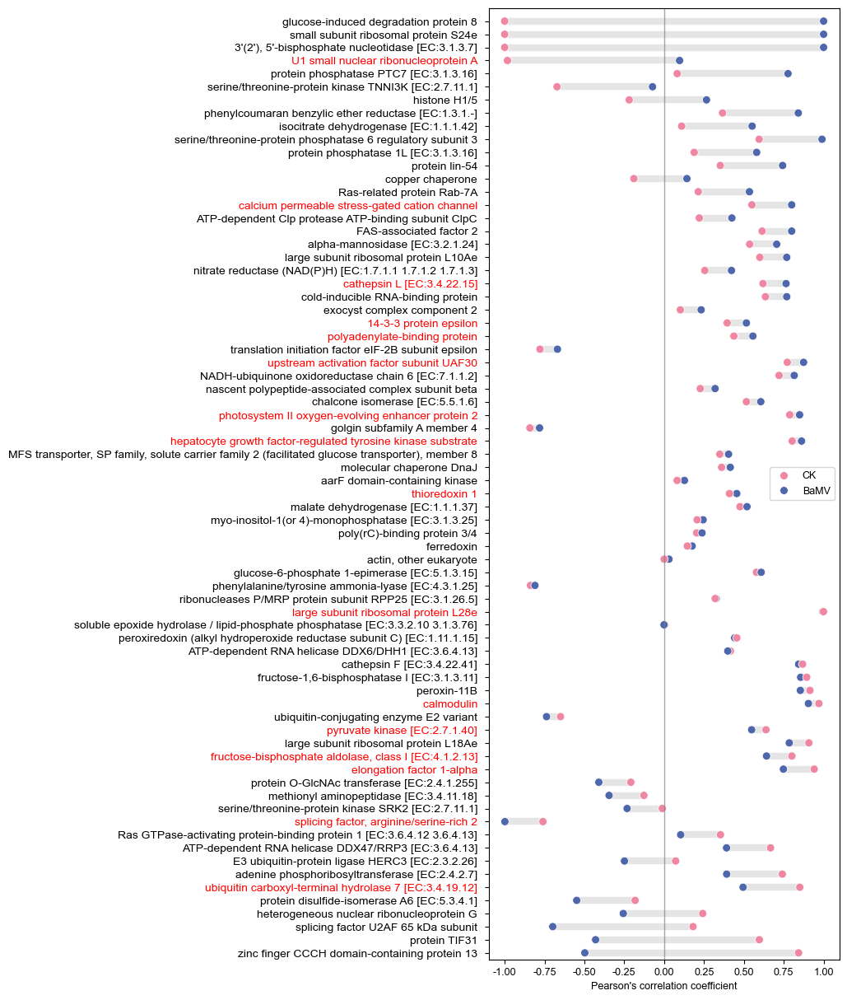

In [221]:
######RPM_pro_cor_pv 0.05 cutoff
#plot_fp='F:\\project\\DRS\\result\\08_full_length\\assign_full_length\\full length and pro cor\\RPM_pro_cor_pvcutoff\\plot\\'
#fp_1='F:\\project\\DRS\\result\\08_full_length\\assign_full_length\\full_length_GO\\new_go\\plot\\'
fp_1="F:\\project\\DRS\\result\\08_full_length\\assign_full_length\\KEGG\\"
fig,ax=plt.subplots(figsize=(5.5, 15))
dat=df_2[df_2['type']=='nonfull'].dropna()
label_n=dat[['GO','label']].groupby('GO').agg('count')
plot_dat_1=dat[dat['GO'].isin(label_n[label_n['label']==2].index)]
ko_change=pd.DataFrame(columns=['ko','delta_cor'])
ko_change_l=[]
for k,tmp in plot_dat_1.groupby('GO'):
    cor_bamv=float(tmp[tmp['label'].str.contains('bamv')].cor)
    cor_ck=float(tmp[tmp['label'].str.contains('ck')].cor)
    #delta_cor=abs(cor_bamv-cor_ck)
    delta_cor=cor_bamv-cor_ck
    if delta_cor !=0:
        ko_change_row=pd.DataFrame([{'ko':k,'delta_cor':delta_cor}])
        ko_change=pd.concat([ko_change,ko_change_row],ignore_index=True)
        ko_change_l.append(k)
ko_change=ko_change.sort_values(by='delta_cor',ascending=True)        
plot_dat=plot_dat_1[plot_dat_1['GO'].isin(ko_change_l)]
plot_dat['GO']=pd.Categorical(plot_dat['GO'],categories=list(ko_change.ko),ordered=True)
plot_dat.sort_values(by='GO')
go_order=[]
for ((go,temp),i) in zip(plot_dat.groupby('GO'),range(int(len(plot_dat)/2)+1)):
    go_order.append(go)
    
    if len(temp) == 2:
        #print(go,i,temp[temp['label']=='nonfull_ck']['cor'],temp[temp['label']=='nonfull_bamv']['cor'])
        #plt.plot([temp[temp['label']=='nonfull_ck']['cor'],temp[temp['label']=='nonfull_bamv']['cor']], [i+0.04,i+0.04], color='gray', linewidth=5,alpha=0.2)
        ax.hlines(y=i, xmin=temp[temp['label']=='nonfull_ck']['cor'], xmax=temp[temp['label']=='nonfull_bamv']['cor'], color="gray", linewidth=6, zorder=1,alpha=0.2)
# plt.scatter(y=df[df['sample']=='CK']['Des'],x=df[df['sample']=='CK']['full_cor'],color='#ef87a2')
# plt.scatter(y=df[df['sample']=='BaMV']['Des'],x=df[df['sample']=='BaMV']['full_cor'],color='#4e66ab')

sns.scatterplot(data=plot_dat.sort_values(by='GO',key=lambda x: x.map({v: i for i, v in enumerate(go_order)})),hue_order=['nonfull_ck','nonfull_bamv'],x='cor',y='Des',palette=['#ef87a2','#4e66ab'],hue='label',s=50)
handles, _ = plt.gca().get_legend_handles_labels()
plt.ylim(-0.5,len(plot_dat)/2)
plt.vlines(x=0,ymin=-0.5,ymax=85.5,linewidth=1,alpha=0.7,color='gray')
plt.xlabel("Pearson's correlation coefficient")
plt.legend(handles=handles,frameon=True,labels=['CK','BaMV'])
plt.ylabel('')
ax=plt.gca()
for label in ax.get_yticklabels():
    label.set_fontsize(10)
    sig_go=list(plot_dat[plot_dat['pv'] < 0.05].Des)
    if label.get_text() in sig_go:
        label.set_color('red')
plt.savefig(full_fp+'nonfull_length_pro_corr_dumbbell_chart.pdf',bbox_inches="tight",transparent=True)
plot_dat.to_csv(full_fp+'nonfull_kegg_term_cor_changed_pvalue.csv',index=False)

In [24]:
plot_dat=pd.read_csv(full_fp+'nonfull_kegg_term_cor_changed_pvalue.csv')

In [56]:
a=pd.DataFrame(df_2_wide['full_bamv']-df_2_wide['full_ck'],columns=['delta']).dropna()

In [37]:
a

,delta
GO,
K00026,0.163299
K00059,0.045927
K00128,-0.042795
K00133,0.234515
K00411,-0.146785
...,...
K21888,1.154617
K22066,0.928135
K22074,0.068483


In [45]:
a[a['delta']>0]

,delta
GO,
K00026,0.163299
K00059,0.045927
K00133,0.234515
K00417,0.008879
K00434,0.006901
...,...
K18883,0.895720
K20723,0.189273
K21888,1.154617


In [47]:
a[a['delta']<0]

,delta
GO,
K00128,-0.042795
K00411,-0.146785
K00432,-0.304218
K00600,-0.061472
K00655,-0.066788
...,...
K15283,-1.248254
K17637,-0.551636
K19788,-0.285349


/tmp/ipykernel_49458/1383414395.py:11: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  cor_bamv=float(tmp[tmp['label'].str.contains('bamv')].cor)
/tmp/ipykernel_49458/1383414395.py:12: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  cor_ck=float(tmp[tmp['label'].str.contains('ck')].cor)
/tmp/ipykernel_49458/1383414395.py:17: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  ko_change=pd.concat([ko_change,ko_change_row],ignore_index=True)
/tmp/ipykernel_49458/1383414395.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from 

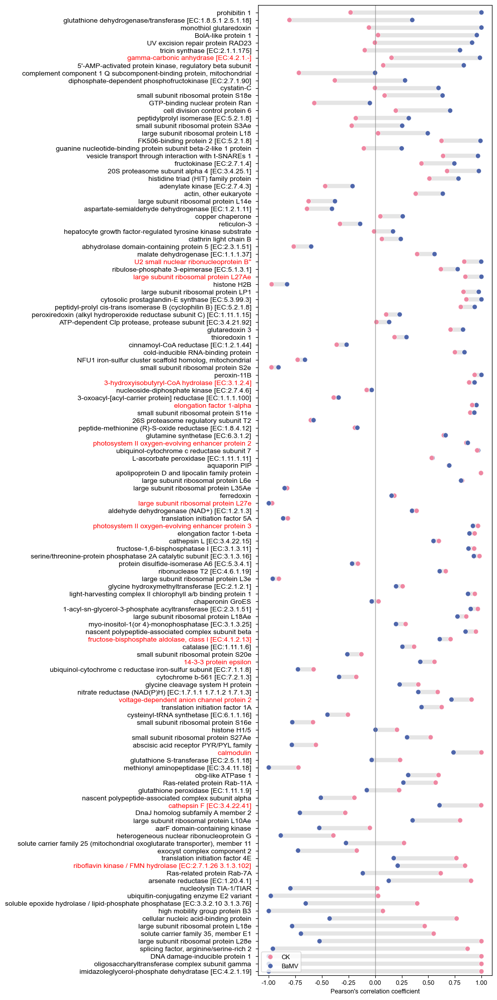

In [223]:
######RPM_pro_cor_pv 0.05 cutoff
#plot_fp='F:\\project\\DRS\\result\\08_full_length\\assign_full_length\\full length and pro cor\\RPM_pro_cor_pvcutoff\\plot\\'
fp_1="F:\\project\\DRS\\result\\08_full_length\\assign_full_length\\KEGG\\"
fig,ax=plt.subplots(figsize=(6,25))
dat=df_2[df_2['type']=='full'].dropna()
label_n=dat[['GO','label']].groupby('GO').agg('count')
plot_dat_1=dat[dat['GO'].isin(label_n[label_n['label']==2].index)]
ko_change=pd.DataFrame(columns=['ko','delta_cor'])
ko_change_l=[]
for k,tmp in plot_dat_1.groupby('GO'):
    cor_bamv=float(tmp[tmp['label'].str.contains('bamv')].cor)
    cor_ck=float(tmp[tmp['label'].str.contains('ck')].cor)
    #delta_cor=abs(cor_bamv-cor_ck)
    delta_cor=cor_bamv-cor_ck
    if delta_cor !=0:
        ko_change_row=pd.DataFrame([{'ko':k,'delta_cor':delta_cor}])
        ko_change=pd.concat([ko_change,ko_change_row],ignore_index=True)
        ko_change_l.append(k)
ko_change=ko_change.sort_values(by='delta_cor',ascending=True)        
plot_dat=plot_dat_1[plot_dat_1['GO'].isin(ko_change_l)]
plot_dat['GO']=pd.Categorical(plot_dat['GO'],categories=list(ko_change.ko),ordered=True)
plot_dat.sort_values(by='GO')
go_order=[]
for ((go,temp),i) in zip(plot_dat.groupby('GO'),range(int(len(plot_dat)/2)+1)):
    go_order.append(go)
    
    if len(temp) == 2:
        #print(go,i,temp[temp['label']=='nonfull_ck']['cor'],temp[temp['label']=='nonfull_bamv']['cor'])
        #plt.plot([temp[temp['label']=='nonfull_ck']['cor'],temp[temp['label']=='nonfull_bamv']['cor']], [i+0.04,i+0.04], color='gray', linewidth=5,alpha=0.2)
        ax.hlines(y=i, xmin=temp[temp['label']=='full_ck']['cor'], xmax=temp[temp['label']=='full_bamv']['cor'], color="gray", linewidth=6, zorder=1,alpha=0.2)
# plt.scatter(y=df[df['sample']=='CK']['Des'],x=df[df['sample']=='CK']['full_cor'],color='#ef87a2')
# plt.scatter(y=df[df['sample']=='BaMV']['Des'],x=df[df['sample']=='BaMV']['full_cor'],color='#4e66ab')

sns.scatterplot(data=plot_dat.sort_values(by='GO',key=lambda x: x.map({v: i for i, v in enumerate(go_order)})),hue_order=['full_ck','full_bamv'],x='cor',y='Des',palette=['#ef87a2','#4e66ab'],hue='label',s=50)
handles, _ = plt.gca().get_legend_handles_labels()
plt.ylim(-0.5,len(plot_dat)/2)
plt.vlines(x=0,ymin=-0.5,ymax=len(plot_dat)/2,linewidth=1,alpha=0.7,color='gray')
plt.xlabel("Pearson's correlation coefficient")
plt.legend(handles=handles,frameon=True,labels=['CK','BaMV'],loc='lower left')
plt.ylabel('')
ax=plt.gca()
for label in ax.get_yticklabels():
    label.set_fontsize(10)
    sig_go=list(plot_dat[plot_dat['pv'] < 0.05].Des)
    if label.get_text() in sig_go:
        label.set_color('red')
plt.savefig(full_fp+'full_length_pro_corr_dumbbell_chart.pdf',bbox_inches="tight")
plot_dat.to_csv(full_fp+'full_kegg_term_cor_changed_pvalue.csv',index=False)

In [55]:
b=pd.DataFrame(df_2_wide['nonfull_bamv']-df_2_wide['nonfull_ck'],columns=['delta']).dropna()

In [53]:
len(b[b['delta']>0])

45

In [54]:
len(b[b['delta']<0])

27

In [58]:
set(a[a['delta']>0].index) & set(b[b['delta']>0].index) 

{'K00026', 'K02717', 'K03671', 'K07213', 'K10355', 'K12182', 'K13195'}

In [62]:
df_2[df_2['GO'].isin(set(a[a['delta']>0].index) & set(b[b['delta']>0].index))]

,GO,Des,count,geneID,cor,pv,label,type,sample
0,K03671,thioredoxin 1,36,evm.model.FRAGSCAFF_250.709/evm.model.ORIGINAL...,0.294923,0.194340,full_bamv,full,BaMV
5,K13195,cold-inducible RNA-binding protein,13,evm.model.FRAGSCAFF_301.862/evm.model.FRAGSCAF...,0.840464,0.159536,full_bamv,full,BaMV
27,K02717,photosystem II oxygen-evolving enhancer protei...,8,evm.model.FRAGSCAFF_301.851/evm.model.FRAGSCAF...,0.871893,0.023566,full_bamv,full,BaMV
38,K00026,malate dehydrogenase [EC:1.1.1.37],10,evm.model.FRAGSCAFF_158.912/evm.model.FRAGSCAF...,0.558768,0.192272,full_bamv,full,BaMV
121,K07213,copper chaperone,10,evm.model.FRAGSCAFF_250.935/evm.model.FRAGSCAF...,0.259588,0.673233,full_bamv,full,BaMV
174,K10355,"actin, other eukaryote",9,evm.model.FRAGSCAFF_411.316/evm.model.FRAGSCAF...,0.636257,0.089881,full_bamv,full,BaMV
175,K12182,hepatocyte growth factor-regulated tyrosine ki...,6,evm.model.ORIGINAL_3711.166/evm.model.ORIGINAL...,0.168345,0.831655,full_bamv,full,BaMV
201,K03671,thioredoxin 1,46,evm.model.FRAGSCAFF_250.709/evm.model.ORIGINAL...,0.455339,0.029012,nonfull_bamv,nonfull,BaMV
223,K12182,hepatocyte growth factor-regulated tyrosine ki...,13,evm.model.ORIGINAL_3711.166/evm.model.FRAGSCAF...,0.861699,0.027368,nonfull_bamv,nonfull,BaMV
237,K02717,photosystem II oxygen-evolving enhancer protei...,10,evm.model.FRAGSCAFF_301.851/evm.model.FRAGSCAF...,0.849491,0.015539,nonfull_bamv,nonfull,BaMV


In [65]:
df_2

,GO,Des,count,geneID,cor,pv,label,type,sample
0,K03671,thioredoxin 1,36,evm.model.FRAGSCAFF_250.709/evm.model.ORIGINAL...,0.294923,0.194340,full_bamv,full,BaMV
1,K02183,calmodulin,33,evm.model.FRAGSCAFF_301.676/evm.model.ORIGINAL...,0.737391,0.262609,full_bamv,full,BaMV
2,K01092,myo-inositol-1(or 4)-monophosphatase [EC:3.1.3...,16,evm.model.FRAGSCAFF_268.728/evm.model.FRAGSCAF...,0.196690,0.586004,full_bamv,full,BaMV
3,K03676,glutaredoxin 3,22,evm.model.FRAGSCAFF_250.368/evm.model.FRAGSCAF...,0.826742,0.173258,full_bamv,full,BaMV
4,K06630,14-3-3 protein epsilon,20,evm.model.FRAGSCAFF_250.641/evm.model.FRAGSCAF...,0.425176,0.088876,full_bamv,full,BaMV
...,...,...,...,...,...,...,...,...,...
671,K00454,lipoxygenase [EC:1.13.11.12],11,evm.model.FRAGSCAFF_230.489.1/evm.model.FRAGSC...,0.574647,0.232909,nonfull_ck,nonfull,CK
672,K14945,protein quaking,15,evm.model.FRAGSCAFF_335.425/evm.model.FRAGSCAF...,NaN,NaN,nonfull_ck,nonfull,CK
673,K17616,CTD small phosphatase-like protein 2 [EC:3.1.3...,15,evm.model.FRAGSCAFF_295.129/evm.model.ORIGINAL...,0.888734,0.303171,nonfull_ck,nonfull,CK
674,K02717,photosystem II oxygen-evolving enhancer protei...,9,evm.model.FRAGSCAFF_301.851/evm.model.FRAGSCAF...,0.787301,0.035604,nonfull_ck,nonfull,CK


In [66]:
df_2[df_2['Des'].str.contains('U1 small nuclear ribonucleoprotein A')]

,GO,Des,count,geneID,cor,pv,label,type,sample
169,K11091,U1 small nuclear ribonucleoprotein A,4,evm.model.FRAGSCAFF_284.108/evm.model.FRAGSCAF...,NaN,NaN,full_bamv,full,BaMV
285,K11091,U1 small nuclear ribonucleoprotein A,7,evm.model.FRAGSCAFF_284.108/evm.model.ORIGINAL...,0.096908,0.903092,nonfull_bamv,nonfull,BaMV
502,K11091,U1 small nuclear ribonucleoprotein A,5,evm.model.FRAGSCAFF_284.108/evm.model.FRAGSCAF...,-1.000000,1.000000,full_ck,full,CK
667,K11091,U1 small nuclear ribonucleoprotein A,7,evm.model.FRAGSCAFF_284.108/evm.model.ORIGINAL...,-0.982274,0.017726,nonfull_ck,nonfull,CK


In [50]:
df_2['sample']=df_2['label'].apply(lambda x: 'BaMV' if 'bamv' in x else 'CK')
df_2_wide=df_2.pivot(index='GO',columns='label',values='cor')

In [114]:
K01623_df=df_2[(df_2['pv'] < 0.05) & (df_2['GO']=='K01623')]

In [76]:
K01623_df

,GO,Des,count,geneID,cor,pv,label,type,sample
6,K01623,"fructose-bisphosphate aldolase, class I [EC:4....",13,evm.model.ORIGINAL_821.684/evm.model.FRAGSCAFF...,0.552325,0.050310,full_bamv,full,BaMV
35,K01623,"fructose-bisphosphate aldolase, class I [EC:4....",14,evm.model.ORIGINAL_821.684/evm.model.FRAGSCAFF...,0.568277,0.033985,nonfull_bamv,nonfull,BaMV
16,K01623,"fructose-bisphosphate aldolase, class I [EC:4....",12,evm.model.ORIGINAL_821.684/evm.model.FRAGSCAFF...,0.653759,0.021118,full_ck,full,CK
18,K01623,"fructose-bisphosphate aldolase, class I [EC:4....",15,evm.model.ORIGINAL_821.684/evm.model.FRAGSCAFF...,0.590207,0.026288,nonfull_ck,nonfull,CK


In [115]:
K01623_df.Des.unique()[0].split(' [')[0]

'fructose-bisphosphate aldolase, class I'

In [163]:
full_length_count

,gene_id,count,Full_length,sample,RPM,gene_name,pro_Normalized
0,evm.TU.FRAGSCAFF_1.28,1,True,CK,1.184485,evm.model.FRAGSCAFF_1.28,NaN
1,evm.TU.FRAGSCAFF_1.28,14,False,CK,16.582785,evm.model.FRAGSCAFF_1.28,NaN
2,evm.TU.FRAGSCAFF_1.32,0,True,CK,0.000000,evm.model.FRAGSCAFF_1.32,NaN
3,evm.TU.FRAGSCAFF_1.32,1,False,CK,1.184485,evm.model.FRAGSCAFF_1.32,NaN
4,evm.TU.FRAGSCAFF_1.33,0,True,CK,0.000000,evm.model.FRAGSCAFF_1.33,2790.733333
...,...,...,...,...,...,...,...
112011,evm.TU.ORIGINAL_981.88,1,False,BaMV,1.897638,evm.model.ORIGINAL_981.88,NaN
112012,evm.TU.ORIGINAL_981.98,0,True,BaMV,0.000000,evm.model.ORIGINAL_981.98,2637.366667
112013,evm.TU.ORIGINAL_981.98,6,False,BaMV,11.385826,evm.model.ORIGINAL_981.98,2637.366667
112014,evm.TU.ORIGINAL_981.99,1,True,BaMV,1.897638,evm.model.ORIGINAL_981.99,NaN


In [38]:
full_length_count

,gene_id,count,Full_length,sample,RPM,gene_name,pro_Normalized
0,evm.TU.FRAGSCAFF_1.28,1,True,CK,1.184485,evm.model.FRAGSCAFF_1.28,NaN
1,evm.TU.FRAGSCAFF_1.28,14,False,CK,16.582785,evm.model.FRAGSCAFF_1.28,NaN
2,evm.TU.FRAGSCAFF_1.32,0,True,CK,0.000000,evm.model.FRAGSCAFF_1.32,NaN
3,evm.TU.FRAGSCAFF_1.32,1,False,CK,1.184485,evm.model.FRAGSCAFF_1.32,NaN
4,evm.TU.FRAGSCAFF_1.33,0,True,CK,0.000000,evm.model.FRAGSCAFF_1.33,2790.733333
...,...,...,...,...,...,...,...
112011,evm.TU.ORIGINAL_981.88,1,False,BaMV,1.897638,evm.model.ORIGINAL_981.88,NaN
112012,evm.TU.ORIGINAL_981.98,0,True,BaMV,0.000000,evm.model.ORIGINAL_981.98,2637.366667
112013,evm.TU.ORIGINAL_981.98,6,False,BaMV,11.385826,evm.model.ORIGINAL_981.98,2637.366667
112014,evm.TU.ORIGINAL_981.99,1,True,BaMV,1.897638,evm.model.ORIGINAL_981.99,NaN


In [119]:
dat=full_length_count[~(full_length_count['RPM'].replace(0,np.NAN).isna()) & ~(full_length_count['pro_Normalized'].isna())]

In [120]:
plot_dat_1 = dat[(dat['Full_length']==False)&(dat['sample']=='CK')& (dat['gene_name'].isin(list(K01623_df[K01623_df['label']=='nonfull_ck']['geneID'].str.split('/'))[0]))]
plot_dat_2 = dat[(dat['Full_length']==False)&(dat['sample']=='BaMV')& (dat['gene_name'].isin(list(K01623_df[K01623_df['label']=='nonfull_bamv']['geneID'].str.split('/'))[0]))]

In [122]:
K01623_df

,GO,Des,count,geneID,cor,pv,label,type,sample
6,K01623,"fructose-bisphosphate aldolase, class I [EC:4....",13,evm.model.ORIGINAL_821.684/evm.model.FRAGSCAFF...,0.607850,0.027534,full_bamv,full,BaMV
35,K01623,"fructose-bisphosphate aldolase, class I [EC:4....",14,evm.model.ORIGINAL_821.684/evm.model.FRAGSCAFF...,0.641928,0.013324,nonfull_bamv,nonfull,BaMV
16,K01623,"fructose-bisphosphate aldolase, class I [EC:4....",12,evm.model.ORIGINAL_821.684/evm.model.FRAGSCAFF...,0.709427,0.009767,full_ck,full,CK
18,K01623,"fructose-bisphosphate aldolase, class I [EC:4....",15,evm.model.ORIGINAL_821.684/evm.model.FRAGSCAFF...,0.801142,0.000573,nonfull_ck,nonfull,CK


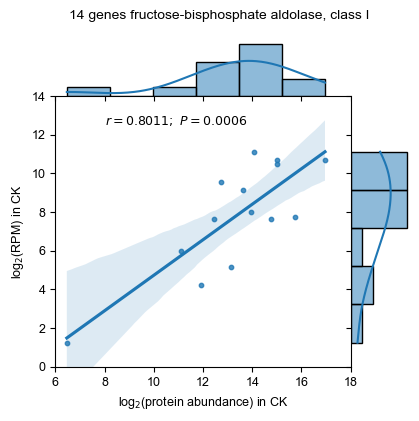

In [123]:

g1=sns.jointplot(y=np.log2(plot_dat_1['RPM']),x=np.log2(plot_dat_1['pro_Normalized']),kind='reg',scatter_kws={"s":10},marginal_kws={"kde": True}, space=0, ratio=5,ylim=(0,14),xlim=(6,18))
g1.fig.set_size_inches(4,4)
#g2=sns.jointplot(y=np.log2(plot_dat_2['RPM']),x=np.log2(plot_dat_2['pro_Normalized']),kind='reg',scatter_kws={"s":10},marginal_kws={"kde": True}, space=0, ratio=5)
# 添加标题和统计信息
g1.fig.suptitle(f"{len(plot_dat_1)} genes {K01623_df.Des.unique()[0].split(' [')[0]}", fontsize=10)
g1.ax_joint.text(8, 12.5, r"$r = 0.8011;\ P = 0.0006$", fontsize=9)
g1.set_axis_labels("log$_2$(protein abundance) in CK", "log$_2$(RPM) in CK", fontsize=9)
# 调整布局以避免标题和图重叠
plt.subplots_adjust(top=0.9)
plt.savefig(full_fp+'fructose-bisphosphate aldolase_nonfull_ck.pdf',bbox_inches='tight',transparent=True)

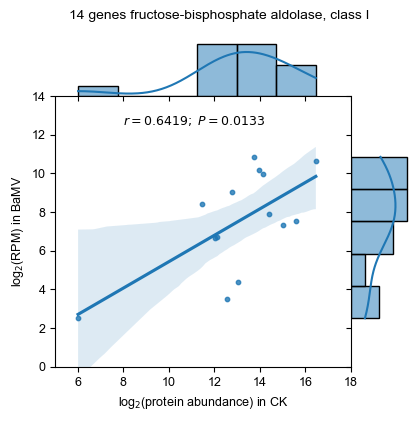

In [124]:

g1=sns.jointplot(y=np.log2(plot_dat_2['RPM']),x=np.log2(plot_dat_2['pro_Normalized']),kind='reg',scatter_kws={"s":10},marginal_kws={"kde": True}, space=0, ratio=5,ylim=(0,14),xlim=(5,18))
g1.fig.set_size_inches(4,4)
#g2=sns.jointplot(y=np.log2(plot_dat_2['RPM']),x=np.log2(plot_dat_2['pro_Normalized']),kind='reg',scatter_kws={"s":10},marginal_kws={"kde": True}, space=0, ratio=5)
# 添加标题和统计信息
g1.fig.suptitle(f"{len(plot_dat_1)} genes {K01623_df.Des.unique()[0].split(' [')[0]}", fontsize=10)
# cor=round(float(K01623_df[K01623_df['label']=='nonfull_ck'].cor),4)
# pv=round(float(K01623_df[K01623_df['label']=='nonfull_ck'].pv),4)
g1.ax_joint.text(8,12.5,r"$r = 0.6419;\ P = 0.0133$", fontsize=9)
g1.set_axis_labels("log$_2$(protein abundance) in CK", "log$_2$(RPM) in BaMV", fontsize=9)
# 调整布局以避免标题和图重叠
plt.subplots_adjust(top=0.9)
plt.savefig(full_fp+'fructose-bisphosphate aldolase_nonfull_bamv.pdf',bbox_inches='tight',transparent=True)

In [125]:
plot_dat_1 = dat[(dat['Full_length']==True)&(dat['sample']=='CK')& (dat['gene_name'].isin(list(K01623_df[K01623_df['label']=='full_ck']['geneID'].str.split('/'))[0]))]
plot_dat_2 = dat[(dat['Full_length']==True)&(dat['sample']=='BaMV')& (dat['gene_name'].isin(list(K01623_df[K01623_df['label']=='full_bamv']['geneID'].str.split('/'))[0]))]

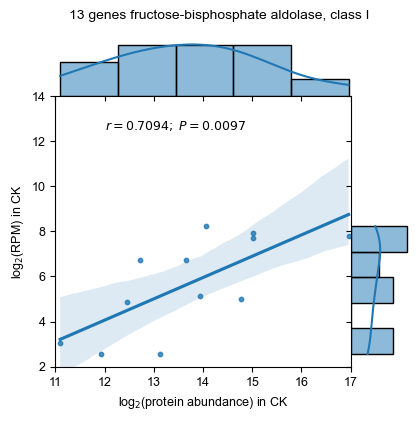

In [126]:

g1=sns.jointplot(y=np.log2(plot_dat_1['RPM']),x=np.log2(plot_dat_1['pro_Normalized']),kind='reg',scatter_kws={"s":10},marginal_kws={"kde": True}, space=0, ratio=5,ylim=(2,14),xlim=(11,17))
g1.fig.set_size_inches(4,4)
#g2=sns.jointplot(y=np.log2(plot_dat_2['RPM']),x=np.log2(plot_dat_2['pro_Normalized']),kind='reg',scatter_kws={"s":10},marginal_kws={"kde": True}, space=0, ratio=5)
# 添加标题和统计信息
g1.fig.suptitle(f"{len(plot_dat_2)} genes {K01623_df.Des.unique()[0].split(' [')[0]}", fontsize=10)
# cor=round(float(K01623_df[K01623_df['label']=='nonfull_ck'].cor),4)
# pv=round(float(K01623_df[K01623_df['label']=='nonfull_ck'].pv),4)
g1.ax_joint.text(12,12.5,r"$r = 0.7094;\ P = 0.0097$",fontsize=9)
g1.set_axis_labels("log$_2$(protein abundance) in CK", "log$_2$(RPM) in CK", fontsize=9)
# 调整布局以避免标题和图重叠
plt.subplots_adjust(top=0.9)
plt.savefig(full_fp+'fructose-bisphosphate aldolase_full_ck.pdf',bbox_inches='tight',transparent=True)

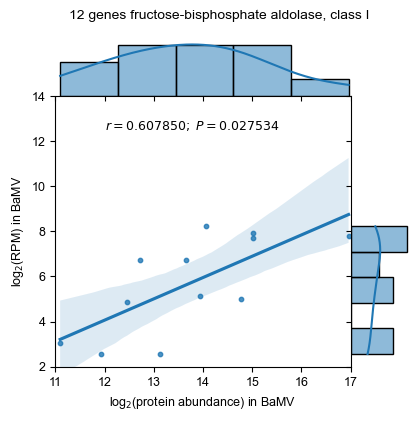

In [127]:

g1=sns.jointplot(y=np.log2(plot_dat_1['RPM']),x=np.log2(plot_dat_1['pro_Normalized']),kind='reg',scatter_kws={"s":10},marginal_kws={"kde": True}, space=0, ratio=5,ylim=(2,14),xlim=(11,17))
g1.fig.set_size_inches(4,4)
#g2=sns.jointplot(y=np.log2(plot_dat_2['RPM']),x=np.log2(plot_dat_2['pro_Normalized']),kind='reg',scatter_kws={"s":10},marginal_kws={"kde": True}, space=0, ratio=5)
# 添加标题和统计信息
g1.fig.suptitle(f"{len(plot_dat_1)} genes {K01623_df.Des.unique()[0].split(' [')[0]}", fontsize=10)
g1.ax_joint.text(12, 12.5, r"$r = 0.607850;\ P = 0.027534$", fontsize=9)
g1.set_axis_labels("log$_2$(protein abundance) in BaMV", "log$_2$(RPM) in BaMV", fontsize=9)
# 调整布局以避免标题和图重叠
plt.subplots_adjust(top=0.9)
plt.savefig(full_fp+'fructose-bisphosphate aldolase_full_bamv.pdf',bbox_inches='tight',transparent=True)

## 04 m6A

In [7]:
# Classification of modified sites
def intron_TSS_TTS_decide(position, gene_name, anno_gene_level):
    if anno_gene_level.loc[gene_name, "strand"] == "+":
        if position > anno_gene_level.loc[gene_name, "TTS"]:
            return "TTS_DOWN"
        elif position < anno_gene_level.loc[gene_name, "TSS"]:
            return "TSS_UP"
        else:
            return "intron"
    else:
        if position < anno_gene_level.loc[gene_name, "TTS"]:
            return "TTS_DOWN"
        elif position > anno_gene_level.loc[gene_name, "TSS"]:
            return "TSS_UP"
        else:
            return "intron"


# Classification of modified sites according to CDS/UTR5P/UTR3P/intron/TSS_UP/TSS_DOWN
def mod_site_classification(anno_gene_level, anno_cds_level, ratio_df):
    agg_list = []
    gene_names = ratio_df.gene_name.str.replace("TU", "model").unique()

    # Classification of modified sites according to CDS/UTR5P/UTR3P/intron/TSS_UP/TSS_DOWN
    anno_cds_level_no_exon = anno_cds_level.drop(
        anno_cds_level[anno_cds_level.label.str.contains("exon", regex=False)].index
    ).copy()
    anno_groups_no_exon = anno_cds_level_no_exon.groupby("gene_name")
    # Classification of modified sites only according to exon
    anno_cds_level_only_exon = anno_cds_level[
        anno_cds_level.label.str.contains("exon", regex=False)
    ].copy()
    anno_gropus_only_exon = anno_cds_level_only_exon.groupby("gene_name")

    ratio_groups = ratio_df.groupby("gene_name")
    try:
        with trange(len(gene_names)) as t:
            # with tqdm(len(gene_names)) as t:
            for gene_name, i in zip(gene_names, t):
                ratio_df_part = ratio_groups.get_group(gene_name).copy()
                # CDS
                anno_part_cds = anno_groups_no_exon.get_group(gene_name)
                # IntervalIndex:等间距划分区间
                bins_cds = pd.IntervalIndex.from_tuples(
                    list(zip(anno_part_cds.start, anno_part_cds.end)), closed="both"
                )
                x_cds = pd.cut(ratio_df_part.position.to_list(), bins_cds)
                x_cds.categories = list(anno_part_cds.label)
                ratio_df_part.loc[:, "label"] = x_cds
                # exon
                anno_part_exon = anno_gropus_only_exon.get_group(gene_name)
                bins_exon = pd.IntervalIndex.from_tuples(
                    list(zip(anno_part_exon.start, anno_part_exon.end)), closed="both"
                )
                try:
                    x_exon = pd.cut(ratio_df_part.position.to_list(), bins_exon)
                except ValueError:
                    print(gene_name)
                    print(bins_exon)
                    raise
                x_exon.categories = list(anno_part_exon.label)
                ratio_df_part.loc[:, "exon_label"] = x_exon

                agg_list.append(ratio_df_part)

    except KeyboardInterrupt:
        t.close()
        raise
    t.close()
    df_all = pd.concat(agg_list)

    df_na = df_all[df_all.label.isna()].copy()
    df_na.drop(["label"], axis=1)
    df_na.loc[:, "label"] = df_na.apply(
        lambda row: intron_TSS_TTS_decide(
            row["position"], row["gene_name"], anno_gene_level
        ),
        axis=1,
    )
    df_all.update(df_na, overwrite=False)

    df_all.loc[:, "label_group"] = df_all.label.apply(get_group_label)
    df_all = df_all.merge(
        anno_gene_level.strand,
        how="left",
        left_on="gene_name",
        right_index=True,
        sort=False,
    )

    return df_all


def get_group_label(label):
    if "cds" in label:
        return "cds"
    elif "utr5p" in label:
        return "utr5p"
    elif "utr3p" in label:
        return "utr3p"
    elif "exon" in label:
        return "exon"
    else:
        return label

In [ ]:
gene_mRNA_ID

{'evm.TU.ORIGINAL_3711.6': 'evm.model.ORIGINAL_3711.6',
 'evm.TU.ORIGINAL_3711.5': 'evm.model.ORIGINAL_3711.5',
 'evm.TU.ORIGINAL_3711.4': 'evm.model.ORIGINAL_3711.4',
 'evm.TU.ORIGINAL_3711.2': 'evm.model.ORIGINAL_3711.2',
 'evm.TU.ORIGINAL_3711.1': 'evm.model.ORIGINAL_3711.1',
 'evm.TU.ORIGINAL_3553.1': 'evm.model.ORIGINAL_3553.1',
 'evm.TU.ORIGINAL_3553.2': 'evm.model.ORIGINAL_3553.2',
 'evm.TU.FRAGSCAFF_222.95': 'evm.model.FRAGSCAFF_222.95',
 'evm.TU.FRAGSCAFF_222.96': 'evm.model.FRAGSCAFF_222.96',
 'evm.TU.FRAGSCAFF_222.97': 'evm.model.FRAGSCAFF_222.97',
 'evm.TU.FRAGSCAFF_222.99': 'evm.model.FRAGSCAFF_222.99',
 'evm.TU.FRAGSCAFF_297.109': 'evm.model.FRAGSCAFF_297.109',
 'evm.TU.ORIGINAL_5530.111': 'evm.model.ORIGINAL_5530.111',
 'evm.TU.ORIGINAL_6347.2': 'evm.model.ORIGINAL_6347.2',
 'evm.TU.ORIGINAL_6347.1': 'evm.model.ORIGINAL_6347.1',
 'evm.TU.FRAGSCAFF_245.168': 'evm.model.FRAGSCAFF_245.168',
 'evm.TU.FRAGSCAFF_245.167': 'evm.model.FRAGSCAFF_245.167',
 'evm.TU.FRAGSCAFF_245.1

In [ ]:
gene_mRNA_ID['evm.TU.ORIGINAL_746.1']

'evm.model.ORIGINAL_746.1'

In [8]:
def ratio_to_dataframe(ratio_file, output_file_path):
    # def ratio_to_dataframe(ratio_file,output_file_path):
    """Convert nanom6a output ratio file to dataframe-easy format.

    Args:
        ratio_file (file): nanom6A output file 'ratio.0.5.tsv'
        output_file_path : output file path
    Tips:
        deatframe-easy format is csv file
        header = 'position/mod_num/total_num/mod_ratio/gene_name/scaffold'
    """
    gene_mod_df_list = []
    position = []
    mod_num = []
    total_num = []
    mod_ratio = []
    with open(ratio_file, "r") as ratio:
        for line in ratio:
            line_list = line.split()
            gene_id = line_list[0].split("|")[0]
            gene_name = gene_mRNA_ID[gene_id]
            # gene_name = str(
            #     anno_cds_level[
            #         anno_cds_level.gene_name.str.contains(gene_name, regex=False)
            #     ]["gene_name"].unique()
            # )
            gene_name = str(anno_cds_level[anno_cds_level['gene_name']==gene_name]['gene_name'].unique())
            scaffold = line_list[0].split("|")[1]
            for site in line_list[1:]:
                site_list = site.split("|")
                position.append(site_list[0])
                mod_num.append(site_list[1])
                total_num.append(site_list[2])
                mod_ratio.append(site_list[3])
            gene_mod_df_tem = pd.DataFrame(
                {
                    "position": position,
                    "mod_num": mod_num,
                    "total_num": total_num,
                    "mod_ratio": mod_ratio,
                }
            )
            gene_mod_df_tem.loc[:, "gene_name"] = gene_name
            gene_mod_df_tem.loc[:, "scaffold"] = scaffold
            gene_mod_df_list.append(gene_mod_df_tem)
            position.clear()
            mod_num.clear()
            total_num.clear()
            mod_ratio.clear()
    gene_mod_df = pd.concat(gene_mod_df_list)
    gene_mod_df = gene_mod_df[
        ["gene_name","scaffold","position","mod_num","total_num","mod_ratio"]
    ]
    gene_mod_df.to_csv(output_file_path, sep="\t", index=False)

In [9]:
def read_ratio_file(dataframe_easy_ratio_file, read_min):
    df = pd.read_csv(
        dataframe_easy_ratio_file,
        sep="\t",
        dtype={
            "gene_name": str,
            "scaffold": str,
            "position": int,
            "mod_num": int,
            "total_num": int,
            "mod_ratio": float,
        },
    )
    df.dropna(subset=["gene_name"], inplace=True)  # 过滤没有匹配到基因的修饰位点
    df.drop(df[df.mod_num < read_min].index, inplace=True)  # 过滤掉少于20个reads支持的修饰位点
    df.gene_name = df.gene_name.str.replace("TU", "model")
    print(
        "{} {} {} {} {}".format(
            "A total of",
            df.duplicated(subset=["scaffold", "position"], keep="first").sum(),
            "sites are assigned to multiple genes, these sites will be deleted (Filter threshold =",
            read_min,
            "read).",
        )
    )
    df.drop_duplicates(
        subset=["scaffold", "position"], keep=False, inplace=True
    )  # 某些修饰位点会同时分配给两个基因，这些位点将全部被删除
    return df

In [10]:
def read_ratio_df(ratio_df_file):
    df = pd.read_csv(
        ratio_df_file,
        sep="\t",
        dtype={
            "gene_name": str,
            "scaffold": str,
            "position": int,
            "mod_num": int,
            "total_num": int,
            "mod_ratio": float,
            "label": str,
            "exon_label": str,
            "label_group": str,
            "strand": str,
        },
    )
    num = len(df[df.mod_ratio > 1])
    df = df[
        df.mod_ratio <= 1
    ]  # Filter out sites with a modification ratio greater than 1. (may be a nanom6a bug)
    print(
        "{} {} {} ".format(
            "Tips: A total of",
            num,
            "sites with a modification ratio greater than 1 will be filtered out. (Nanom6A may output some sites with a modification ratio greater than 1, which may be a bug)",
        )
    )
    return df

In [ ]:
# Convert nanom6a output ratio file to dataframe-easy format
# ratio_to_dataframe(phe_2b_m6a_ratio_file,'/home/litao/bigdata/phe_shoot/phe_shoot_DRS/nanopore_output/11_m6A/phe_2b_m6a_ratio_file.csv')
ratio_to_dataframe(
    "F:\\project\\DRS\\merge_m6A\\bamv_ratio.0.5.tsv",
    "F:\\project\\DRS\\result\\02_m6A\\ratio_df\\dla_bm_m6a_ratio_raw_file.csv",
)
ratio_to_dataframe('F:\\project\\DRS\\merge_m6A\\ck_ratio.0.5.tsv','F:\\project\\DRS\\result\\02_m6A\\ratio_df\\dla_ck_m6a_ratio_raw_file.csv')


In [ ]:
bm_ratio_fn = "F:\\project\\DRS\\result\\02_m6A\\ratio_df\\dla_bm_m6a_ratio_raw_file.csv"
ck_ratio_fn = "F:\\project\\DRS\\result\\02_m6A\\ratio_df\\dla_ck_m6a_ratio_raw_file.csv"

In [ ]:
bm_ratio_df = read_ratio_df(bm_ratio_fn)
ck_ratio_df= read_ratio_df(ck_ratio_fn)

Tips: A total of 0 sites with a modification ratio greater than 1 will be filtered out. (Nanom6A may output some sites with a modification ratio greater than 1, which may be a bug) 
Tips: A total of 0 sites with a modification ratio greater than 1 will be filtered out. (Nanom6A may output some sites with a modification ratio greater than 1, which may be a bug) 


In [ ]:
bm_ratio_df = read_ratio_file(bm_ratio_fn, 0)
ck_ratio_df = read_ratio_file(ck_ratio_fn, 0)
dla_all_ratio_df = pd.concat([bm_ratio_df, ck_ratio_df]).reset_index().drop('index',axis=1)

A total of 74 sites are assigned to multiple genes, these sites will be deleted (Filter threshold = 0 read).
A total of 66 sites are assigned to multiple genes, these sites will be deleted (Filter threshold = 0 read).


In [ ]:
# bm_ratio_df.to_csv("F:\\project\\DRS\\result\\02_m6A\\ratio_df\\filtered_to_class_bm_ratio_df",sep='\t',index=None)
# ck_ratio_df.to_csv("F:\\project\\DRS\\result\\02_m6A\\ratio_df\\filtered_to_class_ck_ratio_df",sep='\t',index=None)

In [ ]:
# Classification of modified sites
# bm_ratio_df = mod_site_classification(anno_gene_level, anno_cds_level, bm_ratio_df)
# ck_ratio_df = mod_site_classification(anno_gene_level, anno_cds_level, ck_ratio_df)

dla_all_ratio_df = mod_site_classification(
     anno_gene_level, anno_cds_level, dla_all_ratio_df
 )

  0%|          | 0/9458 [00:00<?, ?it/s]C:\Users\healer\AppData\Local\Temp\ipykernel_9924\3988061669.py:48: FutureWarning: Setting categories in-place is deprecated and will raise in a future version. Use rename_categories instead.
  x_cds.categories = list(anno_part_cds.label)
C:\Users\healer\AppData\Local\Temp\ipykernel_9924\3988061669.py:61: FutureWarning: Setting categories in-place is deprecated and will raise in a future version. Use rename_categories instead.
  x_exon.categories = list(anno_part_exon.label)
  0%|          | 1/9458 [00:00<1:42:37,  1.54it/s]C:\Users\healer\AppData\Local\Temp\ipykernel_9924\3988061669.py:48: FutureWarning: Setting categories in-place is deprecated and will raise in a future version. Use rename_categories instead.
  x_cds.categories = list(anno_part_cds.label)
C:\Users\healer\AppData\Local\Temp\ipykernel_9924\3988061669.py:61: FutureWarning: Setting categories in-place is deprecated and will raise in a future version. Use rename_categories instead.

                         gene_name scaffold  position  mod_num  total_num  \
0       evm.model.ORIGINAL_5752.52   chr6.1  20585791        7          8   
1       evm.model.ORIGINAL_5752.52   chr6.1  20585986       63        186   
2       evm.model.ORIGINAL_5752.52   chr6.1  20586020       80        197   
3       evm.model.ORIGINAL_5752.52   chr6.1  20586101       69        193   
4       evm.model.ORIGINAL_5752.52   chr6.1  20586212       31        163   
...                            ...      ...       ...      ...        ...   
51492   evm.model.ORIGINAL_5293.19  chr24.1  32703722        8         24   
51498  evm.model.FRAGSCAFF_426.112  chr13.1  33706237       12         20   
51502  evm.model.ORIGINAL_6124.357  chr31.1  23086759        9         12   
51508   evm.model.FRAGSCAFF_265.85  chr30.1   7983260       10         12   
51519  evm.model.FRAGSCAFF_442.141   chr1.1  16858524       16        235   

       mod_ratio   label exon_label  
0       0.875000  utr3p1      exon3  

In [ ]:
bm_ratio_df.to_csv("F:\\project\\DRS\\result\\02_m6A\\ratio_df\\bm_ratio_df",sep='\t',index=None)
ck_ratio_df.to_csv("F:\\project\\DRS\\result\\02_m6A\\ratio_df\\ck_ratio_df",sep='\t',index=None)
dla_all_ratio_df.to_csv("F:\\project\\DRS\\result\\02_m6A\\ratio_df\\dla_all_ratio_df",sep='\t',index=None)

In [68]:
pro_abundance = pd.read_csv("/home/qq/work/lxr/DRS/wig/pro_abundance.csv",sep= ',',index_col=0)
tpm = pd.read_csv("/home/qq/work/lxr/DRS/wig/deseq2_bamv_ck_res_1.5.csv")

### 1. summary

In [11]:
bm_ratio_df=pd.read_csv("/home/qq/work/lxr/DRS/script_plot/bamv/m6A/bm_ratio_df",sep='\t')
ck_ratio_df=pd.read_csv("/home/qq/work/lxr/DRS/script_plot/bamv/m6A/ck_ratio_df",sep='\t')
dla_all_ratio_df=pd.read_csv("/home/qq/work/lxr/DRS/script_plot/bamv/m6A/dla_all_ratio_df",sep='\t')

**all_venn_plot**

In [ ]:
venn

functools.partial(<function venn_dispatch at 0x000001E4C0726CA0>, func=<function draw_venn at 0x000001E4C07269D0>, hint_hidden=False)

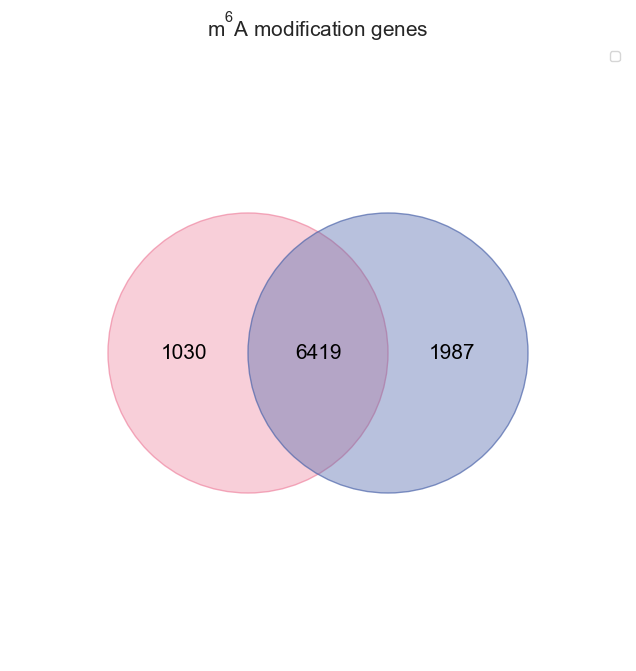

In [13]:
bm_mod_gene = set(bm_ratio_df.gene_name.unique())
ck_mod_gene = set(ck_ratio_df.gene_name.unique())

cmap = ["cool", list("rgb"), "plasma", "viridis", "Set1"]
data_dict = {"CK": ck_mod_gene, "BaMV": bm_mod_gene}
# plt.subplots(1,figsize=(2,2))
venn(data_dict, fontsize=15, cmap=['#ef87a2','#4e66ab'])
plt.title('$\mathregular{m^6A}$ modification genes',fontsize=15)
plt.legend('')
# plt.savefig('F:\\project\\DRS\\result\\02_m6A\\ratio_df\\Figure4.2_mod_gene_venn_plot.pdf', format='pdf', dpi=600, bbox_inches='tight',transparent = True)
# plt.savefig('/home/litao/bigdata/phe_shoot/phe_shoot_figure/Part4_m6a/Figure4.2_mod_gene_venn_plot.svg', format='svg', dpi=600, bbox_inches='tight',transparent = True)
plt.show()

Text(0.5, 1.0, '$\\mathregular{m^6A}$ modification sites')

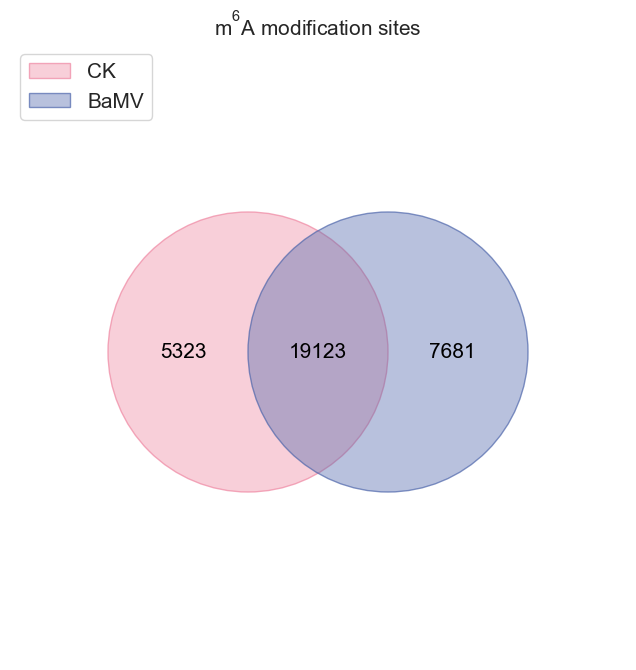

In [14]:
# Figure4.2.1 mod_site_venn_plot
bm_scaffold_pos = set(zip(bm_ratio_df.scaffold, bm_ratio_df.position))
ck_scaffold_pos = set(zip(ck_ratio_df.scaffold, ck_ratio_df.position))

cmap = ["cool", list("rgb"), "plasma", "viridis", "Set1"]
data_dict = {"CK": ck_scaffold_pos, "BaMV": bm_scaffold_pos}
venn(
    data_dict, fontsize=15, legend_loc="upper left", cmap=['#ef87a2','#4e66ab']#"plasma"
)  # data_dict Must be a set (that is, no duplicates)
plt.title('$\mathregular{m^6A}$ modification sites',fontsize=15)

# venn(data_dict,fmt="{percentage:.1f}%",fontsize=8, legend_loc="upper left",cmap="plasma")   #Show percentage
# plt.savefig('F:\\project\\DRS\\result\\02_m6A\\ratio_df\\mod_site_venn_plot.pdf', format='pdf', dpi=600, bbox_inches='tight',transparent = True)
# plt.savefig('/home/litao/bigdata/phe_shoot/phe_shoot_figure/Part4_m6a/Figure4.1_mod_site_venn_plot.svg', format='svg', dpi=600, bbox_inches='tight',transparent = True)

m6a_modification_ratio_box_plot

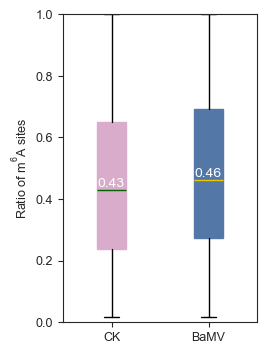

In [17]:
# Figure4.2.3 m6a_modification_ration_box_plot
bm_mod_ratio = bm_ratio_df.mod_ratio
ck_mod_ratio = ck_ratio_df.mod_ratio

sns.set_style(style='ticks')
fig = plt.figure(figsize=(2.5, 4))
ax = plt.subplot()
sample = [ck_mod_ratio, bm_mod_ratio]
# colors = ["lightcoral", "dodgerblue", "mediumseagreen","orange"]
colors = ["#d8acca","#5378a8"]#["#ffb2cc", "#8ce3e3"]
# colors_r = ["lightcoral", "lightcoral","dodgerblue","dodgerblue",  "mediumseagreen","mediumseagreen","orange","orange"]
colors_r = ["#d8acca","#d8acca","#5378a8","#5378a8"]#["#aba6c6", "#aba6c6", "#d0c4bd", "#d0c4bd"]
labels = ["CK", "BaMV"]
colors_2 =  ["#006400","#EEC900"]#["#aba6c6", "#d7af83"]
plt.ylim(0, 1.0)
bplot = plt.boxplot(sample, patch_artist=True, labels=labels, widths=0.3,notch=False)
for patch, color in zip(bplot["medians"], colors_2):
    patch.set_color(color)
    patch.set_linewidth(1)
for patch, color in zip(bplot["boxes"], colors):
    patch.set_linewidth(1)
    patch.set_color(color)
# for patch, color in zip(bplot["whiskers"], colors_r):
#     patch.set_linewidth(1)
#     patch.set_color(color)
#     patch.set_linestyle("--")
# for patch,color in zip(bplot['caps'], colors_r):
#     patch.set_color(color)
# plt.show()
# ax = plt.gca()
# ax.spines['top'].set_color('none')
# ax.spines['right'].set_color('none')
# adjust_spines(ax, ['left', 'bottom'])

#sns.despine(ax=ax, trim=True, offset=8)
plt.ylabel('Ratio of $\mathregular{m^6A}$ sites')
plt.text(0.85,ck_mod_ratio.median()+0.01,'%.2f' % (round(ck_mod_ratio.median(),2)),fontsize=10,color='w')
plt.text(1.85,bm_mod_ratio.median()+0.01,'%.2f' % (round(bm_mod_ratio.median(),2)),fontsize=10,color='w')
# plt.savefig("F:\\project\\DRS\\result\\02_m6A\\ratio_df\\m6a_modification_ration_box_plot.pdf", format='pdf', dpi=600, bbox_inches='tight',transparent = True)
plt.show()

In [10]:
df=pd.concat([bm_mod_ratio,ck_mod_ratio],axis=1).fillna(0)

In [11]:
pearsonr(df.iloc[:,0],df.iloc[:,1])

PearsonRResult(statistic=0.04728052656637667, pvalue=9.580518017085497e-15)

In [11]:
all_gene_median_ratio = (
    bm_ratio_df[["gene_name", "mod_ratio"]]
    .groupby(["gene_name"])
    .agg(mod_num=("mod_ratio", "count"), median_ratio=("mod_ratio", "median"))
    .rename({"median_ratio": "bm_median_ratio", "mod_num": "bm_mod_num"}, axis=1)
    .merge(
        ck_ratio_df[["gene_name", "mod_ratio"]]
        .groupby(["gene_name"])
        .agg(mod_num=("mod_ratio", "count"), median_ratio=("mod_ratio", "median"))
        .rename({"median_ratio": "ck_median_ratio", "mod_num": "ck_mod_num"}, axis=1),
        left_index=True,
        right_index=True,how='outer'
    )
)
all_gene_median_ratio["fc"] = (
    all_gene_median_ratio["bm_median_ratio"] / all_gene_median_ratio["ck_median_ratio"]
)

In [16]:
all_gene_median_ratio

,bm_mod_num,bm_median_ratio,ck_mod_num,ck_median_ratio,fc
gene_name,,,,,
evm.model.FRAGSCAFF_1.28,3.0,0.818182,3.0,0.533333,1.534091
evm.model.FRAGSCAFF_1.33,1.0,0.625000,5.0,0.653846,0.955882
evm.model.FRAGSCAFF_1.45_evm.model.FRAGSCAFF_1.47,3.0,0.413194,4.0,0.188592,2.190948
evm.model.FRAGSCAFF_1.63,1.0,0.941176,1.0,0.838710,1.122172
evm.model.FRAGSCAFF_1.68,NaN,NaN,1.0,0.384615,NaN
...,...,...,...,...,...
evm.model.ORIGINAL_981.158,NaN,NaN,1.0,0.727273,NaN
evm.model.ORIGINAL_981.167_evm.model.ORIGINAL_981.168,NaN,NaN,3.0,0.478261,NaN
evm.model.ORIGINAL_981.170,6.0,0.234601,5.0,0.253165,0.926676


In [18]:
all_gene_median_ratio.to_csv(m6A_fp+'all_gene_median_ratio.csv')

In [34]:
def get_distance(
    position, strand, gene_name, label, label_group, anno_cds_level_groups
):
    if label_group in ["cds", "utr5p", "utr3p"]:
        num = int(re.search("(?:(?<=cds)|(?<=utr3p|utr5p))[0-9]+", label).group())
        # anno_part = anno_cds_level_groups.get_group((gene_name,label_group))
        if strand == "+":
            anno_part = anno_cds_level_groups.get_group(
                (gene_name, label_group)
            ).sort_values(by="start", axis=0)
        else:
            anno_part = anno_cds_level_groups.get_group(
                (gene_name, label_group)
            ).sort_values(by="start", axis=0, ascending=False)
        if strand == "+":
            if num == 1:
                distance = position - anno_part.start.iloc[(num - 1)]
            else:
                #           print(num,gene_name,label)
                distance = (
                    anno_part.length.iloc[: (num - 1)].sum()
                    + position
                    - anno_part.start.iloc[(num - 1)]
                )
        else:
            if num == 1:
                distance = anno_part.end.iloc[(num - 1)] - position
            else:
                distance = (
                    anno_part.length.iloc[: (num - 1)].sum()
                    + anno_part.end.iloc[(num - 1)]
                    - position
                )
        return distance
    else:
        return np.nan


# def get_relatively_pos(gene_name,label_group,distance,anno_gene_level):
#     column_name = 'total_' + label_group + '_length'
#     if label_group == 'utr5p':
#         rel_pos = distance / anno_gene_level.loc[gene_name,column_name]
#         return rel_pos
#     elif label_group == 'cds':
#         rel_pos = distance / anno_gene_level.loc[gene_name,column_name] + 1
#         return rel_pos
#     elif label_group == 'utr3p':
#         rel_pos = distance / anno_gene_level.loc[gene_name,column_name] + 2
#         return rel_pos
#     else:
#          return np.nan
def get_relatively_pos(gene_name, label_group, distance, anno_gene_level):
    column_name = "total_" + label_group + "_length"
    if label_group in ["cds", "utr5p", "utr3p"]:
        rel_pos = distance / anno_gene_level.loc[gene_name, column_name]
        return rel_pos
    else:
        return np.nan


# When not scaled, please set SF(utr5p_sf,utr3p_sf) equal to _1
# Without scaling,three regions of gene-body are drawn with equal widths
def rel_pos_rescale(label_group, rel_pos, utr5p_sf, utr3p_sf):
    if label_group == "utr5p":
        return rel_pos * utr5p_sf
    elif label_group == "cds":
        return rel_pos + utr5p_sf
    elif label_group == "utr3p":
        return rel_pos * utr3p_sf + 1 + utr5p_sf
    else:
        return rel_pos


def get_rel_pos_and_rescale(ratio_df, anno_gene_level, anno_cds_level_groups):
    ratio_df.loc[:, "distance"] = ratio_df.apply(
        lambda row: get_distance(
            row["position"],
            row["strand"],
            row["gene_name"],
            row["label"],
            row["label_group"],
            anno_cds_level_groups,
        ),
        axis=1,
    )
    ratio_df.loc[:, "rel_pos"] = ratio_df.apply(
        lambda row: get_relatively_pos(
            row["gene_name"], row["label_group"], row["distance"], anno_gene_level
        ),
        axis=1,
    )
    ratio_df.loc[:, "rel_pos"] = ratio_df.apply(
        lambda row: rel_pos_rescale(
            row["label_group"], row["rel_pos"], utr5p_sf, utr3p_sf
        ),
        axis=1,
    )
    return ratio_df

In [35]:
anno_cds_level_groups = anno_cds_level.groupby(["gene_name", "label_group"])
# re-scale the widths of the 5'UTR and 3'UTR relative to the CDS (which is set constant to a width of 1 unit)
# 1.calculate a simple scale factor (SF)
utr5p_sf = (
    anno_gene_level.total_utr5p_length.dropna().median()
    / anno_gene_level.total_cds_length.dropna().median()
)
utr3p_sf = (
    anno_gene_level.total_utr3p_length.dropna().median()
    / anno_gene_level.total_cds_length.dropna().median()
)
# 2.The SF for the 5'UTR is 0.18 and for the 3'UTR is 0.34. Next, the following code rescales these relatively position accordingly
re_bm_ratio_df = get_rel_pos_and_rescale(
    bm_ratio_df, anno_gene_level, anno_cds_level_groups
)
re_ck_ratio_df = get_rel_pos_and_rescale(
    ck_ratio_df, anno_gene_level, anno_cds_level_groups
)

In [13]:
re_bm_ratio_df.to_csv(m6A_fp+'bm_ratio_df_0reads.csv',index=False)
re_ck_ratio_df.to_csv(m6A_fp+'ck_ratio_df_0reads.csv',index=False)

In [25]:
bm_ratio_df=pd.read_csv(m6A_fp+'bm_ratio_df_0reads.csv',sep=',')
ck_ratio_df=pd.read_csv(m6A_fp+'ck_ratio_df_0reads.csv',sep=',')

In [26]:
bm_ratio_df

,gene_name,scaffold,position,mod_num,total_num,mod_ratio,label,exon_label,label_group,strand,distance,rel_pos
0,evm.model.ORIGINAL_5752.52,chr6.1,20585791,7,8,0.875000,utr3p1,exon3,utr3p,-,352.0,1.487329
1,evm.model.ORIGINAL_5752.52,chr6.1,20585986,63,186,0.338710,utr3p1,exon3,utr3p,-,157.0,1.299647
2,evm.model.ORIGINAL_5752.52,chr6.1,20586020,80,197,0.406091,utr3p1,exon3,utr3p,-,123.0,1.266923
3,evm.model.ORIGINAL_5752.52,chr6.1,20586101,69,193,0.357513,utr3p1,exon3,utr3p,-,42.0,1.188962
4,evm.model.ORIGINAL_5752.52,chr6.1,20586212,31,163,0.190184,cds3,exon3,cds,-,693.0,1.057987
...,...,...,...,...,...,...,...,...,...,...,...,...
26799,evm.model.FRAGSCAFF_305.239,chr16.1,24495920,8,21,0.380952,cds1,exon1,cds,-,190.0,0.746022
26800,evm.model.FRAGSCAFF_158.415,chr7.1,44532535,6,8,0.750000,utr3p1,exon5,utr3p,+,216.0,1.422873
26801,evm.model.FRAGSCAFF_158.331,chr7.1,43484315,9,13,0.692308,cds1,exon1,cds,-,205.0,0.704094
26802,evm.model.FRAGSCAFF_158.331,chr7.1,43484384,5,11,0.454545,cds1,exon1,cds,-,136.0,0.517102


In [38]:
# Count each region mod-site number of gene body
distribution_dict = {}
colors = ["mediumseagreen", "lightcoral", "dodgerblue"]
labels = ["5'UTR", "CDS", "3'UTR", "intron"]
ratio_df_samples = [ck_ratio_df,bm_ratio_df, dla_all_ratio_df]
name_samples = ["ck", "bm", "all"]
for sample_name, sample_ratio_df in zip(name_samples, ratio_df_samples):
    utr5p_num = sample_ratio_df.label.str.contains("utr5p", regex=False).sum()
    cds_num = sample_ratio_df.label.str.contains("cds", regex=False).sum()
    utr3p_num = sample_ratio_df.label.str.contains("utr3p", regex=False).sum()
    intron_num = sample_ratio_df.label.str.contains("intron", regex=False).sum()
    distribution_dict[sample_name] = [utr5p_num, cds_num, utr3p_num, intron_num]
distribution_df = pd.DataFrame(
    distribution_dict, index=["utr5p", "cds", "utr3p", "intron"]
)
distribution_df_percentage = distribution_df.iloc[:3,].apply(
    lambda x: x / x.sum()
)  # compute percentage

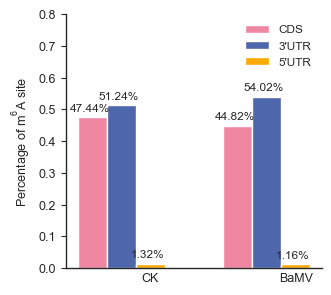

In [39]:
# Figure each_sample_mod_site_distribution (mod-site percentage)
labels = [ "CK","BaMV"]
plt.rcParams['font.sans-serif'] = ['Arial']
sns.set_style(style='ticks')
x = np.arange(len(labels))  # the label locations
width = 0.2  # the width of the bars
# colors = ["lightcoral", "dodgerblue", "mediumseagreen","orange"]
fig, ax = plt.subplots(figsize=(3.3, 3.3))
rects1 = ax.bar(
    x + 0.2,
    distribution_df_percentage.T.iloc[:3,].cds[:2],
    width,
    label="CDS",
    color="#ef87a2",
)
rects2 = ax.bar(
    x + 0.4,
    distribution_df_percentage.T.iloc[:3,].utr3p[:2],
    width,
    label="3'UTR",
    color='#4e66ab',
)
rects3 = ax.bar(
    x + 0.6,
    distribution_df_percentage.T.iloc[:3,].utr5p[:2],
    width,
    label="5'UTR",
    color='#fcaa02',
)

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel("Percentage of $\mathregular{m^6A}$ site")
# ax.set_xlabel('sample')
ax.set_xticks([0.6, 1.6])  # 设置横坐标的位置
ax.set_xticklabels(labels)
ax.set_ylim(0, 0.8)
# ax.legend(loc='center',fontsize=8.5,frameon=False,mode='Fxpand',ncol=3,bbox_to_anchor=(0.05, 0.7, 0.5, 0.5))
ax.legend(loc="best", fontsize=8.5, frameon=False)

ax.spines["right"].set_visible(False)  # 去掉右边框
ax.spines["top"].set_visible(False)  # 去掉上边框


def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate(
            "{:.2%}".format(height),
            xy=(rect.get_x() + rect.get_width() / 2 -0.02, height),
            xytext=(0, 3),  # 3 points vertical offset
            textcoords="offset points",
            ha="center",
            va="bottom",
            fontsize=8.5,
        )


autolabel(rects1)
autolabel(rects2)
autolabel(rects3)

ax=plt.gca()
ax.xaxis.set_tick_params(size=0)
#ax.yaxis.set_tick_params(length=1.5)
ax.grid(False)
ax.spines['bottom'].set_linewidth(1)
ax.spines['left'].set_linewidth(1)
ax.spines['right'].set_linewidth(0)
ax.spines['top'].set_linewidth(0)


plt.savefig(
    m6A_fp+"Figure4.4_m6a_distribution_on_gene_body.pdf",
    format="pdf",
    dpi=600,
    bbox_inches="tight",
    transparent=True,
)
# plt.savefig(
#     "F:\\project\\DRS\\result\\02_m6A\\ratio_df\\Figure4.4_m6a_distribution_on_gene_body.ps",
#     format="ps",
#     dpi=600,
#     bbox_inches="tight",
#     transparent=True,
# )
plt.show()

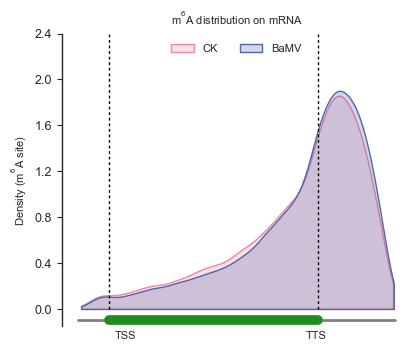

In [37]:
# Figure
f, ax = plt.subplots(figsize=(4.5, 3.8))
# f, ax = plt.subplots(1,1,figsize=(10, 6))
#sns.set_style('ticks')
tss = utr5p_sf
tts = utr5p_sf + 1
end = utr5p_sf + utr3p_sf + 1


scale_ls_x = np.linspace(0, 1.6, 8)
index_ls_x = ["","TSS","","","","TTS","",""]
plt.xticks(scale_ls_x, index_ls_x,fontsize=8)

ax.set_ylim(-0.15,2.4)
# ax.set_xlim(-0.1,1.6)

ax.plot([tss, tss], [0, 2.4], linestyle=(0, (2, 2)), lw=1, color="black")
ax.plot([tts, tts], [0, 2.4], linestyle=(0, (2, 2)), lw=1, color="black")
ax.plot([0, end], [-0.1, -0.1], lw=2, color="grey")
ax.plot([tss, tts], [-0.1, -0.1], lw=7, color="forestgreen")

sns.kdeplot(
    ck_ratio_df.rel_pos.dropna(),
    fill=True,
    cut=0,
    color='#ef87a2',
    label="CK",
    ax=ax,
)

sns.kdeplot(
    re_bm_ratio_df.rel_pos.dropna(),
    fill=True,
    cut=0,
    color='#4e66ab',#"#e45f4d",
    label="BaMV",
    ax=ax,
)


ax.legend(
    loc="upper center",
    fontsize=8,
    frameon=False,
    mode=None,
    ncol=4,
    #bbox_to_anchor=(0.1, 0.65, 0.8, 0.8),
)
ax=plt.gca()
ax.xaxis.set_tick_params(size=0)
#ax.yaxis.set_tick_params(length=1.5)
ax.grid(False)
ax.spines['bottom'].set_linewidth(0)
ax.spines['left'].set_linewidth(1)
ax.spines['right'].set_linewidth(0)
ax.spines['top'].set_linewidth(0)

ax.set_ylim(-0.15,2.4)
ax.set_ylabel("Density ($\mathregular{m^6A}$ site)", fontsize=8)
ax.set_xlabel('')
ax.set_yticks([0,.4,.8,1.2,1.6,2.0,2.4])
ax.set_title('$\mathregular{m^6A}$ distribution on mRNA',fontsize=8)
plt.savefig(
    m6A_fp+"Figure4.5_metagene_density_plot_0reads.pdf",
    format="pdf",
    dpi=600,
    bbox_inches="tight",
)

In [27]:
id=[]
for index,row in bm_ratio_df.iterrows():
    id.append(row[0]+'_'+str(row[2]))
bm_ratio_df['id'] = id
id=[]
for index,row in ck_ratio_df.iterrows():
    id.append(row[0]+'_'+str(row[2]))
ck_ratio_df['id'] = id

/tmp/ipykernel_15975/1089564392.py:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  id.append(row[0]+'_'+str(row[2]))
/tmp/ipykernel_15975/1089564392.py:7: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  id.append(row[0]+'_'+str(row[2]))


In [46]:
bm_ck_site

,gene_name,scaffold,position,bamv_mod_num,bamv_total_num,mod_ratio,label,exon_label,label_group,strand,distance,rel_pos,id,ck_mod_num,ck_total_num,ck_unmod_num,bamv_unmod_num
0,0,0,0.0,0.0,0.0,0.000000,0,0,0,0,0.0,0.000000,evm.model.FRAGSCAFF_1.28_4097413,8.0,15.0,7.0,0.0
1,evm.model.FRAGSCAFF_1.28,chr22.1,4097774.0,6.0,12.0,0.500000,utr3p1,exon9,utr3p,+,132.0,1.227608,evm.model.FRAGSCAFF_1.28_4097774,0.0,0.0,0.0,6.0
2,0,0,0.0,0.0,0.0,0.000000,0,0,0,0,0.0,0.000000,evm.model.FRAGSCAFF_1.28_4097951,9.0,31.0,22.0,0.0
3,evm.model.FRAGSCAFF_1.28,chr22.1,4097984.0,9.0,11.0,0.818182,utr3p1,exon9,utr3p,+,342.0,1.353400,evm.model.FRAGSCAFF_1.28_4097984,16.0,26.0,10.0,2.0
4,evm.model.FRAGSCAFF_1.28,chr22.1,4098043.0,6.0,7.0,0.857143,utr3p1,exon9,utr3p,+,401.0,1.388742,evm.model.FRAGSCAFF_1.28_4098043,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32124,evm.model.ORIGINAL_981.170,chr2.1,20040977.0,7.0,39.0,0.179487,utr3p1,exon13,utr3p,+,205.0,1.428118,evm.model.ORIGINAL_981.170_20040977,0.0,0.0,0.0,32.0
32125,0,0,0.0,0.0,0.0,0.000000,0,0,0,0,0.0,0.000000,evm.model.ORIGINAL_981.198_19657818,9.0,15.0,6.0,0.0
32126,evm.model.ORIGINAL_981.198,chr2.1,19657869.0,7.0,8.0,0.875000,utr3p1,exon4,utr3p,-,66.0,1.277601,evm.model.ORIGINAL_981.198_19657869,10.0,15.0,5.0,1.0
32127,evm.model.ORIGINAL_981.81,chr2.1,21665511.0,7.0,20.0,0.350000,cds1,exon1,cds,+,229.0,0.608377,evm.model.ORIGINAL_981.81_21665511,0.0,0.0,0.0,13.0


In [47]:
bm_site_num=bm_ratio_df[['id','mod_num','total_num']].rename(columns={'mod_num':'bamv_mod_num','total_num':'bamv_total_num'})
ck_site_num=ck_ratio_df[['id','mod_num','total_num']].rename(columns={'mod_num':'ck_mod_num','total_num':'ck_total_num'})
bm_ck_site=ck_site_num.merge(bm_site_num,how='outer').fillna(0)
bm_ck_site['ck_unmod_num'] = bm_ck_site['ck_total_num'] - bm_ck_site['ck_mod_num']
bm_ck_site['bamv_unmod_num'] = bm_ck_site['bamv_total_num'] - bm_ck_site['bamv_mod_num']

In [48]:
############################
### Fisher extract test ###
##########################
def get_fisher_test(df, phar=False):
    tab1 = df[['ck_mod_num','ck_unmod_num']]
    tab2 = df[['bamv_mod_num','bamv_unmod_num']]
    stat, p = stats.fisher_exact([tab1, tab2])
    if phar:
        phar.update(1)
    return p

phar = tqdm(total=len(bm_ck_site))
bm_ck_site["pvalue"] = bm_ck_site.apply(get_fisher_test, args=(phar,), axis=1)

phar.close()

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 32129/32129 [00:52<00:00, 616.03it/s]


In [49]:
bm_ck_site['ck_ratio'] = bm_ck_site['ck_mod_num'] / bm_ck_site['ck_total_num']
bm_ck_site['bm_ratio'] = bm_ck_site['bamv_mod_num'] / bm_ck_site['bamv_total_num']
bm_ck_site['fc']=bm_ck_site['bm_ratio'] / bm_ck_site['ck_ratio']
bm_ck_site['fc_2']=bm_ck_site['bm_ratio'] - bm_ck_site['ck_ratio']
gene_id=[]
for i in bm_ck_site.id:
    id = '_'.join([i.split('_')[0],i.split('_')[1]])
    #print(id)
    gene_id.append(id)
len(gene_id)
bm_ck_site['gene_name'] = gene_id
bm_ck_site['diff_label'] = np.where((bm_ck_site['fc_2'] >0.1) & (bm_ck_site['pvalue']<0.05) ,'up', np.where((bm_ck_site['fc_2'] < -0.1) & (bm_ck_site['pvalue']<0.05),'down','stable'))

In [50]:
pos_ls=[]
for i in bm_ck_site.id:
    id = '_'.join([i.split('_')[0],i.split('_')[1]])
    pos = i.split('_')[-1]
    #print(id)
    gene_id.append(id)
    pos_ls.append(pos)

bm_ck_site['pos'] = pos_ls

In [51]:
bm_ck_site['diff_label'].value_counts()

diff_label
stable    31436
up          528
down        165
Name: count, dtype: int64

m6A motif

In [53]:
ck_genome_abandance = pd.read_csv(m6A_fp+"ck_genome_abandance.0.5.bed",sep='\t',names=['chr','pos','gene_id','fast5','relpos','motif'])
bm_genome_abandance = pd.read_csv(m6A_fp+"bmv_genome_abandance.0.5.bed",sep='\t',names=['chr','pos','gene_id','fast5','relpos','motif'])

In [54]:
ck_genome_abandance['gene_name'] = ck_genome_abandance['gene_id'].apply(get_transcript)
bm_genome_abandance['gene_name'] = bm_genome_abandance['gene_id'].apply(get_transcript)

In [57]:
gene_id=[]
for index,row in ck_genome_abandance.iterrows():
    id = row[6] + '_' +str(row[1])
    gene_id.append(id)
ck_genome_abandance['id'] = gene_id

gene_id=[]
for index,row in bm_genome_abandance.iterrows():
    id = row[6] + '_' +str(row[1])
    gene_id.append(id)
bm_genome_abandance['id'] = gene_id

/tmp/ipykernel_15975/315304241.py:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  id = row[6] + '_' +str(row[1])
/tmp/ipykernel_15975/315304241.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  id = row[6] + '_' +str(row[1])


In [58]:
pos_motif={}
for sample in ['ck','bm']:
    dat=eval(sample+'_genome_abandance')
    for index,row in dat.iterrows():
        id=row[-1]
        motif=row[5]
        if id not in pos_motif.keys():
            pos_motif[id] = []
            pos_motif[id].append(motif)
        else:
            if motif not in pos_motif.get(id):
                pos_motif[id].append(motif)

/tmp/ipykernel_15975/3915618825.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  id=row[-1]
/tmp/ipykernel_15975/3915618825.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  motif=row[5]


In [60]:
bm_ck_site['motif'] = bm_ck_site['id'].apply(lambda x:pos_motif.get(x)[0])

In [61]:
bm_ck_site

,id,ck_mod_num,ck_total_num,bamv_mod_num,bamv_total_num,ck_unmod_num,bamv_unmod_num,pvalue,ck_ratio,bm_ratio,fc,fc_2,gene_name,diff_label,pos,motif
0,evm.model.FRAGSCAFF_1.28_4097413,8.0,15.0,0.0,0.0,7.0,0.0,1.000000,0.533333,NaN,NaN,NaN,evm.model.FRAGSCAFF_1.28,stable,4097413,AGACA
1,evm.model.FRAGSCAFF_1.28_4097774,0.0,0.0,6.0,12.0,0.0,6.0,1.000000,NaN,0.500000,NaN,NaN,evm.model.FRAGSCAFF_1.28,stable,4097774,GAACA
2,evm.model.FRAGSCAFF_1.28_4097951,9.0,31.0,0.0,0.0,22.0,0.0,1.000000,0.290323,NaN,NaN,NaN,evm.model.FRAGSCAFF_1.28,stable,4097951,GAACT
3,evm.model.FRAGSCAFF_1.28_4097984,16.0,26.0,9.0,11.0,10.0,2.0,0.279343,0.615385,0.818182,1.329545,0.202797,evm.model.FRAGSCAFF_1.28,stable,4097984,GAACT
4,evm.model.FRAGSCAFF_1.28_4098043,0.0,0.0,6.0,7.0,0.0,1.0,1.000000,NaN,0.857143,NaN,NaN,evm.model.FRAGSCAFF_1.28,stable,4098043,GGACC
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32124,evm.model.ORIGINAL_981.170_20040977,0.0,0.0,7.0,39.0,0.0,32.0,1.000000,NaN,0.179487,NaN,NaN,evm.model.ORIGINAL_981.170,stable,20040977,GAACA
32125,evm.model.ORIGINAL_981.198_19657818,9.0,15.0,0.0,0.0,6.0,0.0,1.000000,0.600000,NaN,NaN,NaN,evm.model.ORIGINAL_981.198,stable,19657818,GAACT
32126,evm.model.ORIGINAL_981.198_19657869,10.0,15.0,7.0,8.0,5.0,1.0,0.368976,0.666667,0.875000,1.312500,0.208333,evm.model.ORIGINAL_981.198,stable,19657869,AGACT
32127,evm.model.ORIGINAL_981.81_21665511,0.0,0.0,7.0,20.0,0.0,13.0,1.000000,NaN,0.350000,NaN,NaN,evm.model.ORIGINAL_981.81,stable,21665511,GAACT


sites_relpos

In [62]:
rel_pos={}
distances={}
label_group={}
for index,row in bm_ratio_df.iterrows():
    id=row[-1]
    relpos=row[-2]
    distance = row[-3]
    label=row[-5]
    if id not in rel_pos.keys():
        rel_pos[id] = []
        rel_pos[id].append(relpos)
    if id not in distances.keys():
        distances[id] = []
        distances[id].append(distance)
    if id not in label_group.keys():
        label_group[id] = [] 
        label_group[id].append(label)
    else:
        if relpos not in rel_pos.get(id):
            rel_pos[id].append(relpos)
        if distance not in distances.get(id):
            distances[id].append(distance)
        if label not in label_group.get(id):
            label_group[id].append(label)
for index,row in ck_ratio_df.iterrows():
    id=row[-1]
    relpos=row[-2]
    distance = row[-3]
    label=row[-5]
    if id not in rel_pos.keys():
        rel_pos[id] = []
        rel_pos[id].append(relpos)
    if id not in distances.keys():
        distances[id] = []
        distances[id].append(distance)
    if id not in label_group.keys():
        label_group[id] = [] 
        label_group[id].append(label)
    else:
        if relpos not in rel_pos.get(id):
            rel_pos[id].append(relpos)
        if distance not in distances.get(id):
            distances[id].append(distance)
        if label not in label_group.get(id):
            label_group[id].append(label)

/tmp/ipykernel_15975/2144102637.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  id=row[-1]
/tmp/ipykernel_15975/2144102637.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  relpos=row[-2]
/tmp/ipykernel_15975/2144102637.py:7: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  distance = row[-3]
/tmp/ipykernel_15975/2144102637.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, inte

In [63]:
bm_ck_site['distance'] = bm_ck_site['id'].apply(lambda x:distances.get(x)[0])
bm_ck_site['rel_pos'] = bm_ck_site['id'].apply(lambda x:rel_pos.get(x)[0])
bm_ck_site['label_group'] = bm_ck_site['id'].apply(lambda x:label_group.get(x)[0])

In [66]:
bm_ck_site.to_csv(m6A_fp+'bm_ck_site.csv',index=False)

In [67]:
bm_ck_site

,id,ck_mod_num,ck_total_num,bamv_mod_num,bamv_total_num,ck_unmod_num,bamv_unmod_num,pvalue,ck_ratio,bm_ratio,fc,fc_2,gene_name,diff_label,pos,motif,distance,rel_pos,label_group
0,evm.model.FRAGSCAFF_1.28_4097413,8.0,15.0,0.0,0.0,7.0,0.0,1.000000,0.533333,NaN,NaN,NaN,evm.model.FRAGSCAFF_1.28,stable,4097413,AGACA,1087.0,1.036610,cds
1,evm.model.FRAGSCAFF_1.28_4097774,0.0,0.0,6.0,12.0,0.0,6.0,1.000000,NaN,0.500000,NaN,NaN,evm.model.FRAGSCAFF_1.28,stable,4097774,GAACA,132.0,1.227608,utr3p
2,evm.model.FRAGSCAFF_1.28_4097951,9.0,31.0,0.0,0.0,22.0,0.0,1.000000,0.290323,NaN,NaN,NaN,evm.model.FRAGSCAFF_1.28,stable,4097951,GAACT,309.0,1.333633,utr3p
3,evm.model.FRAGSCAFF_1.28_4097984,16.0,26.0,9.0,11.0,10.0,2.0,0.279343,0.615385,0.818182,1.329545,0.202797,evm.model.FRAGSCAFF_1.28,stable,4097984,GAACT,342.0,1.353400,utr3p
4,evm.model.FRAGSCAFF_1.28_4098043,0.0,0.0,6.0,7.0,0.0,1.0,1.000000,NaN,0.857143,NaN,NaN,evm.model.FRAGSCAFF_1.28,stable,4098043,GGACC,401.0,1.388742,utr3p
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32124,evm.model.ORIGINAL_981.170_20040977,0.0,0.0,7.0,39.0,0.0,32.0,1.000000,NaN,0.179487,NaN,NaN,evm.model.ORIGINAL_981.170,stable,20040977,GAACA,205.0,1.428118,utr3p
32125,evm.model.ORIGINAL_981.198_19657818,9.0,15.0,0.0,0.0,6.0,0.0,1.000000,0.600000,NaN,NaN,NaN,evm.model.ORIGINAL_981.198,stable,19657818,GAACT,117.0,1.377332,utr3p
32126,evm.model.ORIGINAL_981.198_19657869,10.0,15.0,7.0,8.0,5.0,1.0,0.368976,0.666667,0.875000,1.312500,0.208333,evm.model.ORIGINAL_981.198,stable,19657869,AGACT,66.0,1.277601,utr3p
32127,evm.model.ORIGINAL_981.81_21665511,0.0,0.0,7.0,20.0,0.0,13.0,1.000000,NaN,0.350000,NaN,NaN,evm.model.ORIGINAL_981.81,stable,21665511,GAACT,229.0,0.608377,cds


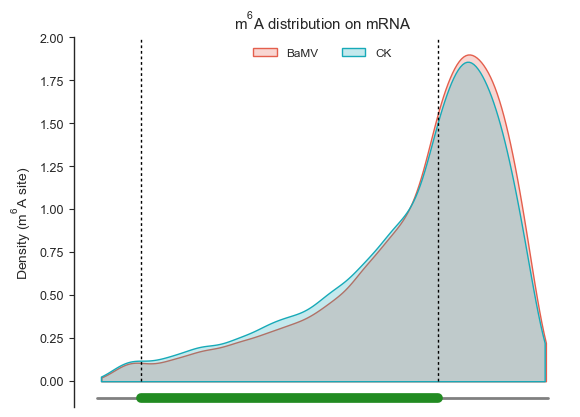

In [69]:
# Figure
plt.rcParams['font.sans-serif'] = ['Arial']
f, ax = plt.subplots(1, 1)
# f, ax = plt.subplots(1,1,figsize=(10, 6))
sns.set_style('ticks')
tss = utr5p_sf
tts = utr5p_sf + 1
end = utr5p_sf + utr3p_sf + 1


scale_ls_x = np.linspace(0, 1.6, 8)
index_ls_x = ["","","","","","","",""]
plt.xticks(scale_ls_x, index_ls_x)

ax.set_ylim(-0.15,2.0)
# ax.set_xlim(-0.1,1.6)

ax.plot([tss, tss], [0, 2.0], linestyle=(0, (2, 2)), lw=1, color="black")
ax.plot([tts, tts], [0, 2.0], linestyle=(0, (2, 2)), lw=1, color="black")
ax.plot([0, end], [-0.1, -0.1], lw=2, color="grey")
ax.plot([tss, tts], [-0.1, -0.1], lw=7, color="forestgreen")

sns.kdeplot(
    bm_ratio_df.rel_pos.dropna(),
    fill=True,
    cut=0,
    color="#e45f4d",
    label="BaMV",
    ax=ax,
)
sns.kdeplot(
    ck_ratio_df.rel_pos.dropna(),
    fill=True,
    cut=0,
    color="#17aab8",
    label="CK",
    ax=ax,
)


ax.legend(
    loc="upper center",
    fontsize=8.5,
    frameon=False,
    mode=None,
    ncol=4,
    #bbox_to_anchor=(0.1, 0.65, 0.8, 0.8),
)
ax=plt.gca()
ax.xaxis.set_tick_params(size=0)
#ax.yaxis.set_tick_params(length=1.5)
ax.grid(False)
ax.spines['bottom'].set_linewidth(0)
ax.spines['left'].set_linewidth(1)
ax.spines['right'].set_linewidth(0)
ax.spines['top'].set_linewidth(0)

# ax.set_ylim(-0.15,2.0)
ax.set_ylabel("Density ($\mathregular{m^6A}$ site)", fontsize=10)
ax.set_xlabel('')
ax.set_title('$\mathregular{m^6A}$ distribution on mRNA')
plt.savefig(
    m6A_fp+"Figure4.5_metagene_density_plot_0reads.pdf",
    format="pdf",
    dpi=600,
    bbox_inches="tight",
)

### 2. m6A regulator 

In [45]:
pro_abundance

,bamv_rep1(Normalized),bamv_rep2(Normalized),bamv_rep3(Normalized),ck_rep1(Normalized),ck_rep2(Normalized),ck_rep3(Normalized),log2fc,fc,ttest_pval1,Dla1_(FC_1.5_label),...,bamv_pro(Normalized),ck_pro(Normalized),bamv_rep1(Scaled),bamv_rep2(Scaled),bamv_rep3(Scaled),ck_rep1(Scaled),ck_rep2(Scaled),ck_rep3(Scaled),bamv_pro(Scaled),ck_pro(Scaled)
evm.model.ORIGINAL_5229.70,12752.6,14946.4,14953.8,16504.7,16780.8,18316.4,-0.274784,0.826574,0.032046,stable,...,14217.600000,17200.633333,81.2,95.1,95.2,105.1,106.8,116.6,90.500000,109.500000
evm.model.FRAGSCAFF_259.922,115937.1,119482.5,105951.4,114602.0,106162.9,123454.9,-0.011990,0.991724,0.889722,stable,...,113790.333333,114739.933333,101.5,104.6,92.7,100.3,92.9,108.0,99.600000,100.400000
evm.model.FRAGSCAFF_182.98,380597.3,349491.9,305504.8,460382.9,389667.2,385236.2,-0.254387,0.838343,0.111242,stable,...,345198.000000,411762.100000,100.6,92.3,80.7,121.6,103.0,101.8,91.200000,108.800000
evm.model.FRAGSCAFF_52.47,52244.8,52197.0,52523.4,79750.0,71292.8,70213.1,-0.495271,0.709428,0.002075,stable,...,52321.733333,73751.966667,82.9,82.8,83.3,126.5,113.1,111.4,83.000000,117.000000
evm.model.FRAGSCAFF_120.407,124512.6,140185.4,129203.1,111550.0,106139.2,119145.4,0.225793,1.169420,0.033559,stable,...,131300.366667,112278.200000,102.2,115.1,106.1,91.6,87.1,97.8,107.800000,92.166667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
evm.model.FRAGSCAFF_226.197,358.9,381.0,498.7,531.0,639.2,567.9,-0.488801,0.712617,0.036340,stable,...,412.866667,579.366667,72.3,76.8,100.5,107.0,128.8,114.5,83.200000,116.766667
evm.model.FRAGSCAFF_323.605,753.4,880.8,606.8,650.6,846.7,703.5,0.026115,1.018266,0.898337,stable,...,747.000000,733.600000,101.8,119.0,82.0,87.9,114.4,95.0,100.933333,99.100000
evm.model.FRAGSCAFF_154.219,287.2,348.9,286.7,211.4,201.2,224.5,0.534498,1.448438,0.011839,stable,...,307.600000,212.366667,110.5,134.2,110.3,81.3,77.4,86.3,118.333333,81.666667
evm.model.ORIGINAL_609.30_evm.model.ORIGINAL_609.31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,stable,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [61]:
tpm.columns

Index(['Row.names', 'baseMean', 'log2FoldChange', 'lfcSE', 'stat', 'pvalue',
       'padj', 'Dla-BaMV-1_L1_150A50', 'Dla-BaMV-2_L2_152A52',
       'Dla-BaMV-3_L2_153A53', 'Dla-CK-1_L1_154A54', 'Dla-CK-2_L1_155A55',
       'Dla-CK-3_L2_156A56', 'sig', 'transcript', 'len', 'gene_id',
       'gene_name', 'BaMV_1_TPM', 'BaMV_2_TPM', 'BaMV_3_TPM', 'CK_1_TPM',
       'CK_2_TPM', 'CK_3_TPM', 'BaMV_TPM', 'CK_TPM'],
      dtype='object')

In [100]:
gene_list_rna=gene_list.merge(tpm[['log2FoldChange','sig', 'gene_name']],how='left')

In [101]:
gene_list_rna=gene_list_rna.merge(pro_abundance[['log2fc','ttest_pval1',
       'Dla1_(FC_1.5_label)']],left_on='gene_name',right_index=True,how='left')

In [102]:
gene_list_rna=gene_list_rna.rename(columns={'log2FoldChange':'rna_log2fc','log2fc':'pro_log2fc'})

In [103]:
gene_list_rna[gene_list_rna['Type']=='m6A'].to_csv(m6A_fp+'m6A_regulator_rna_pro.csv',index=False)

In [104]:
m6A_regulator_rna_pro = pd.read_csv(m6A_fp+'m6A_regulator_rna_pro.csv')

In [105]:
m6A_regulator_rna_pro

,Type,func,type,use_Osname,use_name,gene_name,gene_id,rna_log2fc,sig,pro_log2fc,ttest_pval1,Dla1_(FC_1.5_label)
0,m6A,writer,HAKAI_A1,HAKAI,evm.model.FRAGSCAFF_395.53,evm.model.FRAGSCAFF_395.53,evm.TU.FRAGSCAFF_395.53,0.604006,none,NaN,NaN,NaN
1,m6A,writer,HAKAI_B1,HAKAI,evm.model.ORIGINAL_6124.159,evm.model.ORIGINAL_6124.159,evm.TU.ORIGINAL_6124.159,0.007609,none,NaN,NaN,NaN
2,m6A,writer,MTB_A1,MTB,evm.model.FRAGSCAFF_230.297,evm.model.FRAGSCAFF_230.297,evm.TU.FRAGSCAFF_230.297,0.019734,none,-0.238711,0.419119,stable
3,m6A,writer,MTC_A1,MTC,evm.model.FRAGSCAFF_230.630,evm.model.FRAGSCAFF_230.630,evm.TU.FRAGSCAFF_230.630,0.135996,none,NaN,NaN,NaN
4,m6A,writer,MTA_B1,MTA,evm.model.FRAGSCAFF_68.432,evm.model.FRAGSCAFF_68.432,evm.TU.FRAGSCAFF_68.432,-0.093647,none,NaN,NaN,NaN
5,m6A,writer,MTA_C1,MTA,evm.model.FRAGSCAFF_244.87,evm.model.FRAGSCAFF_244.87,evm.TU.FRAGSCAFF_244.87,0.388357,none,-0.111250,0.208339,stable
6,m6A,writer,MTB_C1,MTB,evm.model.FRAGSCAFF_271.223,evm.model.FRAGSCAFF_271.223,evm.TU.FRAGSCAFF_271.223,0.583010,none,NaN,NaN,NaN
7,m6A,writer,MTB_B1,MTB,evm.model.FRAGSCAFF_46.484,evm.model.FRAGSCAFF_46.484,evm.TU.FRAGSCAFF_46.484,0.007479,none,-0.097484,0.561903,stable
8,m6A,writer,Virilizer_A1,Virilizer,evm.model.FRAGSCAFF_123.37,evm.model.FRAGSCAFF_123.37,evm.TU.FRAGSCAFF_123.37,0.444177,none,0.351843,0.007516,stable
9,m6A,writer,Virilizer_B1,Virilizer,evm.model.ORIGINAL_2232.1,evm.model.ORIGINAL_2232.1,evm.TU.ORIGINAL_2232.1,0.629678,up,NaN,NaN,NaN


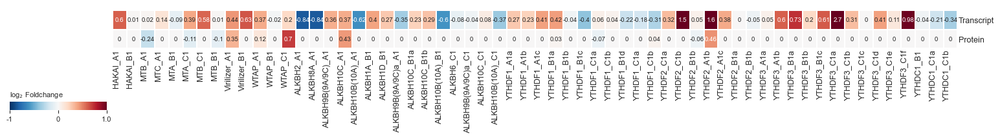

In [106]:
palette_DEP=sns.diverging_palette(240,17, s=60, l=60, as_cmap=True)
### set horizontal: exchange x and y
df=m6A_regulator_rna_pro[[ 'type','rna_log2fc','pro_log2fc']].fillna(0).set_index('type').rename(columns={'rna_log2fc':'Transcript','pro_log2fc':'Protein'}).T
cluster_map=sns.clustermap(round(df,2),cmap='RdBu_r',vmax=1.0,vmin=-1.0,
            figsize=(15 ,2.5), linewidths=0.2, linecolor="white",annot=True,annot_kws={"size": 7},dendrogram_ratio=(0.1,0.1),row_cluster=False,col_cluster=False,
            cbar_pos=(0.00, 0.3, 0.1 ,0.05),cbar_kws={'orientation':'horizontal'},yticklabels=True)
colorbar= cluster_map.ax_heatmap.collections[0].colorbar
ticks=[-1,0,1.0]
colorbar.set_ticks(ticks)
colorbar.set_ticklabels(ticks,fontsize=8) ##colorbar ticks length 
colorbar.ax.set_title(r'log$_2$ Foldchange',fontsize=8,loc='left')
cluster_map.ax_heatmap.set_xticklabels(cluster_map.ax_heatmap.get_xticklabels(),rotation=90,ha='right',fontsize=9) 
cluster_map.ax_heatmap.set_xlabel('')
cluster_map.ax_heatmap.set_yticklabels(cluster_map.ax_heatmap.get_yticklabels(),fontsize=9)
cluster_map.ax_heatmap.tick_params(pad=1,axis="y",length=0)
cluster_map.ax_heatmap.tick_params(pad=1,axis="x",length=0)
for label in cluster_map.ax_heatmap.get_yticklabels():
    label.set_rotation(0)
    label.set_fontsize(9)
plt.savefig(m6A_fp+'m6A_rna_pro_fondchange_heatmap.pdf',bbox_inches='tight',transparent=True)

In [120]:
bm_ck_site=pd.read_csv(m6A_fp+'bm_ck_site.csv')

In [123]:
bm_ck_site['fc_fillna']=bm_ck_site['fc'].fillna(0)

In [124]:
bm_ck_site_maxratio=bm_ck_site.loc[bm_ck_site.groupby('gene_name')['fc_fillna'].apply(lambda x:x.abs().idxmax())]
# bm_ck_site_maxratio.to_csv('F:\\project\\DRS\\result\\02_m6A\\ratio_df\\bm_ck_site_maxratio.csv',index=False)

In [156]:
df=gene_list.merge(bm_ck_site_maxratio[['gene_name','fc_fillna','pvalue']],how='left').rename(columns={'fc_fillna':'m6A_maxratio','pvalue':'m6A_pv'})

In [157]:
PAL=pd.read_csv('/home/qq/work/lxr/DRS/script_plot/bamv/PAL/Differential PAL in BaMV.csv',index_col=0)

In [158]:
df=df.merge(tpm[['transcript','log2FoldChange','pvalue']],left_on='gene_name',right_on='transcript',how='left').rename(columns={'log2FoldChange':'TPM_log2fc','pvalue':'TPM_pv'})
df = df.merge(PAL[['gene_name','log2fc','MHU_pvalue']],left_on='gene_name',right_on='gene_name',how='left').rename(columns={'log2fc':'PAL_log2fc','MHU_pvalue':'PAL_mwupv'})
df=df.merge(pro_abundance[['log2fc','ttest_pval1']],left_on='gene_name',right_index=True,how='left').rename(columns={'log2fc':'pro_log2fc','ttest_pval1':'pro_pv'})

In [159]:
df.to_csv(m6A_fp+'geneset_differemnce.csv',index=False)

In [160]:
plot_dat=df[df['Type']=='ABA'][['use_name','m6A_maxratio','PAL_log2fc','TPM_log2fc','pro_log2fc']].fillna(0)
plot_dat['use_name']= 'Dla'+plot_dat['use_name']
plot_dat=plot_dat.set_index('use_name')
plot_dat.columns=['m6A','PAL','TPM','Protein']

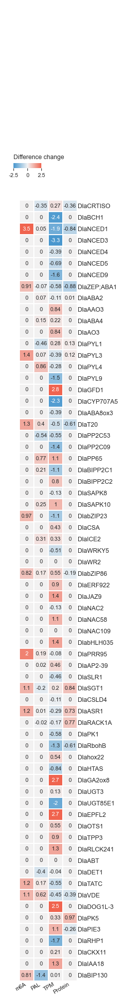

In [161]:
palette_DEP=sns.diverging_palette(240,17, s=80, l=60, as_cmap=True)
cluster_map=sns.clustermap(round(plot_dat,2),cmap=palette_DEP,figsize=(2.8,20),linewidths=0.2,linecolor='white',annot=True,annot_kws={"size": 8},
                           row_cluster=False,col_cluster=False,vmax=2.5,vmin=-2.5,cbar_pos=(0.11, 0.83, 0.2 ,0.005),cbar_kws={'orientation':'horizontal'},yticklabels=True)
colorbar= cluster_map.ax_heatmap.collections[0].colorbar
ticks=[-2.5,0,2.5]
colorbar.set_ticks(ticks)
colorbar.set_ticklabels(ticks,fontsize=8) ##colorbar ticks length 
colorbar.ax.set_title(r'Difference change',fontsize=9,loc='left')
cluster_map.ax_heatmap.set_xticklabels(cluster_map.ax_heatmap.get_xticklabels(),rotation=30,ha='right',fontsize=8) 
cluster_map.ax_heatmap.set_xlabel('')
cluster_map.ax_heatmap.set_ylabel('')
cluster_map.ax_heatmap.set_yticklabels(cluster_map.ax_heatmap.get_yticklabels(),fontsize=9)
cluster_map.ax_heatmap.tick_params(pad=1,axis="y",length=0)
cluster_map.ax_heatmap.tick_params(pad=1,axis="x",length=0)
for label in cluster_map.ax_heatmap.get_yticklabels():
    label.set_rotation(0)
    label.set_fontsize(9)
plt.savefig('/home/qq/work/lxr/DRS/script_plot/bamv/m6A/'+'ABA pathway gene in m6A_pal_TPM_pro_de_heatmap.pdf',bbox_inches='tight',transparent=True,dpi=300)

### 3. SMG & CMG

In [5]:
m6A_fp='/home/qq/work/lxr/DRS/script_plot/bamv/m6A/'
bamv_sf=1000000 / 526971
ck_sf=1000000 / 844249

In [13]:
pd.DataFrame(bm_mod_gene-ck_mod_gene,columns=['id']).to_csv(m6A_fp+'bamv_sms_geneid.csv',index=False)

In [163]:
smg_bamv=bm_mod_gene-ck_mod_gene
smg_ck=ck_mod_gene -bm_mod_gene
cmg=ck_mod_gene & bm_mod_gene

In [179]:
deseq2_bamv_ck_res=pd.read_csv('/home/qq/work/lxr/DRS/wig/deseq2_bamv_ck_res_1.5.csv')
pro_abundance=pd.read_csv('/home/qq/work/lxr/DRS/wig/pro_abundance.csv',index_col=0)
all_gene_median_ratio=pd.read_csv('/home/qq/work/lxr/DRS/script_plot/bamv/m6A/all_gene_median_ratio.csv')

In [180]:
all_gene_median_ratio

,gene_name,bm_mod_num,bm_median_ratio,ck_mod_num,ck_median_ratio,fc
0,evm.model.FRAGSCAFF_1.28,3.0,0.818182,3.0,0.533333,1.534091
1,evm.model.FRAGSCAFF_1.33,1.0,0.625000,5.0,0.653846,0.955882
2,evm.model.FRAGSCAFF_1.45_evm.model.FRAGSCAFF_1.47,3.0,0.413194,4.0,0.188592,2.190948
3,evm.model.FRAGSCAFF_1.63,1.0,0.941176,1.0,0.838710,1.122172
4,evm.model.FRAGSCAFF_1.68,NaN,NaN,1.0,0.384615,NaN
...,...,...,...,...,...,...
9431,evm.model.ORIGINAL_981.158,NaN,NaN,1.0,0.727273,NaN
9432,evm.model.ORIGINAL_981.167_evm.model.ORIGINAL_...,NaN,NaN,3.0,0.478261,NaN
9433,evm.model.ORIGINAL_981.170,6.0,0.234601,5.0,0.253165,0.926676
9434,evm.model.ORIGINAL_981.198,1.0,0.875000,2.0,0.633333,1.381579


In [166]:
bm_scaffold_pos = set(zip(bm_ratio_df.scaffold, bm_ratio_df.position))
ck_scaffold_pos = set(zip(ck_ratio_df.scaffold, ck_ratio_df.position))
bm_mod_gene = set(bm_ratio_df.gene_name.unique())
ck_mod_gene = set(ck_ratio_df.gene_name.unique())

In [168]:
# dla_cms_gene = pd.read_csv(m6A_fp+"SMg_CMg/dla_cms_gene.csv",names=['id'])
# dla_sms_bm_gene = pd.read_csv(m6A_fp+"SMg_CMg/dla_sms_bm_gene.csv",names=['id'])
# dla_sms_ck_gene = pd.read_csv(m6A_fp+"SMg_CMg/dla_sms_ck_gene.csv",names=['id'])

FileNotFoundError: [Errno 2] No such file or directory: '/home/qq/work/lxr/DRS/script_plot/bamv/m6A/SMg_CMg/dla_cms_gene.csv'

In [169]:
ck_smg_gene=ck_mod_gene - bm_mod_gene
bm_smg_gene=bm_mod_gene - ck_mod_gene
cmg_gene=ck_mod_gene & bm_mod_gene

In [172]:
DRS_rpm=pd.read_csv('/home/qq/work/lxr/DRS/wig/DRS_rpm.csv')

In [173]:
dla_sms_bm_gene_df = DRS_rpm[(DRS_rpm['gene_name'].isin(bm_smg_gene)) & (DRS_rpm['CK_RPM']!=0) & (DRS_rpm['BaMV_RPM']!=0)]
dla_sms_ck_gene_df = DRS_rpm[(DRS_rpm['gene_name'].isin(ck_smg_gene)) & (DRS_rpm['CK_RPM']!=0) & (DRS_rpm['BaMV_RPM']!=0)]
dla_cms_gene_df=DRS_rpm[(DRS_rpm['gene_name'].isin(cmg_gene)) & (DRS_rpm['CK_RPM']!=0) & (DRS_rpm['BaMV_RPM']!=0)]

In [174]:
pd.DataFrame(dla_sms_ck_gene_df.gene_name.unique(),columns=['id']).to_csv(m6A_fp+'SMg_CMg/smg_ck_geneid.csv',index=False)
pd.DataFrame(dla_sms_bm_gene_df.gene_name.unique(),columns=['id']).to_csv(m6A_fp+'SMg_CMg/smg_bm_geneid.csv',index=False)
pd.DataFrame(dla_cms_gene_df.gene_name.unique(),columns=['id']).to_csv(m6A_fp+'SMg_CMg/cmg_geneid.csv',index=False)

In [175]:
dla_sms_bm_gene_df[['gene_name', 'CK_count', 'BaMV_count', 'CK_RPM', 'BaMV_RPM']].merge(deseq2_bamv_ck_res[['sig', 'gene_name', 'BaMV_1_TPM', 'BaMV_2_TPM', 'BaMV_3_TPM', 'CK_1_TPM',
       'CK_2_TPM', 'CK_3_TPM', 'BaMV_TPM', 'CK_TPM','log2FoldChange','pvalue']]).to_csv(m6A_fp+'SMg_CMg/dla_smg_bm_gene_df_filter0RPM.csv')

dla_sms_ck_gene_df[['gene_name', 'CK_count', 'BaMV_count', 'CK_RPM', 'BaMV_RPM']].merge(deseq2_bamv_ck_res[['sig', 'gene_name', 'BaMV_1_TPM', 'BaMV_2_TPM', 'BaMV_3_TPM', 'CK_1_TPM',
       'CK_2_TPM', 'CK_3_TPM', 'BaMV_TPM', 'CK_TPM','log2FoldChange','pvalue']]).to_csv(m6A_fp+'SMg_CMg/dla_smg_ck_gene_df_filter0RPM.csv',index=False)

dla_cms_gene_df[['gene_name', 'CK_count', 'BaMV_count', 'CK_RPM', 'BaMV_RPM']].merge(deseq2_bamv_ck_res[['sig', 'gene_name', 'BaMV_1_TPM', 'BaMV_2_TPM', 'BaMV_3_TPM', 'CK_1_TPM',
       'CK_2_TPM', 'CK_3_TPM', 'BaMV_TPM', 'CK_TPM','log2FoldChange','pvalue']]).to_csv(m6A_fp+'SMg_CMg/dla_cmg_gene_df_filter0RPM.csv',index=False)

In [176]:
pd.DataFrame(dla_sms_ck_gene_df.gene_name.unique(),columns=['id']).to_csv(m6A_fp+'SMg_CMg/smg_ck_geneid.csv',index=False)
pd.DataFrame(dla_sms_bm_gene_df.gene_name.unique(),columns=['id']).to_csv(m6A_fp+'SMg_CMg/smg_bm_geneid.csv',index=False)
pd.DataFrame(dla_cms_gene_df.gene_name.unique(),columns=['id']).to_csv(m6A_fp+'SMg_CMg/cmg_geneid.csv',index=False)

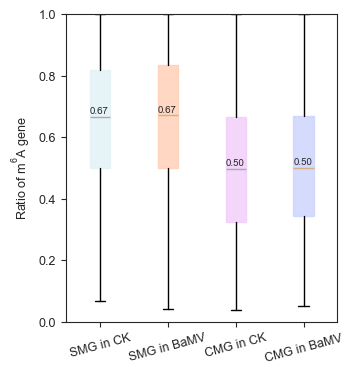

In [181]:
# Figure4.2.3 m6a_modification_ration_box_plot
smg_bm_mod_ratio = all_gene_median_ratio[all_gene_median_ratio['gene_name'].isin(dla_sms_bm_gene_df.gene_name.unique())].bm_median_ratio
smg_ck_mod_ratio = all_gene_median_ratio[all_gene_median_ratio['gene_name'].isin(dla_sms_ck_gene_df.gene_name.unique())].ck_median_ratio
cmg_bm_mod_ratio = all_gene_median_ratio[all_gene_median_ratio['gene_name'].isin(dla_cms_gene_df.gene_name.unique())].bm_median_ratio.dropna()
cmg_ck_mod_ratio = all_gene_median_ratio[all_gene_median_ratio['gene_name'].isin(dla_cms_gene_df.gene_name.unique())].ck_median_ratio.dropna()

sns.set_style(style='ticks')
fig = plt.figure(figsize=(3.5, 4))
ax = plt.subplot()
sample = [smg_ck_mod_ratio,smg_bm_mod_ratio, cmg_ck_mod_ratio,cmg_bm_mod_ratio]
# colors = ["lightcoral", "dodgerblue", "mediumseagreen","orange"]
#colors = ['#f9cfda','#b8c2dd',"#ffb2cc", "#8ce3e3"]
#colors = ["#e1f2f5", "#ffceb3","#f1ccf9","#cbd3fd"]

# colors_r = ["lightcoral", "lightcoral","dodgerblue","dodgerblue",  "mediumseagreen","mediumseagreen","orange","orange"]
#colors_r = ['#f9cfda','#f9cfda','#b8c2dd','#b8c2dd',"#aba6c6", "#aba6c6", "#d0c4bd", "#d0c4bd"]
#colors_r = ['#ef87a2','#ef87a2', '#4e66ab', '#4e66ab']
labels = ["SMG in CK", "SMG in BaMV", "CMG in CK","CMG in BaMV"]
#colors_2 =  ["#aba6c6", "#d7af83","#aba6c6", "#d7af83"]
colors_2 =  ["#aba6c6", "#d7af83","#aba6c6", "#d7af83"]
#colors_b = ["#d8acca", "#5378a8","#f2cbb7","#ee8468",]
colors_b=["#e1f2f5", "#ffceb3","#f1ccf9","#cbd3fd"]
plt.ylim(0, 1.0)
bplot = plt.boxplot(sample, patch_artist=True, labels=labels, widths=0.3,notch=False)
for patch, color in zip(bplot["medians"], colors_2):
    patch.set_color(color)
    patch.set_linewidth(1)
for patch, color in zip(bplot["boxes"], colors_b):
    patch.set_linewidth(1)
    patch.set_color(color)
    patch.set_alpha(0.8)
# for patch, color in zip(bplot["whiskers"], colors_r):
#     patch.set_linewidth(1)
#     patch.set_color(color)
#     patch.set_linestyle("--")
# for patch,color in zip(bplot['caps'], colors_r):
#     patch.set_color(color)
# plt.show()
# ax = plt.gca()
# ax.spines['top'].set_color('none')
# ax.spines['right'].set_color('none')
# adjust_spines(ax, ['left', 'bottom'])

######xticklabel rotation
plt.xticks(rotation=15)
plt.xticks(fontsize=9)
plt.yticks(fontsize=9)
#sns.despine(ax=ax, trim=True, offset=8)
plt.ylabel('Ratio of $\mathregular{m^6A}$ gene',fontsize=9)
plt.text(0.85,smg_ck_mod_ratio.median()+0.01,'%.2f' % (round(smg_ck_mod_ratio.median(),2)),fontsize=7)
plt.text(1.85,smg_bm_mod_ratio.median()+0.01,'%.2f' % (round(smg_bm_mod_ratio.median(),2)),fontsize=7)
plt.text(2.85,cmg_ck_mod_ratio.median()+0.01,'%.2f' % (round(cmg_ck_mod_ratio.median(),2)),fontsize=7)
plt.text(3.85,cmg_bm_mod_ratio.median()+0.01,'%.2f' % (round(cmg_bm_mod_ratio.median(),2)),fontsize=7)

plt.savefig(m6A_fp+'SMg_CMg/smg_cmg_m6a_modification_ratio_box_plot_2.pdf', format='pdf', dpi=600, bbox_inches='tight',transparent = True)
# plt.savefig('/media/usb/project/DRS/result/02_m6A/ratio_df/m6a_modification_ration_box_plot.ps', format='ps', dpi=600, bbox_inches='tight',transparent = True)

In [183]:
dla_cms_gene_df_filter0RPM = pd.read_csv(m6A_fp+"SMg_CMg/dla_cmg_gene_df_filter0RPM.csv")
dla_sms_ck_gene_df_filter0RPM = pd.read_csv(m6A_fp+"SMg_CMg/dla_smg_ck_gene_df_filter0RPM.csv")
dla_sms_bm_gene_df_filter0RPM = pd.read_csv(m6A_fp+"SMg_CMg/dla_smg_bm_gene_df_filter0RPM.csv")

In [184]:
df=pd.DataFrame({'SMG_CK':dla_sms_ck_gene_df_filter0RPM['CK_TPM'], 'SMG_BaMV':dla_sms_bm_gene_df_filter0RPM['BaMV_TPM'], 
              'CMG_CK':dla_cms_gene_df_filter0RPM['CK_TPM'], 'CMG_BaMV':dla_cms_gene_df_filter0RPM['BaMV_TPM']})

In [185]:
df_2=df.melt().dropna()
df_2.columns=['category','log2TPM']
df_2['log2TPM']=np.log2(df_2['log2TPM']+1)

In [187]:
df_2.to_csv(m6A_fp+'SMg_CMg/df_2.csv',index=False)

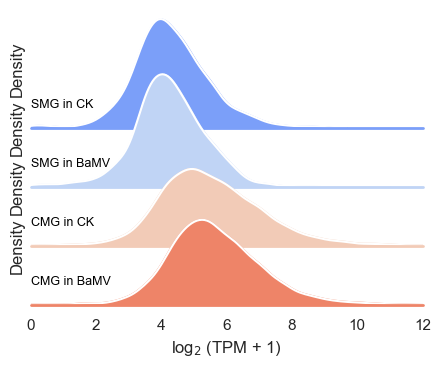

In [188]:
# Set the aesthetic style of the plots
sns.set(style="white",rc={'axes.facecolor':(0,0,0,0)})
categories=df_2['category'].unique()
categories_n={'SMG_CK':'SMG in CK', 'SMG_BaMV':'SMG in BaMV', 'CMG_CK':'CMG in CK', 'CMG_BaMV':'CMG in BaMV'}
# Create the ridge plot
g = sns.FacetGrid(df_2, row='category', hue='category', aspect=5, height=1.0, palette="coolwarm",xlim=(0,12))##height:每个子图高度**inch,asoect:高宽比

# Map the density plot to each category
g.map(sns.kdeplot, 'log2TPM', fill=True, common_norm=False, alpha=1, linewidth=1.5)
g.map(sns.kdeplot, 'log2TPM', color='white',linewidth=1.5,alpha=1)
def label(x,color,label):
    ax=plt.gca()
    label_u=categories_n[label]
    ax.text(0,.2,label_u,color='black',fontsize=9,va='center',ha='left',transform=ax.transAxes)
g.map(label,'category')
# Add a horizontal line at y=0 for each plot
g.map(plt.axhline, y=0, lw=2, clip_on=False)

# Set the x-axis label
g.set_axis_labels(r"log$_2$ (TPM + 1)")
# Remove the y-axis labels (for cleaner appearance)
g.set(yticks=[])
g.set(xticks=[0,2,4,6,8,10,12])
g.set_titles('')
# Adjust the subplots to make room for the labels
g.fig.subplots_adjust(hspace=-0.5)

# Remove the original x and y axes and draw a single x-axis across all subplots
g.despine(bottom=True, left=True)
#g.add_legend(None)
plt.savefig(m6A_fp+'SMg_CMg/SMg_CMg_bamv_ck_TPM_2.pdf',format="pdf",dpi=600,bbox_inches="tight",transparent=True)
plt.show()


In [189]:
smg_bm_ratio_df = bm_ratio_df[bm_ratio_df.gene_name.isin(dla_sms_bm_gene_df.gene_name.unique())]
smg_ck_ratio_df = ck_ratio_df[ck_ratio_df.gene_name.isin(dla_sms_ck_gene_df.gene_name.unique())]
cmg_bm_ratio_df = bm_ratio_df[bm_ratio_df.gene_name.isin(dla_cms_gene_df.gene_name.unique())]
cmg_ck_ratio_df = ck_ratio_df[ck_ratio_df.gene_name.isin(dla_cms_gene_df.gene_name.unique())]

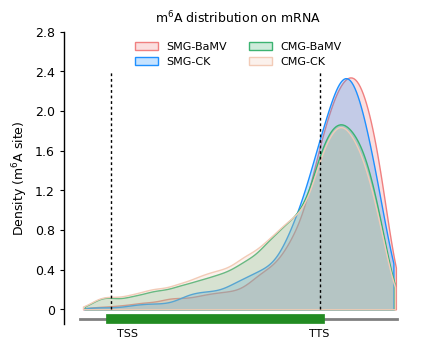

In [191]:
# Figure

sns.set(style="white",rc={'axes.facecolor':(0,0,0,0)})
plt.style.use('default')
f, ax = plt.subplots(figsize=(4.5, 3.8))
# f, ax = plt.subplots(1,1,figsize=(10, 6))
#sns.set_style('ticks')
tss = utr5p_sf
tts = utr5p_sf + 1
end = utr5p_sf + utr3p_sf + 1


scale_ls_x = np.linspace(0, 1.6, 8)
index_ls_x = ["","TSS","","","","TTS","",""]
plt.xticks(scale_ls_x, index_ls_x,fontsize=8)

ax.set_ylim(-0.15,2.8)
# ax.set_xlim(-0.1,1.6)

ax.plot([tss, tss], [0, 2.4], linestyle=(0, (2, 2)), lw=1, color="black")
ax.plot([tts, tts], [0, 2.4], linestyle=(0, (2, 2)), lw=1, color="black")
ax.plot([0, end], [-0.1, -0.1], lw=2, color="grey")
ax.plot([tss, tts], [-0.1, -0.1], lw=7, color="forestgreen")

samples = [smg_bm_ratio_df, smg_ck_ratio_df, cmg_bm_ratio_df, cmg_ck_ratio_df]
colors = ["lightcoral","dodgerblue", "mediumseagreen", "#f2cbb7"]
labels = ["SMG-BaMV", "SMG-CK", "CMG-BaMV","CMG-CK"]

for sample, color, label in zip(samples, colors, labels):
    sns.kdeplot(
        sample.rel_pos.dropna(), fill=True, cut=0, color=color, label=label, ax=ax
    )


ax.legend(
    loc="upper center",
    fontsize=8,
    frameon=False,
    mode=None,
    ncol=2,
    #bbox_to_anchor=(0.1, 0.65, 0.8, 0.8),
)
ax=plt.gca()
ax.xaxis.set_tick_params(size=0)
ax.yaxis.set_tick_params(length =3,color='black')
ax.grid(False)
ax.spines['bottom'].set_linewidth(0)
ax.spines['left'].set_linewidth(1)
ax.spines['right'].set_linewidth(0)
ax.spines['top'].set_linewidth(0)

ax.set_ylim(-0.15,2.4)
ax.set_ylabel("Density ($\mathregular{m^6A}$ site)", fontsize=9)
ax.set_xlabel('')
ax.set_yticks([0,.4,.8,1.2,1.6,2.0,2.4,2.8])
ax.set_yticklabels(labels=[0,.4,.8,1.2,1.6,2.0,2.4,2.8],fontsize=9)
ax.set_title('$\mathregular{m^6A}$ distribution on mRNA',fontsize=9)

plt.savefig(
    m6A_fp+"SMg_CMg\\Figure4.7_SMG_CMG_metagene_2.pdf",
    format="pdf",
    dpi=600,
    bbox_inches="tight",transparent=True
)
plt.show()

In [192]:
CNL_gene=gene_list

,Type,func,type,use_Osname,use_name,gene_name,gene_id
0,SA,synthesis,OsICS1,OsICS1,ICS1,evm.model.ORIGINAL_3527.134,evm.TU.ORIGINAL_3527.134
1,SA,synthesis,OsSGT1,OsSGT1,SGT1,evm.model.FRAGSCAFF_171.292,evm.TU.FRAGSCAFF_171.292
2,SA,synthesis,OsNPR1,OsNPR1,NPR1,evm.model.FRAGSCAFF_226.193,evm.TU.FRAGSCAFF_226.193
3,SA,synthesis,OsNPR3.3,OsNPR3.3,NPR3.3,evm.model.FRAGSCAFF_292.23,evm.TU.FRAGSCAFF_292.23
4,SA,synthesis,OsPAL6,OsPAL6,PAL6,evm.model.FRAGSCAFF_190.1431,evm.TU.FRAGSCAFF_190.1431
...,...,...,...,...,...,...,...
1091,PR,PR-15/16,PR-15/16,PR-15/16,PR-15/16,evm.model.FRAGSCAFF_346.31,evm.TU.FRAGSCAFF_346.31
1092,PR,PR-15/16,PR-15/16,PR-15/16,PR-15/16,evm.model.FRAGSCAFF_366.24,evm.TU.FRAGSCAFF_366.24
1093,PR,PR-15/16,PR-15/16,PR-15/16,PR-15/16,evm.model.FRAGSCAFF_132.474,evm.TU.FRAGSCAFF_132.474
1094,PR,PR-17,PR-17,PR-17,PR-17,evm.model.ORIGINAL_6124.146,evm.TU.ORIGINAL_6124.146


In [193]:
df=deseq2_bamv_ck_res[deseq2_bamv_ck_res['gene_name'].isin(gene_list[gene_list['Type']=='NBL'].gene_name)].set_index('gene_name')[['CK_1_TPM',
       'CK_2_TPM', 'CK_3_TPM','BaMV_1_TPM', 'BaMV_2_TPM', 'BaMV_3_TPM','sig','log2FoldChange','pvalue']]

In [194]:
df

,CK_1_TPM,CK_2_TPM,CK_3_TPM,BaMV_1_TPM,BaMV_2_TPM,BaMV_3_TPM,sig,log2FoldChange,pvalue
gene_name,,,,,,,,,
evm.model.ORIGINAL_980.8,0.614830,0.565291,0.541930,5.615301,7.568900,4.951882,up,3.036046,4.660000e-18
evm.model.FRAGSCAFF_59.109,0.603197,0.310573,0.402785,3.888747,4.804861,3.497897,up,2.869401,6.880000e-18
evm.model.FRAGSCAFF_196.23,1.192250,0.975129,1.094500,3.669096,4.945598,4.788704,up,1.726530,3.470000e-09
evm.model.FRAGSCAFF_132.35,1.070462,0.800901,0.775560,3.621306,5.632132,4.176072,up,2.000912,9.910000e-09
evm.model.FRAGSCAFF_173.458,2.661900,1.903819,2.108253,7.159290,8.536585,7.100209,up,1.439763,3.490000e-08
...,...,...,...,...,...,...,...,...,...
evm.model.ORIGINAL_6227.126,0.105525,0.085934,0.024964,0.000000,0.000000,0.451663,none,1.087296,4.890939e-01
evm.model.ORIGINAL_835.23,0.014566,0.000000,0.036182,0.000000,0.000000,0.000000,none,0.988195,8.040463e-01
evm.model.ORIGINAL_4753.30,0.507994,0.064351,0.186944,0.000000,0.000000,0.563707,none,0.002703,9.988938e-01


In [196]:
df['CK_TPM']=df[['CK_1_TPM','CK_2_TPM', 'CK_3_TPM']].apply('mean',axis=1)
df['BaMV_TPM']=df[['BaMV_1_TPM','BaMV_2_TPM', 'BaMV_3_TPM']].apply('mean',axis=1)

In [197]:
df.to_csv(m6A_fp+'NBL_TPM.csv')

In [198]:
dat=pro_abundance[pro_abundance.index.isin(gene_list[gene_list['Type']=='NBL'].gene_name)].dropna()[['ck_rep1(Normalized)', 'ck_rep2(Normalized)',
       'ck_rep3(Normalized)','bamv_rep1(Normalized)', 'bamv_rep2(Normalized)',
       'bamv_rep3(Normalized)', 'log2fc','ttest_pval1','Dla1_(FC_1.5_label)']]

In [199]:
dat.columns=['CK_rep1(Normalized)', 'CK_rep2(Normalized)',
       'CK_rep3(Normalized)','BaMV_rep1(Normalized)', 'BaMV_rep2(Normalized)',
       'BaMV_rep3(Normalized)', 'log2fc','ttest_pval1','Dla1_(FC_1.5_label)']

In [200]:
dat.to_csv(m6A_fp+'NBL_pro.csv')

In [ ]:
bm_ratio_df[bm_ratio_df.gene_name.isin(CNL_TPM_heatmap_clustermatrix.index)]['label_group'].value_counts()/42

SMS m6A regulator

In [206]:
gene_list[gene_list['Type']=='m6A'].merge(smg_bm_ratio_df)

,Type,func,type,use_Osname,use_name,gene_name,gene_id,scaffold,position,mod_num,total_num,mod_ratio,label,exon_label,label_group,strand,distance,rel_pos,id
0,m6A,writer,HAKAI_A1,HAKAI,evm.model.FRAGSCAFF_395.53,evm.model.FRAGSCAFF_395.53,evm.TU.FRAGSCAFF_395.53,chr29.1,22417874,7,13,0.538462,cds3,exon3,cds,+,1461.0,1.144448,evm.model.FRAGSCAFF_395.53_22417874
1,m6A,writer,WTAP_A1,WTAP,evm.model.ORIGINAL_665.58,evm.model.ORIGINAL_665.58,evm.TU.ORIGINAL_665.58,chr16.1,18846701,5,7,0.714286,utr3p1,exon13,utr3p,-,89.0,1.226670,evm.model.ORIGINAL_665.58_18846701
2,m6A,reader,YTHDC1_B1,YTHDC1,evm.model.FRAGSCAFF_245.206,evm.model.FRAGSCAFF_245.206,evm.TU.FRAGSCAFF_245.206,chr17.1,35926220,6,6,1.000000,utr3p1,exon7,utr3p,+,69.0,1.227983,evm.model.FRAGSCAFF_245.206_35926220
3,m6A,reader,YTHDC1_B1,YTHDC1,evm.model.FRAGSCAFF_245.206,evm.model.FRAGSCAFF_245.206,evm.TU.FRAGSCAFF_245.206,chr17.1,35926319,6,8,0.750000,utr3p1,exon7,utr3p,+,168.0,1.341969,evm.model.FRAGSCAFF_245.206_35926319


autography from BaaMV-specific modified gene

In [6]:
autography={'autophagy':['evm.model.FRAGSCAFF_250.171','evm.model.FRAGSCAFF_68.252','evm.model.FRAGSCAFF_259.59','evm.model.FRAGSCAFF_199.127','evm.model.ORIGINAL_1663.113'],
            'autophagosome assembly':['evm.model.FRAGSCAFF_250.171','evm.model.FRAGSCAFF_68.252','evm.model.FRAGSCAFF_199.127']}

In [7]:
df=pd.DataFrame({'gene_name':['evm.model.FRAGSCAFF_68.252','evm.model.FRAGSCAFF_259.59','evm.model.ORIGINAL_1663.113','evm.model.FRAGSCAFF_199.127','evm.model.FRAGSCAFF_250.171','evm.model.FRAGSCAFF_68.252'],
              'ty':['autophagy']*5 + ['autophagosome assembly']*1})

In [12]:
plot_dat=tpm[tpm['gene_name'].isin(df.gene_name)]

In [13]:
plot_dat['use_id']=['A','B','C','D','E']

/tmp/ipykernel_15975/3336890924.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plot_dat['use_id']=['A','B','C','D','E']


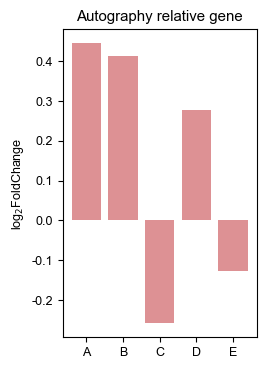

In [14]:
plt.figure(figsize=(2.5,4))
plt.bar(x=plot_dat['use_id'],height=plot_dat['log2FoldChange'],color='#dd9194')
plt.ylabel('log$_2$FoldChange')
plt.title('Autography relative gene')
plt.savefig(m6A_fp+'SMg_CMg/Autography relative gene TPM_fc.pdf',bbox_inches='tight',transparent=True)

In [15]:
plot_dat

,Row.names,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,Dla-BaMV-1_L1_150A50,Dla-BaMV-2_L2_152A52,Dla-BaMV-3_L2_153A53,...,gene_name,BaMV_1_TPM,BaMV_2_TPM,BaMV_3_TPM,CK_1_TPM,CK_2_TPM,CK_3_TPM,BaMV_TPM,CK_TPM,use_id
6070,evm.TU.ORIGINAL_1663.113,197.801738,0.445199,0.181421,2.453958,0.014129,0.080899,51,54,97,...,evm.model.ORIGINAL_1663.113,22.204535,31.690202,25.324994,15.345423,14.157055,16.515868,26.406577,15.339449,A
8355,evm.TU.FRAGSCAFF_199.127,207.958841,0.414039,0.201563,2.054144,0.039962,0.166236,59,45,113,...,evm.model.FRAGSCAFF_199.127,13.060046,13.426566,14.999516,9.795564,6.637043,8.837178,13.828709,8.423261,B
15842,evm.TU.FRAGSCAFF_68.252,148.733735,-0.258420,0.206676,-1.250366,0.211166,0.463421,34,24,66,...,evm.model.FRAGSCAFF_68.252,11.655410,11.089696,13.567465,12.926399,10.419321,12.254142,12.104190,11.866620,C
18851,evm.TU.FRAGSCAFF_259.59,94.971706,0.278787,0.275253,1.012839,0.311137,0.573672,37,20,33,...,evm.model.FRAGSCAFF_259.59,6.897956,5.025837,3.689256,3.962700,2.692830,3.438729,5.204350,3.364753,D
25342,evm.TU.FRAGSCAFF_250.171,128.279278,-0.127652,0.224086,-0.569657,0.568911,0.780324,33,18,63,...,evm.model.FRAGSCAFF_250.171,12.781835,9.397482,14.632749,11.139970,10.738462,11.496322,12.270688,11.124918,E


### 4. DE m6A

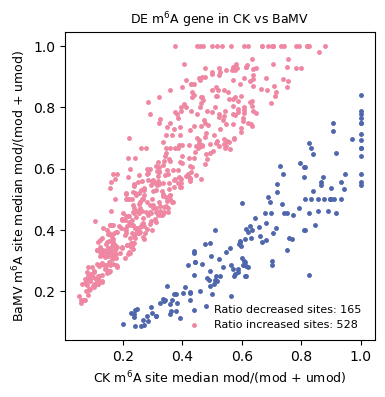

In [207]:
#Figure scater plot
#a=list(zip(ratio_inter_2b_2m[ratio_inter_2b_2m.scater_label == 'down']['2b_mod_ratio'],ratio_inter_2b_2m[ratio_inter_2b_2m.scater_label == 'down']['2m_mod_ratio']))
# mpl.rcParams.update(mpl.rcParamsDefault)
# mpl.rcParams.update({'font.sans-serif':'Arial','axes.unicode_minus':False})
#f, axes = plt.subplots(figsize=(4.3, 3.8))
fig,axes= plt.subplots(1,1,figsize=(4,4))
i=0
samples = [bm_ck_site]
labels = [('ck_ratio','bm_ratio')]

for sample,label,i in zip(samples,labels,range(2)):
    axes.scatter(sample[sample.diff_label == 'down'][label[0]],sample[sample.diff_label == 'down'][label[1]],color='#4e66ab',marker=".",s=5**2,label="Ratio decreased sites: %d " % len(sample[sample['diff_label']=='down']))
    axes.scatter(sample[sample.diff_label == 'up'][label[0]],sample[sample.diff_label == 'up'][label[1]],color='#ef87a2',marker=".",s=5**2,label="Ratio increased sites: %d " % len(sample[sample['diff_label']=='up']))
    #axes.scatter(sample[sample.diff_label == 'stable'][label[0]],sample[sample.diff_label == 'stable'][label[1]],color='darkgrey',marker=".",s=5**2)#,label=len(sample[sample.diff_label == 'stable']))
    # axes.set_xlim(0,1.02)
    # axes.set_ylim(0,1.02)
    axes.set_xlabel(label[0])
    axes.set_ylabel(label[1])
    axes.legend(frameon=False,fontsize=8)
    #axes.legend(("Ratio increased genes: %d " % len(data[data['diff_label']=='up']),"Ratio decreased genes: %d " % len(data[data['diff_label']=='up'])),fontsize=8,loc='lower right')
#plot((0.2, 0.3), (0.4,0.6) ,ls='--',c='k')
# slope_up = 1
# slope_dn = 1
# c = 0.1
# x_min, x_max = axes.get_xlim()
# y__up_min, y_up_max = c, c + slope_up*(x_max-x_min)
# y__dn_min, y_dn_max = -c, -c + slope_dn*(x_max-x_min)
# axes.plot([x_min, x_max], [y__dn_min, y_dn_max],linestyle='--',color='#4a4a4a',linewidth=1.3)
# axes.plot([x_min, x_max], [y__up_min, y_up_max],linestyle='--',color='#4a4a4a',linewidth=1.3)

#axes.set_xlim([x_min, x_max])
plt.xlabel('CK $\mathregular{m^6A}$ site median mod/(mod + umod)',fontsize=9)
plt.ylabel('BaMV $\mathregular{m^6A}$ site median mod/(mod + umod)',fontsize=9)
plt.title('DE $\mathregular{m^6A}$ gene in CK vs BaMV',fontsize=9)
plt.savefig(m6A_fp+'ratio_0.1_diff_gene_scatter_0reads.pdf', format='pdf', dpi=600, bbox_inches='tight',transparent = True)
plt.show()

In [70]:
def assign_dmr_type(dmr):
    if dmr > 0:
        return "gain"
    else:
        return "loss"
def assign_FC_type(FC):
    if FC > 1:
        return "gain"
    elif FC < 1: 
        return "loss"
    
def get_difference_m6a_sites(ratio_inter_df, sample1, sample2, dmr):
    label1 = "".join([sample1, "_ratio"])
    label2 = "".join([sample2, "_ratio"])
    df = ratio_inter_df.copy()
    df.loc[:, "dmr"] = ratio_inter_df[label1] - ratio_inter_df[label2]
    #df.loc[:, "FC"] = ratio_inter_df[label1] / ratio_inter_df[label2]
    df = df[abs(df["dmr"]) >= dmr]  # dmr_set:0.3
    #df= df[(df['FC']>1.5) | (df['FC']<0.667)]
    df.loc[:, "dmr_type"] = df["dmr"].apply(assign_dmr_type)
    #df.loc[:,'FC_type'] = df["FC"].apply(assign_FC_type)
    return df

In [71]:
inte_sites=set(bm_ratio_df.id) & set(ck_ratio_df.id)
inte_bm_ck_site = bm_ck_site[bm_ck_site['id'].isin(inte_sites)]
dmr_bm_ck = get_difference_m6a_sites(inte_bm_ck_site, "bm", "ck", 0.1)

In [81]:
up_site = bm_ck_site[bm_ck_site['diff_label'] == 'up']
dn_site = bm_ck_site[bm_ck_site['diff_label'] == 'down']

In [82]:
de_percent = pd.DataFrame([up_site['motif'].value_counts() / len(up_site['motif']),dn_site['motif'].value_counts() / len(dn_site['motif'])],index=['up_percent','down_percent']).T

In [83]:
de_percent.to_csv(m6A_fp+'DE_m6A_site_motifpercent.csv')

In [91]:
de_percent=pd.read_csv(m6A_fp+'DE_m6A_site_motifpercent.csv',index_col=0)

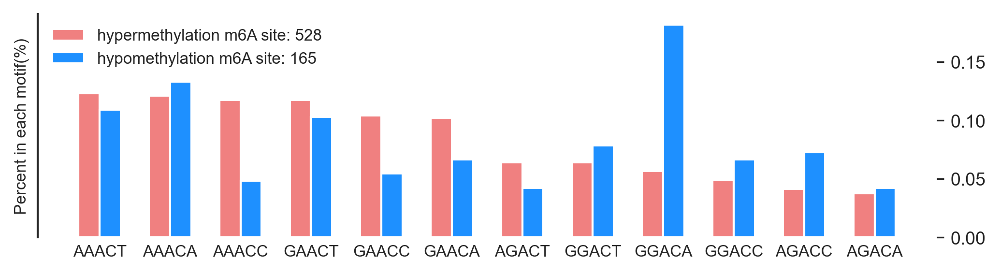

In [95]:
fig, ax = plt.subplots(1,1, figsize=(8,2), dpi=300)
wd = 0.6
pos = np.arange(0, len(de_percent.index))
motif_cl = {"down_percent":"dodgerblue","up_percent":"lightcoral"}
legend_labels={"down_percent":'hypomethylation m6A site: %s' % (len(dn_site)),"up_percent":'hypermethylation m6A site: %s' % (len(up_site))}
for label, values in de_percent.items():
    ax.bar(x=pos-wd/4, height=list(values), color=motif_cl[label], width=wd/2, label=legend_labels[label])
    pos = pos + wd/2
ax.set_xticks(labels=de_percent.index, ticks=pos-wd, fontsize=8)
ax.set_ylabel("Percent in each motif(%)", fontsize=8)
ax.legend(frameon=False, fontsize=8)
ax=plt.gca()
ax.xaxis.set_tick_params(size=0)
#ax.yaxis.set_tick_params(length=1.5)
ax.grid(False)
ax.spines['bottom'].set_linewidth(0)
ax.spines['left'].set_linewidth(1)
ax.spines['right'].set_linewidth(0)
ax.spines['top'].set_linewidth(0)
#ax.invert_xaxis()
ax.yaxis.tick_right()
# ax.yaxis.set_ticks_position('right')


plt.savefig(m6A_fp+"DE_m6A_site_motif_percent.pdf", bbox_inches="tight")
plt.show()

In [93]:
de_percent

,up_percent,down_percent
motif,,
AAACT,0.123106,0.109091
AAACA,0.121212,0.133333
AAACC,0.117424,0.048485
GAACT,0.117424,0.103030
GAACC,0.104167,0.054545
GAACA,0.102273,0.066667
AGACT,0.064394,0.042424
GGACT,0.064394,0.078788
GGACA,0.056818,0.181818


In [126]:
pd.DataFrame(dn_site[dn_site['motif']=='GGACA'].gene_name.unique(),columns=['id']).to_csv(m6A_fp+'dn_GGACA_geneid.csv',index=False)

DE m6A sites distribution

In [74]:
anno_cds_level_groups = anno_cds_level.groupby(["gene_name","label_group"])
# re-scale the widths of the 5'UTR and 3'UTR relative to the CDS (which is set constant to a width of 1 unit)
# 1.calculate a simple scale factor (SF)
utr5p_sf = (
    anno_gene_level.total_utr5p_length.dropna().median()
    / anno_gene_level.total_cds_length.dropna().median()
)
utr3p_sf = (
    anno_gene_level.total_utr3p_length.dropna().median()
    / anno_gene_level.total_cds_length.dropna().median()
)

In [75]:
bm_ck_site=pd.read_csv(m6A_fp+'bm_ck_site.csv')

In [76]:
bm_ck_site

,id,ck_mod_num,ck_total_num,bamv_mod_num,bamv_total_num,ck_unmod_num,bamv_unmod_num,pvalue,ck_ratio,bm_ratio,fc,fc_2,gene_name,diff_label,pos,motif,distance,rel_pos,label_group
0,evm.model.FRAGSCAFF_1.28_4097413,8.0,15.0,0.0,0.0,7.0,0.0,1.000000,0.533333,NaN,NaN,NaN,evm.model.FRAGSCAFF_1.28,stable,4097413,AGACA,1087.0,1.036610,cds
1,evm.model.FRAGSCAFF_1.28_4097774,0.0,0.0,6.0,12.0,0.0,6.0,1.000000,NaN,0.500000,NaN,NaN,evm.model.FRAGSCAFF_1.28,stable,4097774,GAACA,132.0,1.227608,utr3p
2,evm.model.FRAGSCAFF_1.28_4097951,9.0,31.0,0.0,0.0,22.0,0.0,1.000000,0.290323,NaN,NaN,NaN,evm.model.FRAGSCAFF_1.28,stable,4097951,GAACT,309.0,1.333633,utr3p
3,evm.model.FRAGSCAFF_1.28_4097984,16.0,26.0,9.0,11.0,10.0,2.0,0.279343,0.615385,0.818182,1.329545,0.202797,evm.model.FRAGSCAFF_1.28,stable,4097984,GAACT,342.0,1.353400,utr3p
4,evm.model.FRAGSCAFF_1.28_4098043,0.0,0.0,6.0,7.0,0.0,1.0,1.000000,NaN,0.857143,NaN,NaN,evm.model.FRAGSCAFF_1.28,stable,4098043,GGACC,401.0,1.388742,utr3p
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32124,evm.model.ORIGINAL_981.170_20040977,0.0,0.0,7.0,39.0,0.0,32.0,1.000000,NaN,0.179487,NaN,NaN,evm.model.ORIGINAL_981.170,stable,20040977,GAACA,205.0,1.428118,utr3p
32125,evm.model.ORIGINAL_981.198_19657818,9.0,15.0,0.0,0.0,6.0,0.0,1.000000,0.600000,NaN,NaN,NaN,evm.model.ORIGINAL_981.198,stable,19657818,GAACT,117.0,1.377332,utr3p
32126,evm.model.ORIGINAL_981.198_19657869,10.0,15.0,7.0,8.0,5.0,1.0,0.368976,0.666667,0.875000,1.312500,0.208333,evm.model.ORIGINAL_981.198,stable,19657869,AGACT,66.0,1.277601,utr3p
32127,evm.model.ORIGINAL_981.81_21665511,0.0,0.0,7.0,20.0,0.0,13.0,1.000000,NaN,0.350000,NaN,NaN,evm.model.ORIGINAL_981.81,stable,21665511,GAACT,229.0,0.608377,cds


In [77]:
de = bm_ck_site[bm_ck_site['diff_label'] != 'stable']

In [78]:
fl={}
for mark,values in de.groupby('diff_label'):
    pos_data={'cds':0, 'utr3p':0, 'utr5p':0}
    for label,num in values.groupby('label_group'):
        for flag in pos_data.keys():
            if flag in label:
                pos_data[flag] += len(num)
    if mark == 'up':
        fl['gain'] = pos_data
    elif mark =='down':
        fl['loss'] = pos_data

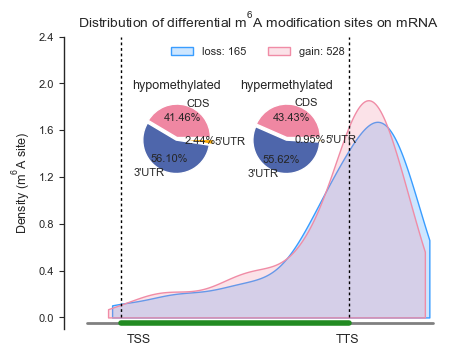

In [79]:
# Figure Differential_modification_site_distribution
##dmr > 0.3 'gain' ;dmr < 0.3 'loss'
plt.rcParams['font.sans-serif'] = ['Arial']
f, axes = plt.subplots(figsize=(5, 3.8))
#sns.set_style(style='ticks')
#sns.set_theme()
tss = utr5p_sf
tts = utr5p_sf + 1
end = utr5p_sf + utr3p_sf + 1
dmrs = [de]
for dmr, i in zip(dmrs, range(2)):
    scale_ls_x = np.linspace(0,1.6,8)
    index_ls_x = ['','','','','','','','']
    plt.xticks(scale_ls_x,index_ls_x)

    axes.set_ylim(0,2.5)
    axes.set_xlim(-0.1,1.6)

    axes.plot([tss, tss], [0, 2.4], linestyle=(0, (2, 2)), lw=1, color="black")
    axes.plot([tts, tts], [0, 2.4], linestyle=(0, (2, 2)), lw=1, color="black")
    axes.plot([0, end], [-0.05, -0.05], lw=2, color="grey")
    axes.plot([tss, tts], [-0.05, -0.05], lw=4, color="forestgreen")
    
    sns.kdeplot(
            dmr[dmr["diff_label"] == "down"]["rel_pos"].dropna(),
            fill=True,
            cut=0,
            color="#399dff",#"#e45f4d",
            label="loss: %s" %(len(dmr[dmr["diff_label"] == "down"])),
        )
    sns.kdeplot(
        dmr[dmr["diff_label"] == "up"]["rel_pos"].dropna(),
        fill=True,
        cut=0,
        color="#f08ca6",#"#17aab8",
        label="gain: %s" %(len(dmr[dmr["diff_label"] == "up"])),
    )
    

    axes.legend(loc="upper center", fontsize=8, frameon=False,mode=None,ncol=2)
    ytick=np.linspace(0,2.4,6)
    #axes.set_yticks(ytick,fontsize=8)
    plt.tick_params(labelsize=8)
    axes.set_ylim(-0.15, 2.4)
    axes.set_xticklabels(["",'TSS','','','','TTS',"",''],size=9)
    axes.set_xlabel("")
    #axes.set_ylabel("")
    #axes.set_yticks([0,.2,.4,.6,.8,1,1.2])
    axes.set_yticks([0,.4,.8,1.2,1.6,2.0,2.4])
    axes.set_axis_on()
    #axes.set_yticklabels(['','','','','','',''])

    ax=plt.gca()
    ax.xaxis.set_tick_params(size=0)
    #ax.yaxis.set_tick_params(length=1.5)
    ax.grid(False)
    ax.spines['bottom'].set_linewidth(0)
    ax.spines['left'].set_linewidth(1)
    ax.spines['right'].set_linewidth(0)
    ax.spines['top'].set_linewidth(0)

    ax.set_ylim(-0.1,2.4)
    ax.set_ylabel("Density ($\mathregular{m^6A}$ site)", fontsize=9)
    ax.set_xlabel('')
    ax.set_title('Distribution of differential $\mathregular{m^6A}$ modification sites on mRNA',fontsize=10)

h = 0.5
w = 0.22
n = 0
title={'gain':'hypermethylated','loss':'hypomethylated'}
for label, values in fl.items():
    axes = f.add_axes([0.24+n*0.22, h, w,w])
    axes.pie(values.values(), labels=["CDS","3'UTR","5'UTR"], colors=['#ef87a2','#4e66ab','#fcaa02'],
            explode=[0.05, 0.03, 0.1], labeldistance = 1.05, textprops={"fontsize":8},
            autopct = '%3.2f%%')
    axes.set_title(title.get(label), fontsize=9)
    n += 1
plt.savefig(
    m6A_fp+"Figure4.8_0.1dmr_Differential_modification_site_distribution_labelgroup_pie.pdf",
    format="pdf",
    dpi=600,
    bbox_inches="tight",transparent=True
)
plt.show()

In [80]:
fl

{'loss': {'cds': 68, 'utr3p': 92, 'utr5p': 4},
 'gain': {'cds': 228, 'utr3p': 292, 'utr5p': 5}}

In [96]:
pd.DataFrame(bm_ck_site[bm_ck_site['diff_label']=='up'].gene_name.unique()).to_csv(m6A_fp+'up_m6A_gene.csv',index=False)
pd.DataFrame(bm_ck_site[bm_ck_site['diff_label']=='down'].gene_name.unique()).to_csv(m6A_fp+'down_m6A_gene.csv',index=False)

### 5. pro & TPM  & m6A

In [28]:
# de =bm_ck_site[bm_ck_site['diff_label'] != 'stable']
deseq2_bamv_ck=pd.read_csv('/home/qq/work/lxr/DRS/wig/deseq2_bamv_ck_res_1.5.csv')
pro_abundance=pd.read_csv('/home/qq/work/lxr/DRS/wig/pro_abundance.csv',index_col=0)

In [99]:
de

,id,ck_mod_num,ck_total_num,bamv_mod_num,bamv_total_num,ck_unmod_num,bamv_unmod_num,pvalue,ck_ratio,bm_ratio,fc,fc_2,gene_name,diff_label,pos,motif,distance,rel_pos,label_group
12,evm.model.FRAGSCAFF_1.45_evm.model.FRAGSCAFF_1...,138.0,531.0,119.0,288.0,393.0,169.0,0.000009,0.259887,0.413194,1.589900,0.153307,evm.model.FRAGSCAFF_1.45,up,3667336,AAACC,11.0,1.159016,utr3p
78,evm.model.FRAGSCAFF_108.169_12399084,8.0,62.0,12.0,41.0,54.0,29.0,0.046137,0.129032,0.292683,2.268293,0.163651,evm.model.FRAGSCAFF_108.169,up,12399084,AAACT,179.0,0.584061,cds
104,evm.model.FRAGSCAFF_112.16_9746033,27.0,43.0,23.0,26.0,16.0,3.0,0.026548,0.627907,0.884615,1.408832,0.256708,evm.model.FRAGSCAFF_112.16,up,9746033,AAACA,34.0,1.174937,utr3p
124,evm.model.FRAGSCAFF_112.63_8965778,64.0,498.0,45.0,196.0,434.0,151.0,0.001636,0.128514,0.229592,1.786511,0.101078,evm.model.FRAGSCAFF_112.63,up,8965778,GAACA,707.0,0.928891,cds
152,evm.model.FRAGSCAFF_113.11_6595194,11.0,53.0,13.0,30.0,42.0,17.0,0.043308,0.207547,0.433333,2.087879,0.225786,evm.model.FRAGSCAFF_113.11,up,6595194,GAACA,156.0,1.360509,utr3p
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31798,evm.model.ORIGINAL_928.190_53090739,14.0,14.0,9.0,13.0,0.0,4.0,0.040741,1.000000,0.692308,0.692308,-0.307692,evm.model.ORIGINAL_928.190,down,53090739,GGACT,250.0,1.389785,utr3p
31855,evm.model.ORIGINAL_928.74_54011298,26.0,51.0,5.0,21.0,25.0,16.0,0.039967,0.509804,0.238095,0.467033,-0.271709,evm.model.ORIGINAL_928.74,down,54011298,AAACA,953.0,1.000191,cds
31977,evm.model.ORIGINAL_979.193_19423570,19.0,132.0,16.0,56.0,113.0,40.0,0.038916,0.143939,0.285714,1.984962,0.141775,evm.model.ORIGINAL_979.193,up,19423570,GGACA,775.0,1.001123,cds
32013,evm.model.ORIGINAL_979.260_18476499,18.0,18.0,9.0,14.0,0.0,5.0,0.009942,1.000000,0.642857,0.642857,-0.357143,evm.model.ORIGINAL_979.260,down,18476499,GAACT,71.0,1.256525,utr3p


In [100]:
max_ratio={}
for gene,temp in de.groupby('gene_name'):
    max_ratio[gene]=''
    ratio_temp=abs(temp['fc_2'].max())
    ratio_h = float(temp[abs(temp['fc_2'])==ratio_temp].fc_2)
    #print(ratio_h)
    ratio = ratio_h
    #print(ratio)
    max_ratio[gene]=ratio

/tmp/ipykernel_15975/3767785971.py:5: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  ratio_h = float(temp[abs(temp['fc_2'])==ratio_temp].fc_2)


In [104]:
gene_bm_ck_maxratio = pd.DataFrame.from_dict(max_ratio,orient='index',columns=['max_ratio']).reset_index()
gene_bm_ck_maxratio = gene_bm_ck_maxratio.rename(columns={'index':'gene_name'})
DEGS_DEratio_gene = set(deseq2_bamv_ck[(abs(deseq2_bamv_ck['log2FoldChange']) > 0.58) & (deseq2_bamv_ck['pvalue'] <0.05) ].gene_name) & set(gene_bm_ck_maxratio.gene_name)
gene_bm_ck_maxratio_TPM = gene_bm_ck_maxratio.merge(deseq2_bamv_ck[deseq2_bamv_ck['gene_name'].isin(DEGS_DEratio_gene)][['gene_name','log2FoldChange']]).rename(columns={'log2FoldChange':'TPM_log2fc'})
DEPs_DEratio_gene = set(pro_abundance[pro_abundance['Dla1_(FC_1.5_label)']!='stable'].index) & set(bm_ck_site[bm_ck_site['diff_label'] != 'stable']['gene_name'])
gene_bm_ck_maxratio_pro = gene_bm_ck_maxratio.merge(pro_abundance[pro_abundance.index.isin(DEPs_DEratio_gene)][['log2fc','Dla1_(FC_1.5_label)']],right_index=True,left_on='gene_name')

In [105]:
gene_bm_ck_maxratio_TPM['TPM_ratio_label'] = np.where((gene_bm_ck_maxratio_TPM['max_ratio'] > 0) & (gene_bm_ck_maxratio_TPM['TPM_log2fc'] >0),'hyper-up',np.where((gene_bm_ck_maxratio_TPM['max_ratio'] > 0) & (gene_bm_ck_maxratio_TPM['TPM_log2fc'] <0),'hyper-down',
                                                                                                                                              np.where((gene_bm_ck_maxratio_TPM['max_ratio'] < 0) & (gene_bm_ck_maxratio_TPM['TPM_log2fc'] >0),'hypo-up',np.where((gene_bm_ck_maxratio_TPM['max_ratio'] < 0) & (gene_bm_ck_maxratio_TPM['TPM_log2fc'] <0),'hypo-down','none'))))

gene_bm_ck_maxratio_pro['pro_ratio_label'] = np.where((gene_bm_ck_maxratio_pro['max_ratio']>0) & (gene_bm_ck_maxratio_pro['Dla1_(FC_1.5_label)']=='up'),'hyper-up',np.where((gene_bm_ck_maxratio_pro['max_ratio']>0) & (gene_bm_ck_maxratio_pro['Dla1_(FC_1.5_label)']=='down'),'hyper-down',np.where((gene_bm_ck_maxratio_pro['max_ratio']<0) & (gene_bm_ck_maxratio_pro['Dla1_(FC_1.5_label)']=='up'),'hypo-up',np.where((gene_bm_ck_maxratio_pro['max_ratio']<0) & (gene_bm_ck_maxratio_pro['Dla1_(FC_1.5_label)']=='down'),'hypo-down','none'))))
gene_bm_ck_maxratio_TPM_pro = gene_bm_ck_maxratio_TPM.merge(gene_bm_ck_maxratio_pro,how='outer')

In [106]:
gene_bm_ck_maxratio_TPM.to_csv(m6A_fp+'gene_bm_ck_maxratio_TPM.csv',index=False)

In [107]:
gene_bm_ck_maxratio_TPM.merge(gene_bm_ck_maxratio_pro,how='outer').to_csv(m6A_fp+'ratio_TPM_pro_fc_2.csv',index=False)

In [115]:
ratio_TPM_pro_fc=pd.read_csv(m6A_fp+'ratio_TPM_pro_fc_2.csv')

In [116]:
ratio_TPM_pro_fc

,gene_name,max_ratio,TPM_log2fc,TPM_ratio_label,log2fc,Dla1_(FC_1.5_label),pro_ratio_label
0,evm.model.FRAGSCAFF_108.169,0.163651,-0.954804,hyper-down,NaN,NaN,NaN
1,evm.model.FRAGSCAFF_112.63,0.101078,-0.895526,hyper-down,NaN,NaN,NaN
2,evm.model.FRAGSCAFF_113.121.3,0.305603,-0.846926,hyper-down,-0.850208,down,hyper-down
3,evm.model.FRAGSCAFF_119.151,0.235294,NaN,NaN,-0.660783,down,hyper-down
4,evm.model.FRAGSCAFF_127.207,0.173810,-0.693259,hyper-down,NaN,NaN,NaN
...,...,...,...,...,...,...,...
188,evm.model.ORIGINAL_821.225,0.219048,-2.045156,hyper-down,NaN,NaN,NaN
189,evm.model.ORIGINAL_928.101,0.248716,0.584553,hyper-up,NaN,NaN,NaN
190,evm.model.ORIGINAL_928.161,0.130529,-0.740264,hyper-down,NaN,NaN,NaN
191,evm.model.ORIGINAL_928.74,-0.271709,-1.120359,hypo-down,NaN,NaN,NaN


In [108]:
gene_bm_ck_maxratio_TPM

,gene_name,max_ratio,TPM_log2fc,TPM_ratio_label
0,evm.model.FRAGSCAFF_108.169,0.163651,-0.954804,hyper-down
1,evm.model.FRAGSCAFF_112.63,0.101078,-0.895526,hyper-down
2,evm.model.FRAGSCAFF_113.121.3,0.305603,-0.846926,hyper-down
3,evm.model.FRAGSCAFF_127.207,0.173810,-0.693259,hyper-down
4,evm.model.FRAGSCAFF_128.302,0.237843,-0.649140,hyper-down
...,...,...,...,...
170,evm.model.ORIGINAL_821.225,0.219048,-2.045156,hyper-down
171,evm.model.ORIGINAL_928.101,0.248716,0.584553,hyper-up
172,evm.model.ORIGINAL_928.161,0.130529,-0.740264,hyper-down
173,evm.model.ORIGINAL_928.74,-0.271709,-1.120359,hypo-down


In [109]:
gene_bm_ck_maxratio_pro.to_csv(m6A_fp+'ratio_TPM_pro_fc.csv',index=False)

In [110]:
important_gene = {'evm.model.ORIGINAL_6124.171':'protochlorophyllide reductase activity',
                  'evm.model.ORIGINAL_1958.103':'magnesium-protoporphyrin IX monomethyl ester (oxidative) cyclase activity',
                  'evm.model.FRAGSCAFF_68.622':'ABA synthesis OsNCED1',
                  'evm.model.ORIGINAL_6430.145':'calcium ion binding','evm.model.ORIGINAL_821.225':'calcium ion binding','evm.model.ORIGINAL_5442.107':'calcium ion binding',
                  'evm.model.ORIGINAL_3406.19':'heat shock protein binding',
                  'evm.model.FRAGSCAFF_19.946': 'glutathione peroxidase activity'}

In [117]:
dat = ratio_TPM_pro_fc

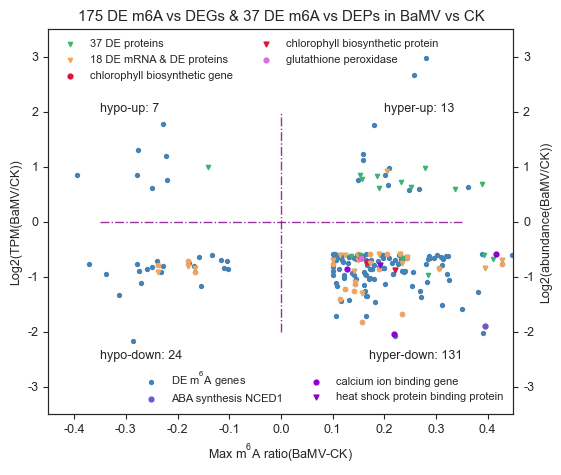

In [119]:

fig, ax = plt.subplots(1,1, figsize=(6, 5))
x=dat.max_ratio
dat_2=dat[~dat['log2fc'].isna()]
y1=dat['TPM_log2fc']
s1 = ax.scatter(x=x,y=y1,s=8,c='steelblue')
ax.scatter(x=dat_2['max_ratio'],y=dat_2['TPM_log2fc'],s=9,c='sandybrown')
ax.set_xlim(-0.45,0.45)
ax.set_ylim(-3.5,3.5)
ax.text(x=-0.35,y=2,s='hypo-up: %s' % len(dat[dat['TPM_ratio_label']=='hypo-up']))
ax.text(x=0.2,y=2,s='hyper-up: %s' % len(dat[dat['TPM_ratio_label']=='hyper-up']))
ax.text(x=0.17,y=-2.5,s='hyper-down: %s' % len(dat[dat['TPM_ratio_label']=='hyper-down']))
ax.text(x=-0.35,y=-2.5,s='hypo-down: %s' % len(dat[dat['TPM_ratio_label']=='hypo-down']))
y2=dat['log2fc']
dat_1=dat[~dat['TPM_log2fc'].isna()]
ax1=ax.twinx()
ax1.set_ylim(-3.5,3.5)
s3= plt.scatter(x=x,y=y2,marker='v',s=9,c='mediumseagreen',label='37 DE proteins')
s4= plt.scatter(x=dat_1['max_ratio'],y=dat_1['log2fc'],s=9,c='sandybrown',marker='v',label='18 DE mRNA & DE proteins')

s5_1=ax.scatter(data=dat[dat.gene_name.isin(list(important_gene.keys())[0:2])],x='max_ratio',y='TPM_log2fc',c='crimson',s=12)
s5_2=plt.scatter(data=dat[dat.gene_name.isin(list(important_gene.keys())[0:2])],x='max_ratio',y='log2fc',c='crimson',s=12,marker='v')
s6_1=plt.scatter(data=dat[dat.gene_name.isin([list(important_gene.keys())[2]])],x='max_ratio',y='TPM_log2fc',c='slateblue',s=12,label='NCED1')
s6_2=plt.scatter(data=dat[dat.gene_name.isin(list(important_gene.keys())[3:])],x='max_ratio',y='TPM_log2fc',c='darkviolet',s=12,label='stress response gene')
s6_3=plt.scatter(data=dat[dat.gene_name.isin(list(important_gene.keys())[3:])],x='max_ratio',y='log2fc',c='darkviolet',s=12,marker='v',label='stress response gene')
s6_4=plt.scatter(data=dat[dat.gene_name.isin([list(important_gene.keys())[-1]])],x='max_ratio',y='TPM_log2fc',c='orchid',s=12,label='glutathione peroxidase')
plt.vlines(x=0, ymax=2.0, ymin=-2.0, linestyle='-.',linewidth =1.0,colors='purple',alpha=.8)
plt.hlines(y=0, xmax=0.35, xmin=-0.35, linestyle='-.',linewidth =1.0,colors='purple',alpha=.8)
ax1.legend([s3,s4,s5_1,s5_2,s6_4],['37 DE proteins','18 DE mRNA & DE proteins','chlorophyll biosynthetic gene','chlorophyll biosynthetic protein','glutathione peroxidase'],loc='upper left',frameon=False,fontsize=8,ncol=2)
#ax.legend([s3,s4],['37 DE proteins','18 DE mRNA & DE proteins'],loc='upper center',frameon=False,fontsize=8)
ax.legend([s1,s6_1,s6_2,s6_3],['DE $\mathregular{m^6A}$ genes','ABA synthesis NCED1','calcium ion binding gene','heat shock protein binding protein'],loc='lower right',frameon=False,fontsize=8,ncol=2)
ax.set_ylabel("Log2(TPM(BaMV/CK))")
ax.set_xlabel('Max $\mathregular{m^6A}$ ratio(BaMV-CK)')
ax1.set_ylabel('Log2(abundance(BaMV/CK))')
plt.title('{0} DE m6A vs DEGs & {1} DE m6A vs DEPs in BaMV vs CK'.format(len(dat_1),len(dat.log2fc.dropna())))
plt.savefig(m6A_fp+'DEm6A_DEGs_DEPs_scatter.pdf',format="pdf",
    dpi=600,
    bbox_inches="tight",)
plt.show()

#####添加单个点，添加横线，标题，legend

## 05 Pseudouridine (Ψ) modification

### 1. summary

In [69]:
pseu_fp='/home/qq/work/lxr/DRS/script_plot/bamv/pseU/'

In [ ]:
fp='/home/qq/work/lxr/DRS/nanoSPA/NanoSPA-master/result_merge/'
for i in ['bamv','ck']:
    locals()[i+'_pseU']=pd.read_csv(fp+i+'/prediction_psU.csv',names=['chr','pos','base','cov','fre'])

csv → bed

In [ ]:
for i in ['ck','bamv']:
    chr=[]
    st=[]
    end=[]
    dat=eval(i+'_pseU')
    for index,row in dat.iterrows():
        ch=row[0].split('_')[0]
        strand=row[0].split('_')[1]
        pos=int(row[1])
        chr.append(ch)
        st.append(pos-1)
        end.append(pos)
    df=pd.DataFrame({'chr':chr,'start':st,'end':end})
    df['modification']='pseudouridine'
    df.to_csv(fp+''+i+'_pseU.bed',header=False,index=False,sep='\t')

#bedtools intersect  -a BaMV_Rep1_pseUpseU.bed -b ma_genome.fa -wa -wb >BaMV_Rep1_pseUanno.bed

In [ ]:
for i in ['ck','bamv']:
    locals()[i+'_pseU_anno']=pd.read_csv(pseu_fp+i+'_pseUanno.bed',sep='\t',usecols=[0,1,2,3,6,10,12],names=['chr','st','ed','mod','type','strand','attr'])

In [ ]:
for sample in ['ck','bamv']:
    mod_anno={}
    dat=eval(sample+'_pseU_anno')
    for pos,temp in dat.groupby('ed'):
        mod_anno[pos]={}
        chr= temp.iloc[0,0]
        strand=temp.iloc[0,5]   
        for index,row in temp.iterrows():
            #print(pos)
            if row[4] == 'gene':
                gene_id=re.findall('ID=(.*?);',row[-1])[0]
            if row[4] == 'mRNA':
                transcript_id=re.findall('ID=(.*?);',row[-1])[0]
            if row[4] == 'exon':
                exon_label=re.findall('ID=(.*?);',row[-1])[0].split('.')[-1]
            if 'UTR' in row[4]:
                label=re.findall('ID=(.*?);',row[-1])[0].split('.')[-1]
            if row[4] == 'CDS':
                label='cds'+exon_label.split('exon')[-1]
        mod_anno[pos]={'chr':chr,'strand':strand,'label':label,'exon_label':exon_label,'gene_id':gene_id,'gene_name':transcript_id}     
    df=pd.DataFrame.from_dict(mod_anno,orient='index').reset_index().rename(columns={'index':'pos'})  
    df.to_csv(fp+sample+'_pseUanno.csv',index=False)

In [68]:
fp='/home/qq/work/lxr/DRS/nanoSPA/NanoSPA-master/result_merge/'
bamv_pseUanno = pd.read_csv(fp+'bamv_pseUanno.csv')
ck_pseUanno = pd.read_csv(fp+'ck_pseUanno.csv')

In [151]:
ck_prediction_psU=pd.read_csv(fp+'ck/prediction_psU.csv',names=['chr_o','pos','base','cov','fre'])
bamv_prediction_psU=pd.read_csv(fp+'bamv/prediction_psU.csv',names=['chr_o','pos','base','cov','fre'])

In [152]:
def get_chr(chr_o):
    return chr_o.split('_')[0]
bamv_prediction_psU['chr']=bamv_prediction_psU['chr_o'].apply(get_chr)
ck_prediction_psU['chr']=ck_prediction_psU['chr_o'].apply(get_chr)
bamv_pseUanno_df=pd.merge(bamv_prediction_psU,bamv_pseUanno,on=['chr','pos'])
ck_pseUanno_df=pd.merge(ck_prediction_psU,ck_pseUanno,on=['chr','pos'])

In [ ]:
ck_pseUanno_df.to_csv(fp+'ck_pseUanno_df.csv',index=False)
bamv_pseUanno_df.to_csv(fp+'bamv_pseUanno_df.csv',index=False)

In [166]:
ck_pseUanno_df = pd.read_csv(fp+'ck_pseUanno_df.csv',sep=',')
bamv_pseUanno_df = pd.read_csv(fp+'bamv_pseUanno_df.csv',sep=',')

In [167]:
bamv_pseUanno_df

,chr_o,pos,base,cov,fre,chr,strand,label,exon_label,gene_id,gene_name,label_group
0,chr4.1_F,73345,T,46,0.040,chr4.1,+,utr5p1,exon1,evm.TU.FRAGSCAFF_24.8,evm.model.FRAGSCAFF_24.8.2,utr5p
1,chr4.1_F,73350,T,56,0.070,chr4.1,+,utr5p1,exon1,evm.TU.FRAGSCAFF_24.8,evm.model.FRAGSCAFF_24.8.2,utr5p
2,chr4.1_F,73354,T,57,0.280,chr4.1,+,utr5p1,exon1,evm.TU.FRAGSCAFF_24.8,evm.model.FRAGSCAFF_24.8.2,utr5p
3,chr4.1_F,73355,T,58,0.815,chr4.1,+,utr5p1,exon1,evm.TU.FRAGSCAFF_24.8,evm.model.FRAGSCAFF_24.8.2,utr5p
4,chr4.1_F,73358,T,61,0.735,chr4.1,+,utr5p1,exon1,evm.TU.FRAGSCAFF_24.8,evm.model.FRAGSCAFF_24.8.2,utr5p
...,...,...,...,...,...,...,...,...,...,...,...,...
317568,chr31.1_R,26349331,T,22,0.040,chr31.1,-,cds2,exon2,evm.TU.ORIGINAL_5490.120,evm.model.ORIGINAL_5490.120.1,cds
317569,chr31.1_R,26349333,T,22,0.040,chr31.1,-,cds2,exon2,evm.TU.ORIGINAL_5490.120,evm.model.ORIGINAL_5490.120.1,cds
317570,chr31.1_R,26349335,T,22,0.035,chr31.1,-,cds2,exon2,evm.TU.ORIGINAL_5490.120,evm.model.ORIGINAL_5490.120.1,cds
317571,chr31.1_R,26349337,T,21,0.030,chr31.1,-,cds2,exon2,evm.TU.ORIGINAL_5490.120,evm.model.ORIGINAL_5490.120.1,cds


In [155]:
def get_labelgroup(label):
    if 'utr5p' in label:
        return 'utr5p'
    if 'cds' in label:
        return 'cds'
    if 'utr3p' in label:
        return 'utr3p'

In [168]:
bamv_pseUanno_df['label_group'] = bamv_pseUanno_df['label'].apply(get_labelgroup)
ck_pseUanno_df['label_group'] = ck_pseUanno_df['label'].apply(get_labelgroup)

In [170]:
bamv_pseUanno_df_cut=bamv_pseUanno_df[bamv_pseUanno_df['fre']>=0.8]
ck_pseUanno_df_cut=ck_pseUanno_df[ck_pseUanno_df['fre']>=0.8]

In [171]:
bamv_pseUanno_df=bamv_pseUanno_df.rename(columns={'cov':'bamv_cov','fre':'bamv_fre'})
ck_pseUanno_df=ck_pseUanno_df.rename(columns={'cov':'ck_cov','fre':'ck_fre'})
d=bamv_pseUanno_df.merge(ck_pseUanno_df,how='outer')
pseU_cut=d[d.apply(lambda row:True if row['ck_fre'] >=0.22 or row['bamv_fre']>=0.22 else False ,axis=1)]

In [172]:
bamv_pseUanno_df['bamv_fre'].mean()

0.22046787667717335

In [173]:
bamv_pseUanno_df_cut.to_csv(pseu_fp+'bamv_pseUanno_df_0.8cut.csv',index=False)
ck_pseUanno_df_cut.to_csv(pseu_fp+'ck_pseUanno_df_0.8cut.csv',index=False)

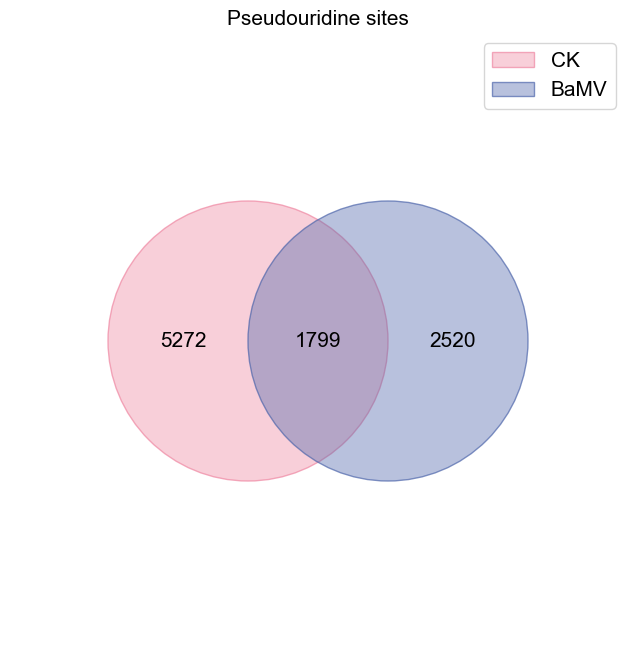

In [175]:
bm_mod_gene = set(bamv_pseUanno_df_cut.pos.unique())
ck_mod_gene = set(ck_pseUanno_df_cut.pos.unique())

cmap = ["cool", list("rgb"), "plasma", "viridis", "Set1"]
data_dict = {"CK": ck_mod_gene, "BaMV": bm_mod_gene}
# plt.subplots(1,figsize=(2,2))
venn(data_dict, fontsize=15, cmap=['#ef87a2','#4e66ab'])
plt.title('Pseudouridine sites',fontsize=15)
# plt.legend('')
plt.savefig(pseu_fp+'pseUmod_sites_venn_plot.pdf', format='pdf', dpi=600, bbox_inches='tight',transparent = True)
# plt.savefig('/home/litao/bigdata/phe_shoot/phe_shoot_figure/Part4_m6a/Figure4.2_mod_gene_venn_plot.svg', format='svg', dpi=600, bbox_inches='tight',transparent = True)
plt.show()

In [179]:
def get_distance(
    position, strand, gene_name, label, label_group, anno_cds_level_groups
):
    if label_group in ["cds", "utr5p", "utr3p"]:
        num = int(re.search("(?:(?<=cds)|(?<=utr3p|utr5p))[0-9]+", label).group())
        # anno_part = anno_cds_level_groups.get_group((gene_name,label_group))
        if strand == "+":
            anno_part = anno_cds_level_groups.get_group(
                (gene_name, label_group)
            ).sort_values(by="start", axis=0)
        else:
            anno_part = anno_cds_level_groups.get_group(
                (gene_name, label_group)
            ).sort_values(by="start", axis=0, ascending=False)
        if strand == "+":
            if num == 1:
                distance = position - anno_part.start.iloc[(num - 1)]
            else:
                #           print(num,gene_name,label)
                distance = (
                    anno_part.length.iloc[: (num - 1)].sum()
                    + position
                    - anno_part.start.iloc[(num - 1)]
                )
        else:
            if num == 1:
                distance = anno_part.end.iloc[(num - 1)] - position
            else:
                distance = (
                    anno_part.length.iloc[: (num - 1)].sum()
                    + anno_part.end.iloc[(num - 1)]
                    - position
                )
        return distance
    else:
        return np.nan


# def get_relatively_pos(gene_name,label_group,distance,anno_gene_level):
#     column_name = 'total_' + label_group + '_length'
#     if label_group == 'utr5p':
#         rel_pos = distance / anno_gene_level.loc[gene_name,column_name]
#         return rel_pos
#     elif label_group == 'cds':
#         rel_pos = distance / anno_gene_level.loc[gene_name,column_name] + 1
#         return rel_pos
#     elif label_group == 'utr3p':
#         rel_pos = distance / anno_gene_level.loc[gene_name,column_name] + 2
#         return rel_pos
#     else:
#          return np.nan
def get_relatively_pos(gene_name, label_group, distance, anno_gene_level):
    column_name = "total_" + label_group + "_length"
    if label_group in ["cds", "utr5p", "utr3p"]:
        rel_pos = distance / anno_gene_level.loc[gene_name, column_name]
        return rel_pos
    else:
        return np.nan


# When not scaled, please set SF(utr5p_sf,utr3p_sf) equal to _1
# Without scaling,three regions of gene-body are drawn with equal widths
def rel_pos_rescale(label_group, rel_pos, utr5p_sf, utr3p_sf):
    if label_group == "utr5p":
        return rel_pos * utr5p_sf
    elif label_group == "cds":
        return rel_pos + utr5p_sf
    elif label_group == "utr3p":
        return rel_pos * utr3p_sf + 1 + utr5p_sf
    else:
        return rel_pos


def get_rel_pos_and_rescale(ratio_df, anno_gene_level, anno_cds_level_groups):
    ratio_df.loc[:, "distance"] = ratio_df.apply(
        lambda row: get_distance(
            row["pos"],
            row["strand"],
            row["gene_name"],
            row["label"],
            row["label_group"],
            anno_cds_level_groups,
        ),
        axis=1,
    )
    ratio_df.loc[:, "rel_pos"] = ratio_df.apply(
        lambda row: get_relatively_pos(
            row["gene_name"], row["label_group"], row["distance"], anno_gene_level
        ),
        axis=1,
    )
    ratio_df.loc[:, "rel_pos"] = ratio_df.apply(
        lambda row: rel_pos_rescale(
            row["label_group"], row["rel_pos"], utr5p_sf, utr3p_sf
        ),
        axis=1,
    )
    return ratio_df

In [181]:
anno_cds_level_label=anno_cds_level[anno_cds_level['label_group']=='exon'].groupby('gene_name')
def get_exon_label(gene_id,gene_name,pos,strand):
    label=''
    if pos < gff_len[gene_id][0] or pos >gff_len[gene_id][1]:
        label='integenic'
        #print(pos,gff_len[gene_id][0],gff_len[gene_id][1])
    else:
        label='intron'
        #print('intron')
    if strand=='+':
        part=anno_cds_level_label.get_group((gene_name)).sort_values(by="start", axis=0)
    else:
        part=anno_cds_level_label.get_group((gene_name)).sort_values(by="start", axis=0, ascending=False)
    for index,row in part.iterrows():
        if row[4] <= pos <= row[5]:
            label=row[3]
            break
    return label
anno_cds_level_label_2=anno_cds_level[anno_cds_level['label_group']!='exon'].groupby('gene_name')   
def get_cds_label(gene_name,pos,exon_label,strand):
    if strand=='+':
        part=anno_cds_level_label_2.get_group((gene_name)).sort_values(by="start", axis=0)
    else:
        part=anno_cds_level_label_2.get_group((gene_name)).sort_values(by="start", axis=0, ascending=False)
    label=''
    for index,row in part.iterrows():
        if row[4] <= pos <= row[5]:
            label=row[3]
            break
        else:
            label=exon_label
    return label
def get_labelgroup(label):
    if 'utr5p' in label:
        return 'utr5p'
    if 'cds' in label:
        return 'cds'
    if 'utr3p' in label:
        return 'utr3p'
    else:
        return label

In [180]:
anno_cds_level_groups = anno_cds_level.groupby(["gene_name","label_group"])
# 1.calculate a simple scale factor (SF)
utr5p_sf = (
    anno_gene_level.total_utr5p_length.dropna().median()
    / anno_gene_level.total_cds_length.dropna().median()
)
utr3p_sf = (
    anno_gene_level.total_utr3p_length.dropna().median()
    / anno_gene_level.total_cds_length.dropna().median()
)
# 2.The SF for the 5'UTR is 0.18 and for the 3'UTR is 0.34. Next, the following code rescales these relatively position accordingly


In [182]:
bamv_pseUanno_df_cut.loc[:,'exon_label']=bamv_pseUanno_df_cut.apply(lambda row:get_exon_label(row['gene_id'],row['gene_name'],row['pos'],row['strand']),axis=1)
bamv_pseUanno_df_cut.loc[:,'label']=bamv_pseUanno_df_cut.apply(lambda row:get_cds_label(row['gene_name'],row['pos'],row['exon_label'],row['strand']),axis=1)
bamv_pseUanno_df_cut.loc[:,'label_group']=bamv_pseUanno_df_cut.apply(lambda row:get_labelgroup(row['label']),axis=1)

/tmp/ipykernel_49458/661003558.py:15: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if row[4] <= pos <= row[5]:
/tmp/ipykernel_49458/661003558.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label=row[3]
/tmp/ipykernel_49458/661003558.py:27: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if row[4] <= pos <= row[5]:
/tmp/ipykernel_49458/661003558.py:28: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. I

In [183]:
ck_pseUanno_df_cut.loc[:,'exon_label']=ck_pseUanno_df_cut.apply(lambda row:get_exon_label(row['gene_id'],row['gene_name'],row['pos'],row['strand']),axis=1)
ck_pseUanno_df_cut.loc[:,'label']=ck_pseUanno_df_cut.apply(lambda row:get_cds_label(row['gene_name'],row['pos'],row['exon_label'],row['strand']),axis=1)
ck_pseUanno_df_cut.loc[:,'label_group']=ck_pseUanno_df_cut.apply(lambda row:get_labelgroup(row['label']),axis=1)

/tmp/ipykernel_49458/661003558.py:15: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if row[4] <= pos <= row[5]:
/tmp/ipykernel_49458/661003558.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label=row[3]
/tmp/ipykernel_49458/661003558.py:27: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if row[4] <= pos <= row[5]:
/tmp/ipykernel_49458/661003558.py:28: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. I

In [184]:
ck_pseUanno_df_cut

,chr_o,pos,base,cov,fre,chr,strand,label,exon_label,gene_id,gene_name,label_group
16,chr4.1_F,73395,T,89,0.875,chr4.1,+,utr5p1,exon1,evm.TU.FRAGSCAFF_24.8,evm.model.FRAGSCAFF_24.8.2,utr5p
68,chr4.1_F,76181,T,161,0.915,chr4.1,+,cds3,exon3,evm.TU.FRAGSCAFF_24.8,evm.model.FRAGSCAFF_24.8.2,cds
87,chr4.1_F,76348,T,193,0.950,chr4.1,+,cds4,exon4,evm.TU.FRAGSCAFF_24.8,evm.model.FRAGSCAFF_24.8.2,cds
216,chr4.1_F,103321,T,26,0.815,chr4.1,+,utr3p1,exon10,evm.TU.FRAGSCAFF_24.13,evm.model.FRAGSCAFF_24.13,utr3p
227,chr4.1_F,103350,T,27,0.880,chr4.1,+,utr3p1,exon10,evm.TU.FRAGSCAFF_24.13,evm.model.FRAGSCAFF_24.13,utr3p
...,...,...,...,...,...,...,...,...,...,...,...,...
547908,chr31.1_R,26470411,T,26,0.810,chr31.1,+,intron,intron,evm.TU.ORIGINAL_5490.133,evm.model.ORIGINAL_5490.133,intron
547911,chr31.1_R,26470419,T,26,0.885,chr31.1,+,intron,intron,evm.TU.ORIGINAL_5490.133,evm.model.ORIGINAL_5490.133,intron
547912,chr31.1_R,26470422,T,26,0.845,chr31.1,+,intron,intron,evm.TU.ORIGINAL_5490.133,evm.model.ORIGINAL_5490.133,intron
547914,chr31.1_R,26470424,T,26,0.830,chr31.1,+,intron,intron,evm.TU.ORIGINAL_5490.133,evm.model.ORIGINAL_5490.133,intron


In [185]:
anno_cds_level_groups = anno_cds_level.groupby(["gene_name","label_group"])
# 1.calculate a simple scale factor (SF)
utr5p_sf = (
    anno_gene_level.total_utr5p_length.dropna().median()
    / anno_gene_level.total_cds_length.dropna().median()
)
utr3p_sf = (
    anno_gene_level.total_utr3p_length.dropna().median()
    / anno_gene_level.total_cds_length.dropna().median()
)
# 2.The SF for the 5'UTR is 0.18 and for the 3'UTR is 0.34. Next, the following code rescales these relatively position accordingly
bamv_pseUanno_df_cut = get_rel_pos_and_rescale(bamv_pseUanno_df_cut, anno_gene_level, anno_cds_level_groups)
ck_pseUanno_df_cut = get_rel_pos_and_rescale(ck_pseUanno_df_cut, anno_gene_level, anno_cds_level_groups)

/tmp/ipykernel_49458/2642589209.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ratio_df.loc[:, "distance"] = ratio_df.apply(
/tmp/ipykernel_49458/2642589209.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ratio_df.loc[:, "rel_pos"] = ratio_df.apply(


In [ ]:
# ck_pseUanno_df_cut.to_csv(fp+'ck_pseUanno_df_0.8cut.csv',index=False)
# bamv_pseUanno_df_cut.to_csv(fp+'bamv_pseUanno_df_0.8cut.csv',index=False)

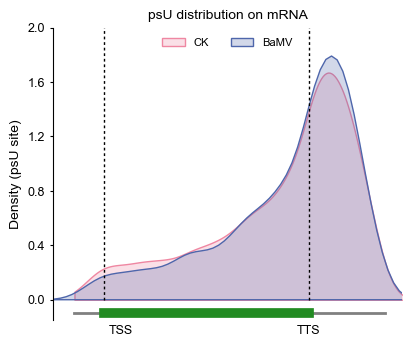

In [187]:
# Figure
plt.rcParams['font.sans-serif'] = ['Arial']
f, ax = plt.subplots(figsize=(4.5, 3.8))
# f, ax = plt.subplots(1,1,figsize=(10, 6))
#sns.set_style('ticks')
tss = utr5p_sf
tts = utr5p_sf + 1
end = utr5p_sf + utr3p_sf + 1


scale_ls_x = np.linspace(0, 1.6, 8)
index_ls_x = ["","TSS","","","","TTS","",""]
plt.xticks(scale_ls_x, index_ls_x,fontsize=9)

ax.set_ylim(-0.15,2.4)
ax.set_xlim(-0.1,1.6)

ax.plot([tss, tss], [0, 2.4], linestyle=(0, (2, 2)), lw=1, color="black")
ax.plot([tts, tts], [0, 2.4], linestyle=(0, (2, 2)), lw=1, color="black")
ax.plot([0, end], [-0.1, -0.1], lw=2, color="grey")
ax.plot([tss, tts], [-0.1, -0.1], lw=7, color="forestgreen")

sns.kdeplot(
    ck_pseUanno_df_cut.rel_pos.dropna(),
    fill=True,
    cut=0,
    color='#ef87a2',
    label="CK",
    ax=ax,
)

sns.kdeplot(
    bamv_pseUanno_df_cut.rel_pos.dropna(),
    fill=True,
    cut=0,
    color='#4e66ab',#"#e45f4d",
    label="BaMV",
    ax=ax,
)


ax.legend(
    loc="upper center",
    fontsize=8,
    frameon=False,
    mode=None,
    ncol=4,
    #bbox_to_anchor=(0.1, 0.65, 0.8, 0.8),
)
ax=plt.gca()
ax.xaxis.set_tick_params(size=0)
ax.yaxis.set_tick_params(length=2)
ax.grid(False)
ax.spines['bottom'].set_linewidth(0)
ax.spines['left'].set_linewidth(0.8)
ax.spines['right'].set_linewidth(0)
ax.spines['top'].set_linewidth(0)

ax.set_ylim(-0.15,2.0)
ax.set_ylabel("Density (psU site)", fontsize=10)
ax.set_xlabel('')
ax.set_yticks([0,.4,.8,1.2,1.6,2.0])
ax.tick_params(axis='y', labelsize=9)
ax.set_title('psU distribution on mRNA',fontsize=10)
plt.savefig(
    pseu_fp+"Figure4.5_metagene_psU_0.8cut_density_plot_20reads.pdf",
    format="pdf",
    dpi=600,
    bbox_inches="tight",
)

### 2. Ψ & m6A

In [67]:
bm_ratio_df = pd.read_csv("/home/qq/work/lxr/DRS/script_plot/bamv/m6A/bm_ratio_df",sep='\t')
ck_ratio_df = pd.read_csv("/home/qq/work/lxr/DRS/script_plot/bamv/m6A/ck_ratio_df",sep='\t')

In [189]:
mod_n=pd.DataFrame(bm_ratio_df.gene_name.value_counts()).reset_index()
mod_n.columns=['gene_name','bamv_m6As_n']
mod_n['bamv_m6As_n_label']=pd.cut(mod_n['bamv_m6As_n'],bins=[0,1,2,3,4,5,70],labels=[1,2,3,4,5,'>=5'])

In [190]:
mod_n2=pd.DataFrame(ck_ratio_df.gene_name.value_counts()).reset_index()
mod_n2.columns=['gene_name','ck_m6As_n']
mod_n2['ck_m6As_n_label']=pd.cut(mod_n2['ck_m6As_n'],bins=[0,1,2,3,4,5,70],labels=[1,2,3,4,5,'>=5'])

In [191]:
mod_n3=pd.DataFrame(bamv_pseUanno_df_cut.gene_name.value_counts()).reset_index()
mod_n3.columns=['gene_name','bamv_psus_n']
mod_n3['bamv_psus_n_label']=pd.cut(mod_n3['bamv_psus_n'],bins=[0,1,2,3,4,5,70],labels=[1,2,3,4,5,'>=5'])

In [192]:
mod_n4=pd.DataFrame(ck_pseUanno_df_cut.gene_name.value_counts()).reset_index()
mod_n4.columns=['gene_name','ck_psus_n']
mod_n4['ck_psus_n_label']=pd.cut(mod_n4['ck_psus_n'],bins=[0,1,2,3,4,5,70],labels=[1,2,3,4,5,'>=5'])

In [193]:
mod_n['bamv_m6As_n_label'].value_counts().sort_index()/mod_n['bamv_m6As_n_label'].count()

bamv_m6As_n_label
1      0.328813
2      0.208304
3      0.144183
4      0.096122
5      0.069831
>=5    0.152748
Name: count, dtype: float64

In [194]:
df_wide_2=pd.DataFrame({'CK_m6A':mod_n2['ck_m6As_n_label'].value_counts().sort_index()/mod_n2['ck_m6As_n_label'].count(),
    'BaMV_m6A':mod_n['bamv_m6As_n_label'].value_counts().sort_index()/mod_n['bamv_m6As_n_label'].count(),
    'CK_psU':mod_n4['ck_psus_n_label'].value_counts().sort_index()/mod_n4['ck_psus_n_label'].count(),
    'BaMV_psU':mod_n3['bamv_psus_n_label'].value_counts().sort_index()/mod_n3['bamv_psus_n_label'].count()}).T

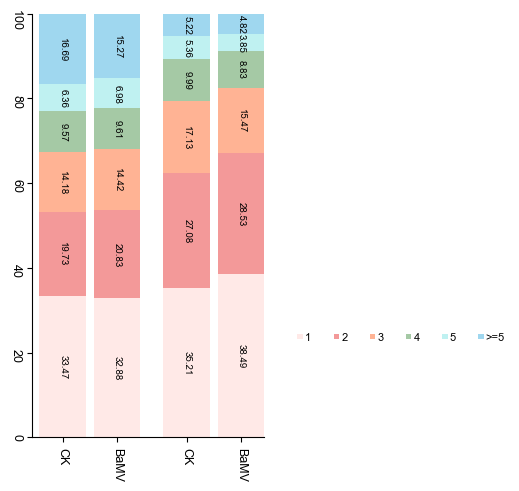

In [195]:
###kmer分布比例图
# plt.bar(df[df['sample'] == 'ADAR-366-6_L1_132A32']['sample'],df[df['sample'] == 'ADAR-366-6_L1_132A32']['count'])
# plt.bar(x, y, align='center', color='#66c2a5', tick_label=['A', 'B', 'C', 'D', 'E'], label='班级A')
plt.figure(figsize=(3,5.5))
colors = ['mistyrose','lightcoral','lightsalmon','darkseagreen','paleturquoise','skyblue','dodgerblue','mediumseagreen','darkorange','#f2b0e0','navajowhite','Thistle']
# colors=sns.palplot(sns.color_palette('Set3'))
kmers = df_wide_2.columns[:]
#y=df_wide['kong']
i=0
for i,color in zip(range(len(kmers)),colors):
    if i == 0 :
        # plt.bar(df_wide['sample'],df_wide[muts[i]],color=color, tick_label=['AD_355','AD_364','AD_366','B8BA','FTOAD','MTAA','T2A','T8A'], label=muts[i])
        bars=plt.bar([-0.1,0.6,1.5,2.2],df_wide_2[kmers[i]][0:4]*100,color=color, label=kmers[i],width=0.6,linewidth=0.3,alpha=0.8)
        i += 1
        for bar in bars:
            height=bar.get_height()
            if height !=0:
                plt.text(bar.get_x()+bar.get_width()/2,bar.get_y()+height/2,str(round(height,2)),fontsize=7, ha='center', va='center', color='black',rotation=-90)
        #tick_label=[''], 
    else:
        y = df_wide_2[kmers[:i]].T.sum()*100
        bars=plt.bar([-0.1,0.6,1.5,2.2],df_wide_2[kmers[i]]*100, align='center', bottom=y, color=color, label=kmers[i],width=0.6,linewidth=0.3,alpha=0.8)
        #df_wide_2.index
        i +=1
        for bar in bars:
            height=bar.get_height()
            if height !=0:
                plt.text(bar.get_x()+bar.get_width()/2,bar.get_y()+height/2,str(round(height,2)),fontsize=7, ha='center', va='center', color='black',rotation=-90)
plt.ylim(0.0,100)
plt.xlim(-0.5,2.2+bar.get_width()/2)
plt.xticks([-0.1,0.6,1.5,2.2],labels=['CK','BaMV','CK','BaMV'],fontsize=9,rotation=-90)
plt.yticks(fontsize=9,rotation=-90)
sns.despine()
#plt.ylabel('Percentage',rotation=-90)
#plt.title('Percentage of 12 kmers (%)',fontsize=12)           ###handlelength修改图例长度和宽度；handletexpad修改符号与文字间隔，facecolor、framealpha修改背景色和透明度
plt.legend(bbox_to_anchor=(1.1, 0.2),loc='lower left',ncol=6,fontsize=8,handlelength=0.5,handleheight=0.4, handletextpad=0.2,facecolor='white',framealpha=1,frameon=False)
#plt.text(1,1,df_wide.loc[1,['count']])
plt.savefig(pseu_fp+'plot\\m6A_psu_mRNA_n.pdf',bbox_inches='tight')

Pseudoguanosine site distance from adjacent m6A modification sites and random modification site distance

In [70]:
bamv_pseu=pd.read_csv(pseu_fp+"bamv_pseUreanno_df_0.8cut.csv")
ck_pseu=pd.read_csv(pseu_fp+"ck_pseUreanno_df_0.8cut.csv")

In [71]:
bamv_two_mod=set(bamv_pseu.gene_name) & set(bm_ratio_df.gene_name)
ck_two_mod=set(ck_pseu.gene_name) & set(ck_ratio_df.gene_name)

In [72]:
bamv_ratio_df=bm_ratio_df
position_mod={'bamv':{},'ck':{}}
for sample in ['ck','bamv']:
    gene_set=eval(sample+'_two_mod')
    dat1=eval(sample+'_pseu')
    dat2=eval(sample+'_ratio_df')
    for gene in gene_set:
        gene_id=get_gene(gene)
        mrna_region=list(range(gff_data[gene_id]['mrna'][0],gff_data[gene_id]['mrna'][1]))
        position_mod[sample][gene]={}
        position_mod[sample][gene]['pseu']=list(dat1[dat1['gene_name']==gene].pos.unique().round().astype(int))
        position_mod[sample][gene]['m6a']=list(dat2[dat2['gene_name']==gene].position.unique().round().astype(int))
        position_mod[sample][gene]['strand']=gff_data[gene_id]['strand']
        all_poses=list(dat1[dat1['gene_name']==gene].pos.unique().round().astype(int))+list(dat2[dat2['gene_name']==gene].position.unique().round().astype(int))
        position_mod[sample][gene]['random_m6a']= random.sample([pos for pos in mrna_region if pos not in all_poses],len(position_mod[sample][gene]['m6a']))
        position_mod[sample][gene]['random_pseu']= random.sample([pos for pos in mrna_region if pos not in all_poses and pos not in position_mod[sample][gene]['random_m6a']],len(position_mod[sample][gene]['pseu']))

In [83]:
position_distribution={'bamv':{},'ck':{}}
for sample in ['ck','bamv']:
    position_distribution[sample]['random']=[]
    position_distribution[sample]['mod']=[]
    for gn in position_mod[sample].keys():       
        strand=position_mod[sample][gn]['strand']
        m6A_positions=sorted(position_mod[sample][gn]['m6a'])
        pseudouridine_positions=sorted(position_mod[sample][gn]['pseu'])
        random_m6aposes=sorted(position_mod[sample][gn]['random_m6a'])
        random_pseuposes=sorted(position_mod[sample][gn]['random_pseu'])
        #if len(m6A_positions) >3 and len(pseudouridine_positions) >3:
        m6A_positions.sort()
        pseudouridine_positions.sort()
        random_m6aposes.sort()
        random_pseuposes.sort()
        # 计算相邻的 m6A 和 Ψ 修饰位点之间的绝对距离
        # 遍历两个排序后的修饰位点集合，计算相邻位点之间的距离
        distances_mod = []
        relative_distances_mod=[]
        # 使用两个指针遍历 m6A 和 Ψ 位点
        i, j = 0, 0
        while i < len(m6A_positions) and j < len(pseudouridine_positions):
            # 计算当前 m6A 和 Ψ 位点之间的距离
            distance = np.log2(abs(pseudouridine_positions[j]-m6A_positions[i]))
            distances_mod.append(distance)
            
            # 移动指针：选择距离较小的修饰位点
            if m6A_positions[i] < pseudouridine_positions[j]:
                i += 1  # 移动 m6A 位点
            else:
                j += 1  # 移动 Ψ 位点
        # for dist in distances_mod:
        #     dmax,dmin=max(distances_mod),min(distances_mod)
        #     #relative_distances_mod.append(2*((dist-dmin)/(dmax-dmin))-1)
        #position_distribution[sample]['mod'].extend(relative_distances_mod)
        position_distribution[sample]['mod'].extend(distances_mod)

        distances_random = []
        relative_distances_random = []
        # 使用两个指针遍历 m6A 和 Ψ 位点
        i, j = 0, 0
        while i < len(random_m6aposes) and j < len(random_pseuposes):
            # 计算当前 m6A 和 Ψ 位点之间的距离
            distance = np.log2(abs(random_pseuposes[j]-random_m6aposes[i]))
            distances_random.append(distance)
            
            # 移动指针：选择距离较小的修饰位点
            if random_m6aposes[i] < random_pseuposes[j]:
                i += 1  # 移动 m6A 位点
            else:
                j += 1  # 移动 Ψ 位点

        # for dist in distances_random:
        #     dmax,dmin=max(distances_random),min(distances_random)            
        #     relative_distances_random.append(2*((dist-dmin)/(dmax-dmin))-1)
        # position_distribution[sample]['random'].extend(relative_distances_random)
        position_distribution[sample]['random'].extend(distances_random)

/tmp/ipykernel_74648/2897540250.py:34: RuntimeWarning: invalid value encountered in scalar divide
  relative_distances_mod.append(2*((dist-dmin)/(dmax-dmin))-1)


In [74]:
position_distribution

{'bamv': {'random': [9.52552080909507,
   6.189824558880018,
   10.86573327085176,
   8.854868383260236,
   8.700439718141093,
   7.434628227636725,
   7.266786540694901,
   5.832890014164741,
   5.321928094887363,
   8.731319031025064,
   4.754887502163468,
   10.243173983472952,
   9.381542951184585,
   8.467605550082997,
   11.378836713210614,
   10.273795599214264,
   10.183635381473218,
   9.64565843240871,
   9.63662462054365,
   9.509775004326936,
   11.606867837374152,
   11.375039431346925,
   11.324743110494417,
   11.124767535822473,
   10.764042217306587,
   7.098032082960526,
   12.191676146352428,
   14.742519971661299,
   14.67203853823529,
   14.063984847716334,
   14.018982527843816,
   13.760719947465624,
   13.351353372192145,
   11.925183519434208,
   11.479275030250205,
   13.235415935602527,
   12.90651484484695,
   5.672425341971495,
   10.041659151637214,
   8.353146825498083,
   10.602698865017965,
   10.181152256865566,
   10.144658242831882,
   10.08878823871

In [212]:
for sample in ['ck','bamv']:
    dmax,dmin=max(position_distribution[sample]['random']),min(position_distribution[sample]['random'])
    position_distribution[sample]['random_relative']=[2*((dist-dmin)/(dmax-dmin))-1 for dist in position_distribution[sample]['random']]

    dmax,dmin=max(position_distribution[sample]['mod']),min(position_distribution[sample]['mod'])
    ##dist-dmin)/(dmax-dmin)把距离放缩在【0，1】之间，2*【0，1】-1平移区间到【-1，1】
    position_distribution[sample]['mod_relative']=[2*((dist-dmin)/(dmax-dmin))-1 for dist in position_distribution[sample]['mod']]

/tmp/ipykernel_49458/1990101885.py:9: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  plt.legend([l1,l2,l3,l4],labels=['Random sites from CK','Random sites from BaMV','CK','BaMV'],frameon=False,fontsize=9)


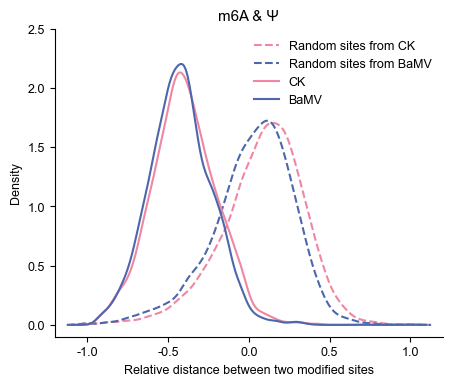

In [213]:
plt.figure(figsize=(5,4))
l1=sns.kdeplot(position_distribution['ck']['random_relative'],color='#ef87a2',linestyle='--')
l2=sns.kdeplot(position_distribution['bamv']['random_relative'],color='#4e66ab',linestyle='--')
l3=sns.kdeplot(position_distribution['ck']['mod_relative'],color='#ef87a2')
l4=sns.kdeplot(position_distribution['bamv']['mod_relative'],color='#4e66ab')
plt.xlim(-1.2,1.2)
plt.ylim(-0.1,2.5)
sns.despine()
plt.legend([l1,l2,l3,l4],labels=['Random sites from CK','Random sites from BaMV','CK','BaMV'],frameon=False,fontsize=9)
plt.title('m6A & Ψ')
plt.xlabel('Relative distance between two modified sites',fontsize=9)
plt.ylabel('Density',fontsize=9)
plt.savefig(pseu_fp+'relative_distance_in_two_mod.pdf',transparent=True,bbox_inches='tight')

## 06 APA

In [241]:
fp='/home/qq/work/lxr/DRS/script_plot/bamv/'

### 1. APA identification

In [242]:
bamv_polya_results_pass=pd.read_csv('/home/qq/work/lxr/DRS/run_DRS_bamv/05_polya_tail/bamv_polya_results_pass.tsv',sep='\t')
ck_polya_results_pass=pd.read_csv('/home/qq/work/lxr/DRS/run_DRS_ck/05_polya_tail/ck_polya_results_pass.tsv',sep='\t')

In [243]:
bamv_featureCounts=pd.read_csv('/home/qq/work/lxr/DRS/run_DRS_bamv/06_featureCounts_new/bamv_genome_correct_2308.sorted.bam.featureCounts',sep='\t',names=['readname','assigned','n','gene_id'])
ck_featureCounts=pd.read_csv('/home/qq/work/lxr/DRS/run_DRS_ck/06_featureCounts_new/ck_genome_correct_2308.sorted.bam.featureCounts',sep='\t',names=['readname','assigned','n','gene_id'])

In [244]:
bamv_polya_results_pass.contig.unique()

array(['chr4.1', 'chr7.1', 'chr16.1', 'chr10.1', 'chr35.1', 'chr32.1',
       'chr19.1', 'chr23.1', 'chr26.1', 'chr13.1', 'chr1.1', 'chr29.1',
       'chr14.1', 'chr33.1', 'chr24.1', 'chr20.1', 'chr11.1', 'chr5.1',
       'chr36.1', 'chr8.1', 'chr17.1', 'chr2.1', 'chr30.1', 'chr27.1',
       'chr15.1', 'chr9.1', 'chr28.1', 'chr18.1', 'chr6.1', 'chr34.1',
       'chr3.1', 'chr12.1', 'chr25.1', 'chr22.1', 'chr31.1'], dtype=object)

In [245]:
bamv_polya_results_pass=bamv_polya_results_pass.merge(bamv_featureCounts[bamv_featureCounts['assigned']=='Assigned'],how='right')
ck_polya_results_pass=ck_polya_results_pass.merge(ck_featureCounts[ck_featureCounts['assigned']=='Assigned'],how='right')
bamv_polya_results_pass['gene_name']=bamv_polya_results_pass['gene_id'].apply(get_transcript)
ck_polya_results_pass['gene_name']=ck_polya_results_pass['gene_id'].apply(get_transcript)

In [249]:
bamv_polya_results_pass_dict={}
for index,row in bamv_polya_results_pass.iterrows():
    readname=row[0]
    bamv_polya_results_pass_dict[readname]=defaultdict(dict)
    bamv_polya_results_pass_dict[readname]={'gene_name':row['gene_name'],'polya_length':row['polya_length']}
ck_polya_results_pass_dict={}
for index,row in ck_polya_results_pass.iterrows():
    ck_polya_results_pass_dict[readname]=defaultdict(dict)
    ck_polya_results_pass_dict[readname]={'gene_name':row['gene_name'],'polya_length':row['polya_length']}

/tmp/ipykernel_49458/3130707239.py:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  readname=row[0]


In [131]:
bamv_polya_results_pass

,readname,contig,position,leader_start,adapter_start,polya_start,transcript_start,read_rate,polya_length,qc_tag,assigned,n,gene_id,gene_name
0,9e7450b2-e809-44c4-814f-7b352354765e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Assigned,1,evm.TU.FRAGSCAFF_24.8,evm.model.FRAGSCAFF_24.8.2
1,247b9724-1b8f-4063-a7d5-6cb62fd5d15c,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Assigned,1,evm.TU.FRAGSCAFF_24.8,evm.model.FRAGSCAFF_24.8.2
2,105a1036-4623-4dbf-8dfe-f51ab3ce5995,chr4.1,73262.0,7.0,160.0,6616.0,8402.0,120.48,66.40,PASS,Assigned,1,evm.TU.FRAGSCAFF_24.8,evm.model.FRAGSCAFF_24.8.2
3,c03ee995-5e92-4fa9-b04b-8727348969c6,chr4.1,73264.0,2.0,3.0,3807.0,7943.0,125.50,167.29,PASS,Assigned,1,evm.TU.FRAGSCAFF_24.8,evm.model.FRAGSCAFF_24.8.2
4,e0b1e844-27f8-4e11-b9f8-aee5aa4fd912,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Assigned,1,evm.TU.FRAGSCAFF_24.8,evm.model.FRAGSCAFF_24.8.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
526966,7d24549e-9d26-4fe8-b27c-d872937a7371,chr31.1,28307015.0,2.0,3.0,6278.0,7853.0,107.57,51.21,PASS,Assigned,1,evm.TU.FRAGSCAFF_341.6,evm.model.FRAGSCAFF_341.6
526967,5038b4ca-7b8f-4a7d-9ce8-c49837a8234f,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Assigned,1,evm.TU.FRAGSCAFF_341.6,evm.model.FRAGSCAFF_341.6
526968,5d869a9f-055c-4842-9f59-1ae41c8532d7,chr31.1,28307044.0,2.0,3.0,3391.0,7054.0,103.86,121.28,PASS,Assigned,1,evm.TU.FRAGSCAFF_341.6,evm.model.FRAGSCAFF_341.6
526969,2403219f-a619-41df-a751-958651a6cb3a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Assigned,1,evm.TU.FRAGSCAFF_341.6,evm.model.FRAGSCAFF_341.6


In [250]:
# def get_last_exon_5end(gene_name, strand, anno_exon_level):
#     gene_exon_df = anno_exon_level.loc[gene_name, :].copy()
#     if strand == "+":
#         # isinstance()判断数据类型
#         if isinstance(gene_exon_df, pd.DataFrame):
#             # last_exon_5end = gene_exon_df.iloc[-1,2]
#             last_exon_5end = gene_exon_df.iloc[0, 3]
#         else:
#             last_exon_5end = gene_exon_df["start"]
#     else:
#         if isinstance(gene_exon_df, pd.DataFrame):
#             last_exon_5end = gene_exon_df.iloc[-1, 3]
#         else:
#             last_exon_5end = gene_exon_df["end"]
#     return last_exon_5end

def get_last_exon_5end(gene_name, strand, anno_exon_level):
    gene_exon_df = anno_exon_level.loc[gene_name, :].copy()
    if strand == "+":
        # isinstance()判断数据类型
        if isinstance(gene_exon_df, pd.DataFrame):
            # last_exon_5end = gene_exon_df.iloc[-1,2]
            last_exon_5end = gene_exon_df.sort_values(by='start',ascending=True).iloc[-1, 3]
        else:
            last_exon_5end = gene_exon_df["start"]
    else:
        if isinstance(gene_exon_df, pd.DataFrame):
            last_exon_5end = gene_exon_df.sort_values(by='start',ascending=True).iloc[-1, 3]
        else:
            last_exon_5end = gene_exon_df["end"]
    return last_exon_5end


def get_entropy(site_counter, total_count):
    """
    Calculate the entropy of the polya site in this PAC 计算此PAC中Polya站点的熵
    """
    entropy = 0
    for site in site_counter:
        p = site_counter[site] / total_count
        entropy += -p * np.log2(p)
    return entropy


STRAND_TO_BOOL = {"-": True, "+": False}

In [194]:
anno_exon_level.loc['evm.model.ORIGINAL_821.499', :]

,scaffold,strand,label,start,end,length
gene_name,,,,,,
evm.model.ORIGINAL_821.499,chr16.1,-,exon1,34838367,34838852,486
evm.model.ORIGINAL_821.499,chr16.1,-,exon2,34837709,34837829,121
evm.model.ORIGINAL_821.499,chr16.1,-,exon3,34836007,34836197,191
evm.model.ORIGINAL_821.499,chr16.1,-,exon4,34835798,34835929,132
evm.model.ORIGINAL_821.499,chr16.1,-,exon5,34835568,34835704,137
evm.model.ORIGINAL_821.499,chr16.1,-,exon6,34835057,34835473,417


In [251]:
assign['gene_name']=assign['Assigned_gene'].apply(get_transcript)

In [134]:
anno_gene_level[anno_gene_level.index=='evm.model.ORIGINAL_821.499']

,scaffold,TSS,TTS,start_codon,end_codon,strand,total_cds_length,total_utr5p_length,total_utr3p_length
evm.model.ORIGINAL_821.499,chr16.1,34838654,34835434,34838852,34835057,-,909.0,198.0,377.0


In [252]:
# get joblib parallel arg list
arg_list = {}
df=anno_gene_level.loc[ck_polya_results_pass.gene_name,:]
# df=anno_gene_level[anno_gene_level.index=='evm.model.ORIGINAL_821.499']
for row in df.iterrows():    
    gene_name = row[0]
    gene_scaffold = row[1]["scaffold"]
    gene_start = min(row[1]["TSS"], row[1]["TTS"])
    gene_end = max(row[1]["TSS"], row[1]["TTS"])
    gene_strand = row[1]["strand"]
    gene_laste_exon_5end = get_last_exon_5end(gene_name, gene_strand, anno_exon_level)
    arg_list[gene_name]=[]
    arg_list[gene_name].append(
        [
            gene_name,
            gene_scaffold,
            gene_start,
            gene_end,
            gene_strand,
            gene_laste_exon_5end,
        ]
    )

In [ ]:
arg_list

{'evm.model.FRAGSCAFF_24.8.2': [['evm.model.FRAGSCAFF_24.8.2',
   'chr4.1',
   73424,
   76905,
   '+',
   73099]],
 'evm.model.FRAGSCAFF_24.9': [['evm.model.FRAGSCAFF_24.9',
   'chr4.1',
   79357,
   81168,
   '+',
   79357]],
 'evm.model.FRAGSCAFF_24.10': [['evm.model.FRAGSCAFF_24.10',
   'chr4.1',
   81616,
   86300,
   '-',
   85762]],
 'evm.model.FRAGSCAFF_24.11': [['evm.model.FRAGSCAFF_24.11',
   'chr4.1',
   86741,
   91661,
   '+',
   86725]],
 'evm.model.FRAGSCAFF_24.12': [['evm.model.FRAGSCAFF_24.12',
   'chr4.1',
   96598,
   99760,
   '-',
   98945]],
 'evm.model.FRAGSCAFF_24.13': [['evm.model.FRAGSCAFF_24.13',
   'chr4.1',
   100228,
   103286,
   '+',
   100123]],
 'evm.model.FRAGSCAFF_24.14': [['evm.model.FRAGSCAFF_24.14',
   'chr4.1',
   127634,
   128287,
   '+',
   127596]],
 'evm.model.FRAGSCAFF_24.15': [['evm.model.FRAGSCAFF_24.15',
   'chr4.1',
   131463,
   132611,
   '+',
   131463]],
 'evm.model.FRAGSCAFF_24.16': [['evm.model.FRAGSCAFF_24.16',
   'chr4.1',
   13

In [259]:
# get joblib parallel arg list
arg_list = {}
df=anno_gene_level.loc[bamv_polya_results_pass.gene_name,:]
for row in df.iterrows():    
    gene_name = row[0]
    gene_scaffold = row[1]["scaffold"]
    gene_start = min(row[1]["TSS"], row[1]["TTS"])
    gene_end = max(row[1]["TSS"], row[1]["TTS"])
    gene_strand = row[1]["strand"]
    gene_laste_exon_5end = get_last_exon_5end(gene_name, gene_strand, anno_exon_level)
    arg_list[gene_name]=[]
    arg_list[gene_name].append(
        [
            gene_name,
            gene_scaffold,
            gene_start,
            gene_end,
            gene_strand,
            gene_laste_exon_5end,
        ]
    )

In [254]:
def get_three_end(
    arg_list,sample
):
    # arg_list = {}
    # df=anno_gene_level.loc[pass_df.gene_name,:]
    # for row in df.iterrows():    
    #     gene_name = row[0]
    #     gene_scaffold = row[1]["scaffold"]
    #     gene_start = min(row[1]["TSS"], row[1]["TTS"])
    #     gene_end = max(row[1]["TSS"], row[1]["TTS"])
    #     gene_strand = row[1]["strand"]
    #     arg_list[gene_name]=[]
    #     gene_laste_exon_5end = get_last_exon_5end(gene_name, gene_strand, anno_exon_level)
    #     arg_list[gene_name].append([
    #             gene_scaffold,
    #             gene_start,
    #             gene_end,
    #             gene_strand,
    #             gene_laste_exon_5end]
    #     )


#polya_dict,anno_gene_name,scaffold,start,end,strand,last_exon_5end,polya_cleavage_sites=bamv_polya_results_pass_dict,arg_list[100001][0],arg_list[100001][1],arg_list[100001][2],arg_list[100001][3],arg_list[100001][4],arg_list[100001][5],[]

    df=assign[assign['sample']==sample]
    polya_cluster = []
    #with pysam.AlignmentFile(inbam_file, "rb") as inbam:
    for anno_gene_name in arg_list.keys():
        read_count=0
        polya_cleavage_sites=[]
        polya_cleavage_sites_reads={}

        scaffold,start,end,gene_strand,last_exon_5end=arg_list[anno_gene_name][0][1],arg_list[anno_gene_name][0][2],arg_list[anno_gene_name][0][3],arg_list[anno_gene_name][0][4],arg_list[anno_gene_name][0][5]
        strand = STRAND_TO_BOOL[gene_strand]
        dat=df[df['gene_name']==anno_gene_name]
        # print(len(dat),anno_gene_name)
        if len(dat) !=0 :
            #print(dat)
            for index,row in dat.iterrows():    
                ref_strand=row[3]       
                if strand is STRAND_TO_BOOL[ref_strand]:
                    polya=row[7]
                    gene_name=row[-1]
                    ref_st=row[4]
                    ref_ed=row[5]
                    read_count = read_count + 1 
                    if polya != "NA" and row[8]=='PASS':
                        if ref_strand == '+':
                            if  ref_ed> last_exon_5end:
                                 if  ref_ed not in  polya_cleavage_sites_reads.keys():
                                     polya_cleavage_sites.append(ref_ed)
                                     polya_cleavage_sites_reads[ref_ed]=[index]
                                 else:
                                     polya_cleavage_sites.append(ref_ed)
                                     polya_cleavage_sites_reads[ref_ed].append(index)
                        else:
                            if ref_st < last_exon_5end:
                                # It is convenient for sorting later, from small to large, from proximal to distal.
                                if  ref_st * -1 not in  polya_cleavage_sites_reads.keys():
                                    polya_cleavage_sites.append(ref_st * -1)
                                    polya_cleavage_sites_reads[ref_st * -1]=[index]
                                else:
                                    polya_cleavage_sites.append(ref_st * -1)
                                    polya_cleavage_sites_reads[ref_st * -1].append(index)
        
        # Select highly expressed genes
        if read_count < 5:
            continue
        if not polya_cleavage_sites:
            continue
        polya_cleavage_sites.sort()
        sorted(polya_cleavage_sites_reads.keys())
        # PASs within 24 nt from each other were clustered.
        total_site_count = len(polya_cleavage_sites)
        pac_list = None
        
        for polya_site in polya_cleavage_sites:
            if pac_list is None:
                pac_list = [[polya_site]]
            else:
                # read结束位点在polya_sites左侧 24 nt 以内
                if polya_site - pac_list[-1][-1] <= 24:
                    pac_list[-1].append(polya_site)
                else:
                    pac_list.append([polya_site]) # pac_list: pac_cluster

        num = 0
        
        for pac in pac_list:
            # Remove pac with less than 3 reads and pac whose read ratio is
            # less than 1% of the total number of reads in the gene region
            if len(pac) < 3 or len(pac) / total_site_count < 0.01:
                continue
            # 计算每个位点的count，并取出中最多的三个位点对应的频数（dict）

            siter_counter = Counter(pac) #pac 每条reads的polya位点
            siter_counter_most = siter_counter.most_common(3) #每一个cluster都取前三个丰度最高的位点
            # Requires pac's summit to have at least 3 reads
            c=0
            if siter_counter_most[0][1] >= 3:
                num += 1
                pac_start = min(abs(pac[0]), abs(pac[-1])) #前三个丰度最高的pac簇宽度
                pac_end = max(abs(pac[0]), abs(pac[-1]))
                entropy = get_entropy(siter_counter, len(pac))
                summit = abs(siter_counter_most[0][0])
                summit_reads=[]
                c=0
                for i in set(pac):
                    pac_1=polya_cleavage_sites_reads.get(i)
                    for j in pac_1:
                        summit_reads.append(j)
                        #print(i,j)
                        c += 1
                # ['scaffold/gene_name_num/strand/pac_start/pac_end/summit/summit_count/pac_total_count/Fntropy/summit_count_ratio']
                row = [
                    scaffold,
                    "_".join([anno_gene_name, str(num)]),
                    gene_strand,
                    pac_start,
                    pac_end,
                    summit,
                    siter_counter_most[0][1],
                    len(pac),
                    entropy,
                    siter_counter_most[0][1] / len(pac), #ratio of summit site
                    summit_reads,
                    len(summit_reads),
                    [abs(i) for i in pac]
                ]
                polya_cluster.append(row)
                #print(row)
    # pas_clutser_info.append(polya_cluster)
    merge_result=[]    
    for res in polya_cluster:
        if res is not None:
            merge_result.append(res)
    
    col_names = [
        "scaffold",
        "gene_name_num",
        "strand",
        "pac_start",
        "pac_end",
        "summit",
        "summit_count",
        "pac_total_count",
        "entropy",
        "summit_count_ratio",
        'summit_reads',
        'reads_count',
        'pac'
    ]
    outpath = (
        fp + sample + "_pas_2.csv")

    pd.DataFrame(merge_result, columns=col_names).to_csv(
    outpath, sep="\t", index=False)
    return polya_cluster

In [255]:
result=get_three_end(arg_list,'CK')

/tmp/ipykernel_49458/3506846884.py:40: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ref_strand=row[3]
/tmp/ipykernel_49458/3506846884.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  polya=row[7]
/tmp/ipykernel_49458/3506846884.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  gene_name=row[-1]
/tmp/ipykernel_49458/3506846884.py:44: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future versi

In [260]:
result=get_three_end(arg_list,'BaMV')

/tmp/ipykernel_49458/3506846884.py:40: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ref_strand=row[3]
/tmp/ipykernel_49458/3506846884.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  polya=row[7]
/tmp/ipykernel_49458/3506846884.py:43: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  gene_name=row[-1]
/tmp/ipykernel_49458/3506846884.py:44: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future versi

In [7]:
def read_pas_cluster_file(pas_cluster_file):
    df = pd.read_csv(pas_cluster_file, sep="\t")
    return df

In [10]:
bamv_pas = read_pas_cluster_file(
    fp+"bamv/BaMV_pas_2.csv"
)

In [11]:
bamv_pas

,scaffold,gene_name_num,strand,pac_start,pac_end,summit,summit_count,pac_total_count,entropy,summit_count_ratio,summit_reads,reads_count,pac
0,chr4.1,evm.model.FRAGSCAFF_24.8.2_1,+,77109,77196,77144,18,78,4.234729,0.230769,"['782a250e-cf93-4105-ba81-94ba062dcdc6', 'b488...",78,"[77109, 77111, 77114, 77114, 77120, 77121, 771..."
1,chr4.1,evm.model.FRAGSCAFF_24.8.2_2,+,77230,77290,77256,4,10,2.321928,0.400000,"['01a7eefb-7623-46a2-a0f4-8b8b5c6b1439', '4d9a...",10,"[77230, 77234, 77253, 77256, 77256, 77256, 772..."
2,chr4.1,evm.model.FRAGSCAFF_24.9_1,+,81325,81333,81330,3,8,1.811278,0.375000,"['e9c18608-bb66-4a54-9291-e7dce80bed7b', '72e9...",8,"[81325, 81330, 81330, 81330, 81331, 81331, 813..."
3,chr4.1,evm.model.FRAGSCAFF_24.10_1,-,81388,81423,81391,4,18,3.086049,0.222222,"['e2b11fc8-8a8b-4606-b8a6-c94a9f03a4de', '2451...",18,"[81423, 81417, 81409, 81408, 81407, 81402, 813..."
4,chr4.1,evm.model.FRAGSCAFF_24.20.1_1,-,173777,173884,173836,28,138,4.273412,0.202899,"['e552607d-2067-44ab-b3e4-8f3ff94f3eac', 'c543...",138,"[173884, 173869, 173868, 173866, 173866, 17386..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6070,chr31.1,evm.model.FRAGSCAFF_341.55_1,+,27892010,27892075,27892047,7,26,3.084439,0.269231,"['e3efcb91-49b2-4c19-8bfa-d28c6ed06685', '5075...",26,"[27892010, 27892030, 27892041, 27892041, 27892..."
6071,chr31.1,evm.model.FRAGSCAFF_341.35_1,+,28070674,28070712,28070684,17,28,2.182824,0.607143,"['33b89fb1-d6da-42d4-b3b9-a487efbff74c', 'c53f...",28,"[28070674, 28070675, 28070684, 28070684, 28070..."
6072,chr31.1,evm.model.FRAGSCAFF_341.14_1,+,28272180,28272300,28272226,32,211,4.150687,0.151659,"['7197a5c6-71f0-477d-891e-4f7aabe0fa4c', 'c228...",211,"[28272180, 28272194, 28272195, 28272195, 28272..."
6073,chr31.1,evm.model.FRAGSCAFF_341.10_1,-,28286000,28286000,28286000,5,5,0.000000,1.000000,"['8293ba8e-c8f2-4bdc-9b3f-4acc74b3a61f', '0f19...",5,"[28286000, 28286000, 28286000, 28286000, 28286..."


In [12]:
ck_pas_2 = read_pas_cluster_file(
    fp+"bamv/CK_pas.csv"
)

In [14]:
ck_pas_2

,scaffold,gene_name_num,strand,pac_start,pac_end,summit,summit_count,pac_total_count,entropy,summit_count_ratio
0,chr4.1,evm.model.FRAGSCAFF_24.8.2_1,+,77105,77271,77145,44,175,4.566615,0.251429
1,chr4.1,evm.model.FRAGSCAFF_24.9_1,+,81299,81339,81331,3,10,2.646439,0.300000
2,chr4.1,evm.model.FRAGSCAFF_24.10_1,-,81388,81420,81389,11,29,2.968028,0.379310
3,chr4.1,evm.model.FRAGSCAFF_24.13_1,+,103487,103569,103558,3,19,3.536887,0.157895
4,chr4.1,evm.model.FRAGSCAFF_24.16_1,+,141235,141281,141244,3,13,2.815072,0.230769
...,...,...,...,...,...,...,...,...,...,...
9610,chr31.1,evm.model.FRAGSCAFF_341.35_1,+,28070679,28070729,28070685,19,36,2.650185,0.527778
9611,chr31.1,evm.model.FRAGSCAFF_341.16_evm.model.FRAGSCAFF...,-,28253340,28253392,28253340,4,10,2.321928,0.400000
9612,chr31.1,evm.model.FRAGSCAFF_341.14_1,+,28272165,28272299,28272227,58,396,4.333516,0.146465
9613,chr31.1,evm.model.FRAGSCAFF_341.10_1,-,28286000,28286007,28286000,9,10,0.468996,0.900000


In [202]:
bamv_pas = read_pas_cluster_file(
    fp+"BaMV_pas.csv"
)
ck_pas = read_pas_cluster_file(
    fp+"CK_pas.csv"
)

In [203]:
rpm_bm = (526971) / (10**6)  # 
rpm_ck = (844249) / (10**6)  #

In [204]:
def get_gene_name(gene_name_num):
    return gene_name_num[:-2]


def get_dpas_ppas(strand, summit_1, count_1, summit_2, count_2):
    summit_count = {summit_1: count_1, summit_2: count_2}
    if strand == "+":
        ppas = min(summit_1, summit_2)
        dpas = max(summit_1, summit_2)
    else:
        ppas = max(summit_1, summit_2)
        dpas = min(summit_1, summit_2)
    ppas_count = summit_count[ppas]
    dpas_count = summit_count[dpas]
    return ppas, ppas_count, dpas, dpas_count


def transform_pas_cluster(df, rpm_cf):
    df_res=pd.DataFrame()
    df["gene_name"] = df["gene_name_num"].apply(get_gene_name)
    two_pas_gene = df[df["gene_name_num"].str.contains("_2$", regex=True)]["gene_name"]
    # .isin(list)判断是否包含
    df = df[df["gene_name"].isin(two_pas_gene)]
    # df = df[ ~df['gene_name_num'].str.contains('_3',regex=False) ]
    # df_1 = df[df["gene_name_num"].str.contains("_1$", regex=True)].copy()
    # df_2 = df[df["gene_name_num"].str.contains("_2$", regex=True)].copy()
    #print(df)
    for gene,temp in df.groupby('gene_name'):   
        dat=temp.sort_values(by='summit_count',ascending=False)
        df_1=pd.DataFrame(dat.iloc[0,:-3]).T
        df_2=pd.DataFrame(dat.iloc[1,:-3]).T
        df_1['gene_name']=gene
        df_2['gene_name']=gene


        df_1.rename(
        columns={"summit": "summit_1", "pac_total_count": "count_1"}, inplace=True
        )
        df_2.rename(
        columns={"summit": "summit_2", "pac_total_count": "count_2"}, inplace=True
        )
    
        df_t = df_1[["gene_name", "scaffold", "strand", "summit_1", "count_1"]].merge(
            df_2[["gene_name", "summit_2", "count_2"]],
            how="left",
            right_on="gene_name",
            left_on="gene_name",
            sort=False,
        )
        df_t[["ppas", "ppas_count", "dpas", "dpas_count"]] = df_t.apply(
            lambda row: get_dpas_ppas(
                row["strand"],
                row["summit_1"],
                row["count_1"],
                row["summit_2"],
                row["count_2"],
            ),
            axis=1,
            result_type="expand",
        )
        df_t.loc[:, "ppas_rpm"] = df_t["ppas_count"] / rpm_cf
        df_t.loc[:, "dpas_rpm"] = df_t["dpas_count"] / rpm_cf
        df_t.loc[:, "autr"] = abs(df_t["dpas"] - df_t["ppas"])
        df_t = df_t[
            [
                "gene_name",
                "scaffold",
                "strand",
                "ppas",
                "ppas_count",
                "ppas_rpm",
                "dpas",
                "dpas_count",
                "dpas_rpm",
                "autr",
            ]
        ]
        df_res=pd.concat([df_res,df_t],axis=0)
    df_res=df_res.reset_index().drop('index',axis=1)
    return df_res

In [205]:
dla_pas_bm_rpm = transform_pas_cluster(bamv_pas, rpm_bm)
dla_pas_ck_rpm = transform_pas_cluster(ck_pas, rpm_bm)

In [206]:
dla_pas_bm_rpm.to_csv(fp+'dla_pas_bm_rpm.csv',index=False)
dla_pas_ck_rpm.to_csv(fp+'dla_pas_ck_rpm.csv',index=False)

In [207]:
# dla_pas_bm_rpm = dla_pas_bm_rpm.rename(
#     columns={"ppas_rpm": "bm_ppas_rpm", "dpas_rpm": "bm_dpas_rpm"}
# )[["gene_name", "bm_ppas_rpm", "bm_dpas_rpm", "autr"]]
# dla_pas_ck_rpm = dla_pas_ck_rpm.rename(
#     columns={"ppas_rpm": "ck_ppas_rpm", "dpas_rpm": "ck_dpas_rpm"}
# )[["gene_name", "ck_ppas_rpm", "ck_dpas_rpm", "autr"]]

dla_pas_bm_rpm = dla_pas_bm_rpm.rename(
    columns={"ppas_rpm": "bm_ppas_rpm", "dpas_rpm": "bm_dpas_rpm"}
)
dla_pas_ck_rpm = dla_pas_ck_rpm.rename(
    columns={"ppas_rpm": "ck_ppas_rpm", "dpas_rpm": "ck_dpas_rpm"}
)

In [208]:
dla_pas_bm_ck = dla_pas_bm_rpm.merge(
    dla_pas_ck_rpm, how="inner", left_on="gene_name", right_on="gene_name", sort=False
)

In [209]:
dla_pas_bm_ck["ppas_log_ratio"] = np.log2(
    dla_pas_bm_ck["bm_ppas_rpm"] / dla_pas_bm_ck["ck_ppas_rpm"]
)
dla_pas_bm_ck["dpas_log_ratio"] = np.log2(
    dla_pas_bm_ck["bm_dpas_rpm"] / dla_pas_bm_ck["ck_dpas_rpm"]
)
# phe_pas_2b_2m['dpas_log_ratio'] = np.log2(phe_pas_2b_2m['2b_dpas_rpm'] / phe_pas_2b_2m['2m_dpas_rpm'])

In [210]:
def get_up_down(ppas_log_ratio, dpas_log_ratio):
    if (ppas_log_ratio - dpas_log_ratio) > 0.3:
        return "proximal"
    elif (ppas_log_ratio - dpas_log_ratio) < -0.3:
        return "distal"
    else:
        return "unchange"

In [211]:
dla_pas_bm_ck["type"] = dla_pas_bm_ck.apply(
    lambda row: get_up_down(row["ppas_log_ratio"], row["dpas_log_ratio"]), axis=1
)

In [156]:
dla_pas_bm_ck["type"].value_counts()

type
distal      116
unchange     73
proximal     65
Name: count, dtype: int64

In [219]:
fp

'/home/qq/work/lxr/DRS/script_plot/bamv/'

In [226]:
dla_pas_bm_ck["type"].value_counts()

type
distal      161
proximal    113
unchange    109
Name: count, dtype: int64

In [ ]:
dla_pas_bm_ck[dla_pas_bm_ck["type"] != "unchange"]

,gene_name,scaffold_x,strand_x,ppas_x,ppas_count_x,bm_ppas_rpm,dpas_x,dpas_count_x,bm_dpas_rpm,autr_x,...,ppas_y,ppas_count_y,ck_ppas_rpm,dpas_y,dpas_count_y,ck_dpas_rpm,autr_y,ppas_log_ratio,dpas_log_ratio,type
0,evm.model.FRAGSCAFF_24.100.2,chr4.1,+,872093,4,7.590551,872205,15,28.464564,112,...,872093,32,60.724404,872205,27,51.236216,112,-3.000000,-0.847997,distal
3,evm.model.FRAGSCAFF_268.407,chr4.1,-,6738284,4,7.590551,6738047,13,24.669289,237,...,6738401,5,9.488188,6738284,4,7.590551,117,-0.321928,1.700440,distal
5,evm.model.FRAGSCAFF_268.317,chr4.1,-,8183180,20,37.952753,8174243,19,36.055115,8937,...,8183180,59,111.960620,8174244,11,20.874014,8936,-1.560715,0.788496,distal
7,evm.model.FRAGSCAFF_214.345,chr4.1,-,16644799,6,11.385826,16639585,16,30.362202,5214,...,16644799,9,17.078739,16639664,5,9.488188,5135,-0.584963,1.678072,distal
8,evm.model.FRAGSCAFF_250.313,chr4.1,+,34237468,8,15.181101,34237519,5,9.488188,51,...,34237390,4,7.590551,34237467,13,24.669289,77,1.000000,-1.378512,proximal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
409,evm.model.ORIGINAL_5092.20,chr31.1,-,24482999,23,43.645666,24482825,13,24.669289,174,...,24483178,11,20.874014,24482999,64,121.448808,179,1.064130,-2.299560,proximal
410,evm.model.ORIGINAL_5490.10,chr31.1,-,25265450,8,15.181101,25265385,8,15.181101,65,...,25265450,17,32.259840,25265368,11,20.874014,82,-1.087463,-0.459432,distal
411,evm.model.ORIGINAL_5490.133,chr31.1,+,26471240,4,7.590551,26471604,14,26.566927,364,...,26471240,6,11.385826,26471604,15,28.464564,364,-0.584963,-0.099536,distal
412,evm.model.FRAGSCAFF_341.199,chr31.1,+,26510708,4,7.590551,26511079,10,18.976376,371,...,26510708,7,13.283463,26511072,7,13.283463,364,-0.807355,0.514573,distal


In [213]:
dla_pas_bm_ck["RED"] = np.log2(
    dla_pas_bm_ck["bm_dpas_rpm"] / dla_pas_bm_ck["bm_ppas_rpm"]
) - np.log2(dla_pas_bm_ck["ck_dpas_rpm"] / dla_pas_bm_ck["ck_ppas_rpm"])

In [104]:
dla_pas_bm_ck.to_csv(
    fp+"dla_pas_bm_ck_2.csv",
    index=False,
    sep="\t",
)

In [215]:
def get_gene_name(gene_name_num):
    return gene_name_num[:-2]
bamv_pas['gene_name']=bamv_pas['gene_name_num'].apply(get_gene_name)
ck_pas['gene_name']=ck_pas['gene_name_num'].apply(get_gene_name)

In [169]:
pd.DataFrame(ck_pas.gene_name.value_counts().value_counts())

,count
count,
1,4644
2,736
3,90
4,10


In [181]:
pd.DataFrame(ck_pas.gene_name.value_counts().value_counts())

,count
count,
1,4644
2,736
3,90
4,10


In [216]:
ck_pas_num=pd.DataFrame(ck_pas.gene_name.value_counts().value_counts())
ck_pas_num['sample']='CK'
bamv_pas_num=pd.DataFrame(bamv_pas.gene_name.value_counts().value_counts())
bamv_pas_num['sample']='BaMV'
plot_dat=pd.concat([ck_pas_num,bamv_pas_num])
plot_dat['num']=plot_dat['count']/1000
#plot_dat.to_csv(fp+'APA_sites_number.csv',index=False)

In [217]:
plot_dat['index']=plot_dat.index

In [220]:
plot_dat

,count,sample,num,index
count,,,,
1,6817,CK,6.817,1
2,1137,CK,1.137,2
3,141,CK,0.141,3
4,21,CK,0.021,4
6,2,CK,0.002,6
5,1,CK,0.001,5
1,4644,BaMV,4.644,1
2,599,BaMV,0.599,2
3,66,BaMV,0.066,3


In [ ]:
fp='F:\\project\\DRS\\result\\03_APA\\calculate_APA_2\\APA_2_dat\\'

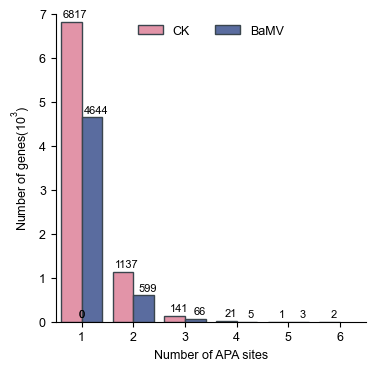

In [222]:
plt.figure(figsize=(4,4))
custom_colors = ['orangered','deepskyblue']  # 自定义颜色列表
sns.set_palette(custom_colors)
barplot=sns.barplot(data=plot_dat,x='index',y='num',hue='sample',palette=['#ef87a2','#4e66ab'],
            hue_order=['CK','BaMV'],edgecolor='#3a454d')
plt.xlabel('Number of APA sites')
plt.ylabel('Number of genes($\mathregular{10^3}$)')
plt.legend(frameon=False,loc='upper center',
    mode=None,ncol=2)
sns.despine()
plt.ylim(0,7)
for p in barplot.patches:
    height = p.get_height()
    barplot.text(x = p.get_x()+(3.5*p.get_width()/5),y = height+0.1,s = '{:.0f}'.format(height*1000),ha = 'center',fontsize=8)
plt.savefig(fp+'pas_sites_in_genes_2.pdf', bbox_inches="tight",transparent=True)

In [223]:
dla_pas_bm_ck

,gene_name,scaffold_x,strand_x,ppas_x,ppas_count_x,bm_ppas_rpm,dpas_x,dpas_count_x,bm_dpas_rpm,autr_x,...,ppas_count_y,ck_ppas_rpm,dpas_y,dpas_count_y,ck_dpas_rpm,autr_y,ppas_log_ratio,dpas_log_ratio,type,RED
0,evm.model.FRAGSCAFF_108.169,chr12.1,+,12399505,10,18.976376,12399576,43,81.598418,71,...,12,22.771652,12399576,73,138.527547,75,-0.263034,-0.763560,proximal,-0.500525
1,evm.model.FRAGSCAFF_112.16,chr34.1,-,9745753,8,15.181101,9745678,4,7.590551,75,...,15,28.464564,9745753,13,24.669289,44,-0.906891,-1.700440,proximal,-0.793549
2,evm.model.FRAGSCAFF_120.33,chr25.1,+,15356536,5,9.488188,15356606,14,26.566927,70,...,14,26.566927,15356601,23,43.645666,65,-1.485427,-0.716207,distal,0.769220
3,evm.model.FRAGSCAFF_121.543,chr10.1,+,33451612,17,32.259840,33451710,14,26.566927,98,...,27,51.236216,33451689,45,85.393693,77,-0.667425,-1.684498,proximal,-1.017074
4,evm.model.FRAGSCAFF_123.190,chr7.1,+,36273519,10,18.976376,36273656,44,83.496056,137,...,37,70.212592,36273656,102,193.559038,137,-1.887525,-1.212994,distal,0.674532
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
378,evm.model.ORIGINAL_927.206,chr23.1,+,3725419,11,20.874014,3725536,18,34.157477,117,...,21,39.850390,3725536,11,20.874014,117,-0.932886,0.710493,distal,1.643379
379,evm.model.ORIGINAL_927.57,chr23.1,-,5397476,10,18.976376,5397392,39,74.007868,84,...,9,17.078739,5397392,38,72.110230,84,0.152003,0.037475,unchange,-0.114528
380,evm.model.ORIGINAL_951.31,chr24.1,-,27564309,6,11.385826,27564232,23,43.645666,77,...,26,49.338578,27564242,29,55.031491,68,-2.115477,-0.334419,distal,1.781058
381,evm.model.ORIGINAL_979.131,chr22.1,-,20210521,31,58.826767,20210365,6,11.385826,156,...,54,102.472432,20210365,24,45.543303,123,-0.800691,-2.000000,proximal,-1.199309


In [225]:
dla_pas_bm_ck

,gene_name,scaffold_x,strand_x,ppas_x,ppas_count_x,bm_ppas_rpm,dpas_x,dpas_count_x,bm_dpas_rpm,autr_x,...,ppas_count_y,ck_ppas_rpm,dpas_y,dpas_count_y,ck_dpas_rpm,autr_y,ppas_log_ratio,dpas_log_ratio,type,RED
0,evm.model.FRAGSCAFF_108.169,chr12.1,+,12399505,10,18.976376,12399576,43,81.598418,71,...,12,22.771652,12399576,73,138.527547,75,-0.263034,-0.763560,proximal,-0.500525
1,evm.model.FRAGSCAFF_112.16,chr34.1,-,9745753,8,15.181101,9745678,4,7.590551,75,...,15,28.464564,9745753,13,24.669289,44,-0.906891,-1.700440,proximal,-0.793549
2,evm.model.FRAGSCAFF_120.33,chr25.1,+,15356536,5,9.488188,15356606,14,26.566927,70,...,14,26.566927,15356601,23,43.645666,65,-1.485427,-0.716207,distal,0.769220
3,evm.model.FRAGSCAFF_121.543,chr10.1,+,33451612,17,32.259840,33451710,14,26.566927,98,...,27,51.236216,33451689,45,85.393693,77,-0.667425,-1.684498,proximal,-1.017074
4,evm.model.FRAGSCAFF_123.190,chr7.1,+,36273519,10,18.976376,36273656,44,83.496056,137,...,37,70.212592,36273656,102,193.559038,137,-1.887525,-1.212994,distal,0.674532
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
378,evm.model.ORIGINAL_927.206,chr23.1,+,3725419,11,20.874014,3725536,18,34.157477,117,...,21,39.850390,3725536,11,20.874014,117,-0.932886,0.710493,distal,1.643379
379,evm.model.ORIGINAL_927.57,chr23.1,-,5397476,10,18.976376,5397392,39,74.007868,84,...,9,17.078739,5397392,38,72.110230,84,0.152003,0.037475,unchange,-0.114528
380,evm.model.ORIGINAL_951.31,chr24.1,-,27564309,6,11.385826,27564232,23,43.645666,77,...,26,49.338578,27564242,29,55.031491,68,-2.115477,-0.334419,distal,1.781058
381,evm.model.ORIGINAL_979.131,chr22.1,-,20210521,31,58.826767,20210365,6,11.385826,156,...,54,102.472432,20210365,24,45.543303,123,-0.800691,-2.000000,proximal,-1.199309


In [ ]:
dla_pas_bm_ck

In [229]:
dla_pas_bm_ck[dla_pas_bm_ck['gene_name']=='evm.model.FRAGSCAFF_343.28']

,gene_name,scaffold_x,strand_x,ppas_x,ppas_count_x,bm_ppas_rpm,dpas_x,dpas_count_x,bm_dpas_rpm,autr_x,...,ppas_count_y,ck_ppas_rpm,dpas_y,dpas_count_y,ck_dpas_rpm,autr_y,ppas_log_ratio,dpas_log_ratio,type,RED
154,evm.model.FRAGSCAFF_343.28,chr14.1,+,26403203,5,9.488188,26403275,7,13.283463,72,...,15,28.464564,26403275,4,7.590551,72,-1.584963,0.807355,distal,2.392317


In [230]:
dla_pas_bm_ck["utr_delta"] = abs(dla_pas_bm_ck["autr_x"] - dla_pas_bm_ck["autr_y"])

In [231]:
dla_pas_bm_ck[dla_pas_bm_ck['gene_name']=='evm.model.ORIGINAL_5766.198']

,gene_name,scaffold_x,strand_x,ppas_x,ppas_count_x,bm_ppas_rpm,dpas_x,dpas_count_x,bm_dpas_rpm,autr_x,...,ck_ppas_rpm,dpas_y,dpas_count_y,ck_dpas_rpm,autr_y,ppas_log_ratio,dpas_log_ratio,type,RED,utr_delta
350,evm.model.ORIGINAL_5766.198,chr19.1,-,21044507,29,55.031491,21044432,9,17.078739,75,...,223.92124,21044432,16,30.362202,78,-2.024662,-0.830075,distal,1.194587,3


In [232]:

dla_pas_bm_ck[dla_pas_bm_ck['gene_name']=='evm.model.ORIGINAL_4665.157']

,gene_name,scaffold_x,strand_x,ppas_x,ppas_count_x,bm_ppas_rpm,dpas_x,dpas_count_x,bm_dpas_rpm,autr_x,...,ck_ppas_rpm,dpas_y,dpas_count_y,ck_dpas_rpm,autr_y,ppas_log_ratio,dpas_log_ratio,type,RED,utr_delta
320,evm.model.ORIGINAL_4665.157,chr1.1,+,64279876,43,81.598418,64279977,5,9.488188,101,...,129.039359,64279977,33,62.622042,130,-0.661198,-2.722466,proximal,-2.061268,29


#### (1) aUTR

In [234]:
bamv_polya_results_pass=pd.read_csv('/home/qq/work/lxr/DRS/run_DRS_bamv/05_polya_tail/bamv_polya_results_pass.tsv',sep='\t')
ck_polya_results_pass=pd.read_csv('/home/qq/work/lxr/DRS/run_DRS_ck/05_polya_tail/ck_polya_results_pass.tsv',sep='\t')
bamv_featureCounts=pd.read_csv('/home/qq/work/lxr/DRS/run_DRS_bamv/06_featureCounts_new/bamv_genome_correct_2308.sorted.bam.featureCounts',sep='\t',names=['readname','assigned','n','gene_id'])
ck_featureCounts=pd.read_csv('/home/qq/work/lxr/DRS/run_DRS_ck/06_featureCounts_new/ck_genome_correct_2308.sorted.bam.featureCounts',sep='\t',names=['readname','assigned','n','gene_id'])

In [236]:
bamv_polya_results_pass=bamv_polya_results_pass.merge(bamv_featureCounts[bamv_featureCounts['assigned']=='Assigned'],how='right')
ck_polya_results_pass=ck_polya_results_pass.merge(ck_featureCounts[ck_featureCounts['assigned']=='Assigned'],how='right')
bamv_polya_results_pass['gene_name']=bamv_polya_results_pass['gene_id'].apply(get_transcript)
ck_polya_results_pass['gene_name']=ck_polya_results_pass['gene_id'].apply(get_transcript)

bamv_polya_results_pass_dict={}
for index,row in bamv_polya_results_pass.iterrows():
    readname=row[0]
    bamv_polya_results_pass_dict[readname]=defaultdict(dict)
    bamv_polya_results_pass_dict[readname]={'gene_name':row['gene_name'],'polya_length':row['polya_length']}
ck_polya_results_pass_dict={}
for index,row in ck_polya_results_pass.iterrows():
    ck_polya_results_pass_dict[readname]=defaultdict(dict)
    ck_polya_results_pass_dict[readname]={'gene_name':row['gene_name'],'polya_length':row['polya_length']}

/tmp/ipykernel_2054639/3617766146.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  readname=row[0]


In [326]:
# def get_last_exon_5end(gene_name, strand, anno_exon_level):
#     gene_exon_df = anno_exon_level.loc[gene_name, :].copy()
#     if strand == "+":
#         # isinstance()判断数据类型
#         if isinstance(gene_exon_df, pd.DataFrame):
#             # last_exon_5end = gene_exon_df.iloc[-1,2]
#             last_exon_5end = gene_exon_df.iloc[0, 3]
#         else:
#             last_exon_5end = gene_exon_df["start"]
#     else:
#         if isinstance(gene_exon_df, pd.DataFrame):
#             last_exon_5end = gene_exon_df.iloc[-1, 3]
#         else:
#             last_exon_5end = gene_exon_df["end"]
#     return last_exon_5end

def get_last_cds_3end(gene_name, strand, anno_cds_level):
    gene_cds_df = anno_cds_level.loc[gene_name, :].copy()
    if strand == "+":
        # isinstance()判断数据类型
        if isinstance(gene_cds_df, pd.DataFrame):
            # last_exon_5end = gene_exon_df.iloc[-1,3]
            last_exon_5end = gene_cds_df.sort_values(by='start',ascending=True).iloc[-1, 3]
        else:
            last_exon_5end = gene_cds_df["end"]
    else:
        if isinstance(gene_cds_df, pd.DataFrame):
            # last_exon_5end = gene_exon_df.iloc[0, 3]
            last_exon_5end = gene_cds_df.sort_values(by='start',ascending=True).iloc[-1, 3]
        else:
            last_exon_5end = gene_cds_df["start"]
    return last_exon_5end


def get_entropy(site_counter, total_count):
    """
    Calculate the entropy of the polya site in this PAC 计算此PAC中Polya站点的熵
    """
    entropy = 0
    for site in site_counter:
        p = site_counter[site] / total_count
        entropy += -p * np.log2(p)
    return entropy


STRAND_TO_BOOL = {"-": True, "+": False}

In [315]:
anno_cds_level[anno_cds_level['label_group']=='cds'].set_index('gene_name').loc['evm.model.FRAGSCAFF_0.10.1'].sort_values(by='start')

,scaffold,strand,label,start,end,length,label_group
gene_name,,,,,,,
evm.model.FRAGSCAFF_0.10.1,chr1.2,-,cds9,12604216,12604315,100,cds
evm.model.FRAGSCAFF_0.10.1,chr1.2,-,cds8,12604438,12604516,79,cds
evm.model.FRAGSCAFF_0.10.1,chr1.2,-,cds7,12604709,12604878,170,cds
evm.model.FRAGSCAFF_0.10.1,chr1.2,-,cds6,12604986,12605098,113,cds
evm.model.FRAGSCAFF_0.10.1,chr1.2,-,cds5,12605162,12605230,69,cds
evm.model.FRAGSCAFF_0.10.1,chr1.2,-,cds4,12605424,12605669,246,cds
evm.model.FRAGSCAFF_0.10.1,chr1.2,-,cds3,12605774,12605836,63,cds
evm.model.FRAGSCAFF_0.10.1,chr1.2,-,cds2,12607381,12607437,57,cds
evm.model.FRAGSCAFF_0.10.1,chr1.2,-,cds1,12607540,12607941,402,cds


In [ ]:
gff_cds

In [328]:
# get joblib parallel arg list
anno_cds_level_forutr=anno_cds_level[anno_cds_level['label_group']=='cds'].set_index('gene_name')
bamv_arg_list = {}
df=anno_gene_level.loc[bamv_polya_results_pass.gene_name,:]
# df=anno_gene_level[anno_gene_level.index=='evm.model.ORIGINAL_821.499']
for row in df.iterrows():    
    gene_name = row[0]
    gene_scaffold = row[1]["scaffold"]
    gene_start = min(row[1]["TSS"], row[1]["TTS"])
    gene_end = max(row[1]["TSS"], row[1]["TTS"])
    gene_strand = row[1]["strand"]
    gene_laste_exon_5end = get_last_cds_3end(gene_name, gene_strand, anno_cds_level_forutr)
    bamv_arg_list[gene_name]=[]
    bamv_arg_list[gene_name].append(
        [
            gene_name,
            gene_scaffold,
            gene_start,
            gene_end,
            gene_strand,
            gene_laste_exon_5end,
        ]
    )

# get joblib parallel arg list
ck_arg_list = {}
df=anno_gene_level.loc[ck_polya_results_pass.gene_name,:]
for row in df.iterrows():    
    gene_name = row[0]
    gene_scaffold = row[1]["scaffold"]
    gene_start = min(row[1]["TSS"], row[1]["TTS"])
    gene_end = max(row[1]["TSS"], row[1]["TTS"])
    gene_strand = row[1]["strand"]
    gene_laste_exon_5end = get_last_cds_3end(gene_name, gene_strand, anno_cds_level_forutr)
    ck_arg_list[gene_name]=[]
    ck_arg_list[gene_name].append(
        [
            gene_name,
            gene_scaffold,
            gene_start,
            gene_end,
            gene_strand,
            gene_laste_exon_5end,
        ]
    )

In [329]:
def get_cds_3end(gene_name,sample):
    arg_list=eval(sample+'_arg_list')
    #gene=get_gene(gene_name)
    return arg_list[gene_name][0][-1]

In [ ]:
bamv_arg_list['evm.model.FRAGSCAFF_24.8.2'][0]

['evm.model.FRAGSCAFF_24.8.2', 'chr4.1', 73424, 76905, '+', 76746]

In [323]:
bamv_arg_list['evm.model.FRAGSCAFF_24.8.2'][0]

['evm.model.FRAGSCAFF_24.8.2', 'chr4.1', 73424, 76905, '+', 76746]

In [327]:
anno_cds_level_forutr.sort_values(by='start',ascending=True).loc['evm.model.FRAGSCAFF_24.8.2']

,scaffold,strand,label,start,end,length,label_group
gene_name,,,,,,,
evm.model.FRAGSCAFF_24.8.2,chr4.1,+,cds1,73424,73520,97,cds
evm.model.FRAGSCAFF_24.8.2,chr4.1,+,cds2,73607,73728,122,cds
evm.model.FRAGSCAFF_24.8.2,chr4.1,+,cds3,76140,76189,50,cds
evm.model.FRAGSCAFF_24.8.2,chr4.1,+,cds4,76282,76353,72,cds
evm.model.FRAGSCAFF_24.8.2,chr4.1,+,cds5,76746,76905,160,cds


In [334]:
bamv_pas['cds_3end']=bamv_pas.apply(lambda row:get_cds_3end(row['gene_name'],'bamv'),axis=1)
ck_pas['cds_3end']=ck_pas.apply(lambda row:get_cds_3end(row['gene_name'],'ck'),axis=1)

In [331]:
from itertools import combinations

def get_utr(df):
    distances = []
    distances_2 = []
    utr3_len={}
    #df['exon_3end']=df.apply(lambda row:get_exon_3end(row['gene_name'],sample),axis=1)
    df['3utr_len']=df.apply(lambda row : abs(int(row['cds_3end'])-int(row['summit'])),axis=1)
    for gene,temp in df.groupby('gene_name'):
        utr3_len[gene]={'Single':[],'Shortest':[],'Longest':[]}
        ####丰度最高的pas代表cluster
        if len(temp) ==1:
            utr3_len[gene]['Single'].append(int(temp['3utr_len']))
        else:
            utr3_len[gene]['Shortest'].append(min(temp['3utr_len'])) 
            utr3_len[gene]['Longest'].append(max(temp['3utr_len'])) 
            sort_summit =sorted(list(temp['summit']))  
            #print([abs(int(sort_summit[i+1])-int(sort_summit[i])) for i in range(len(sort_summit)-1)])
            #distances[gene]=[abs(int(sort_summit[i+1])-int(sort_summit[i])) for i in range(len(sort_summit)-1)]
            for x1, x2 in combinations(sort_summit, 2): # 计算一维数据两两的距离
                distance = abs(x2 - x1)  # 一维情况用绝对值
                distances.append(distance)
            distances_2.append(abs(max(sort_summit)-min(sort_summit)))
    return distances_2,utr3_len

In [332]:
bamv_autr,bamv_utr3_len=get_utr(bamv_pas)
ck_autr,ck_utr3_len=get_utr(ck_pas)

/tmp/ipykernel_2054639/2043873378.py:13: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  utr3_len[gene]['Single'].append(int(temp['3utr_len']))
/tmp/ipykernel_2054639/2043873378.py:13: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  utr3_len[gene]['Single'].append(int(temp['3utr_len']))


#### (2) 3'UTR length

In [335]:
pd.DataFrame.from_dict(bamv_utr3_len).T.to_csv(fp+'bamv_utr3_len.csv')
pd.DataFrame.from_dict(ck_utr3_len).T.to_csv(fp+'ck_utr3_len.csv')

In [93]:
bamv_utr3_len=pd.read_csv(fp+'bamv_utr3_len.csv',index_col=0)
ck_utr3_len=pd.read_csv(fp+'ck_utr3_len.csv',index_col=0)

In [339]:
bamv_utr3_len

,Single,Shortest,Longest
evm.model.FRAGSCAFF_1.45_evm.model.FRAGSCAFF_1.47,271.0,NaN,NaN
evm.model.FRAGSCAFF_1.71,5370.0,NaN,NaN
evm.model.FRAGSCAFF_102.11,2082.0,NaN,NaN
evm.model.FRAGSCAFF_102.13,5030.0,NaN,NaN
evm.model.FRAGSCAFF_102.18,438.0,NaN,NaN
...,...,...,...
evm.model.ORIGINAL_981.153,290.0,NaN,NaN
evm.model.ORIGINAL_981.166,9686.0,NaN,NaN
evm.model.ORIGINAL_981.167_evm.model.ORIGINAL_981.168,6222.0,NaN,NaN
evm.model.ORIGINAL_981.170,566.0,NaN,NaN


In [94]:
bamv_utr3_len_long=bamv_utr3_len.reset_index().melt(id_vars='index')
ck_utr3_len_long=ck_utr3_len.reset_index().melt(id_vars='index')
bamv_utr3_len_long['sample']='BaMV'
ck_utr3_len_long['sample']='CK'
plot_dat=pd.concat([ck_utr3_len_long,bamv_utr3_len_long])

In [341]:
ck_utr3_len_long

,index,variable,value,sample
0,evm.model.FRAGSCAFF_1.28,Single,391.0,CK
1,evm.model.FRAGSCAFF_1.33,Single,NaN,CK
2,evm.model.FRAGSCAFF_1.45_evm.model.FRAGSCAFF_1.47,Single,NaN,CK
3,evm.model.FRAGSCAFF_1.71,Single,5370.0,CK
4,evm.model.FRAGSCAFF_102.11,Single,2082.0,CK
...,...,...,...,...
24352,evm.model.ORIGINAL_981.153,Longest,NaN,CK
24353,evm.model.ORIGINAL_981.158,Longest,NaN,CK
24354,evm.model.ORIGINAL_981.167_evm.model.ORIGINAL_...,Longest,NaN,CK
24355,evm.model.ORIGINAL_981.170,Longest,NaN,CK


In [95]:
ck_utr3_len_long['log2len']=np.log2(ck_utr3_len_long.value)
bamv_utr3_len_long['log2len']=np.log2(bamv_utr3_len_long.value)

In [98]:
ck_utr3_len_long.groupby('variable')['value'].agg('median')

variable
Longest     922.5
Shortest    642.5
Single      751.0
Name: value, dtype: float64

In [99]:
bamv_utr3_len_long.groupby('variable')['value'].agg('median')

variable
Longest     873.0
Shortest    631.0
Single      661.5
Name: value, dtype: float64

In [ ]:
np.log2(455)

8.829722735086058

In [346]:
from scipy import stats
for i in bamv_utr3_len_long.variable.unique():
    stat1, p_value1 = stats.shapiro(bamv_utr3_len_long[bamv_utr3_len_long['variable']==i].value.dropna())
    print(i,stat1, p_value1 )
    # 正态性检验
    
    # stat2, p_value2 = stats.shapiro(group2)

Single 0.33837313414896497 1.811069887452216e-84
Shortest 0.25624166636840484 1.7976504046999052e-45
Longest 0.2811723445103512 5.812748306036689e-45


In [347]:
from scipy import stats
for i in bamv_utr3_len_long.variable.unique():
    stat, p_value = stats.ttest_ind(ck_utr3_len_long[ck_utr3_len_long['variable']==i].value.dropna(),
                                    bamv_utr3_len_long[bamv_utr3_len_long['variable']==i].value.dropna())
    print(i,stat,p_value)

Single 2.397835845572794 0.01650815413121166
Shortest 1.804526511556711 0.07130123733610962
Longest 0.18356571425380033 0.8543730242615903


In [348]:
plot_dat.to_csv(fp+'3utr_length_violinplot.csv',index=False)

In [ ]:
fp+'3utr_length_violinplot.csv'

In [102]:
dla_pas_bm_ck[dla_pas_bm_ck['gene_name']=='evm.model.FRAGSCAFF_455.4']

,gene_name,scaffold_x,strand_x,ppas_x,ppas_count_x,bm_ppas_rpm,dpas_x,dpas_count_x,bm_dpas_rpm,autr_x,...,dpas_count_y,ck_dpas_rpm,autr_y,ppas_log_ratio,dpas_log_ratio,type,RED,utr_delta,bm_log2M/m,ck_log2M/m
214,evm.model.FRAGSCAFF_455.4,chr23.1,+,43285873,57,108.165345,43285988,41,77.803143,115,...,98,185.968488,141,-0.94847,-1.257158,proximal,-0.308688,26,-0.475338,-0.16665


aUTR density

/tmp/ipykernel_2054639/3443419711.py:23: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  plt.legend([l2,l1],labels=['CK','BaMV'],frameon=False,fontsize=9,loc='center right')


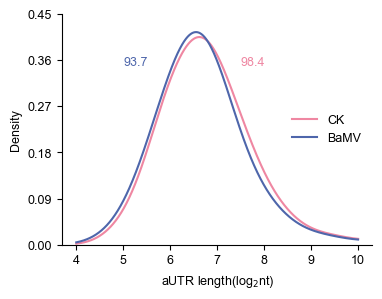

In [287]:
from scipy.stats import gaussian_kde
plt.figure(figsize=(4,3))
kde1=gaussian_kde(np.log2(bamv_autr))# 使用 gaussian_kde 计算核密度估计
kde2=gaussian_kde(np.log2(ck_autr))
x=np.linspace(4,10,5000)
density_values1=kde1(x) #将数据对应到x生成密度值
density_values2=kde2(x) 
peak_values1=np.max(density_values1)#生成最高密度的y值
peak_values2=np.max(density_values2)
peak_p1=x[np.argmax(density_values1)]
peak_p2=x[np.argmax(density_values2)]

l2=plt.plot(x,density_values2,color='#ef87a2')
l1=plt.plot(x,density_values1,color='#4e66ab')
plt.ylim(0,0.45)
plt.xticks(np.linspace(4,10,7),fontsize=9)
plt.yticks(np.linspace(0,0.45,6),fontsize=9)
sns.despine()
plt.ylabel('Density')
plt.xlabel(r'aUTR length(log$_{2}$nt)')
plt.text(x=5,y=0.35,s=round(2**peak_p1,1),color='#4e66ab')
plt.text(x=7.5,y=0.35,s=round(2**peak_p2,1),color='#ef87a2')
plt.legend([l2,l1],labels=['CK','BaMV'],frameon=False,fontsize=9,loc='center right')
plt.savefig(fp+'aUTR_log2len_2.pdf',bbox_inches='tight',transparent=True)

In [285]:
max(bamv_autr),min(bamv_autr)

(123461, 25)

In [351]:
dla_pas_bm_rpm['M/m']=dla_pas_bm_rpm['bm_dpas_rpm']/dla_pas_bm_rpm['bm_ppas_rpm']
dla_pas_ck_rpm['M/m']=dla_pas_ck_rpm['ck_dpas_rpm']/dla_pas_ck_rpm['ck_ppas_rpm']

In [352]:
dla_pas_bm_rpm['change']=dla_pas_bm_rpm['M/m'].apply(lambda x: 'Up' if x >1 else('Down' if x < 1 else 'None' ))

In [353]:
dla_pas_ck_rpm['change']=dla_pas_ck_rpm['M/m'].apply(lambda x: 'Up' if x >1 else('Down' if x < 1 else 'None' ))

In [354]:
fp

'/home/qq/work/lxr/DRS/script_plot/bamv/'

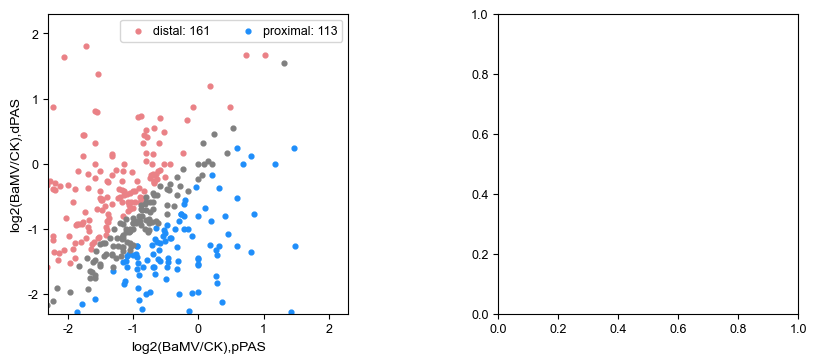

In [355]:
#figsize=(11, 4)
fig, axes = plt.subplots(1,2,figsize=(7.5,3))
samples = [dla_pas_bm_ck,dla_pas_bm_ck]
# labels = [('2b_mod_ratio/2m_mod_ratio'),('4b_mod_ratio/4m_mod_ratio'),('2b_mod_ratio/4b_mod_ratio'),('2m_mod_ratio/4m_mod_ratio')]
for sample, i in zip(samples,range(1)):
    s1=axes[i].scatter(
        sample[sample.type == "distal"]["ppas_log_ratio"],
        sample[sample.type == "distal"]["dpas_log_ratio"],
        color='#ea8186',#"#a92523",#"red",
        marker="o",
        s=12,
        label='distal: %s' % (len(sample[sample.type == "distal"])),
    )
    s2=axes[i].scatter(
        sample[sample.type == "proximal"]["ppas_log_ratio"],
        sample[sample.type == "proximal"]["dpas_log_ratio"],
        color='#1f8efa',#'#05358a',#"dodgerblue",
        marker="o",
        s=12,
        label='proximal: %s' % (len(sample[sample.type == "proximal"])),
    )
    s3=axes[i].scatter(
        sample[sample.type == "unchange"]["ppas_log_ratio"],
        sample[sample.type == "unchange"]["dpas_log_ratio"],
        color="grey",
        marker="o",
        s=12,
    )
    axes[i].set_ylim(-2.3, 2.3)
    axes[i].set_xlim(-2.3, 2.3)
    axes[i].set_xlabel("log2(BaMV/CK),pPAS",fontsize=10)
    axes[i].set_ylabel("log2(BaMV/CK),dPAS",fontsize=10)
    axes[i].legend(fontsize=9,handletextpad=0.2,ncol=2)
    # plt.legend(handles=bplot8['boxes'], loc='center left', bbox_to_anchor=(0.8, 0.1),
    #        facecolor='None', frameon=False, ncol=1, markerscale=2, borderaxespad=1,
    #        handletextpad=0.6, fontsize='small', labels=legend_labels,handlelength=1.5)
plt.subplots_adjust(left=0, right=1, top=1, bottom=0, wspace=0.5, hspace=1)
plt.savefig(
    fp+"scatter_dPAS_pPAS.pdf",
    format="pdf",
    dpi=600,
    bbox_inches="tight",
    transparent=True,
)

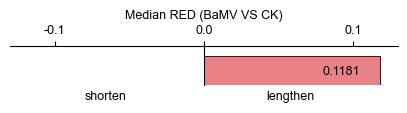

In [356]:
fig, ax = plt.subplots(1, 1, figsize=(5, 0.5))
# ax=fig.add_axes([0,0,2,2])
ax.barh(
    range(1),
    dla_pas_bm_ck["RED"].median(),
    height=0.75,
    color='#ea8186',#"#a92523",
    edgecolor="black",
    linewidth=0.6,
)
ax.xaxis.set_ticks_position('top')
ax.xaxis.set_label_position('top')
ax.tick_params(axis='x',direction='out')
# sns.despine(ax = ax,trim=True,offset=0)
ax.spines["left"].set_position("zero")
ax.spines["right"].set_visible(False)
ax.spines["bottom"].set_visible(False)
y_major_locator = MultipleLocator(1.5)
x_major_locator = MultipleLocator(0.1)
ax.yaxis.set_major_locator(y_major_locator)
ax.xaxis.set_major_locator(x_major_locator)
ax.set_yticks([])
ax.set_xlim(-0.13, 0.13)
ax.set_ylim(0, 0.5)
# ax.set_ylabel('BaMV VS CK','rotation')
ax.set_xlabel(
    "Median RED (BaMV VS CK)",
)

# ax[0].set_ylabel('A', fontdict={'size': 16}, rotation=0, x=-0.1, y=0.35)
#ax.text(x=0.01, y=0.05, s="BaMV VS CK")
ax.text(x=0.08, y=0.13, s=round(dla_pas_bm_ck["RED"].median(), 4))
ax.annotate(
    "",
    xy=(-0.04, -0.2),
    xytext=(0.04, -0.2),
    arrowprops=dict(facecolor="black", arrowstyle="<->"),
)
plt.text(x=0.042, y=-0.2, s="lengthen")#, c="red")
plt.text(x=-0.08, y=-0.2, s="shorten")#, c="dodgerblue")

#plt.arrow(0,0.05,)
plt.savefig(
    fp+"bam_ck_RED_plot.pdf",
    bbox_inches="tight",
)

### 2. APA & PTR

In [23]:
pro_abundance=pd.read_csv("/home/qq/work/lxr/DRS/wig/rnaseq_Dla_wig/pro_abundance.csv",index_col=0)
deseq2_bamv_ck_res=pd.read_csv("/home/qq/work/lxr/DRS/wig/rnaseq_Dla_wig/deseq2_bamv_ck_res_1.5.csv")

In [ ]:
def get_up_down(ppas_log_ratio, dpas_log_ratio):
    if (ppas_log_ratio - dpas_log_ratio) > 0.3:
        return "proximal"
    elif (ppas_log_ratio - dpas_log_ratio) < -0.3:
        return "distal"
    else:
        return "unchange"
dla_pas_bm_ck["type"] = dla_pas_bm_ck.apply(
    lambda row: get_up_down(row["ppas_log_ratio"], row["dpas_log_ratio"]), axis=1
)

In [357]:
dla_pas_bm_ck[dla_pas_bm_ck["type"] != "unchange"].type.value_counts()

type
distal      161
proximal    113
Name: count, dtype: int64

In [360]:
dla_pas_bm_ck.to_csv(fp+'dla_pas_bm_ck_3.csv',index=False)

In [361]:
len(set(deseq2_bamv_ck_res[deseq2_bamv_ck_res['log2FoldChange'].notna()].gene_name) & set(pro_abundance[pro_abundance['log2fc'].notna()].index))

6944

In [362]:
inte_rna_pro_logfc = pd.read_csv("/home/qq/work/lxr/DRS/wig/rnaseq_Dla_wig/inte_rna_pro_logfc.csv")

In [363]:
dat=dla_pas_bm_ck.merge(inte_rna_pro_logfc)

In [364]:
dat.to_csv(fp+'apa_logPTR.csv',index=False)

In [297]:
from scipy import stats

In [ ]:
dat

,gene_name,scaffold_x,strand_x,ppas_x,ppas_count_x,bm_ppas_rpm,dpas_x,dpas_count_x,bm_dpas_rpm,autr_x,...,dpas_y,dpas_count_y,ck_dpas_rpm,autr_y,ppas_log_ratio,dpas_log_ratio,type,rna_logfc,protein_logfc,log10_FC(pro/rna)
0,evm.model.FRAGSCAFF_112.16,chr34.1,-,9745753,8,15.181101,9745678,4,7.590551,75,...,9745753,13,24.669289,44,-0.906891,-1.700440,proximal,0.211074,-0.023161,-0.070512
1,evm.model.FRAGSCAFF_113.34,chr35.1,+,6307426,32,60.724404,6315992,47,89.188969,8566,...,6316014,42,79.700780,8582,1.299560,0.162271,proximal,0.558783,1.041018,0.145167
2,evm.model.FRAGSCAFF_120.33,chr25.1,+,15356535,5,9.488188,15356605,14,26.566927,70,...,15356600,23,43.645666,65,-1.485427,-0.716207,distal,-0.746692,0.632403,0.415149
3,evm.model.FRAGSCAFF_123.70,chr7.1,+,34748966,610,1157.558955,34749605,46,87.291331,639,...,34749605,80,151.811010,639,-0.908466,-0.798366,unchange,-0.729938,-0.896598,-0.050170
4,evm.model.FRAGSCAFF_124.140,chr6.1,+,11122647,56,106.267707,11122694,8,15.181101,47,...,11122647,97,184.070850,134,0.347923,-3.599913,proximal,-0.447807,-0.417444,0.009140
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
229,evm.model.ORIGINAL_821.366,chr16.1,-,36339635,7,13.283463,36339534,8,15.181101,101,...,36339534,11,20.874014,101,-2.684498,-0.459432,distal,1.921391,-0.104382,-0.609818
230,evm.model.ORIGINAL_821.503,chr16.1,-,34786715,9,17.078739,34786585,36,68.314955,130,...,34786578,102,193.559038,137,-1.152003,-1.502500,proximal,-0.256466,-0.333757,-0.023267
231,evm.model.ORIGINAL_951.31,chr24.1,-,27564309,6,11.385826,27564232,23,43.645666,77,...,27564242,29,55.031491,68,-2.115477,-0.334419,distal,-0.489121,-0.103105,0.116202
232,evm.model.ORIGINAL_979.131,chr22.1,-,20210521,31,58.826767,20210365,6,11.385826,156,...,20210365,24,45.543303,123,-0.800691,-2.000000,proximal,-0.716282,-0.049321,0.200776


In [301]:
stat1,pv1=stats.ttest_ind(list(dat[dat['type']=='proximal']['log10_FC(pro/rna)'].dropna()),list(dat[dat['type']=='unchange']['log10_FC(pro/rna)'].dropna()))

In [299]:
stat1,pv1=stats.ttest_ind(list(dat[dat['type']=='distal']['log10_FC(pro/rna)'].dropna()),list(dat[dat['type']=='unchange']['log10_FC(pro/rna)'].dropna()))

In [302]:
stat1,pv1

(0.039377151051167396, 0.968654593086036)

In [ ]:
stat1,pv1

(0.6087155264042058, 0.543565613880008)

In [303]:
dat['label'] = dat['type'].apply(lambda x:'Unchanged' if x == 'unchange' else 'Changed')
label={'distal':'Distal','unchange':'Normal','proximal':'Proximal'}
dat['Type']=dat['type'].map(label)

/tmp/ipykernel_2054639/4199819394.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  f1=sns.violinplot(x=dat['Type'],y=dat['log10_FC(pro/rna)'],order=['Distal','Normal','Proximal'],palette=['#ea8186','#b3b3b3','#1f8efa'],linewidth=1.2)


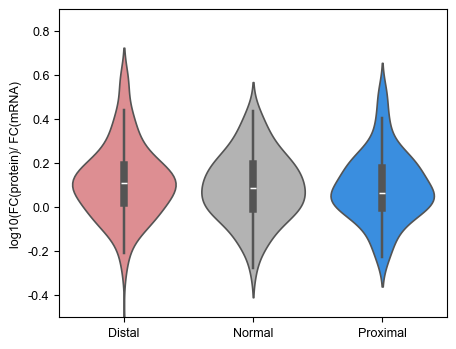

In [305]:
plt.figure(figsize=(5,4))
f1=sns.violinplot(x=dat['Type'],y=dat['log10_FC(pro/rna)'],order=['Distal','Normal','Proximal'],palette=['#ea8186','#b3b3b3','#1f8efa'],linewidth=1.2)
plt.xlabel('')
plt.ylabel('log10(FC(protein)/ FC(mRNA)')
plt.ylim(-0.5,0.9)
plt.savefig(fp+'logPTR_APA_violinplot.pdf', bbox_inches="tight",transparent=True)
#plt.xticks(['distal','unchange','proximal'],['Distal','Normal','Proximal'])

In [365]:
pd.DataFrame({'id':dla_pas_bm_ck[dla_pas_bm_ck['type']=='distal'].gene_name.unique()}).to_csv(fp+'distal_gene.csv',index=False)
pd.DataFrame({'id':dla_pas_bm_ck[dla_pas_bm_ck['type']=='proximal'].gene_name.unique()}).to_csv(fp+'proximal_gene.csv',index=False)

In [100]:
pd.DataFrame({'id':dla_pas_bm_ck[dla_pas_bm_ck['type']=='distal'].gene_name.unique()})

,id
0,evm.model.FRAGSCAFF_120.33
1,evm.model.FRAGSCAFF_123.190
2,evm.model.FRAGSCAFF_125.148
3,evm.model.FRAGSCAFF_132.362
4,evm.model.FRAGSCAFF_133.620
...,...
156,evm.model.ORIGINAL_6430.62
157,evm.model.ORIGINAL_6548.64
158,evm.model.ORIGINAL_821.366
159,evm.model.ORIGINAL_927.206


### 3. DEAPA DEPs

In [25]:
dla_pas_bm_ck=pd.read_csv('/home/qq/work/lxr/DRS/script_plot/bamv/dla_pas_bm_ck_2.csv')

In [32]:
dat=pro_abundance.merge(dla_pas_bm_ck,left_index=True,right_on='gene_name').set_index('gene_name',drop=False).dropna()

In [33]:
plot_dat=dat[dat['type'] != 'unchange'].dropna()
plot_dat=plot_dat[['log2fc','Dla1_(FC_1.5_label)','RED','type']]
color={'up':'#ea8186','down':'#1f8efa','stable':'grey'}
plot_dat['color']=plot_dat['Dla1_(FC_1.5_label)'].map(color)

In [36]:
plot_dat_go=plot_dat.merge(ma_gene_go_des_MF,right_on='gene_id',left_index=True,how='left').rename(columns={'go_term':'MF_GO','des':'MF_term'})
plot_dat_go2=plot_dat_go.merge(ma_gene_go_des_BP,right_on='gene_id',left_on='gene_id',how='left').rename(columns={'go_term':'BP_GO','des':'BP_term'})

In [38]:
fp='/home/qq/work/lxr/DRS/script_plot/bamv/'

In [39]:
plot_dat_go2.to_csv(fp+'DEAPA_DEPro_go.csv',index=False)

In [45]:
plot_dat=pd.read_csv(fp+'DEAPA_DEPro_go.csv')

In [41]:
plot_dat=plot_dat.set_index('gene_id')

In [44]:
plot_dat.reset_index()

,gene_id,log2fc,Dla1_(FC_1.5_label),RED,type,color,MF_GO,MF_term,BP_GO,BP_term
0,evm.model.FRAGSCAFF_259.922,-0.011990,stable,0.538312,distal,grey,GO:0005524,ATP binding,GO:0042026,protein refolding
1,evm.model.FRAGSCAFF_67.10_evm.model.FRAGSCAFF_...,-0.584258,stable,-0.569256,proximal,grey,GO:0005524,ATP binding,NaN,NaN
2,evm.model.FRAGSCAFF_56.532,0.261706,stable,0.925999,distal,grey,GO:0005524,ATP binding,NaN,NaN
3,evm.model.FRAGSCAFF_395.39_evm.model.FRAGSCAFF...,-0.534573,stable,-0.362570,proximal,grey,NaN,NaN,NaN,NaN
4,evm.model.FRAGSCAFF_188.263,0.511980,stable,-1.698830,proximal,grey,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
232,evm.model.FRAGSCAFF_349.60.1,0.032444,stable,0.387023,distal,grey,NaN,NaN,NaN,NaN
233,evm.model.FRAGSCAFF_424.270,-0.149234,stable,0.970987,distal,grey,NaN,NaN,NaN,NaN
234,evm.model.ORIGINAL_2592.249,0.098240,stable,5.942080,distal,grey,NaN,NaN,GO:0000398,"mRNA splicing, via spliceosome"
235,evm.model.ORIGINAL_1974.42,0.029539,stable,0.395457,distal,grey,NaN,NaN,NaN,NaN


In [50]:
a,b

(10, 5)

[]

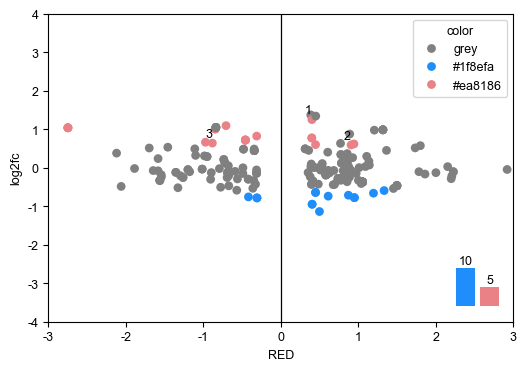

In [57]:
fig,ax = plt.subplots(figsize=(6,4))
sns.scatterplot(x=plot_dat['RED'],y=plot_dat['log2fc'],hue=plot_dat['color'],palette=['grey','#1f8efa','#ea8186'],s=40,ax=ax,edgecolor='none')
plt.axvline(0,color='black',linestyle='-',linewidth=.9)
ax.set_xlim(-3,3)
ax.set_ylim(-4,4)

# gene_show={'1':'evm.model.ORIGINAL_2088.64','2':'evm.model.ORIGINAL_1673.359',
#            '3':'evm.model.FRAGSCAFF_424.51','4':'evm.model.ORIGINAL_3933.64'}

gene_show={'1':'evm.model.ORIGINAL_1673.359',
           '2':'evm.model.FRAGSCAFF_424.51','3':'evm.model.ORIGINAL_3933.64'}
positions=[]
for gene in gene_show.values():
    x=plot_dat[plot_dat['gene_id']==gene]['RED'].unique()
    y=plot_dat[plot_dat['gene_id']==gene]['log2fc'].unique()
    positions.append((x,y))
texts=[]
texts_t=[]

for gene,pos in zip(gene_show,positions):
    text=plt.text(pos[0],pos[1],gene,fontsize=9,ha='right', va='bottom')
    texts.append(text)
    texts_t.append((pos[0],pos[1],text))
adjust_text(texts,force_text=.5,force_points=4,arrowprops=dict(arrowstyle="->", color='black', lw=1),only_move={'text':'y'})

insert_ax1=fig.add_axes([0.8,0.15,0.08,0.1]) # l, b, w, h
a,b=len(plot_dat[(plot_dat['type'] =='distal') & (plot_dat['Dla1_(FC_1.5_label)']=='down')].gene_id.unique()),len(plot_dat[(plot_dat['type'] == 'distal') & (plot_dat['Dla1_(FC_1.5_label)']=='up')].gene_id.unique())
insert_bar1=insert_ax1.bar(['Down','Up'],[a,b],color=['#1f8efa','#ea8186'])
for bar in insert_bar1:
    height=bar.get_height()
    insert_ax1.text(bar.get_x()+bar.get_width()/2,height,f'{height}',ha='center',va='bottom')
insert_ax1.spines['top'].set_visible(False)
insert_ax1.spines['left'].set_visible(False)  
insert_ax1.spines['right'].set_visible(False)  
insert_ax1.spines['bottom'].set_visible(False)  
insert_ax1.tick_params(axis='x',bottom=False)
insert_ax1.tick_params(axis='y',bottom=False)
insert_ax1.set_yticks([])
insert_ax1.set_xticks([])

In [66]:
list(gene_show.values())

['evm.model.ORIGINAL_2088.64',
 'evm.model.ORIGINAL_1673.359',
 'evm.model.FRAGSCAFF_424.51',
 'evm.model.ORIGINAL_3933.64']

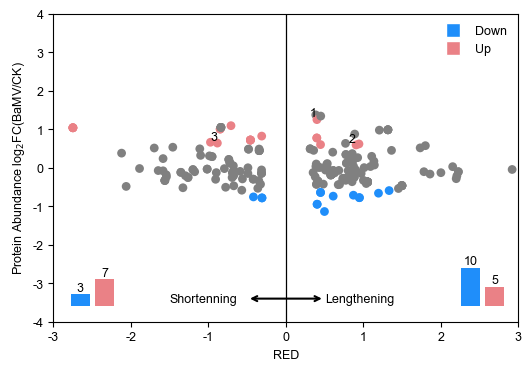

In [69]:
fig,ax = plt.subplots(figsize=(6,4))
sns.scatterplot(x=plot_dat['RED'],y=plot_dat['log2fc'],hue=plot_dat['color'],palette=['grey','#1f8efa','#ea8186'],s=40,ax=ax,edgecolor='none')
plt.axvline(0,color='black',linestyle='-',linewidth=.9)
ax.set_xlim(-3,3)
ax.set_ylim(-4,4)

# gene_show={'1':'evm.model.ORIGINAL_2088.64','2':'evm.model.ORIGINAL_1673.359',
#            '3':'evm.model.FRAGSCAFF_424.51','4':'evm.model.ORIGINAL_3933.64'}

gene_show={'1':'evm.model.ORIGINAL_1673.359',
           '2':'evm.model.FRAGSCAFF_424.51','3':'evm.model.ORIGINAL_3933.64'}
positions=[]
for gene in gene_show.values():
    x=plot_dat[plot_dat['gene_id']==gene]['RED'].unique()
    y=plot_dat[plot_dat['gene_id']==gene]['log2fc'].unique()
    positions.append((x,y))
texts=[]
texts_t=[]

for gene,pos in zip(gene_show,positions):
    text=plt.text(pos[0],pos[1],gene,fontsize=9,ha='right', va='bottom')
    texts.append(text)
    texts_t.append((pos[0],pos[1],text))
# adjust_text(texts,force_text=.5,force_points=4,arrowprops=dict(arrowstyle="->", color='black', lw=1),only_move={'text':'y'})

insert_ax1=fig.add_axes([0.8,0.15,0.08,0.1]) # l, b, w, h
a,b=len(plot_dat[(plot_dat['type'] =='distal') & (plot_dat['Dla1_(FC_1.5_label)']=='down')].gene_id.unique()),len(plot_dat[(plot_dat['type'] == 'distal') & (plot_dat['Dla1_(FC_1.5_label)']=='up')].gene_id.unique())
insert_bar1=insert_ax1.bar(['Down','Up'],[a,b],color=['#1f8efa','#ea8186'])
for bar in insert_bar1:
    height=bar.get_height()
    insert_ax1.text(bar.get_x()+bar.get_width()/2,height,f'{height}',ha='center',va='bottom')
insert_ax1.spines['top'].set_visible(False)
insert_ax1.spines['left'].set_visible(False)  
insert_ax1.spines['right'].set_visible(False)  
insert_ax1.spines['bottom'].set_visible(False)  
insert_ax1.tick_params(axis='x',bottom=False)
insert_ax1.tick_params(axis='y',bottom=False)
insert_ax1.set_yticks([])
insert_ax1.set_xticks([])

insert_ax2=fig.add_axes([0.15,0.15,0.08,0.07]) # l, b, w, h
a,b=len(plot_dat[(plot_dat['type'] =='proximal') & (plot_dat['Dla1_(FC_1.5_label)']=='down')].gene_id.unique()),len(plot_dat[(plot_dat['type'] == 'proximal') & (plot_dat['Dla1_(FC_1.5_label)']=='up')].gene_id.unique())
insert_bar2=insert_ax2.bar(['Down','Up'],[a,b],color=['#1f8efa','#ea8186'])
for bar in insert_bar2:
    height=bar.get_height()
    insert_ax2.text(bar.get_x()+bar.get_width()/2,height,f'{height}',ha='center',va='bottom')
insert_ax2.spines['top'].set_visible(False)
insert_ax2.spines['left'].set_visible(False)  
insert_ax2.spines['right'].set_visible(False)  
insert_ax2.spines['bottom'].set_visible(False)  
insert_ax2.tick_params(axis='x',bottom=False)
insert_ax2.tick_params(axis='y',bottom=False)
insert_ax2.set_yticks([])
insert_ax2.set_xticks([])
custom_legend_elements=[
Line2D([0],[0],marker='s',color='w',markerfacecolor='#1f8efa',markersize=10,label='Down'),
Line2D([0],[0],marker='s',color='w',markerfacecolor='#ea8186',markersize=10,label='Up')
]
ax.legend(handles=custom_legend_elements, loc='upper right', fontsize='medium', frameon=False)

ax.text(-1.5,-3.5,'Shortenning')
ax.text(0.5,-3.5,'Lengthening')
ax.annotate('',xy=(-0.5,-3.4),xytext=(0.5,-3.4),
            arrowprops=dict(arrowstyle='<->',color='black',lw=1.5))
ax.set_xlabel('RED')
ax.set_ylabel('Protein Abundance log$_2$FC(BaMV/CK)')

plt.savefig(fp+'log2pro_RED.pdf', bbox_inches="tight",transparent=True)

### 4. DEAPA & m6A median ratio in 3'UTR

In [6]:
bm_ck_site=pd.read_csv('/home/qq/work/lxr/DRS/script_plot/bamv/bm_ck_site.csv')
dla_pas_bm_ck=pd.read_csv('/home/qq/work/lxr/DRS/script_plot/bamv/dla_pas_bm_ck_2.csv',sep='\t')

In [7]:
dla_pas_bm_ck

,gene_name,scaffold_x,strand_x,ppas_x,ppas_count_x,bm_ppas_rpm,dpas_x,dpas_count_x,bm_dpas_rpm,autr_x,...,dpas_count_y,ck_dpas_rpm,autr_y,ppas_log_ratio,dpas_log_ratio,type,RED,utr_delta,bm_log2M/m,ck_log2M/m
0,evm.model.FRAGSCAFF_108.169,chr12.1,+,12399505,10,18.976376,12399576,43,81.598418,71,...,73,138.527547,75,-0.263034,-0.763560,proximal,-0.500525,4,2.104337,2.604862
1,evm.model.FRAGSCAFF_112.16,chr34.1,-,9745753,8,15.181101,9745678,4,7.590551,75,...,13,24.669289,44,-0.906891,-1.700440,proximal,-0.793549,31,-1.000000,-0.206451
2,evm.model.FRAGSCAFF_120.33,chr25.1,+,15356536,5,9.488188,15356606,14,26.566927,70,...,23,43.645666,65,-1.485427,-0.716207,distal,0.769220,5,1.485427,0.716207
3,evm.model.FRAGSCAFF_121.543,chr10.1,+,33451612,17,32.259840,33451710,14,26.566927,98,...,45,85.393693,77,-0.667425,-1.684498,proximal,-1.017074,21,-0.280108,0.736966
4,evm.model.FRAGSCAFF_123.190,chr7.1,+,36273519,10,18.976376,36273656,44,83.496056,137,...,102,193.559038,137,-1.887525,-1.212994,distal,0.674532,0,2.137504,1.462972
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
378,evm.model.ORIGINAL_927.206,chr23.1,+,3725419,11,20.874014,3725536,18,34.157477,117,...,11,20.874014,117,-0.932886,0.710493,distal,1.643379,0,0.710493,-0.932886
379,evm.model.ORIGINAL_927.57,chr23.1,-,5397476,10,18.976376,5397392,39,74.007868,84,...,38,72.110230,84,0.152003,0.037475,unchange,-0.114528,0,1.963474,2.078003
380,evm.model.ORIGINAL_951.31,chr24.1,-,27564309,6,11.385826,27564232,23,43.645666,77,...,29,55.031491,68,-2.115477,-0.334419,distal,1.781058,9,1.938599,0.157541
381,evm.model.ORIGINAL_979.131,chr22.1,-,20210521,31,58.826767,20210365,6,11.385826,156,...,24,45.543303,123,-0.800691,-2.000000,proximal,-1.199309,33,-2.369234,-1.169925


In [8]:
dat=bm_ck_site[bm_ck_site['label_group'].str.contains('utr3p')].merge(dla_pas_bm_ck[dla_pas_bm_ck['type'] != 'unchange'])

In [9]:
apa_ratio={}
for gene,temp in dat.groupby('gene_name'):
    apa_ratio[gene]={}
    bmutr_ratio=temp['bm_ratio'].mean()
    ckutr_ratio=temp['ck_ratio'].mean()
    apa_ratio[gene]={'bm_ratio':bmutr_ratio,'ck_ratio':ckutr_ratio,'type':temp['type'].unique()[0],'RED':temp['RED'].unique()[0]}

In [10]:
plot_dat=pd.DataFrame.from_dict(apa_ratio).T.dropna()
plot_dat['ratio_change']=plot_dat['bm_ratio'] - plot_dat['ck_ratio']
plot_dat['ratio_label']=plot_dat['ratio_change'].apply(lambda x:'hyper' if x >0.1 else 'hypo' if x < -0.1 else 'stable')
color={'hyper':'red','hypo':'blue','stable':'grey'}
plot_dat['color']=plot_dat['ratio_label'].map(color)

In [11]:
plot_dat

,bm_ratio,ck_ratio,type,RED,ratio_change,ratio_label,color
evm.model.FRAGSCAFF_108.169,0.173822,0.193591,proximal,-0.500525,-0.019769,stable,grey
evm.model.FRAGSCAFF_112.16,0.615385,0.356204,proximal,-0.793549,0.259181,hyper,red
evm.model.FRAGSCAFF_123.190,0.233333,0.218879,distal,0.674532,0.014454,stable,grey
evm.model.FRAGSCAFF_128.389,0.497826,0.520458,proximal,-0.736966,-0.022632,stable,grey
evm.model.FRAGSCAFF_132.362,0.064935,0.097087,distal,0.853958,-0.032152,stable,grey
...,...,...,...,...,...,...,...
evm.model.ORIGINAL_821.38,0.299226,0.313291,proximal,-5.674841,-0.014065,stable,grey
evm.model.ORIGINAL_821.499,0.376335,0.343599,proximal,-1.214739,0.032736,stable,grey
evm.model.ORIGINAL_821.503,0.386342,0.428177,proximal,-0.350497,-0.041835,stable,grey
evm.model.ORIGINAL_951.31,0.459528,0.533722,distal,1.781058,-0.074194,stable,grey


In [76]:
plot_dat[plot_dat['color']!='grey']

,bm_ratio,ck_ratio,type,RED,ratio_change,ratio_label,color
evm.model.FRAGSCAFF_112.16,0.615385,0.356204,proximal,-0.793549,0.259181,hyper,red
evm.model.FRAGSCAFF_188.263,0.652108,0.417391,proximal,-1.69883,0.234717,hyper,red
evm.model.FRAGSCAFF_19.1821,0.589286,0.697917,distal,1.164959,-0.108631,hypo,blue
evm.model.FRAGSCAFF_190.275,0.581337,0.782967,distal,3.687551,-0.20163,hypo,blue
evm.model.FRAGSCAFF_199.306,0.804737,0.652412,distal,0.773996,0.152325,hyper,red
evm.model.FRAGSCAFF_218.208,0.75,0.611111,proximal,-0.343954,0.138889,hyper,red
evm.model.FRAGSCAFF_226.226.2,0.588761,0.699383,distal,0.412495,-0.110622,hypo,blue
evm.model.FRAGSCAFF_245.504,0.471739,0.592593,proximal,-0.63743,-0.120853,hypo,blue
evm.model.FRAGSCAFF_250.313,0.569079,0.695881,proximal,-0.678072,-0.126802,hypo,blue
evm.model.FRAGSCAFF_301.869,0.375,0.259259,distal,1.36257,0.115741,hyper,red


In [77]:
plot_dat['gene_name']=plot_dat.index

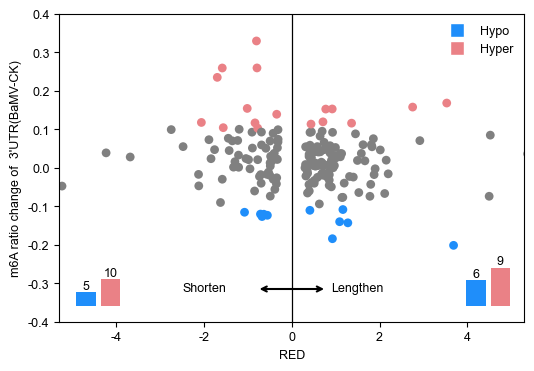

In [79]:
fig,ax = plt.subplots(figsize=(6,4))
sns.scatterplot(x=plot_dat['RED'],y=plot_dat['ratio_change'],hue=plot_dat['color'],palette=['grey','#ea8186','#1f8efa'],s=40,ax=ax,edgecolor='none')
plt.axvline(0,color='black',linestyle='-',linewidth=.9)
ax.set_xlim(-5.3,5.3)
ax.set_ylim(-0.4,0.4)

# gene_show=['evm.model.ORIGINAL_2088.64','evm.model.ORIGINAL_1673.359','evm.model.FRAGSCAFF_424.51','evm.model.ORIGINAL_3933.64']
# positions=[]
# for gene in gene_show:
#     x=plot_dat.loc[gene]['RED']
#     y=plot_dat.loc[gene]['log2fc']
#     positions.append((x,y))
# texts=[]
# texts_t=[]

# for gene,pos in zip(gene_show,positions):
#     text=plt.text(pos[0],pos[1],gene,fontsize=9,ha='right', va='bottom')
#     texts.append(text)
#     texts_t.append((pos[0],pos[1],text))
# adjust_text(texts,force_text=.5,force_points=4,arrowprops=dict(arrowstyle="->", color='black', lw=1),only_move={'text':'y'})

insert_ax1=fig.add_axes([0.8,0.15,0.08,0.1]) # l, b, w, h
a,b=len(plot_dat[(plot_dat['type'] =='distal') & (plot_dat['ratio_label']=='hypo')]),len(plot_dat[(plot_dat['type'] == 'distal') & (plot_dat['ratio_label']=='hyper')])
insert_bar1=insert_ax1.bar(['Hyper','Hypo'],[a,b],color=['#1f8efa','#ea8186'])
for bar in insert_bar1:
    height=bar.get_height()
    insert_ax1.text(bar.get_x()+bar.get_width()/2,height,f'{height}',ha='center',va='bottom')
insert_ax1.spines['top'].set_visible(False)
insert_ax1.spines['left'].set_visible(False)  
insert_ax1.spines['right'].set_visible(False)  
insert_ax1.spines['bottom'].set_visible(False)  
insert_ax1.tick_params(axis='x',bottom=False)
insert_ax1.tick_params(axis='y',bottom=False)
insert_ax1.set_yticks([])
insert_ax1.set_xticks([])

insert_ax2=fig.add_axes([0.15,0.15,0.08,0.07]) # l, b, w, h
a,b=len(plot_dat[(plot_dat['type'] =='proximal') & (plot_dat['ratio_label']=='hypo')].gene_name.unique()),len(plot_dat[(plot_dat['type'] == 'proximal') & (plot_dat['ratio_label']=='hyper')].gene_name.unique())
insert_bar2=insert_ax2.bar(['Hyper','Hypo'],[a,b],color=['#1f8efa','#ea8186'])
for bar in insert_bar2:
    height=bar.get_height()
    insert_ax2.text(bar.get_x()+bar.get_width()/2,height,f'{height}',ha='center',va='bottom')
insert_ax2.spines['top'].set_visible(False)
insert_ax2.spines['left'].set_visible(False)  
insert_ax2.spines['right'].set_visible(False)  
insert_ax2.spines['bottom'].set_visible(False)  
insert_ax2.tick_params(axis='x',bottom=False)
insert_ax2.tick_params(axis='y',bottom=False)
insert_ax2.set_yticks([])
insert_ax2.set_xticks([])
custom_legend_elements=[
Line2D([0],[0],marker='s',color='w',markerfacecolor='#1f8efa',markersize=10,label='Hypo'),
Line2D([0],[0],marker='s',color='w',markerfacecolor='#ea8186',markersize=10,label='Hyper'),
]
ax.legend(handles=custom_legend_elements, loc='upper right', fontsize='medium', frameon=False)

ax.text(-2.5,-.32,'Shorten')
ax.text(0.9,-.32,'Lengthen')
ax.annotate('',xy=(-0.8,-.315),xytext=(0.8,-.315),
            arrowprops=dict(arrowstyle='<->',color='black',lw=1.5))
ax.set_xlabel('RED')
ax.set_ylabel("m6A ratio change of  3'UTR(BaMV-CK)")

plt.savefig(fp+'m6A_RED.pdf', bbox_inches="tight",transparent=True)

In [25]:
plot_dat_go

,index,bm_ratio,ck_ratio,type,RED,ratio_change,ratio_label,color,gene_id,go_term,des
0,NaN,0.173822,0.193591,proximal,-0.500525,-0.019769,stable,grey,evm.model.FRAGSCAFF_108.169,NaN,NaN
1,NaN,0.615385,0.356204,proximal,-0.793549,0.259181,hyper,red,evm.model.FRAGSCAFF_112.16,NaN,NaN
2,NaN,0.233333,0.218879,distal,0.674532,0.014454,stable,grey,evm.model.FRAGSCAFF_123.190,NaN,NaN
3,7504.0,0.497826,0.520458,proximal,-0.736966,-0.022632,stable,grey,evm.model.FRAGSCAFF_128.389,GO:0005515,protein binding
4,50206.0,0.497826,0.520458,proximal,-0.736966,-0.022632,stable,grey,evm.model.FRAGSCAFF_128.389,GO:0061608,nuclear import signal receptor activity
...,...,...,...,...,...,...,...,...,...,...,...
224,39020.0,0.376335,0.343599,proximal,-1.214739,0.032736,stable,grey,evm.model.ORIGINAL_821.499,GO:0003677,DNA binding
225,36382.0,0.386342,0.428177,proximal,-0.350497,-0.041835,stable,grey,evm.model.ORIGINAL_821.503,GO:0008168,methyltransferase activity
226,57731.0,0.459528,0.533722,distal,1.781058,-0.074194,stable,grey,evm.model.ORIGINAL_951.31,GO:0015078,proton transmembrane transporter activity
227,68003.0,0.432713,0.332875,proximal,-1.199309,0.099837,stable,grey,evm.model.ORIGINAL_979.131,GO:0015297,antiporter activity


In [20]:
plot_dat_go=plot_dat.merge(ma_gene_go_des_MF,left_index=True,right_on='gene_id',how='left').reset_index()

In [23]:
ma_gene_go_des_BP

,gene_id,go_term,des
0,evm.model.FRAGSCAFF_22.352,GO:0005992,trehalose biosynthetic process
1,evm.model.FRAGSCAFF_95.45,GO:0005992,trehalose biosynthetic process
2,evm.model.FRAGSCAFF_84.234,GO:0005992,trehalose biosynthetic process
3,evm.model.ORIGINAL_2114.154,GO:0005992,trehalose biosynthetic process
4,evm.model.FRAGSCAFF_343.126,GO:0005992,trehalose biosynthetic process
...,...,...,...
47852,evm.model.FRAGSCAFF_212.152_evm.model.FRAGSCAF...,GO:0051103,DNA ligation involved in DNA repair
47853,evm.model.FRAGSCAFF_190.805_evm.model.FRAGSCAF...,GO:0051103,DNA ligation involved in DNA repair
47854,evm.model.ORIGINAL_4003.26,GO:0016197,endosomal transport
47855,evm.model.ORIGINAL_1671.40,GO:0016197,endosomal transport


In [28]:
plot_dat_go2=plot_dat_go.merge(ma_gene_go_des_BP,left_on='gene_id',right_on='gene_id',how='left')

In [29]:
plot_dat_go2.to_csv('/home/qq/work/lxr/DRS/script_plot/bamv/DEAPA_DEUTR3_median_ratio.csv',index=False)

In [84]:
dla_pas_bm_rpm=pd.read_csv('/home/qq/work/lxr/DRS/script_plot/bamv/dla_pas_bm_rpm.csv')
dla_pas_ck_rpm=pd.read_csv('/home/qq/work/lxr/DRS/script_plot/bamv/dla_pas_ck_rpm.csv')

In [87]:
dla_pas_bm_ck['bm_log2M/m']=np.log2(dla_pas_bm_ck["bm_dpas_rpm"] / dla_pas_bm_ck["bm_ppas_rpm"])
dla_pas_bm_ck['ck_log2M/m']=np.log2(dla_pas_bm_ck["ck_dpas_rpm"] / dla_pas_bm_ck["ck_ppas_rpm"])

In [91]:
dla_pas_bm_ck[dla_pas_bm_ck['gene_name']=='evm.model.ORIGINAL_4665.157']

,gene_name,scaffold_x,strand_x,ppas_x,ppas_count_x,bm_ppas_rpm,dpas_x,dpas_count_x,bm_dpas_rpm,autr_x,...,dpas_count_y,ck_dpas_rpm,autr_y,ppas_log_ratio,dpas_log_ratio,type,RED,utr_delta,bm_log2M/m,ck_log2M/m
320,evm.model.ORIGINAL_4665.157,chr1.1,+,64279876,43,81.598418,64279977,5,9.488188,101,...,33,62.622042,130,-0.661198,-2.722466,proximal,-2.061268,29,-3.104337,-1.043069


## 07 Poly(A) tail length

In [9]:
pal_fp='/home/qq/work/lxr/DRS/script_plot/bamv/PAL/'

### 1. PAL distribution

In [15]:
bamv_polya_length_tsv = pd.read_csv(
    "/home/qq/work/lxr/DRS/run_DRS_bamv/05_polya_tail/bamv_polya_results_pass.tsv", sep="\t"
)
ck_polya_length_tsv = pd.read_csv(
    "/home/qq/work/lxr/DRS/run_DRS_ck/05_polya_tail/ck_polya_results_pass.tsv", sep="\t"
)
bamv_featureCount_tsv = pd.read_csv(
    "/home/qq/work/lxr/DRS/run_DRS_bamv/06_featureCounts_new/bamv_genome_correct_2308.sorted.bam.featureCounts",
    sep="\t",
    names=["featurecounts_readnames", "status", "n", "geneid"],
)
ck_featureCount_tsv = pd.read_csv(
    "/home/qq/work/lxr/DRS/run_DRS_ck/06_featureCounts_new/ck_genome_correct_2308.sorted.bam.featureCounts",
    sep="\t",
    names=["featurecounts_readnames", "status", "n", "geneid"],
)

In [ ]:
pal_fp='/home/qq/work/lxr/DRS/script_plot/bamv/PAL/'
b=ck_featureCount_tsv[ck_featureCount_tsv['status']=='Assigned']
# b=bamv_featureCount_tsv
a=ck_polya_length_tsv[['readname','polya_length','qc_tag']].merge(b[['featurecounts_readnames','geneid']],how='right',left_on='readname',right_on='featurecounts_readnames')
a.to_csv(pal_fp+'ck_polya_featurecount_inte.csv',index=False)
c=a.groupby('geneid').agg({'readname':'count'})
d=a.groupby('geneid').agg({'featurecounts_readnames':'count'})
e=a.dropna().groupby('geneid').agg({'polya_length':'median'}).rename(columns={'polya_length':'median_length'})
f=a.dropna().groupby('geneid').agg({'polya_length':'mean'})
g=pd.concat([f,e,c,d],axis=1).dropna()
g=pd.concat([f,e,c,d],axis=1).dropna().rename(columns={'polya_length':'mean_length','readname':'polya_reads_num','featurecounts_readnames':'count'})
g['geneid']=g.index
g.to_csv(pal_fp+'ck_median_pal.csv',index=False)
g=g[g['polya_reads_num'] >=3]
g['gene_id']=g['geneid'].apply(get_transcript)
g.to_csv(pal_fp+'ck_gene_median_mean_polya_length.csv',index=False)


In [20]:
pal_fp='/home/qq/work/lxr/DRS/script_plot/bamv/PAL/'
b=bamv_featureCount_tsv[bamv_featureCount_tsv['status']=='Assigned']
# b=bamv_featureCount_tsv
a=bamv_polya_length_tsv[['readname','polya_length','qc_tag']].merge(b[['featurecounts_readnames','geneid']],how='right',left_on='readname',right_on='featurecounts_readnames')
a.to_csv(pal_fp+'bamv_polya_featurecount_inte.csv',index=False)
c=a.groupby('geneid').agg({'readname':'count'})
d=a.groupby('geneid').agg({'featurecounts_readnames':'count'})
e=a.dropna().groupby('geneid').agg({'polya_length':'median'}).rename(columns={'polya_length':'median_length'})
f=a.dropna().groupby('geneid').agg({'polya_length':'mean'})
g=pd.concat([f,e,c,d],axis=1).dropna()
g=pd.concat([f,e,c,d],axis=1).dropna().rename(columns={'polya_length':'mean_length','readname':'polya_reads_num','featurecounts_readnames':'count'})
g['geneid']=g.index
g.to_csv(pal_fp+'bamv_median_pal.csv',index=False)
g=g[g['polya_reads_num'] >=3]
g['gene_id']=g['geneid'].apply(get_transcript)
g.to_csv(pal_fp+'bm_gene_median_mean_polya_length.csv',index=False)


In [24]:
assign=pd.read_csv('/home/qq/work/lxr/DRS/script_plot/bamv/assign.csv',index_col=0)

In [25]:
assign

,chrom,alen,quality,strand,ref_st,ref_ed,sample,polya_length,qc_tag,Assigned_gene,NAT,Full_length
70fcefa7-e354-4c5b-a1c6-7df0e935c301,chr4.1,3962,60,+,73194,77155,CK,NaN,NaN,evm.TU.FRAGSCAFF_24.8,False,True
cf5933ae-0f1e-4acb-a7d9-655999ae2933,chr4.1,3897,60,+,73241,77137,CK,92.70,PASS,evm.TU.FRAGSCAFF_24.8,False,True
a8c7a7b3-009b-4558-9f89-6640945eb112,chr4.1,3845,60,+,73260,77104,CK,68.08,PASS,evm.TU.FRAGSCAFF_24.8,False,True
067622d6-42eb-4eb1-9d77-478cd4dd43dc,chr4.1,3867,60,+,73264,77130,CK,46.70,PASS,evm.TU.FRAGSCAFF_24.8,False,True
a7b07835-ebba-435d-9d7a-f152237cd817,chr4.1,3988,60,+,73265,77252,CK,52.14,PASS,evm.TU.FRAGSCAFF_24.8,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...
7d24549e-9d26-4fe8-b27c-d872937a7371,chr31.1,507,60,-,28307016,28307522,BaMV,51.21,PASS,evm.TU.FRAGSCAFF_341.6,False,False
5038b4ca-7b8f-4a7d-9ce8-c49837a8234f,chr31.1,335,60,-,28307032,28307366,BaMV,NaN,NaN,evm.TU.FRAGSCAFF_341.6,False,False
5d869a9f-055c-4842-9f59-1ae41c8532d7,chr31.1,1294,60,-,28307045,28308338,BaMV,121.28,PASS,evm.TU.FRAGSCAFF_341.6,False,False
2403219f-a619-41df-a751-958651a6cb3a,chr31.1,707,60,-,28307065,28307771,BaMV,NaN,NaN,evm.TU.FRAGSCAFF_341.6,False,False


In [26]:
bm_gene_median_mean_polya_length=pd.read_csv(pal_fp+"bm_gene_median_mean_polya_length.csv")
ck_gene_median_mean_polya_length=pd.read_csv(pal_fp+"ck_gene_median_mean_polya_length.csv")
bm_gene_median_mean_polya_length=bm_gene_median_mean_polya_length[bm_gene_median_mean_polya_length['count']>5]
ck_gene_median_mean_polya_length=ck_gene_median_mean_polya_length[ck_gene_median_mean_polya_length['count']>5]
bm_gene_median_mean_polya_length['sample']='BaMV'
ck_gene_median_mean_polya_length['sample']='CK'
bm_gene_median_mean_polya_length['Rpm']=bm_gene_median_mean_polya_length['count']* 1000000 / len(assign[assign['sample']=='BaMV'])
ck_gene_median_mean_polya_length['Rpm']=ck_gene_median_mean_polya_length['count']* 1000000 / len(assign[assign['sample']=='BaMV'])
PAL_filter=pd.concat([ck_gene_median_mean_polya_length,bm_gene_median_mean_polya_length])
PAL_filter.to_csv(pal_fp+'PAL_3reads_5gene.csv',index=False)

In [27]:
polya = {}
for sample, samples in assign.groupby("sample"):
    polya[sample] = []
    samples = samples[samples["qc_tag"] == "PASS"]
    for gene, genes in samples.groupby("Assigned_gene"):
        if len(genes) <= 3:
            continue
        polya[sample].append(genes["polya_length"].median())
    print(sample, len(polya[sample]))

BaMV 12316
CK 15711


In [28]:
cl={'CK':'#ed8ba5','BaMV':'#4e66ab'}

density plot

CK 69.97
BaMV 74.49000000000001


/tmp/ipykernel_2067572/1254100967.py:16: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='area'` for the same effect.
  sns.violinplot(data=[polya['CK'],polya['BaMV']],ax=ax_inset,orient="v",
/tmp/ipykernel_2067572/1254100967.py:22: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_inset.set_xticklabels(labels=['CK','BaMV'],fontsize=8)
/tmp/ipykernel_2067572/1254100967.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_inset.set_yticklabels(ax_inset.get_yticklabels(),fontsize=3)


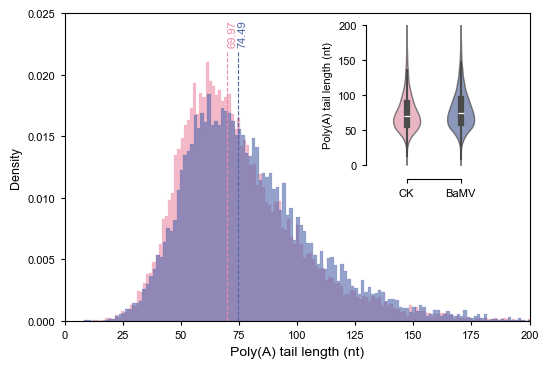

In [29]:
fig, ax = plt.subplots(1, figsize=(6,4))
for sample in ["CK",'BaMV']:
    values = polya[sample]
    sns.histplot(values, label=f"{sample} genes: {len(values)}", color=cl[sample], lw=.1,fill=True,alpha=0.6,
    element="step", bins=200, stat="density", line_kws={"linewidth":0})
for sample in ["CK",'BaMV']:
    values = polya[sample]
    med_num = np.median(values)
    print(sample, med_num)
    ax.plot([med_num, med_num], [0, 0.022], color=cl[sample], linewidth=.8, ls="--")
    ax.text(med_num, 0.0224, s=f"{round(med_num, 2)}", rotation=90, fontsize=8, color=cl[sample])
#ax.legend(frameon=False)
ax.set_xlim(0,200)
ax.set_ylim(0,0.025)
ax_inset = fig.add_axes([0.65, 0.5, 0.18, 0.35])
sns.violinplot(data=[polya['CK'],polya['BaMV']],ax=ax_inset,orient="v",
    scale="area",
    palette=cl.values(),
    inner="box",
    width=0.5,linewidth=1,alpha=.7)
ax_inset.set_ylim(0,200)
ax_inset.set_xticklabels(labels=['CK','BaMV'],fontsize=8)
ax_inset.set_yticklabels(ax_inset.get_yticklabels(),fontsize=3)
sns.despine(ax=ax_inset, trim=True, offset=10)
ax_inset.set_ylabel("Poly(A) tail length (nt)", fontsize=8)
ax.set_xlabel("Poly(A) tail length (nt)", fontsize=10)
# 修改主图的刻度字体大小
ax.tick_params(axis='both', which='major', labelsize=8,length=3)
ax_inset.tick_params(axis='both', which='major', labelsize=8,length=3)
plt.savefig(pal_fp+"Gene poly(A) Distribution.pdf", bbox_inches="tight")

In [38]:
PAL_3reads_5gene=pd.read_csv(pal_fp+"PAL_3reads_5gene.csv")

In [39]:
PAL_long=PAL_3reads_5gene.pivot(columns='sample',values='median_length',index='geneid').dropna()

In [43]:
pearsonr(PAL_long['CK'],PAL_long['BaMV'])

PearsonRResult(statistic=0.45576712440986616, pvalue=0.0)

### 2. PR gene PAL

In [4]:
pal_fp='/home/qq/work/lxr/DRS/script_plot/bamv/PAL/'
# 'F:\\project\\DRS\\result\\geneset\\PR\\rice_PR\\test\\PR_dla_result.csv'
PR_dla_result=pd.read_csv(pal_fp+'PR_dla_result.csv',index_col=0)

In [69]:
PR_dla_result

,PR,short_name,pfam,gene_name,gene_id
evm.model.ORIGINAL_981.78,PR-1,CAP,pfam00188,evm.model.ORIGINAL_981.78,evm.TU.ORIGINAL_981.78
evm.model.FRAGSCAFF_387.567,PR-1,CAP,pfam00188,evm.model.FRAGSCAFF_387.567,evm.TU.FRAGSCAFF_387.567
evm.model.FRAGSCAFF_426.25,PR-1,CAP,pfam00188,evm.model.FRAGSCAFF_426.25,evm.TU.FRAGSCAFF_426.25
evm.model.ORIGINAL_981.81,PR-1,CAP,pfam00188,evm.model.ORIGINAL_981.81,evm.TU.ORIGINAL_981.81
evm.model.ORIGINAL_3918.138,PR-1,CAP,pfam00188,evm.model.ORIGINAL_3918.138,evm.TU.ORIGINAL_3918.138
...,...,...,...,...,...
evm.model.FRAGSCAFF_346.31,PR-15/16,Cupin_1,pfam00190,evm.model.FRAGSCAFF_346.31,evm.TU.FRAGSCAFF_346.31
evm.model.FRAGSCAFF_366.24,PR-15/16,Cupin_1,pfam00190,evm.model.FRAGSCAFF_366.24,evm.TU.FRAGSCAFF_366.24
evm.model.FRAGSCAFF_132.474,PR-15/16,Cupin_1,pfam00190,evm.model.FRAGSCAFF_132.474,evm.TU.FRAGSCAFF_132.474
evm.model.ORIGINAL_6124.146,PR-17,BSP,pfam04450,evm.model.ORIGINAL_6124.146,evm.TU.ORIGINAL_6124.146


In [81]:
plot_dat=pd.DataFrame(PR_dla_result.PR.value_counts()).reset_index().sort_values(by='count')

In [82]:
plot_dat

,PR,count
11,PR-17,2
10,PR-2,4
9,PR-7,7
8,PR-12,12
7,PR-4,14
6,PR-8,17
5,PR-14,18
4,PR-6,23
3,PR-1,28
2,PR-5,43


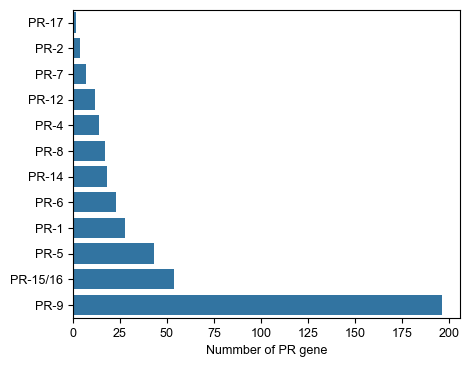

In [83]:
fig = plt.figure(figsize=(5, 4))
sns.barplot(y=plot_dat.PR,x=plot_dat['count'])
plt.ylabel('')
plt.xlabel('Nummber of PR gene')
#sns.despine()
plt.savefig(pal_fp+'number of PR gene.pdf',format='pdf', dpi=600, bbox_inches='tight',transparent = True)

In [9]:
gene_list=pd.read_csv("/home/qq/work/lxr/DRS/script_plot/bamv/gene_list_2.txt",sep='\t',usecols=[0,1,2,3,4,5,6])
bm_gene_median_mean_polya_length = pd.read_csv(pal_fp+"bm_gene_median_mean_polya_length.csv")
ck_gene_median_mean_polya_length = pd.read_csv(pal_fp+"ck_gene_median_mean_polya_length.csv")

In [10]:
all_gene_median_ratio=pd.read_csv(pal_fp+"all_gene_median_ratio_2.csv",sep='\t')

In [11]:
bm_gene_median_mean_polya_length = bm_gene_median_mean_polya_length.rename(columns={'median_length':'bm_median_length','gene_id':'gene_name'})
ck_gene_median_mean_polya_length = ck_gene_median_mean_polya_length.rename(columns={'median_length':'ck_median_length','gene_id':'gene_name'})

In [119]:
PR_dla_rna

,PR,short_name,pfam,gene_name,gene_id,bm_median_length,ck_median_length,log2FoldChange,BaMV_1_TPM,BaMV_2_TPM,...,fc,bamv_rep1(Normalized),bamv_rep2(Normalized),bamv_rep3(Normalized),ck_rep1(Normalized),ck_rep2(Normalized),ck_rep3(Normalized),log2fc,bamv_pro(Normalized),ck_pro(Normalized)
0,PR-1,CAP,pfam00188,evm.model.ORIGINAL_981.78,evm.TU.ORIGINAL_981.78,67.750,NaN,1.916668,10.819888,19.887540,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,PR-1,CAP,pfam00188,evm.model.FRAGSCAFF_387.567,evm.TU.FRAGSCAFF_387.567,NaN,NaN,3.680878,0.920573,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,PR-1,CAP,pfam00188,evm.model.FRAGSCAFF_426.25,evm.TU.FRAGSCAFF_426.25,NaN,NaN,1.635909,1.307369,1.762211,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,PR-1,CAP,pfam00188,evm.model.ORIGINAL_981.81,evm.TU.ORIGINAL_981.81,60.140,44.975,0.175818,67.457161,186.766791,...,0.869697,415.8,533.9,457.8,446.4,429.1,429.8,0.108754,469.166667,435.100000
4,PR-1,CAP,pfam00188,evm.model.ORIGINAL_3918.138,evm.TU.ORIGINAL_3918.138,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
413,PR-15/16,Cupin_1,pfam00190,evm.model.FRAGSCAFF_346.31,evm.TU.FRAGSCAFF_346.31,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
414,PR-15/16,Cupin_1,pfam00190,evm.model.FRAGSCAFF_366.24,evm.TU.FRAGSCAFF_366.24,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
415,PR-15/16,Cupin_1,pfam00190,evm.model.FRAGSCAFF_132.474,evm.TU.FRAGSCAFF_132.474,45.215,53.930,-0.345202,53.679672,37.320037,...,NaN,12539.3,13888.2,11867.4,10371.2,10681.4,10873.4,0.262420,12764.966667,10642.000000
416,PR-17,BSP,pfam04450,evm.model.ORIGINAL_6124.146,evm.TU.ORIGINAL_6124.146,57.400,47.800,2.586604,116.542581,122.347766,...,0.908525,19068.7,21362.8,12442.2,5554.4,4542.1,4918.4,1.816155,17624.566667,5004.966667


In [12]:
PR_dla_rna=PR_dla_result.merge(bm_gene_median_mean_polya_length[['bm_median_length','gene_name']],how='left')
PR_dla_rna=PR_dla_rna.merge(ck_gene_median_mean_polya_length[['ck_median_length','gene_name']],how='left')

In [99]:
deseq2_bamv_ck_res

,Row.names,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,Dla-BaMV-1_L1_150A50,Dla-BaMV-2_L2_152A52,Dla-BaMV-3_L2_153A53,...,gene_id,gene_name,BaMV_1_TPM,BaMV_2_TPM,BaMV_3_TPM,CK_1_TPM,CK_2_TPM,CK_3_TPM,BaMV_TPM,CK_TPM
0,evm.TU.ORIGINAL_4567.71,5140.934179,5.643929,0.275470,20.488390,2.730000e-93,9.500000e-89,2673,2929,2468,...,evm.TU.ORIGINAL_4567.71,evm.model.ORIGINAL_4567.71,1028.500381,1519.093835,569.451527,17.674054,15.856590,15.571672,1039.015248,16.367439
1,evm.TU.FRAGSCAFF_182.98,1672.549351,4.522568,0.233399,19.376968,1.210000e-83,2.100000e-79,856,871,901,...,evm.TU.FRAGSCAFF_182.98,evm.model.FRAGSCAFF_182.98,396.154106,543.335752,250.046797,14.699932,13.084232,13.023034,396.512218,13.602399
2,evm.TU.FRAGSCAFF_279.183,266.848970,4.163525,0.216070,19.269368,9.710000e-83,1.130000e-78,119,122,199,...,evm.TU.FRAGSCAFF_279.183,evm.model.FRAGSCAFF_279.183,34.540388,47.730921,34.636934,2.213366,1.510086,1.457495,38.969414,1.726982
3,evm.TU.ORIGINAL_6592.105,332.216010,6.046171,0.327610,18.455365,4.720000e-76,4.100000e-72,194,160,191,...,evm.TU.ORIGINAL_6592.105,evm.model.ORIGINAL_6592.105,264.753630,294.320090,156.307447,2.048564,1.961857,4.410206,238.460389,2.806876
4,evm.TU.FRAGSCAFF_230.829,182.662554,4.460126,0.254662,17.513925,1.120000e-68,7.800000e-65,101,86,105,...,evm.TU.FRAGSCAFF_230.829,evm.model.FRAGSCAFF_230.829,44.534524,51.113265,27.763285,1.694434,1.237562,1.446854,41.137024,1.459617
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50393,evm.TU.FRAGSCAFF_125.59,0.057366,2.694235,4.080473,0.660275,5.090772e-01,NaN,0,0,0,...,evm.TU.FRAGSCAFF_125.59,evm.model.FRAGSCAFF_125.59,0.000000,0.000000,0.000000,0.000000,0.247676,0.000000,0.000000,0.082559
50394,evm.TU.FRAGSCAFF_125.45,0.492316,2.722976,2.712009,1.004044,3.153574e-01,NaN,0,0,1,...,evm.TU.FRAGSCAFF_125.45,evm.model.FRAGSCAFF_125.45,0.000000,0.000000,1.008578,0.000000,0.115136,0.083620,0.336193,0.066252
50395,evm.TU.FRAGSCAFF_125.36,0.186876,0.794069,3.432446,0.231342,8.170491e-01,NaN,0,0,0,...,evm.TU.FRAGSCAFF_125.36,evm.model.FRAGSCAFF_125.36,0.000000,0.000000,0.000000,0.074089,0.042234,0.030673,0.000000,0.048999
50396,evm.TU.FRAGSCAFF_224.6,0.122719,1.380579,4.006246,0.344607,7.303902e-01,NaN,0,0,0,...,evm.TU.FRAGSCAFF_224.6,evm.model.FRAGSCAFF_224.6,0.000000,0.000000,0.000000,0.067692,0.000000,0.112099,0.000000,0.059930


In [ ]:
PR_dla_rna = PR_dla_rna.merge(deseq2_bamv_ck_res[['log2FoldChange','gene_name','BaMV_1_TPM','BaMV_2_TPM','BaMV_3_TPM','CK_1_TPM','CK_2_TPM','CK_3_TPM','BaMV_TPM','CK_TPM']],how='left')

In [104]:
PR_dla_rna = PR_dla_rna.merge(all_gene_median_ratio[['gene_name','bm_median_ratio','ck_median_ratio','fc']],how='left')
PR_dla_rna = PR_dla_rna.merge(pro_abundance.iloc[:,0:7],right_index=True,left_on='gene_name',how='left')

In [105]:
PR_dla_rna['bamv_pro(Normalized)']=PR_dla_rna[['bamv_rep1(Normalized)','bamv_rep2(Normalized)','bamv_rep3(Normalized)']].apply('mean',axis=1)
PR_dla_rna['ck_pro(Normalized)']=PR_dla_rna[['ck_rep1(Normalized)','ck_rep2(Normalized)','ck_rep3(Normalized)']].apply('mean',axis=1)

In [106]:
PR_dla_rna.to_csv(pal_fp+'PR_dla_rna.csv',index=False)

In [5]:
PR_dla_rna=pd.read_csv(pal_fp+'PR_dla_rna.csv')

In [6]:
dat=PR_dla_rna

In [14]:
labels=dat.PR.unique()

In [109]:
labels

array(['PR-1', 'PR-2', 'PR-4', 'PR-5', 'PR-6', 'PR-7', 'PR-8', 'PR-9',
       'PR-12', 'PR-14', 'PR-15/16', 'PR-17'], dtype=object)

In [21]:
plot_dat2=dat[['PR','gene_name','bm_median_length','ck_median_length']]
plot_dat2=plot_dat2.melt(id_vars=['PR','gene_name'], value_vars=['bm_median_length','ck_median_length'])

In [46]:
PR_dla_rna[(PR_dla_rna['PR']=='PR-1') & ~(PR_dla_rna['bm_median_length'].isna() & PR_dla_rna['ck_median_length'].isna())]

,PR,short_name,pfam,gene_name,gene_id,bm_median_length,ck_median_length
0,PR-1,CAP,pfam00188,evm.model.ORIGINAL_981.78,evm.TU.ORIGINAL_981.78,67.750,NaN
3,PR-1,CAP,pfam00188,evm.model.ORIGINAL_981.81,evm.TU.ORIGINAL_981.81,60.140,44.975
10,PR-1,CAP,pfam00188,evm.model.ORIGINAL_2084.95,evm.TU.ORIGINAL_2084.95,56.595,43.580
15,PR-1,CAP,pfam00188,evm.model.ORIGINAL_1999.136,evm.TU.ORIGINAL_1999.136,61.245,73.115


In [43]:
a

1     0.0
2     0.0
4     0.0
5     0.0
6     0.0
7     0.0
8     0.0
9     0.0
11    0.0
12    0.0
13    0.0
14    0.0
16    0.0
17    0.0
18    0.0
19    0.0
20    0.0
21    0.0
22    0.0
23    0.0
24    0.0
25    0.0
26    0.0
27    0.0
Name: bm_median_length, dtype: float64

In [36]:
PR_dla_rna

,PR,short_name,pfam,gene_name,gene_id,bm_median_length,ck_median_length
0,PR-1,CAP,pfam00188,evm.model.ORIGINAL_981.78,evm.TU.ORIGINAL_981.78,67.750,NaN
1,PR-1,CAP,pfam00188,evm.model.FRAGSCAFF_387.567,evm.TU.FRAGSCAFF_387.567,NaN,NaN
2,PR-1,CAP,pfam00188,evm.model.FRAGSCAFF_426.25,evm.TU.FRAGSCAFF_426.25,NaN,NaN
3,PR-1,CAP,pfam00188,evm.model.ORIGINAL_981.81,evm.TU.ORIGINAL_981.81,60.140,44.975
4,PR-1,CAP,pfam00188,evm.model.ORIGINAL_3918.138,evm.TU.ORIGINAL_3918.138,NaN,NaN
...,...,...,...,...,...,...,...
413,PR-15/16,Cupin_1,pfam00190,evm.model.FRAGSCAFF_346.31,evm.TU.FRAGSCAFF_346.31,NaN,NaN
414,PR-15/16,Cupin_1,pfam00190,evm.model.FRAGSCAFF_366.24,evm.TU.FRAGSCAFF_366.24,NaN,NaN
415,PR-15/16,Cupin_1,pfam00190,evm.model.FRAGSCAFF_132.474,evm.TU.FRAGSCAFF_132.474,45.215,53.930
416,PR-17,BSP,pfam04450,evm.model.ORIGINAL_6124.146,evm.TU.ORIGINAL_6124.146,57.400,47.800


In [ ]:
a=PR_dla_rna[PR_dla_rna['PR']=='PR-1']['bm_median_length'].fillna(0)
b=PR_dla_rna[PR_dla_rna['PR']=='PR-1']['ck_median_length'].fillna(0)

In [ ]:
a=PR_dla_rna[(PR_dla_rna['PR']=='PR-1') & ~(PR_dla_rna['bm_median_length'].isna() & PR_dla_rna['ck_median_length'].isna())]['bm_median_length'].fillna(0)
b=PR_dla_rna[(PR_dla_rna['PR']=='PR-1') & ~(PR_dla_rna['bm_median_length'].isna() & PR_dla_rna['ck_median_length'].isna())]['ck_median_length'].fillna(0)

In [48]:
pearsonr(a,b)

PearsonRResult(statistic=-0.6704811378033811, pvalue=0.32951886219661874)

In [ ]:
for i in PR_dla_rna.PR.unique():
    a=PR_dla_rna[(PR_dla_rna['PR']==i) & ~(PR_dla_rna['bm_median_length'].isna() & PR_dla_rna['ck_median_length'].isna())]['bm_median_length'].fillna(0)
    b=PR_dla_rna[(PR_dla_rna['PR']==i) & ~(PR_dla_rna['bm_median_length'].isna() & PR_dla_rna['ck_median_length'].isna())]['ck_median_length'].fillna(0)
    print(i,pearsonr(a,b))

plot_dat2['sample'] = plot_dat2['variable'].apply(lambda x: 'BaMV' if 'bm' in x else 'CK')
for sample in ['CK','BaMV']:
    for i in plot_dat2.PR.unique():
        locals()[sample+'_'+i] = plot_dat2[(plot_dat2['sample']==sample) & (plot_dat2['PR']==i)].value.dropna()
plot_dat2['use']=plot_dat2.PR.str.replace('-','_')
plot_dat2['use']=plot_dat2['use'].replace('PR_15/16','PR_15')
labels[-2]='PR_15'

In [113]:
plot_dat2['use']=plot_dat2.PR.str.replace('-','_')

In [114]:
plot_dat2['use']=plot_dat2['use'].replace('PR_15/16','PR_15')

In [115]:
labels[-2]='PR_15'

[-0.6499999999999999, -0.22999999999999995]
[0.35, 0.7699999999999999]
[1.3499999999999999, 1.7699999999999998]
[2.3500000000000005, 2.7700000000000005]
[3.3500000000000005, 3.7700000000000005]
[4.35, 4.77]
[5.35, 5.77]
[6.35, 6.77]
[7.35, 7.77]
[8.35, 8.77]
[9.35, 9.77]
[10.35, 10.77]


/tmp/ipykernel_2069825/57627804.py:69: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(),fontsize=9)


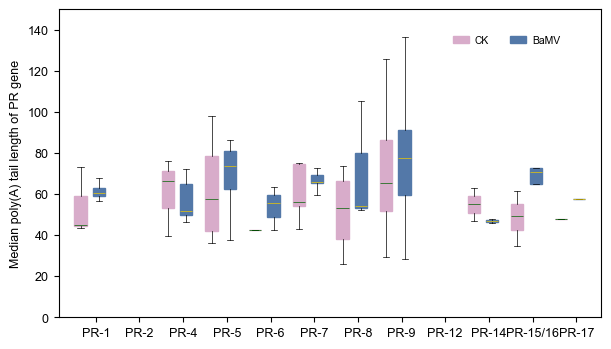

In [120]:
fig,ax=plt.subplots(figsize=(7,4))
for sample in ['CK','BaMV']:
    for i in plot_dat2['use'].unique():
        locals()[sample+'_'+i] = plot_dat2[(plot_dat2['sample']==sample) & (plot_dat2['use']==i)].value.dropna()
colors=["#d8acca","#5378a8"]
# colors_r = ["lightcoral", "lightcoral","dodgerblue","dodgerblue",  "mediumseagreen","mediumseagreen","orange","orange"]
#colors_r = ["#ef87a2","#ef87a2","#4e66ab","#4e66ab"]
colors_r=["#d8acca","#d8acca","#5378a8","#5378a8"]
colors_2 =  ["#006400","#EEC900" ]#"#aba6c6","#d7af83"
label_n=list(plot_dat2['PR'].unique())
labels=plot_dat2['use'].unique()
legend_labels=['CK','BaMV']
group_number=len(legend_labels)
x_loc = np.arange(len(labels))-0.3
total_width = 0.7
box_total_width = total_width * 0.8
interval_total_width = total_width * 0.2
box_width = box_total_width / group_number
###计算所有box的总间隔
if group_number == 1:
    interval_width = interval_total_width
else:
    interval_width = interval_total_width / (group_number - 1)
###计算在x轴起始坐标
if group_number % 2 == 0:
    x1_box = x_loc - (group_number / 2 - 1) * box_width/2 - box_width - (group_number / 2 - 1) * interval_width - interval_width / 2
    
    #x1_box = x_loc - (group_number / 2 - 1) * box_width/2 - (group_number / 2 - 1) * interval_width
else:
    #x轴的两个起始坐标
    x1_box = x_loc - ((group_number - 1)/2) * box_width - ((group_number - 1)/3) * interval_width
#计算每个box左坐标
x_list_box = [x1_box + box_width * i + interval_width * i for i in range(group_number)]

x_list_box_new = []

for i in range(len(legend_labels)):
    for j in range(len(labels)):
        x_list_box_new.append(x_list_box[i][j])
x_list_box_new = sorted(x_list_box_new)

x_list_box_final = []
for i in range(len(labels)):
    #x_list_box_final.append(x_list_box_new[3 * i:3 * (i + 1)])
    x_list_box_final.append(x_list_box_new[2 * i:2 * (i + 1)])

for i,x in zip(labels,np.arange(len(labels))):
    df_ck=eval('CK'+'_'+i)
    df_bamv=eval('BaMV'+'_'+i)
    print(x_list_box_final[int(x)])
    locals()['bplot'+str(x)]=plt.boxplot([df_ck,df_bamv],labels=legend_labels,patch_artist=True,positions=x_list_box_final[int(x)],widths=box_width,showfliers=False)
    bplot=eval('bplot'+str(x))
    for patch, color in zip(bplot["medians"], colors_2):
        patch.set_color(color)
        patch.set_linewidth(0.5)
    for patch, color in zip(bplot["boxes"], colors):
        patch.set_linewidth(1)
        patch.set_color(color)
    for patch, color in zip(bplot["whiskers"], colors_r):
        patch.set_linewidth(0.5)
    for patch, color in zip(bplot["caps"], colors_r):
        patch.set_linewidth(0.5)

ax.grid(True, ls=':', color='b', alpha=0.0)
ax.set_xticks(x_loc)
ax.set_ylim(0,150)
#ax.set_xticklabels([label_n.get(str(label)) for label in labels])
ax.set_xticklabels([label_n[y] for y in np.arange(len(labels))],fontsize=9)
ax.set_yticklabels(ax.get_yticklabels(),fontsize=9)
ax.set_ylabel('Median poly(A) tail length of PR gene')
# plt.show
# ax = plt.gca()
# ax.spines['top'].set_color('none')
# ax.spines['right'].set_color('none')
# adjust_spines(ax, ['left', 'bottom'])
plt.legend(handles=bplot11['boxes'], loc='center left', bbox_to_anchor=(0.7, 0.9),
           facecolor='None', frameon=False, ncol=2, markerscale=2, borderaxespad=1,
           handletextpad=0.6, fontsize='small', labels=legend_labels,handlelength=1.5)
plt.savefig(pal_fp+'PR_gene_median_PAL_2.pdf',bbox_inches='tight',transparent=True,dpi=600)

In [132]:
plot_dat2=dat[['PR','gene_name','bm_median_ratio','ck_median_ratio']]
plot_dat2=plot_dat2.melt(id_vars=['PR','gene_name'], value_vars=['bm_median_ratio','ck_median_ratio'])

In [133]:
plot_dat2['sample'] = plot_dat2['variable'].apply(lambda x: 'BaMV' if 'bm' in x else 'CK')
for sample in ['CK','BaMV']:
    for i in plot_dat2.PR.unique():
        locals()[sample+'_'+i] = plot_dat2[(plot_dat2['sample']==sample) & (plot_dat2['PR']==i)].value.dropna()
plot_dat2['use']=plot_dat2.PR.str.replace('-','_')
plot_dat2['use']=plot_dat2['use'].replace('PR_15/16','PR_15')
labels[-2]='PR_15'

[-0.6499999999999999, -0.22999999999999995]
[0.35, 0.7699999999999999]
[1.3499999999999999, 1.7699999999999998]
[2.3500000000000005, 2.7700000000000005]
[3.3500000000000005, 3.7700000000000005]
[4.35, 4.77]
[5.35, 5.77]
[6.35, 6.77]
[7.35, 7.77]
[8.35, 8.77]
[9.35, 9.77]
[10.35, 10.77]


/tmp/ipykernel_2069825/1095945405.py:69: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(),fontsize=9)


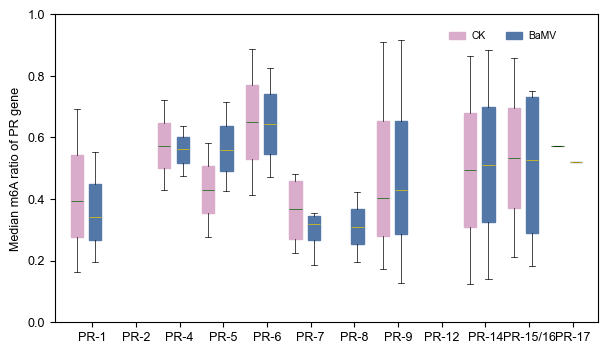

In [135]:
fig,ax=plt.subplots(figsize=(7,4))
for sample in ['CK','BaMV']:
    for i in plot_dat2['use'].unique():
        locals()[sample+'_'+i] = plot_dat2[(plot_dat2['sample']==sample) & (plot_dat2['use']==i)].value.dropna()
colors=["#d8acca","#5378a8"]
# colors_r = ["lightcoral", "lightcoral","dodgerblue","dodgerblue",  "mediumseagreen","mediumseagreen","orange","orange"]
#colors_r = ["#ef87a2","#ef87a2","#4e66ab","#4e66ab"]
colors_r=["#d8acca","#d8acca","#5378a8","#5378a8"]
colors_2 =  ["#006400","#EEC900"]
label_n=list(plot_dat2['PR'].unique())
labels=plot_dat2['use'].unique()
legend_labels=['CK','BaMV']
group_number=len(legend_labels)
x_loc = np.arange(len(labels))-0.3
total_width = 0.7
box_total_width = total_width * 0.8
interval_total_width = total_width * 0.2
box_width = box_total_width / group_number
###计算所有box的总间隔
if group_number == 1:
    interval_width = interval_total_width
else:
    interval_width = interval_total_width / (group_number - 1)
###计算在x轴起始坐标
if group_number % 2 == 0:
    x1_box = x_loc - (group_number / 2 - 1) * box_width/2 - box_width - (group_number / 2 - 1) * interval_width - interval_width / 2
    
    #x1_box = x_loc - (group_number / 2 - 1) * box_width/2 - (group_number / 2 - 1) * interval_width
else:
    #x轴的两个起始坐标
    x1_box = x_loc - ((group_number - 1)/2) * box_width - ((group_number - 1)/3) * interval_width
#计算每个box左坐标
x_list_box = [x1_box + box_width * i + interval_width * i for i in range(group_number)]

x_list_box_new = []

for i in range(len(legend_labels)):
    for j in range(len(labels)):
        x_list_box_new.append(x_list_box[i][j])
x_list_box_new = sorted(x_list_box_new)

x_list_box_final = []
for i in range(len(labels)):
    #x_list_box_final.append(x_list_box_new[3 * i:3 * (i + 1)])
    x_list_box_final.append(x_list_box_new[2 * i:2 * (i + 1)])

for i,x in zip(labels,np.arange(len(labels))):
    df_ck=eval('CK'+'_'+i)
    df_bamv=eval('BaMV'+'_'+i)
    print(x_list_box_final[int(x)])
    locals()['bplot'+str(x)]=plt.boxplot([df_ck,df_bamv],labels=legend_labels,patch_artist=True,positions=x_list_box_final[int(x)],widths=box_width,showfliers=False)
    bplot=eval('bplot'+str(x))
    for patch, color in zip(bplot["medians"], colors_2):
        patch.set_color(color)
        patch.set_linewidth(0.5)
    for patch, color in zip(bplot["boxes"], colors):
        patch.set_linewidth(1)
        patch.set_color(color)
    for patch, color in zip(bplot["whiskers"], colors_r):
        patch.set_linewidth(0.5)
    for patch, color in zip(bplot["caps"], colors_r):
        patch.set_linewidth(0.5)

ax.grid(True, ls=':', color='b', alpha=0.0)
ax.set_xticks(x_loc)
ax.set_ylim(0,1.0)
#ax.set_xticklabels([label_n.get(str(label)) for label in labels])
ax.set_xticklabels([label_n[y] for y in np.arange(len(labels))],fontsize=9)
ax.set_yticklabels(ax.get_yticklabels(),fontsize=9)
ax.set_ylabel('Median m6A ratio of PR gene')
# plt.show
# ax = plt.gca()
# ax.spines['top'].set_color('none')
# ax.spines['right'].set_color('none')
# adjust_spines(ax, ['left', 'bottom'])
plt.legend(handles=bplot11['boxes'], loc='center left', bbox_to_anchor=(0.7, 0.93),
           facecolor='None', frameon=False, ncol=2, markerscale=2, borderaxespad=1,
           handletextpad=0.6, fontsize='small', labels=legend_labels,handlelength=1.5)
plt.savefig(pal_fp+'PR_gene_median_ratio_2.pdf',dpi=600,bbox_inches='tight',transparent=True)

In [136]:
plot_dat2=dat[['PR','gene_name','CK_TPM','BaMV_TPM']]
plot_dat2=plot_dat2.melt(id_vars=['PR','gene_name'], value_vars=['BaMV_TPM','CK_TPM'])

In [137]:
plot_dat2['sample'] = plot_dat2['variable'].apply(lambda x: 'BaMV' if 'BaMV' in x else 'CK')
for sample in ['CK','BaMV']:
    for i in plot_dat2.PR.unique():
        locals()[sample+'_'+i] = plot_dat2[(plot_dat2['sample']==sample) & (plot_dat2['PR']==i)].value.dropna()
plot_dat2['use']=plot_dat2.PR.str.replace('-','_')
plot_dat2['use']=plot_dat2['use'].replace('PR_15/16','PR_15')
labels[-2]='PR_15'

In [138]:
plot_dat2

,PR,gene_name,variable,value,sample,use
0,PR-1,evm.model.ORIGINAL_981.78,BaMV_TPM,11.612109,BaMV,PR_1
1,PR-1,evm.model.FRAGSCAFF_387.567,BaMV_TPM,0.306858,BaMV,PR_1
2,PR-1,evm.model.FRAGSCAFF_426.25,BaMV_TPM,1.545845,BaMV,PR_1
3,PR-1,evm.model.ORIGINAL_981.81,BaMV_TPM,111.344528,BaMV,PR_1
4,PR-1,evm.model.ORIGINAL_3918.138,BaMV_TPM,NaN,BaMV,PR_1
...,...,...,...,...,...,...
831,PR-15/16,evm.model.FRAGSCAFF_346.31,CK_TPM,NaN,CK,PR_15
832,PR-15/16,evm.model.FRAGSCAFF_366.24,CK_TPM,NaN,CK,PR_15
833,PR-15/16,evm.model.FRAGSCAFF_132.474,CK_TPM,43.834984,CK,PR_15
834,PR-17,evm.model.ORIGINAL_6124.146,CK_TPM,13.122166,CK,PR_17


[-0.6499999999999999, -0.22999999999999995]
[0.35, 0.7699999999999999]
[1.3499999999999999, 1.7699999999999998]
[2.3500000000000005, 2.7700000000000005]
[3.3500000000000005, 3.7700000000000005]
[4.35, 4.77]
[5.35, 5.77]
[6.35, 6.77]
[7.35, 7.77]
[8.35, 8.77]
[9.35, 9.77]
[10.35, 10.77]


/tmp/ipykernel_2069825/2772672418.py:69: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(),fontsize=9)


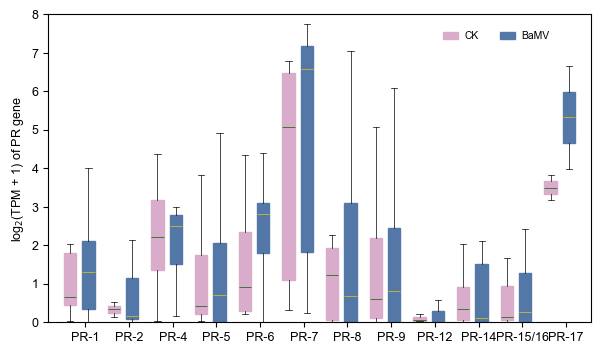

In [139]:
fig,ax=plt.subplots(figsize=(7,4))
for sample in ['CK','BaMV']:
    for i in plot_dat2['use'].unique():
        locals()[sample+'_'+i] = np.log2(plot_dat2[(plot_dat2['sample']==sample) & (plot_dat2['use']==i)].value.dropna()+1)
colors=["#d8acca","#5378a8"]
# colors_r = ["lightcoral", "lightcoral","dodgerblue","dodgerblue",  "mediumseagreen","mediumseagreen","orange","orange"]
#colors_r = ["#ef87a2","#ef87a2","#4e66ab","#4e66ab"]
colors_r=["#d8acca","#d8acca","#5378a8","#5378a8"]
colors_2 =  ["#006400","#EEC900"]
label_n=list(plot_dat2['PR'].unique())
labels=plot_dat2['use'].unique()
legend_labels=['CK','BaMV']
group_number=len(legend_labels)
x_loc = np.arange(len(labels))-0.3
total_width = 0.7
box_total_width = total_width * 0.8
interval_total_width = total_width * 0.2
box_width = box_total_width / group_number
###计算所有box的总间隔
if group_number == 1:
    interval_width = interval_total_width
else:
    interval_width = interval_total_width / (group_number - 1)
###计算在x轴起始坐标
if group_number % 2 == 0:
    x1_box = x_loc - (group_number / 2 - 1) * box_width/2 - box_width - (group_number / 2 - 1) * interval_width - interval_width / 2
    
    #x1_box = x_loc - (group_number / 2 - 1) * box_width/2 - (group_number / 2 - 1) * interval_width
else:
    #x轴的两个起始坐标
    x1_box = x_loc - ((group_number - 1)/2) * box_width - ((group_number - 1)/3) * interval_width
#计算每个box左坐标
x_list_box = [x1_box + box_width * i + interval_width * i for i in range(group_number)]

x_list_box_new = []

for i in range(len(legend_labels)):
    for j in range(len(labels)):
        x_list_box_new.append(x_list_box[i][j])
x_list_box_new = sorted(x_list_box_new)

x_list_box_final = []
for i in range(len(labels)):
    #x_list_box_final.append(x_list_box_new[3 * i:3 * (i + 1)])
    x_list_box_final.append(x_list_box_new[2 * i:2 * (i + 1)])

for i,x in zip(labels,np.arange(len(labels))):
    df_ck=eval('CK'+'_'+i)
    df_bamv=eval('BaMV'+'_'+i)
    print(x_list_box_final[int(x)])
    locals()['bplot'+str(x)]=plt.boxplot([df_ck,df_bamv],labels=legend_labels,patch_artist=True,positions=x_list_box_final[int(x)],widths=box_width,showfliers=False)
    bplot=eval('bplot'+str(x))
    for patch, color in zip(bplot["medians"], colors_2):
        patch.set_color(color)
        patch.set_linewidth(0.5)
    for patch, color in zip(bplot["boxes"], colors):
        patch.set_linewidth(1)
        patch.set_color(color)
    for patch, color in zip(bplot["whiskers"], colors_r):
        patch.set_linewidth(0.5)
    for patch, color in zip(bplot["caps"], colors_r):
        patch.set_linewidth(0.5)

ax.grid(True, ls=':', color='b', alpha=0.0)
ax.set_xticks(x_loc)
ax.set_ylim(0,8)
#ax.set_xticklabels([label_n.get(str(label)) for label in labels])
ax.set_xticklabels([label_n[y] for y in np.arange(len(labels))],fontsize=9)
ax.set_yticklabels(ax.get_yticklabels(),fontsize=9)
ax.set_ylabel('log$_2$(TPM + 1) of PR gene ')
# plt.show
# ax = plt.gca()
# ax.spines['top'].set_color('none')
# ax.spines['right'].set_color('none')
# adjust_spines(ax, ['left', 'bottom'])
plt.legend(handles=bplot11['boxes'], loc='center left', bbox_to_anchor=(0.7, 0.93),
           facecolor='None', frameon=False, ncol=2, markerscale=2, borderaxespad=1,
           handletextpad=0.6, fontsize='small', labels=legend_labels,handlelength=1.5)
plt.savefig(pal_fp+'PR_gene_TPM_2.pdf',bbox_inches='tight',transparent=True)

In [140]:
plot_dat2=dat[['PR','gene_name','ck_pro(Normalized)','bamv_pro(Normalized)']]
plot_dat2=plot_dat2.melt(id_vars=['PR','gene_name'], value_vars=['ck_pro(Normalized)','bamv_pro(Normalized)'])

In [141]:
plot_dat2['sample'] = plot_dat2['variable'].apply(lambda x: 'BaMV' if 'bamv' in x else 'CK')
for sample in ['CK','BaMV']:
    for i in plot_dat2.PR.unique():
        locals()[sample+'_'+i] = plot_dat2[(plot_dat2['sample']==sample) & (plot_dat2['PR']==i)].value.dropna()
plot_dat2['use']=plot_dat2.PR.str.replace('-','_')
plot_dat2['use']=plot_dat2['use'].replace('PR_15/16','PR_15')
labels[-2]='PR_15'

[-0.6499999999999999, -0.22999999999999995]
[0.35, 0.7699999999999999]
[1.3499999999999999, 1.7699999999999998]
[2.3500000000000005, 2.7700000000000005]
[3.3500000000000005, 3.7700000000000005]
[4.35, 4.77]
[5.35, 5.77]
[6.35, 6.77]
[7.35, 7.77]
[8.35, 8.77]
[9.35, 9.77]
[10.35, 10.77]


/tmp/ipykernel_2069825/1142881026.py:69: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(),fontsize=9)


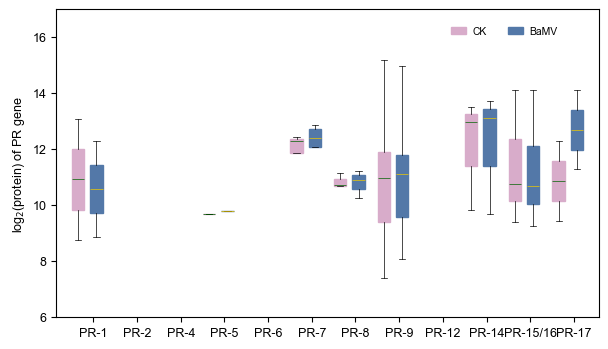

In [142]:
fig,ax=plt.subplots(figsize=(7,4))
for sample in ['CK','BaMV']:
    for i in plot_dat2['use'].unique():
        locals()[sample+'_'+i] = np.log2(plot_dat2[(plot_dat2['sample']==sample) & (plot_dat2['use']==i)].value.dropna()+1)
colors=["#d8acca","#5378a8"]
# colors_r = ["lightcoral", "lightcoral","dodgerblue","dodgerblue",  "mediumseagreen","mediumseagreen","orange","orange"]
#colors_r = ["#ef87a2","#ef87a2","#4e66ab","#4e66ab"]
colors_r=["#d8acca","#d8acca","#5378a8","#5378a8"]
colors_2 =  ["#006400","#EEC900"]
label_n=list(plot_dat2['PR'].unique())
labels=plot_dat2['use'].unique()
legend_labels=['CK','BaMV']
group_number=len(legend_labels)
x_loc = np.arange(len(labels))-0.3
total_width = 0.7
box_total_width = total_width * 0.8
interval_total_width = total_width * 0.2
box_width = box_total_width / group_number
###计算所有box的总间隔
if group_number == 1:
    interval_width = interval_total_width
else:
    interval_width = interval_total_width / (group_number - 1)
###计算在x轴起始坐标
if group_number % 2 == 0:
    x1_box = x_loc - (group_number / 2 - 1) * box_width/2 - box_width - (group_number / 2 - 1) * interval_width - interval_width / 2
    
    #x1_box = x_loc - (group_number / 2 - 1) * box_width/2 - (group_number / 2 - 1) * interval_width
else:
    #x轴的两个起始坐标
    x1_box = x_loc - ((group_number - 1)/2) * box_width - ((group_number - 1)/3) * interval_width
#计算每个box左坐标
x_list_box = [x1_box + box_width * i + interval_width * i for i in range(group_number)]

x_list_box_new = []

for i in range(len(legend_labels)):
    for j in range(len(labels)):
        x_list_box_new.append(x_list_box[i][j])
x_list_box_new = sorted(x_list_box_new)

x_list_box_final = []
for i in range(len(labels)):
    #x_list_box_final.append(x_list_box_new[3 * i:3 * (i + 1)])
    x_list_box_final.append(x_list_box_new[2 * i:2 * (i + 1)])

for i,x in zip(labels,np.arange(len(labels))):
    df_ck=eval('CK'+'_'+i)
    df_bamv=eval('BaMV'+'_'+i)
    print(x_list_box_final[int(x)])
    locals()['bplot'+str(x)]=plt.boxplot([df_ck,df_bamv],labels=legend_labels,patch_artist=True,positions=x_list_box_final[int(x)],widths=box_width,showfliers=False)
    bplot=eval('bplot'+str(x))
    for patch, color in zip(bplot["medians"], colors_2):
        patch.set_color(color)
        patch.set_linewidth(0.5)
    for patch, color in zip(bplot["boxes"], colors):
        patch.set_linewidth(1)
        patch.set_color(color)
    for patch, color in zip(bplot["whiskers"], colors_r):
        patch.set_linewidth(0.5)
    for patch, color in zip(bplot["caps"], colors_r):
        patch.set_linewidth(0.5)

ax.grid(True, ls=':', color='b', alpha=0.0)
ax.set_xticks(x_loc)
ax.set_ylim(6,17)
#ax.set_xticklabels([label_n.get(str(label)) for label in labels])
ax.set_xticklabels([label_n[y] for y in np.arange(len(labels))],fontsize=9)
ax.set_yticklabels(ax.get_yticklabels(),fontsize=9)
ax.set_ylabel('log$_2$(protein) of PR gene ')
# plt.show
# ax = plt.gca()
# ax.spines['top'].set_color('none')
# ax.spines['right'].set_color('none')
# adjust_spines(ax, ['left', 'bottom'])
plt.legend(handles=bplot11['boxes'], loc='center left', bbox_to_anchor=(0.7, 0.93),
           facecolor='None', frameon=False, ncol=2, markerscale=2, borderaxespad=1,
           handletextpad=0.6, fontsize='small', labels=legend_labels,handlelength=1.5)
plt.savefig(pal_fp+'PR_gene_Pro_2.pdf',bbox_inches='tight',transparent=True)

### 3. DEPAL

In [20]:
bm_polya=pd.read_csv(pal_fp+"bamv_polya_featurecount_inte.csv")
ck_polya=pd.read_csv(pal_fp+"ck_polya_featurecount_inte.csv")

In [21]:
bm_polya

,readname,polya_length,qc_tag,featurecounts_readnames,geneid
0,NaN,NaN,NaN,9e7450b2-e809-44c4-814f-7b352354765e,evm.TU.FRAGSCAFF_24.8
1,NaN,NaN,NaN,247b9724-1b8f-4063-a7d5-6cb62fd5d15c,evm.TU.FRAGSCAFF_24.8
2,105a1036-4623-4dbf-8dfe-f51ab3ce5995,66.40,PASS,105a1036-4623-4dbf-8dfe-f51ab3ce5995,evm.TU.FRAGSCAFF_24.8
3,c03ee995-5e92-4fa9-b04b-8727348969c6,167.29,PASS,c03ee995-5e92-4fa9-b04b-8727348969c6,evm.TU.FRAGSCAFF_24.8
4,NaN,NaN,NaN,e0b1e844-27f8-4e11-b9f8-aee5aa4fd912,evm.TU.FRAGSCAFF_24.8
...,...,...,...,...,...
526966,7d24549e-9d26-4fe8-b27c-d872937a7371,51.21,PASS,7d24549e-9d26-4fe8-b27c-d872937a7371,evm.TU.FRAGSCAFF_341.6
526967,NaN,NaN,NaN,5038b4ca-7b8f-4a7d-9ce8-c49837a8234f,evm.TU.FRAGSCAFF_341.6
526968,5d869a9f-055c-4842-9f59-1ae41c8532d7,121.28,PASS,5d869a9f-055c-4842-9f59-1ae41c8532d7,evm.TU.FRAGSCAFF_341.6
526969,NaN,NaN,NaN,2403219f-a619-41df-a751-958651a6cb3a,evm.TU.FRAGSCAFF_341.6


In [24]:
polya =  defaultdict(dict)
rpm = defaultdict(dict)
sample_l={'CK':'ck','BaMV':'bm'}
for sample in sample_l.keys():
    dat=eval(sample_l[sample]+'_polya')
    total=len(dat)
    for gene,temp in dat.groupby('geneid'):
        if len(temp['featurecounts_readnames']) <5 or len(temp["polya_length"].dropna())<3:
            continue
        else:
            polya[sample][gene]=temp["polya_length"].dropna().tolist()
            rpm[sample][gene]=len(temp['featurecounts_readnames']) * 1000000 / total

In [23]:
temp

,readname,polya_length,qc_tag,featurecounts_readnames,geneid
331155,NaN,NaN,NaN,94cd1c94-9b71-41fe-8876-7a78e4ad5aca,evm.TU.ORIGINAL_981.99
331156,1983bb98-dbb8-496f-bd40-22a0e4e33542,90.68,PASS,1983bb98-dbb8-496f-bd40-22a0e4e33542,evm.TU.ORIGINAL_981.99
331157,NaN,NaN,NaN,37be5312-3560-4076-8b68-4d543f3d26e4,evm.TU.ORIGINAL_981.99
331158,12d7d406-7b68-4405-9749-d55ae71b18b5,137.64,PASS,12d7d406-7b68-4405-9749-d55ae71b18b5,evm.TU.ORIGINAL_981.99
331159,NaN,NaN,NaN,a4d8cdb8-d698-49b1-9474-5289fa182b78,evm.TU.ORIGINAL_981.99
331160,fb0e3a35-778d-47ae-be3a-413913e3d396,188.27,PASS,fb0e3a35-778d-47ae-be3a-413913e3d396,evm.TU.ORIGINAL_981.99


In [33]:
sample = "BaMV"
fc = 0.5

overlap = set(polya[sample].keys()) & set(polya["CK"].keys())
box_rpm = {"":[], sample:[]}
diff_polya = defaultdict(dict)
phar = tqdm(total=len(overlap))
for gene in overlap:
    control, compare = polya["CK"][gene], polya[sample][gene]
    s, mwu_p = stats.mannwhitneyu(control, compare, alternative="two-sided")
    s, ks_p = stats.ks_2samp(control, compare, alternative="two-sided")
    diff_polya[gene][f"CK"] = np.median(control)
    diff_polya[gene][f"{sample}"] = np.median(compare)
    diff_polya[gene]["MHU_pvalue"] = mwu_p
    diff_polya[gene]["KS_pvalue"] = ks_p
    diff_polya[gene]["CK_rpm"] = (rpm["CK"][gene])
    diff_polya[gene][f"{sample}_rpm"] = (rpm[sample][gene])
    # diff_polya[gene]["DMSO_full-length"] = cor["DMSO"]["full-length-ratio"].get(gene)
    # diff_polya[gene][f"{sample}_full-length"] =  cor[sample]["full-length-ratio"].get(gene)
    # diff_polya[gene]["DMSO_m6a"] = gene_m6a["DMSO"].get(gene)
    # diff_polya[gene][f"{sample}_m6a"] = gene_m6a[sample].get(gene)
    phar.update(1)
phar.close()

  0%|                                                                                                                                            | 0/12179 [00:00<?, ?it/s]  3%|███▍                                                                                                                             | 323/12179 [00:00<00:29, 404.41it/s]/home/qq/work/systools/miniconda3/envs/rna/lib/python3.10/site-packages/scipy/stats/_axis_nan_policy.py:531: RuntimeWarning: ks_2samp: Exact calculation unsuccessful. Switching to method=asymp.
  res = hypotest_fun_out(*samples, **kwds)
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12179/12179 [00:23<00:00, 520.48it/s]


  3%|███▍                                                                                                                             | 323/12179 [00:00<00:29, 404.41it/s]/home/qq/work/systools/miniconda3/envs/rna/lib/python3.10/site-packages/scipy/stats/_axis_nan_policy.py:531: RuntimeWarning: ks_2samp: Exact calculation unsuccessful. Switching to method=asymp.
  res = hypotest_fun_out(*samples, **kwds)
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12179/12179 [00:23<00:00, 520.48it/s]


In [27]:
diff_polya

,CK,BaMV,MHU_pvalue,KS_pvalue,CK_rpm,BaMV_rpm,log2fc,mark,dPAL
evm.TU.ORIGINAL_6525.58,76.580,73.860,0.535552,0.231115,18.951755,18.976376,-0.052174,None,-2.720
evm.TU.FRAGSCAFF_121.339,82.550,136.760,0.267677,0.328283,9.475877,11.385826,0.728306,None,54.210
evm.TU.ORIGINAL_6248.73,57.825,54.400,0.599510,0.685667,168.196823,223.921240,-0.088087,None,-3.425
evm.TU.ORIGINAL_4683.104,50.090,139.170,0.042424,0.121212,10.660362,11.385826,1.474254,Up,89.080
evm.TU.FRAGSCAFF_127.641,80.460,85.960,0.924136,0.894958,21.320724,11.385826,0.095394,None,5.500
...,...,...,...,...,...,...,...,...,...
evm.TU.ORIGINAL_4560.1,68.120,92.590,0.013797,0.004178,114.895013,79.700780,0.442778,Normal,24.470
evm.TU.FRAGSCAFF_301.437,62.775,77.215,0.163183,0.217985,105.419136,68.314955,0.298691,None,14.440
evm.TU.FRAGSCAFF_373.44,74.000,80.700,0.225838,0.518914,68.700111,56.929129,0.125043,None,6.700
evm.TU.ORIGINAL_5551.157,56.260,58.440,0.952452,0.999608,36.719025,28.464564,0.054847,None,2.180


In [ ]:
sample='BaMV'
def mark_diff_pal(df, test="MHU_pvalue", fc=np.log2(1.5)):
    if df[test] > 0.05:
        return "None"
    if df["log2fc"] > fc:
        return "Up"
    elif df["log2fc"] < -fc:
        return "Down"
    else:
        return "Normal"


diff_polya = pd.DataFrame.from_dict(diff_polya, orient="index")
diff_polya["log2fc"] = np.log2(diff_polya['BaMV'] / diff_polya["CK"])
diff_polya["mark"] = diff_polya.apply(mark_diff_pal, axis=1)
diff_polya['dPAL'] = diff_polya['BaMV'] - diff_polya['CK']
diff_polya.to_csv(pal_fp+'mwu_pv/'+f"Differential PAL in {sample}.csv")

In [36]:
diff_polya[diff_polya['mark'].isin(['Up','Down'])].mark.value_counts()

mark
Up      312
Down    123
Name: count, dtype: int64

In [62]:
diff_polya

,CK,BaMV,MHU_pvalue,KS_pvalue,CK_rpm,BaMV_rpm,log2fc,mark,dPAL
evm.TU.FRAGSCAFF_366.121,62.530,84.140,0.669384,0.511141,28.427632,36.055115,0.428243,None,21.610
evm.TU.FRAGSCAFF_50.77,67.310,57.580,0.943279,0.916084,24.874178,18.976376,-0.225253,None,-9.730
evm.TU.ORIGINAL_6547.162,106.620,41.610,0.063636,0.036364,9.475877,22.771652,-1.357476,None,-65.010
evm.TU.ORIGINAL_3934.201,54.300,53.440,0.648391,0.946198,140.953676,132.834634,-0.023032,None,-0.860
evm.TU.ORIGINAL_5525.65,85.560,81.145,0.661332,0.749192,35.534540,43.645666,-0.076434,None,-4.415
...,...,...,...,...,...,...,...,...,...
evm.TU.ORIGINAL_1794.73,52.795,82.120,0.365967,0.277389,13.029331,22.771652,0.637332,None,29.325
evm.TU.ORIGINAL_2711.53,61.330,87.170,0.039825,0.053433,143.322645,138.527547,0.507239,Normal,25.840
evm.TU.ORIGINAL_2012.65,92.150,109.875,0.191802,0.193449,48.563872,34.157477,0.253807,None,17.725
evm.TU.FRAGSCAFF_24.47,128.610,35.270,0.380952,0.333333,7.106908,18.976376,-1.866489,None,-93.340


In [37]:
pd.DataFrame(diff_polya[diff_polya['mark']=='Up'].index,columns=['id']).to_csv(pal_fp+'longer_pal_gene.csv',index=False)
pd.DataFrame(diff_polya[diff_polya['mark']=='Down'].index,columns=['id']).to_csv(pal_fp+'shorter_pal_gene.csv',index=False)

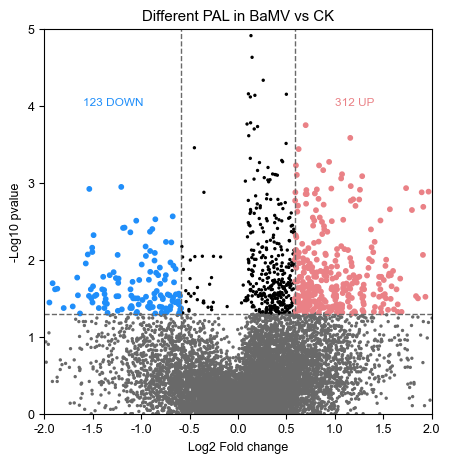

In [39]:
fig, axes = plt.subplots(1,figsize=(5, 5))

for i, sample in zip(range(1), [diff_polya]):
    df = sample
    result = pd.DataFrame()
    result["x"] = df["log2fc"]
    result["y"] = -np.log10(df["MHU_pvalue"])

    # 设置显著性阈值
    x_threshold = np.log2(1.5)  # mean fold change >= 1.5
    y_threshold = -np.log10(0.05)  # mean pvalue <= 0.05

    # 分组为up, normal, down
    result["color"] = "black"
    result.loc[
        (result.x > x_threshold) & (result.y > y_threshold), "color"
    ] ="#ea8186"  # x=-+x_threshold直接截断
    result.loc[
        (result.x < -x_threshold) & (result.y > y_threshold), "color"
    ] = "#1f8efa"  # x=-+x_threshold直接截断
    result.loc[result.y < y_threshold, "color"] = "dimgrey"  # 阈值以下点为灰色

    up = len(result.loc[(result.x > x_threshold) & (result.y > y_threshold), "color"])
    down = len(
        result.loc[(result.x < -x_threshold) & (result.y > y_threshold), "color"]
    )
    # 确定坐标轴显示范围
    xmin = -2
    xmax = 2
    ymin = 0
    ymax = 5

    # 绘制散点图
    #plt.set(xlim=(xmin, xmax), ylim=(ymin, ymax), title="")
    plt.xlim(xmin, xmax)
    plt.ylim(ymin,ymax)
    plt.scatter(result["x"], result["y"], s=2, color=result["color"])
    plt.scatter(result[(result['color']!='black')&(result['color']!='dimgrey')]["x"], 
                result[(result['color']!='black')&(result['color']!='dimgrey')]["y"], 
                s=10, color=result[(result['color']!='black')&(result['color']!='dimgrey')]["color"])
    # axes[i].set_ylabel('-Log10(Q value)',fontweight='bold')
    # axes[i].set_xlabel('Log2 (fold change)',fontweight='bold')
    # axes[i].spines['right'].set_visible(False) #去掉右边框
    # axes[i].spines['top'].set_visible(False) #去掉上边框
    plt.xlabel("Log2 Fold change")
    plt.ylabel("-Log10 pvalue")

    plt.text(-1.6, 4, "{} {}".format(down, "DOWN"), fontsize=8.5, c="#1f8efa")
    plt.text(1.0, 4, "{} {}".format(up, "UP"), fontsize=8.5, c="#ea8186")
    # 水平和竖直线
    plt.vlines(
        -x_threshold, ymin, ymax, color="dimgrey", linestyle="dashed", linewidth=1
    )  # 画竖直线
    plt.vlines(
        x_threshold, ymin, ymax, color="dimgrey", linestyle="dashed", linewidth=1
    )  # 画竖直线
    plt.hlines(
        y_threshold, xmin, xmax, color="dimgrey", linestyle="dashed", linewidth=1
    )  # 画竖水平线
    plt.title('Different PAL in BaMV vs CK')
    x_major_locator = MultipleLocator(1)
    #plt.xaxis.set_major_locator(x_major_locator)

    # axes[i].set_xticks(range(-8,12,2)) #设置x轴刻度起点和步长
    # axes[i].set_yticks(range(-20,380,40)) #设置y轴刻度起点和步长

plt.savefig(
    pal_fp+'Differential_PAL_in_BaMV_volcanoplot_2.pdf',
    format="pdf",
    dpi=600,
    bbox_inches="tight",
    transparent=True,
)

Diff PAL example

In [173]:
gene_list

,Type,func,type,use_Osname,use_name,gene_name,gene_id
0,SA,synthesis,OsICS1,OsICS1,ICS1,evm.model.ORIGINAL_3527.134,evm.TU.ORIGINAL_3527.134
1,SA,synthesis,OsSGT1,OsSGT1,SGT1,evm.model.FRAGSCAFF_171.292,evm.TU.FRAGSCAFF_171.292
2,SA,synthesis,OsNPR1,OsNPR1,NPR1,evm.model.FRAGSCAFF_226.193,evm.TU.FRAGSCAFF_226.193
3,SA,synthesis,OsNPR3.3,OsNPR3.3,NPR3.3,evm.model.FRAGSCAFF_292.23,evm.TU.FRAGSCAFF_292.23
4,SA,synthesis,OsPAL6,OsPAL6,PAL6,evm.model.FRAGSCAFF_190.1431,evm.TU.FRAGSCAFF_190.1431
...,...,...,...,...,...,...,...
1091,PR,PR-15/16,PR-15/16,PR-15/16,PR-15/16,evm.model.FRAGSCAFF_346.31,evm.TU.FRAGSCAFF_346.31
1092,PR,PR-15/16,PR-15/16,PR-15/16,PR-15/16,evm.model.FRAGSCAFF_366.24,evm.TU.FRAGSCAFF_366.24
1093,PR,PR-15/16,PR-15/16,PR-15/16,PR-15/16,evm.model.FRAGSCAFF_132.474,evm.TU.FRAGSCAFF_132.474
1094,PR,PR-17,PR-17,PR-17,PR-17,evm.model.ORIGINAL_6124.146,evm.TU.ORIGINAL_6124.146


In [194]:
dat=diff_polya_df[diff_polya['mark'].isin(['Up','Down'])].merge(gene_list,left_on='transcript_id',right_on='gene_name',how='inner')

In [195]:
dat

,CK,BaMV,MHU_pvalue,KS_pvalue,CK_rpm,BaMV_rpm,log2fc,mark,dPAL,gene_id_x,transcript_id,Type,func,type,use_Osname,use_name,gene_name,gene_id_y
0,128.930,30.480,0.020513,0.032634,9.475877,18.976376,-2.080653,Down,-98.450,evm.TU.FRAGSCAFF_20.291,evm.model.FRAGSCAFF_20.291,APA,Protein monomers,PabN/PabI,PabN/PabI,PabN/PabI,evm.model.FRAGSCAFF_20.291,evm.TU.FRAGSCAFF_20.291
1,65.540,103.160,0.037355,0.008442,35.534540,53.133854,0.654436,Up,37.620,evm.TU.ORIGINAL_6145.62,evm.model.ORIGINAL_6145.62,JA,TF,OsbZIP48; OsHY5L2,OsbZIP48,bZIP48,evm.model.ORIGINAL_6145.62,evm.TU.ORIGINAL_6145.62
2,137.170,53.670,0.037362,0.065254,37.903510,22.771652,-1.353777,Down,-83.500,evm.TU.FRAGSCAFF_132.450,evm.model.FRAGSCAFF_132.450,ABA,regulator,BIP130,BIP130,BIP130,evm.model.FRAGSCAFF_132.450,evm.TU.FRAGSCAFF_132.450
3,49.290,136.580,0.003093,0.003952,15.398301,37.952753,1.470379,Up,87.290,evm.TU.ORIGINAL_5551.189,evm.model.ORIGINAL_5551.189,PR,PR-9,PR-9,PR-9,PR-9,evm.model.ORIGINAL_5551.189,evm.TU.ORIGINAL_5551.189
4,89.075,134.870,0.047619,0.095238,7.106908,9.488188,0.598477,Up,45.795,evm.TU.FRAGSCAFF_395.53,evm.model.FRAGSCAFF_395.53,m6A,writer,HAKAI,HAKAI,evm.model.FRAGSCAFF_395.53,evm.model.FRAGSCAFF_395.53,evm.TU.FRAGSCAFF_395.53
5,53.580,159.975,0.015873,0.015873,17.767270,17.078739,1.578080,Up,106.395,evm.TU.FRAGSCAFF_46.484,evm.model.FRAGSCAFF_46.484,m6A,writer,MTB,MTB,evm.model.FRAGSCAFF_46.484,evm.model.FRAGSCAFF_46.484,evm.TU.FRAGSCAFF_46.484
6,111.870,69.430,0.005956,0.005799,15.398301,36.055115,-0.688192,Down,-42.440,evm.TU.ORIGINAL_2308.44,evm.model.ORIGINAL_2308.44,m6A,eraser,AT1G14710.1,AT1G14710.1,evm.model.ORIGINAL_2308.44,evm.model.ORIGINAL_2308.44,evm.TU.ORIGINAL_2308.44


In [198]:
bamv_polya=pd.read_csv(pal_fp+'bamv_polya_featurecount_inte.csv').dropna()
ck_polya=pd.read_csv(pal_fp+'ck_polya_featurecount_inte.csv').dropna()
ck_polya['sample']='CK'
bamv_polya['sample']='BaMV'
polya_df=pd.concat([ck_polya,bamv_polya])

In [199]:
polya_df

,readname,polya_length,qc_tag,featurecounts_readnames,geneid,sample
1,cf5933ae-0f1e-4acb-a7d9-655999ae2933,92.70,PASS,cf5933ae-0f1e-4acb-a7d9-655999ae2933,evm.TU.FRAGSCAFF_24.8,CK
2,a8c7a7b3-009b-4558-9f89-6640945eb112,68.08,PASS,a8c7a7b3-009b-4558-9f89-6640945eb112,evm.TU.FRAGSCAFF_24.8,CK
3,067622d6-42eb-4eb1-9d77-478cd4dd43dc,46.70,PASS,067622d6-42eb-4eb1-9d77-478cd4dd43dc,evm.TU.FRAGSCAFF_24.8,CK
4,a7b07835-ebba-435d-9d7a-f152237cd817,52.14,PASS,a7b07835-ebba-435d-9d7a-f152237cd817,evm.TU.FRAGSCAFF_24.8,CK
5,41d77df8-3b37-4aa6-8c32-c8b2308f452e,59.64,PASS,41d77df8-3b37-4aa6-8c32-c8b2308f452e,evm.TU.FRAGSCAFF_24.8,CK
...,...,...,...,...,...,...
526962,37615494-6bc1-4f3e-af60-9e4a6cb3730f,184.00,PASS,37615494-6bc1-4f3e-af60-9e4a6cb3730f,evm.TU.FRAGSCAFF_341.6,BaMV
526964,f0936b66-382a-4648-90c7-0b5c8bc7f5e0,24.10,PASS,f0936b66-382a-4648-90c7-0b5c8bc7f5e0,evm.TU.FRAGSCAFF_341.6,BaMV
526965,609e48e3-5bb6-493c-ab61-e0bb8e5e4fe1,131.04,PASS,609e48e3-5bb6-493c-ab61-e0bb8e5e4fe1,evm.TU.FRAGSCAFF_341.6,BaMV
526966,7d24549e-9d26-4fe8-b27c-d872937a7371,51.21,PASS,7d24549e-9d26-4fe8-b27c-d872937a7371,evm.TU.FRAGSCAFF_341.6,BaMV


In [ ]:
gene_title={'evm.model.ORIGINAL_746.135':['response to desiccation','stable']}
gn_id = ['evm.model.ORIGINAL_746.135']#,'evm.model.ORIGINAL_1999.136']

In [200]:
dat

,CK,BaMV,MHU_pvalue,KS_pvalue,CK_rpm,BaMV_rpm,log2fc,mark,dPAL,gene_id_x,transcript_id,Type,func,type,use_Osname,use_name,gene_name,gene_id_y
0,128.930,30.480,0.020513,0.032634,9.475877,18.976376,-2.080653,Down,-98.450,evm.TU.FRAGSCAFF_20.291,evm.model.FRAGSCAFF_20.291,APA,Protein monomers,PabN/PabI,PabN/PabI,PabN/PabI,evm.model.FRAGSCAFF_20.291,evm.TU.FRAGSCAFF_20.291
1,65.540,103.160,0.037355,0.008442,35.534540,53.133854,0.654436,Up,37.620,evm.TU.ORIGINAL_6145.62,evm.model.ORIGINAL_6145.62,JA,TF,OsbZIP48; OsHY5L2,OsbZIP48,bZIP48,evm.model.ORIGINAL_6145.62,evm.TU.ORIGINAL_6145.62
2,137.170,53.670,0.037362,0.065254,37.903510,22.771652,-1.353777,Down,-83.500,evm.TU.FRAGSCAFF_132.450,evm.model.FRAGSCAFF_132.450,ABA,regulator,BIP130,BIP130,BIP130,evm.model.FRAGSCAFF_132.450,evm.TU.FRAGSCAFF_132.450
3,49.290,136.580,0.003093,0.003952,15.398301,37.952753,1.470379,Up,87.290,evm.TU.ORIGINAL_5551.189,evm.model.ORIGINAL_5551.189,PR,PR-9,PR-9,PR-9,PR-9,evm.model.ORIGINAL_5551.189,evm.TU.ORIGINAL_5551.189
4,89.075,134.870,0.047619,0.095238,7.106908,9.488188,0.598477,Up,45.795,evm.TU.FRAGSCAFF_395.53,evm.model.FRAGSCAFF_395.53,m6A,writer,HAKAI,HAKAI,evm.model.FRAGSCAFF_395.53,evm.model.FRAGSCAFF_395.53,evm.TU.FRAGSCAFF_395.53
5,53.580,159.975,0.015873,0.015873,17.767270,17.078739,1.578080,Up,106.395,evm.TU.FRAGSCAFF_46.484,evm.model.FRAGSCAFF_46.484,m6A,writer,MTB,MTB,evm.model.FRAGSCAFF_46.484,evm.model.FRAGSCAFF_46.484,evm.TU.FRAGSCAFF_46.484
6,111.870,69.430,0.005956,0.005799,15.398301,36.055115,-0.688192,Down,-42.440,evm.TU.ORIGINAL_2308.44,evm.model.ORIGINAL_2308.44,m6A,eraser,AT1G14710.1,AT1G14710.1,evm.model.ORIGINAL_2308.44,evm.model.ORIGINAL_2308.44,evm.TU.ORIGINAL_2308.44


In [204]:
bamv_polya['gene_name']=bamv_polya['geneid'].apply(get_transcript)
ck_polya['gene_name']=ck_polya['geneid'].apply(get_transcript)

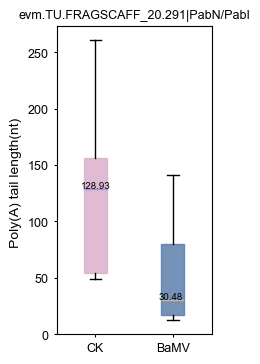

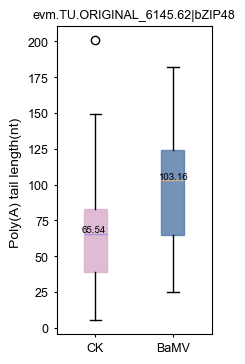

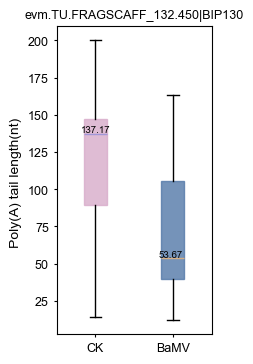

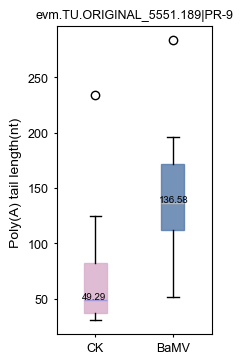

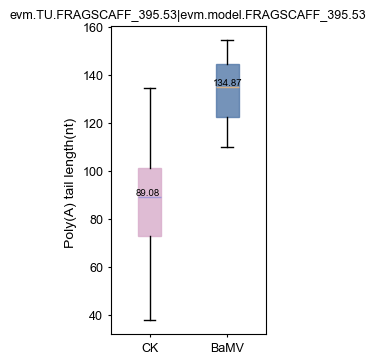

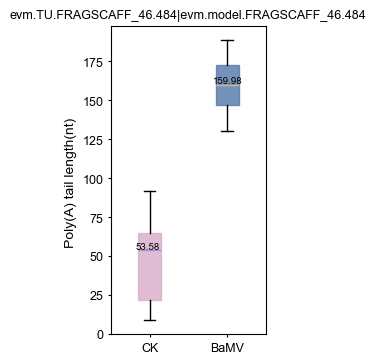

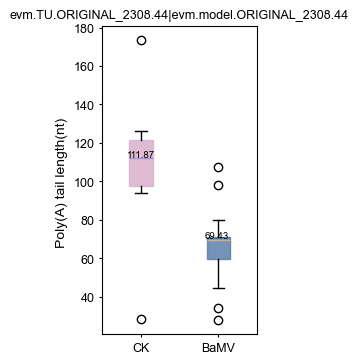

In [209]:
# Figure4.2.3 m6a_modification_ration_box_plot
for index,row in dat.iterrows():
    gn_id=row['gene_name']
    smg_bm_mod_ratio = bamv_polya[bamv_polya['gene_name']==gn_id]['polya_length']
    smg_ck_mod_ratio = ck_polya[ck_polya['gene_name']==gn_id]['polya_length']
    #sns.reset_defaults()
    # sns.set_style(style='whitegrid')
    
    fig = plt.figure(figsize=(2, 4))
    ax = plt.subplot()
    sample = [smg_ck_mod_ratio,smg_bm_mod_ratio]
    # colors = ["lightcoral", "dodgerblue", "mediumseagreen","orange"]
    #colors = ['#f9cfda','#b8c2dd',"#ffb2cc", "#8ce3e3"]
    #colors = ["#e1f2f5", "#ffceb3","#f1ccf9","#cbd3fd"]

    # colors_r = ["lightcoral", "lightcoral","dodgerblue","dodgerblue",  "mediumseagreen","mediumseagreen","orange","orange"]
    #colors_r = ['#f9cfda','#f9cfda','#b8c2dd','#b8c2dd',"#aba6c6", "#aba6c6", "#d0c4bd", "#d0c4bd"]
    #colors_r = ['#ef87a2','#ef87a2', '#4e66ab', '#4e66ab']
    labels = ['CK','BaMV']
    colors_2 =  ["#a197d8", "#d7af83","#aba6c6", "#d7af83"]
    colors_b = ["#d8acca", "#5378a8","#f2cbb7","#ee8468",]
    #colors_b=["#e1f2f5", "#ffceb3","#f1ccf9","#cbd3fd"]
    #plt.ylim(0,125)
    bplot = plt.boxplot(sample, patch_artist=True, labels=labels, widths=0.3,notch=False)
    for patch, color in zip(bplot["medians"], colors_2):
        patch.set_color(color)
        patch.set_linewidth(1)
    for patch, color in zip(bplot["boxes"], colors_b):
        patch.set_linewidth(1)
        patch.set_color(color)
        patch.set_alpha(0.8)
    # for patch, color in zip(bplot["whiskers"], colors_r):
    #     patch.set_linewidth(1)
    #     patch.set_color(color)
    #     patch.set_linestyle("--")
    # for patch,color in zip(bplot['caps'], colors_r):
    #     patch.set_color(color)
    # plt.show()
    # ax = plt.gca()
    # ax.spines['top'].set_color('none')
    # ax.spines['right'].set_color('none')
    # adjust_spines(ax, ['left', 'bottom'])

    ######xticklabel rotation
    # plt.xticks(rotation=15)
    plt.xticks(fontsize=9)
    plt.tick_params(length=2)
    plt.yticks(fontsize=9)
    #sns.despine(ax=ax, trim=True, offset=8)
    plt.ylabel('Poly(A) tail length(nt) ',fontsize=10)
    plt.text(0.82,smg_ck_mod_ratio.median()+1,'%.2f' % (round(smg_ck_mod_ratio.median(),2)),fontsize=7)
    plt.text(1.82,smg_bm_mod_ratio.median()+1,'%.2f' % (round(smg_bm_mod_ratio.median(),2)),fontsize=7)
    plt.title(row['gene_id_x']+'|'+row['use_name'],fontsize=9)
    plt.savefig(pal_fp+'single_gene/'+row['gene_id_x']+'_PAL'+row['mark']+'.pdf', format='pdf', dpi=600, bbox_inches='tight',transparent = True)
    plt.show()
    # plt.savefig('/media/usb/project/DRS/result/02_m6A/ratio_df/m6a_modification_ration_box_plot.ps', format='ps', dpi=600, bbox_inches='tight',transparent = True)

### 4. DE PAL & DETPM

In [53]:
pro_fp='/home/qq/work/lxr/DRS/wig/'
deseq2_bamv_ck_res=pd.read_csv("/home/qq/work/lxr/DRS/wig/deseq2_bamv_ck_res_1.5.csv")
pro_abundance=pd.read_csv("/home/qq/work/lxr/DRS/wig/pro_abundance.csv",index_col=0)
diff_polya_df=pd.read_csv(pal_fp+"Differential PAL in BaMV.csv",index_col=0)

In [54]:
diff_polya_df['gene_id']=diff_polya_df.index
diff_polya_df['transcript_id']=diff_polya_df['gene_id'].apply(get_transcript)

In [63]:
DEPAL_express=diff_polya_df[diff_polya_df['mark'].isin(['Up','Down'])].merge(deseq2_bamv_ck_res[['log2FoldChange','sig','transcript']],left_on='transcript_id',right_on='transcript',how='left')
DEPAL_express=DEPAL_express.rename(columns={'log2fc':'pal_log2fc'})
DEPAL_express.index=DEPAL_express.transcript_id
DEPAL_express=DEPAL_express.merge(pro_abundance[['log2fc','Dla1_(FC_1.5_label)']],right_index=True,left_index=True,how='left').rename(columns={'log2fc':'pro_log2fc'})

In [64]:
DEPAL_express

,CK,BaMV,MHU_pvalue,KS_pvalue,CK_rpm,BaMV_rpm,pal_log2fc,mark,dPAL,gene_id,transcript_id,log2FoldChange,sig,transcript,pro_log2fc,Dla1_(FC_1.5_label)
transcript_id,,,,,,,,,,,,,,,,
evm.model.ORIGINAL_4683.104,50.090,139.170,0.042424,0.121212,10.660362,11.385826,1.474254,Up,89.080,evm.TU.ORIGINAL_4683.104,evm.model.ORIGINAL_4683.104,0.037572,none,evm.model.ORIGINAL_4683.104,-0.100351,stable
evm.model.ORIGINAL_5902.59,56.100,102.470,0.004645,0.004015,68.700111,104.370070,0.869129,Up,46.370,evm.TU.ORIGINAL_5902.59,evm.model.ORIGINAL_5902.59,0.577174,none,evm.model.ORIGINAL_5902.59,NaN,NaN
evm.model.FRAGSCAFF_245.493,41.920,78.930,0.012979,0.016909,16.582785,15.181101,0.912935,Up,37.010,evm.TU.FRAGSCAFF_245.493,evm.model.FRAGSCAFF_245.493,-0.492750,none,evm.model.FRAGSCAFF_245.493,NaN,NaN
evm.model.FRAGSCAFF_132.679.2,50.540,124.590,0.024242,0.030303,15.398301,20.874014,1.301691,Up,74.050,evm.TU.FRAGSCAFF_132.679,evm.model.FRAGSCAFF_132.679.2,-0.313174,none,evm.model.FRAGSCAFF_132.679.2,-0.119877,stable
evm.model.FRAGSCAFF_284.392,58.850,101.430,0.016602,0.032454,29.612117,30.362202,0.785370,Up,42.580,evm.TU.FRAGSCAFF_284.392,evm.model.FRAGSCAFF_284.392,-0.120333,none,evm.model.FRAGSCAFF_284.392,-0.281111,stable
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
evm.model.FRAGSCAFF_371.713,47.270,71.540,0.000595,0.001126,226.236572,233.409429,0.597825,Up,24.270,evm.TU.FRAGSCAFF_371.713,evm.model.FRAGSCAFF_371.713,-0.406839,none,evm.model.FRAGSCAFF_371.713,NaN,NaN
evm.model.FRAGSCAFF_420.298,70.485,207.205,0.016162,0.020202,11.844847,22.771652,1.555671,Up,136.720,evm.TU.FRAGSCAFF_420.298,evm.model.FRAGSCAFF_420.298,0.111537,none,evm.model.FRAGSCAFF_420.298,-0.639103,down
evm.model.FRAGSCAFF_230.570,89.000,57.960,0.034639,0.023089,33.165571,68.314955,-0.618748,Down,-31.040,evm.TU.FRAGSCAFF_230.570,evm.model.FRAGSCAFF_230.570,-0.932168,down,evm.model.FRAGSCAFF_230.570,NaN,NaN


In [143]:
DEPAL_express[(DEPAL_express['sig']=='down') & (DEPAL_express['mark']=='Up')].merge(ma_gene_go_des_BP,left_index=True,right_on='gene_id')

,gene_id,CK,BaMV,MHU_pvalue,KS_pvalue,CK_rpm,BaMV_rpm,pal_log2fc,mark,dPAL,gene_id_x,transcript_id,log2FoldChange,sig,transcript,pro_log2fc,Dla1_(FC_1.5_label),gene_id_y,go_term,des
20255,evm.model.ORIGINAL_2314.94,42.770,79.365,0.011226,0.011112,37.903510,45.543303,0.891904,Up,36.595,evm.TU.ORIGINAL_2314.94,evm.model.ORIGINAL_2314.94,-0.819525,down,evm.model.ORIGINAL_2314.94,NaN,NaN,evm.model.ORIGINAL_2314.94,GO:0045454,cell redox homeostasis
39585,evm.model.FRAGSCAFF_129.1157,46.640,118.615,0.012763,0.020979,16.582785,22.771652,1.346647,Up,71.975,evm.TU.FRAGSCAFF_129.1157,evm.model.FRAGSCAFF_129.1157,-0.627794,down,evm.model.FRAGSCAFF_129.1157,NaN,NaN,evm.model.FRAGSCAFF_129.1157,GO:0015693,magnesium ion transport
4145,evm.model.FRAGSCAFF_425.483,56.800,91.700,0.007813,0.060362,125.555375,108.165345,0.691031,Up,34.900,evm.TU.FRAGSCAFF_425.483,evm.model.FRAGSCAFF_425.483,-1.066119,down,evm.model.FRAGSCAFF_425.483,-0.157170,stable,evm.model.FRAGSCAFF_425.483,GO:0055114,oxidation-reduction process
23775,evm.model.ORIGINAL_1673.816,43.080,90.670,0.000775,0.000180,105.419136,85.393693,1.073607,Up,47.590,evm.TU.ORIGINAL_1673.816,evm.model.ORIGINAL_1673.816,-0.740529,down,evm.model.ORIGINAL_1673.816,NaN,NaN,evm.model.ORIGINAL_1673.816,GO:0006412,translation
27030,evm.model.FRAGSCAFF_131.113,67.750,113.410,0.019427,0.017760,21.320724,17.078739,0.743255,Up,45.660,evm.TU.FRAGSCAFF_131.113,evm.model.FRAGSCAFF_131.113,-0.675755,down,evm.model.FRAGSCAFF_131.113,NaN,stable,evm.model.FRAGSCAFF_131.113,GO:0055085,transmembrane transport
39730,evm.model.FRAGSCAFF_131.113,67.750,113.410,0.019427,0.017760,21.320724,17.078739,0.743255,Up,45.660,evm.TU.FRAGSCAFF_131.113,evm.model.FRAGSCAFF_131.113,-0.675755,down,evm.model.FRAGSCAFF_131.113,NaN,stable,evm.model.FRAGSCAFF_131.113,GO:0006821,chloride transport
34692,evm.model.FRAGSCAFF_411.228,59.200,113.830,0.047526,0.172540,33.165571,51.236216,0.943212,Up,54.630,evm.TU.FRAGSCAFF_411.228,evm.model.FRAGSCAFF_411.228,-0.898279,down,evm.model.FRAGSCAFF_411.228,NaN,NaN,evm.model.FRAGSCAFF_411.228,GO:0000413,protein peptidyl-prolyl isomerization
43616,evm.model.FRAGSCAFF_236.220,74.240,139.160,0.008686,0.017323,69.884596,60.724404,0.906476,Up,64.920,evm.TU.FRAGSCAFF_236.220,evm.model.FRAGSCAFF_236.220,-0.595179,down,evm.model.FRAGSCAFF_236.220,-0.782624,down,evm.model.FRAGSCAFF_236.220,GO:0006090,pyruvate metabolic process
43686,evm.model.FRAGSCAFF_236.220,74.240,139.160,0.008686,0.017323,69.884596,60.724404,0.906476,Up,64.920,evm.TU.FRAGSCAFF_236.220,evm.model.FRAGSCAFF_236.220,-0.595179,down,evm.model.FRAGSCAFF_236.220,-0.782624,down,evm.model.FRAGSCAFF_236.220,GO:0016310,phosphorylation
17180,evm.model.ORIGINAL_2592.367,44.960,77.080,0.023851,0.010555,29.612117,30.362202,0.777715,Up,32.120,evm.TU.ORIGINAL_2592.367,evm.model.ORIGINAL_2592.367,-1.077611,down,evm.model.ORIGINAL_2592.367,NaN,NaN,evm.model.ORIGINAL_2592.367,GO:0006355,"regulation of transcription, DNA-templated"


In [145]:
DEPAL_express[(DEPAL_express['sig']=='down') & (DEPAL_express['mark']=='Up')].merge(ma_gene_go_des_CC,left_index=True,right_on='gene_id')

,gene_id,CK,BaMV,MHU_pvalue,KS_pvalue,CK_rpm,BaMV_rpm,pal_log2fc,mark,dPAL,gene_id_x,transcript_id,log2FoldChange,sig,transcript,pro_log2fc,Dla1_(FC_1.5_label),gene_id_y,go_term,des
6682,evm.model.FRAGSCAFF_129.1157,46.640,118.615,0.012763,0.020979,16.582785,22.771652,1.346647,Up,71.975,evm.TU.FRAGSCAFF_129.1157,evm.model.FRAGSCAFF_129.1157,-0.627794,down,evm.model.FRAGSCAFF_129.1157,NaN,NaN,evm.model.FRAGSCAFF_129.1157,GO:0016021,integral component of membrane
8310,evm.model.ORIGINAL_1673.816,43.080,90.670,0.000775,0.000180,105.419136,85.393693,1.073607,Up,47.590,evm.TU.ORIGINAL_1673.816,evm.model.ORIGINAL_1673.816,-0.740529,down,evm.model.ORIGINAL_1673.816,NaN,NaN,evm.model.ORIGINAL_1673.816,GO:0005840,ribosome
2351,evm.model.FRAGSCAFF_131.113,67.750,113.410,0.019427,0.017760,21.320724,17.078739,0.743255,Up,45.660,evm.TU.FRAGSCAFF_131.113,evm.model.FRAGSCAFF_131.113,-0.675755,down,evm.model.FRAGSCAFF_131.113,NaN,stable,evm.model.FRAGSCAFF_131.113,GO:0016020,membrane
15900,evm.model.FRAGSCAFF_317.22,37.135,85.370,0.046876,0.014717,22.505209,18.976376,1.200950,Up,48.235,evm.TU.FRAGSCAFF_317.22,evm.model.FRAGSCAFF_317.22,-0.824518,down,evm.model.FRAGSCAFF_317.22,NaN,NaN,evm.model.FRAGSCAFF_317.22,GO:0005854,nascent polypeptide-associated complex
14836,evm.model.FRAGSCAFF_265.94,63.510,123.810,0.001190,0.012225,31.981086,32.259840,0.963072,Up,60.300,evm.TU.FRAGSCAFF_265.94,evm.model.FRAGSCAFF_265.94,-0.778597,down,evm.model.FRAGSCAFF_265.94,0.552605,stable,evm.model.FRAGSCAFF_265.94,GO:0000015,phosphopyruvate hydratase complex
8118,evm.model.ORIGINAL_3918.284,47.220,72.860,0.000366,0.000353,149.245069,94.881882,0.625729,Up,25.640,evm.TU.ORIGINAL_3918.284,evm.model.ORIGINAL_3918.284,-0.760926,down,evm.model.ORIGINAL_3918.284,NaN,NaN,evm.model.ORIGINAL_3918.284,GO:0005840,ribosome


In [146]:
DEPAL_express.to_csv(pal_fp+'DEPAL_express.csv')

In [147]:
DEPAL_express.merge(ma_gene_go_des_MF,right_on='gene_id',left_index=True,how='left').to_csv('F:\\project\\DRS\\result\\01_polyA\\process\\mwu_pv\\DEPAL_express_MF.csv')

In [148]:
DEPAL_express[DEPAL_express['Dla1_(FC_1.5_label)'].isin(['up','down'])].merge(gene_list,left_index=True,right_on='gene_name')

,CK,BaMV,MHU_pvalue,KS_pvalue,CK_rpm,BaMV_rpm,pal_log2fc,mark,dPAL,gene_id_x,...,transcript,pro_log2fc,Dla1_(FC_1.5_label),Type,func,type,use_Osname,use_name,gene_name,gene_id_y


In [149]:
DEPAL_express[DEPAL_express['sig'] != 'none'].merge(gene_list,left_index=True,right_on='gene_name')

,CK,BaMV,MHU_pvalue,KS_pvalue,CK_rpm,BaMV_rpm,pal_log2fc,mark,dPAL,gene_id_x,...,transcript,pro_log2fc,Dla1_(FC_1.5_label),Type,func,type,use_Osname,use_name,gene_name,gene_id_y


In [150]:
DEPAL_express[DEPAL_express['sig'] != 'none'].merge(gene_list,left_index=True,right_on='gene_name')

,CK,BaMV,MHU_pvalue,KS_pvalue,CK_rpm,BaMV_rpm,pal_log2fc,mark,dPAL,gene_id_x,...,transcript,pro_log2fc,Dla1_(FC_1.5_label),Type,func,type,use_Osname,use_name,gene_name,gene_id_y


In [ ]:
DEPAL_express

,CK,BaMV,MHU_pvalue,KS_pvalue,CK_rpm,BaMV_rpm,pal_log2fc,mark,log2FoldChange,sig,transcript_id,pro_log2fc,Dla1_(FC_1.5_label),TPM_PAL_labels,pro_PAL_labels
transcript_id,,,,,,,,,,,,,,,
evm.model.ORIGINAL_2449.51,63.040,96.860,0.023270,0.050718,22.505209,36.055115,0.619633,Up,-0.226972,none,evm.model.ORIGINAL_2449.51,0.246886,stable,none,none
evm.model.FRAGSCAFF_391.162.1,40.410,91.430,0.049550,0.027972,13.029331,22.771652,1.177955,Up,0.276067,none,evm.model.FRAGSCAFF_391.162.1,NaN,NaN,none,none
evm.model.FRAGSCAFF_355.19,81.415,54.165,0.042624,0.092574,16.582785,20.874014,-0.587934,Down,-0.006397,none,evm.model.FRAGSCAFF_355.19,0.051157,stable,none,none
evm.model.FRAGSCAFF_158.368,51.850,78.155,0.001334,0.002718,200.177910,172.685024,0.591994,Up,-0.140637,none,evm.model.FRAGSCAFF_158.368,0.648754,up,none,longer-up
evm.model.FRAGSCAFF_46.532.1,72.275,187.085,0.004040,0.004040,13.029331,9.488188,1.372125,Up,0.112439,none,evm.model.FRAGSCAFF_46.532.1,NaN,NaN,none,none
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
evm.model.FRAGSCAFF_171.426,141.660,66.600,0.019373,0.099547,21.320724,34.157477,-1.088838,Down,0.306597,none,evm.model.FRAGSCAFF_171.426,-0.061896,stable,none,none
evm.model.ORIGINAL_6721.31,44.270,71.625,0.027239,0.026226,49.748356,92.984244,0.694134,Up,0.424032,none,evm.model.ORIGINAL_6721.31,0.236180,stable,none,none
evm.model.ORIGINAL_6430.135,47.440,113.040,0.016602,0.013567,33.165571,36.055115,1.252657,Up,0.207818,none,evm.model.ORIGINAL_6430.135,0.105496,stable,none,none


In [151]:
DEPAL_express

,CK,BaMV,MHU_pvalue,KS_pvalue,CK_rpm,BaMV_rpm,pal_log2fc,mark,dPAL,gene_id,transcript_id,log2FoldChange,sig,transcript,pro_log2fc,Dla1_(FC_1.5_label)
transcript_id,,,,,,,,,,,,,,,,
evm.model.ORIGINAL_4683.104,50.090,139.170,0.042424,0.121212,10.660362,11.385826,1.474254,Up,89.080,evm.TU.ORIGINAL_4683.104,evm.model.ORIGINAL_4683.104,0.037572,none,evm.model.ORIGINAL_4683.104,-0.100351,stable
evm.model.ORIGINAL_5902.59,56.100,102.470,0.004645,0.004015,68.700111,104.370070,0.869129,Up,46.370,evm.TU.ORIGINAL_5902.59,evm.model.ORIGINAL_5902.59,0.577174,none,evm.model.ORIGINAL_5902.59,NaN,NaN
evm.model.FRAGSCAFF_245.493,41.920,78.930,0.012979,0.016909,16.582785,15.181101,0.912935,Up,37.010,evm.TU.FRAGSCAFF_245.493,evm.model.FRAGSCAFF_245.493,-0.492750,none,evm.model.FRAGSCAFF_245.493,NaN,NaN
evm.model.FRAGSCAFF_132.679.2,50.540,124.590,0.024242,0.030303,15.398301,20.874014,1.301691,Up,74.050,evm.TU.FRAGSCAFF_132.679,evm.model.FRAGSCAFF_132.679.2,-0.313174,none,evm.model.FRAGSCAFF_132.679.2,-0.119877,stable
evm.model.FRAGSCAFF_284.392,58.850,101.430,0.016602,0.032454,29.612117,30.362202,0.785370,Up,42.580,evm.TU.FRAGSCAFF_284.392,evm.model.FRAGSCAFF_284.392,-0.120333,none,evm.model.FRAGSCAFF_284.392,-0.281111,stable
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
evm.model.FRAGSCAFF_371.713,47.270,71.540,0.000595,0.001126,226.236572,233.409429,0.597825,Up,24.270,evm.TU.FRAGSCAFF_371.713,evm.model.FRAGSCAFF_371.713,-0.406839,none,evm.model.FRAGSCAFF_371.713,NaN,NaN
evm.model.FRAGSCAFF_420.298,70.485,207.205,0.016162,0.020202,11.844847,22.771652,1.555671,Up,136.720,evm.TU.FRAGSCAFF_420.298,evm.model.FRAGSCAFF_420.298,0.111537,none,evm.model.FRAGSCAFF_420.298,-0.639103,down
evm.model.FRAGSCAFF_230.570,89.000,57.960,0.034639,0.023089,33.165571,68.314955,-0.618748,Down,-31.040,evm.TU.FRAGSCAFF_230.570,evm.model.FRAGSCAFF_230.570,-0.932168,down,evm.model.FRAGSCAFF_230.570,NaN,NaN


In [152]:
DEPAL_express['TPM_PAL_labels'] = np.where((DEPAL_express['mark']=='Up') & (DEPAL_express['sig']=='up'),'longer-up',np.where((DEPAL_express['mark']=='Up') & (DEPAL_express['sig']=='down'),'longer-down',np.where((DEPAL_express['mark']=='Down') & (DEPAL_express['sig']=='up'),'shorter-up',np.where((DEPAL_express['mark']=='Down') & (DEPAL_express['sig']=='down'),'shorter-down','none'))))
DEPAL_express['pro_PAL_labels'] = np.where((DEPAL_express['mark']=='Up') & (DEPAL_express['Dla1_(FC_1.5_label)']=='up'),'longer-up',np.where((DEPAL_express['mark']=='Up') & (DEPAL_express['Dla1_(FC_1.5_label)']=='down'),'longer-down',np.where((DEPAL_express['mark']=='Down') & (DEPAL_express['Dla1_(FC_1.5_label)']=='up'),'shorter-up',np.where((DEPAL_express['mark']=='Down') & (DEPAL_express['Dla1_(FC_1.5_label)']=='down'),'shorter-down','none'))))

In [ ]:
len(dat_1)

66

In [153]:
important_gene={'evm.model.ORIGINAL_3488.153':'response to stress conditions',
                'evm.model.FRAGSCAFF_203.327':'cell death',
                'evm.model.ORIGINAL_4978.47':'regulation of ABA biosynthesis'}

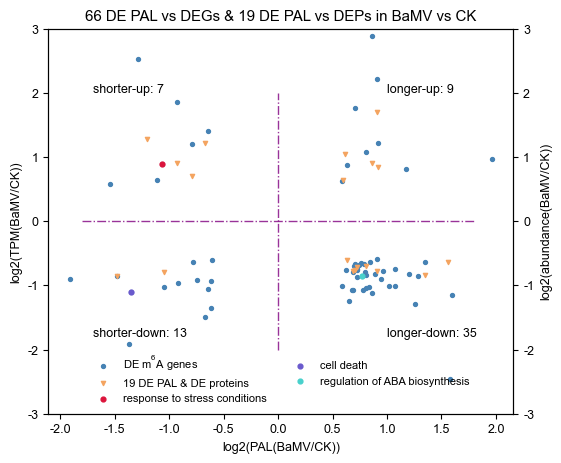

In [154]:

fig, ax = plt.subplots(1,1, figsize=(6, 5))

dat_1=DEPAL_express[DEPAL_express['sig'] != 'none']
y1=dat_1['log2FoldChange']
x=dat_1['pal_log2fc']
s1=ax.scatter(x=x,y=y1,s=8,c='steelblue')
# ax.set_xlim(-0.45,0.45)
ax.set_ylim(-3.0,3.0)
ax.text(x=-1.7,y=2,s='shorter-up: %s' % len(dat_1[dat_1['TPM_PAL_labels']=='shorter-up']))
ax.text(x=1.0,y=2,s='longer-up: %s' % len(dat_1[dat_1['TPM_PAL_labels']=='longer-up']))
ax.text(x=1.0,y=-1.8,s='longer-down: %s' % len(dat_1[dat_1['TPM_PAL_labels']=='longer-down']))
ax.text(x=-1.7,y=-1.8,s='shorter-down: %s' % len(dat_1[dat_1['TPM_PAL_labels']=='shorter-down']))

dat_2=DEPAL_express[DEPAL_express['pro_PAL_labels']!='none']
y2=dat_2['pro_log2fc']
x2=dat_2['pal_log2fc']
ax1=ax.twinx()
s4= plt.scatter(x=x2,y=y2,s=9,c='sandybrown',marker='v',label='19 DE mRNA & DE proteins')
# ax1.legend([],[],loc='lower center',frameon=False,fontsize=8,ncol=2)
s5_1=ax.scatter(data=dat_1[dat_1.index.isin([list(important_gene.keys())[0]])],x='pal_log2fc',y='log2FoldChange',c='crimson',s=12)
s6_1=plt.scatter(data=dat_1[dat_1.index.isin([list(important_gene.keys())[1]])],x='pal_log2fc',y='log2FoldChange',c='slateblue',s=12)
s7_1=plt.scatter(data=dat_1[dat_1.index.isin([list(important_gene.keys())[2]])],x='pal_log2fc',y='log2FoldChange',c='MediumTurquoise',s=12)
ax.legend([s1,s4,s5_1,s6_1,s7_1],['DE $\mathregular{m^6A}$ genes','19 DE PAL & DE proteins',list(important_gene.values())[0],list(important_gene.values())[1],list(important_gene.values())[2]],loc='lower center',frameon=False,fontsize=8,ncol=2)

ax1.set_ylim(-3.0,3.0)
plt.vlines(x=0, ymax=2.0, ymin=-2.0, linestyle='-.',linewidth =1.0,colors='purple',alpha=.8)
plt.hlines(y=0, xmax=1.8, xmin=-1.8, linestyle='-.',linewidth =1.0,colors='purple',alpha=.8)
ax.set_ylabel("log2(TPM(BaMV/CK))")
ax.set_xlabel('log2(PAL(BaMV/CK))')
ax1.set_ylabel('log2(abundance(BaMV/CK))')
plt.title('{0} DE PAL vs DEGs & {1} DE PAL vs DEPs in BaMV vs CK'.format(len(dat_1),len(dat_2)))
plt.savefig(pal_fp+'DEPAL_DEGs_DEPs_scatter2.pdf',format="pdf",
    dpi=600,
    bbox_inches="tight",)
plt.show()

In [155]:
dat_1[dat_1.index.isin([list(important_gene.keys())[2]])]

,CK,BaMV,MHU_pvalue,KS_pvalue,CK_rpm,BaMV_rpm,pal_log2fc,mark,dPAL,gene_id,transcript_id,log2FoldChange,sig,transcript,pro_log2fc,Dla1_(FC_1.5_label),TPM_PAL_labels,pro_PAL_labels
transcript_id,,,,,,,,,,,,,,,,,,
evm.model.ORIGINAL_4978.47,43.5,74.28,0.002833,0.000474,93.574289,51.236216,0.771958,Up,30.78,evm.TU.ORIGINAL_4978.47,evm.model.ORIGINAL_4978.47,-0.852819,down,evm.model.ORIGINAL_4978.47,0.532861,stable,longer-down,none


### 5. the correlation between PAL and RPM, protein, full-length ratio

In [159]:
assign=pd.read_csv('/home/qq/work/lxr/DRS/script_plot/bamv/assign.csv',index_col=0)

In [160]:
cor = {}
phar = tqdm(total=len(assign))
for sam, samples in assign.groupby("sample"):
    cor[sam] = defaultdict(dict)
    tot = len(samples)
    for gene, genes in samples.groupby("Assigned_gene"):
        cor[sam]["read-num"][gene] = len(genes)
        cor[sam]["Rpm"][gene] = len(genes) * 1000000 / tot
        for tag, reads in genes.groupby("Full_length"):
            if tag:
                cor[sam]["full-length-ratio"][gene] = len(reads) / len(genes)
        phar.update(len(genes))
        genes = genes[genes["qc_tag"] == "PASS"]
        cor[sam]["polya"][gene] = genes["polya_length"].median()
phar.close()

  0%|                                                                                                                                          | 0/1361118 [00:00<?, ?it/s]100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1361118/1361118 [01:01<00:00, 22230.24it/s]


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1361118/1361118 [01:01<00:00, 22230.24it/s]


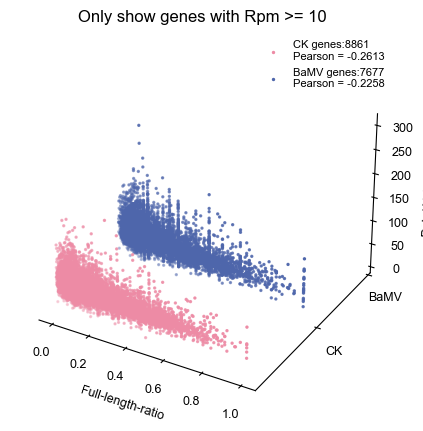

In [162]:
cl={'CK':'#ed8ba5','BaMV':'#4e66ab'}
fig = plt.figure(figsize=(5,5))
ax = plt.axes(projection="3d")
ax.grid(False)

num = 10
flag = 0
yaxis = []
for sam in ["CK", "BaMV"]:
    temp = pd.DataFrame.from_dict(cor[sam]).dropna(axis=0)
    temp = temp[temp["Rpm"] > num]
    n, p = stats.pearsonr((temp["full-length-ratio"]), temp["polya"])
    ax.scatter(temp["full-length-ratio"], flag, temp["polya"], color=cl[sam], s=2, label=f"{sam} genes:{len(temp)}\nPearson = {round(n, 4)}")
    yaxis.append(flag)
    flag += 1

ax.set_yticks(yaxis, labels=["CK", "BaMV"])


ax.set_xlabel("Full-length-ratio",fontsize=9)
ax.set_ylabel("")
ax.set_zlabel("Poly(A) tail length",fontsize=9)
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False
ax.xaxis.pane.set_edgecolor('w')
ax.yaxis.pane.set_edgecolor('w')
ax.zaxis.pane.set_edgecolor('w')
ax.legend(frameon=False, fontsize=8)
ax.set_title(f"Only show genes with Rpm >= {num}",fontsize=12)
# ax.set_xticks([1,2,3],[1,2,3])
ax.set_yticks([1,2],["CK", "BaMV"])
# ax.set_zticks([1,2,3],[1,2,3])
# plt.axis("off")
plt.savefig(pal_fp+f"Correlationship with full-length-ratio (Rpm {num}) and PAL).pdf", bbox_inches="tight",transparent=True)
# plt.savefig(fp+f"Correlationship with full-length-ratio (reads {num}) and PAL).jpeg", bbox_inches="tight", dpi=300)

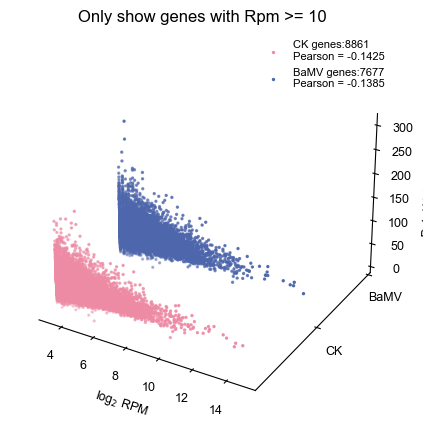

In [163]:
fig = plt.figure(figsize=(5,5))
ax = plt.axes(projection="3d")
ax.grid(False)

num = 10
flag = 0
yaxis = []
for sam in ["CK", "BaMV"]:
    temp = pd.DataFrame.from_dict(cor[sam]).dropna(axis=0)
    temp = temp[temp["Rpm"] > num]
    n, p = stats.pearsonr((np.log2(temp["Rpm"])), temp["polya"])
    ax.scatter(np.log2(temp["Rpm"]), flag, temp["polya"], color=cl[sam], s=2, label=f"{sam} genes:{len(temp)}\nPearson = {round(n, 4)}")
    yaxis.append(flag)
    flag += 1

ax.set_yticks(yaxis, labels=["CK", "BaMV"])


ax.set_xlabel("log$_2$ RPM",fontsize=9)
ax.set_ylabel("")
ax.set_zlabel("Poly(A) tail length",fontsize=9)
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False
ax.xaxis.pane.set_edgecolor('w')
ax.yaxis.pane.set_edgecolor('w')
ax.zaxis.pane.set_edgecolor('w')
ax.legend(frameon=False, fontsize=8)
ax.set_title(f"Only show genes with Rpm >= {num}",fontsize=12)
# ax.set_xticks([1,2,3],[1,2,3])
ax.set_yticks([1,2],["CK", "BaMV"])
# ax.set_zticks([1,2,3],[1,2,3])
# plt.axis("off")
plt.savefig(pal_fp+f"Correlationship with log2RPM (Rpm {num}) and PAL).pdf", bbox_inches="tight",transparent=True)
# plt.savefig(fp+f"Correlationship with full-length-ratio (reads {num}) and PAL).jpeg", bbox_inches="tight", dpi=300)

In [ ]:
pro_abundance.dropna().columns

Index(['bamv_rep1(Normalized)', 'bamv_rep2(Normalized)',
       'bamv_rep3(Normalized)', 'ck_rep1(Normalized)', 'ck_rep2(Normalized)',
       'ck_rep3(Normalized)', 'log2fc', 'fc', 'ttest_pval1',
       'Dla1_(FC_1.5_label)', 'Dla1_(FC_1.3_label)', 'bamv_pro(Normalized)',
       'ck_pro(Normalized)', 'bamv_rep1(Scaled)', 'bamv_rep2(Scaled)',
       'bamv_rep3(Scaled)', 'ck_rep1(Scaled)', 'ck_rep2(Scaled)',
       'ck_rep3(Scaled)', 'bamv_pro(Scaled)', 'ck_pro(Scaled)'],
      dtype='object')

In [164]:
def get_gene(id):
    return mRNA_gene_ID.get(id)
pro_abundance['gene_name']=pro_abundance.index
pro_abundance['gene_id'] =  pro_abundance['gene_name'].apply(get_gene)

In [165]:
pro_abundance

,bamv_rep1(Normalized),bamv_rep2(Normalized),bamv_rep3(Normalized),ck_rep1(Normalized),ck_rep2(Normalized),ck_rep3(Normalized),log2fc,fc,ttest_pval1,Dla1_(FC_1.5_label),...,bamv_rep1(Scaled),bamv_rep2(Scaled),bamv_rep3(Scaled),ck_rep1(Scaled),ck_rep2(Scaled),ck_rep3(Scaled),bamv_pro(Scaled),ck_pro(Scaled),gene_name,gene_id
evm.model.ORIGINAL_5229.70,12752.6,14946.4,14953.8,16504.7,16780.8,18316.4,-0.274784,0.826574,0.032046,stable,...,81.2,95.1,95.2,105.1,106.8,116.6,90.500000,109.500000,evm.model.ORIGINAL_5229.70,evm.TU.ORIGINAL_5229.70
evm.model.FRAGSCAFF_259.922,115937.1,119482.5,105951.4,114602.0,106162.9,123454.9,-0.011990,0.991724,0.889722,stable,...,101.5,104.6,92.7,100.3,92.9,108.0,99.600000,100.400000,evm.model.FRAGSCAFF_259.922,evm.TU.FRAGSCAFF_259.922
evm.model.FRAGSCAFF_182.98,380597.3,349491.9,305504.8,460382.9,389667.2,385236.2,-0.254387,0.838343,0.111242,stable,...,100.6,92.3,80.7,121.6,103.0,101.8,91.200000,108.800000,evm.model.FRAGSCAFF_182.98,evm.TU.FRAGSCAFF_182.98
evm.model.FRAGSCAFF_52.47,52244.8,52197.0,52523.4,79750.0,71292.8,70213.1,-0.495271,0.709428,0.002075,stable,...,82.9,82.8,83.3,126.5,113.1,111.4,83.000000,117.000000,evm.model.FRAGSCAFF_52.47,evm.TU.FRAGSCAFF_52.47
evm.model.FRAGSCAFF_120.407,124512.6,140185.4,129203.1,111550.0,106139.2,119145.4,0.225793,1.169420,0.033559,stable,...,102.2,115.1,106.1,91.6,87.1,97.8,107.800000,92.166667,evm.model.FRAGSCAFF_120.407,evm.TU.FRAGSCAFF_120.407
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
evm.model.FRAGSCAFF_226.197,358.9,381.0,498.7,531.0,639.2,567.9,-0.488801,0.712617,0.036340,stable,...,72.3,76.8,100.5,107.0,128.8,114.5,83.200000,116.766667,evm.model.FRAGSCAFF_226.197,evm.TU.FRAGSCAFF_226.197
evm.model.FRAGSCAFF_323.605,753.4,880.8,606.8,650.6,846.7,703.5,0.026115,1.018266,0.898337,stable,...,101.8,119.0,82.0,87.9,114.4,95.0,100.933333,99.100000,evm.model.FRAGSCAFF_323.605,evm.TU.FRAGSCAFF_323.605
evm.model.FRAGSCAFF_154.219,287.2,348.9,286.7,211.4,201.2,224.5,0.534498,1.448438,0.011839,stable,...,110.5,134.2,110.3,81.3,77.4,86.3,118.333333,81.666667,evm.model.FRAGSCAFF_154.219,evm.TU.FRAGSCAFF_154.219
evm.model.ORIGINAL_609.30_evm.model.ORIGINAL_609.31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,stable,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,evm.model.ORIGINAL_609.30_evm.model.ORIGINAL_6...,evm.TU.ORIGINAL_609.30_evm.TU.ORIGINAL_609.31


In [166]:
cor = {}
phar = tqdm(total=len(assign))
for sam, samples in assign.groupby("sample"):
    cor[sam] = defaultdict(dict)
    tot = len(samples)
    for gene, genes in samples.groupby("Assigned_gene"):
        cor[sam]["read-num"][gene] = len(genes)
        cor[sam]["Rpm"][gene] = len(genes) * 1000000 / tot
        for tag, reads in genes.groupby("Full_length"):
            if tag:
                cor[sam]["full-length-ratio"][gene] = len(reads) / len(genes)
        phar.update(len(genes))
        genes = genes[genes["qc_tag"] == "PASS"]
        cor[sam]["polya"][gene] = genes["polya_length"].median()
phar.close()

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1361118/1361118 [01:01<00:00, 22188.49it/s]


In [167]:
gene

'evm.TU.ORIGINAL_981.99'

In [168]:
cor
for index,row in pro_abundance.dropna().iterrows():
    gene=row['gene_id']
    cor['CK']['pro'][gene]=np.log2(row['ck_pro(Normalized)'])
    cor['BaMV']['pro'][gene]=np.log2(row['bamv_pro(Normalized)'])

In [169]:
pd.DataFrame.from_dict(cor['CK'])

,read-num,Rpm,full-length-ratio,polya,pro
evm.TU.FRAGSCAFF_1.28,15.0,17.893313,0.066667,70.50,NaN
evm.TU.FRAGSCAFF_1.32,1.0,1.192888,NaN,310.47,NaN
evm.TU.FRAGSCAFF_1.33,19.0,22.664863,NaN,65.16,11.446429
evm.TU.FRAGSCAFF_1.37,1.0,1.192888,NaN,45.77,NaN
evm.TU.FRAGSCAFF_1.40,6.0,7.157325,NaN,60.27,NaN
...,...,...,...,...,...
evm.TU.FRAGSCAFF_39.25,NaN,NaN,NaN,NaN,11.418468
evm.TU.FRAGSCAFF_295.95,NaN,NaN,NaN,NaN,9.696736
evm.TU.ORIGINAL_1007.12,NaN,NaN,NaN,NaN,8.421504
evm.TU.FRAGSCAFF_323.605,NaN,NaN,NaN,NaN,9.518850


In [170]:
pd.DataFrame.from_dict(cor['BaMV'])

,read-num,Rpm,polya,full-length-ratio,pro
evm.TU.FRAGSCAFF_1.28,5.0,9.563594,94.210,NaN,NaN
evm.TU.FRAGSCAFF_1.32,1.0,1.912719,73.680,NaN,NaN
evm.TU.FRAGSCAFF_1.33,9.0,17.214469,86.095,NaN,11.455190
evm.TU.FRAGSCAFF_1.37,1.0,1.912719,79.580,NaN,NaN
evm.TU.FRAGSCAFF_1.40,4.0,7.650875,73.430,0.25,NaN
...,...,...,...,...,...
evm.TU.ORIGINAL_981.23,NaN,NaN,NaN,NaN,10.233739
evm.TU.FRAGSCAFF_50.559,NaN,NaN,NaN,NaN,9.383776
evm.TU.FRAGSCAFF_39.25,NaN,NaN,NaN,NaN,11.503263
evm.TU.ORIGINAL_1007.12,NaN,NaN,NaN,NaN,7.923625


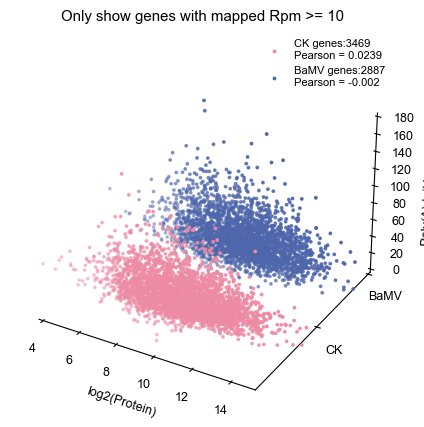

In [172]:
fig = plt.figure(figsize=(5,5))
ax = plt.axes(projection="3d")
ax.grid(False)

num = 10
flag = 0
yaxis = []
for sam in ['CK','BaMV']:
    temp = pd.DataFrame.from_dict(cor[sam]).dropna(axis=0)
    temp = temp[temp["Rpm"] > num]
    temp=temp.dropna()
    n, p = stats.pearsonr(np.log2(temp["pro"]),temp['polya'])
    ax.scatter(temp["pro"].dropna(), flag, temp["polya"].dropna(), color=cl[sam], s=3, label=f"{sam} genes:{len(temp)}\nPearson = {round(n, 4)}")
    yaxis.append(flag)
    flag += 1

ax.set_yticks(yaxis, labels=["CK", "BaMV"])
ax.set_zlim(0,180)
ax.set_xlim(4,15)

ax.set_zlabel("Poly(A) tail length(nt)")
ax.set_ylabel("")
ax.set_xlabel("log2(Protein)",)
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False
ax.xaxis.pane.set_edgecolor('w')
ax.yaxis.pane.set_edgecolor('w')
ax.zaxis.pane.set_edgecolor('w')
ax.legend(frameon=False, fontsize=8)
ax.set_yticks([1,2],["CK", "BaMV"])
ax.set_title(f"Only show genes with mapped Rpm >= {num}")
plt.savefig(pal_fp+f"Correlationship with log2protein (Rpm {num}) and PAL).pdf", bbox_inches="tight",dpi=600)

full length & PAL

In [ ]:
assign

,chrom,alen,ref_st,ref_ed,strand,quality,polya_length,qc_tag,Assigned_gene,NAT,APA,Full_length,Read_percent,sample
70fcefa7-e354-4c5b-a1c6-7df0e935c301,chr4.1,3962,73194,77156,+,60,NaN,NaN,evm.TU.FRAGSCAFF_24.8,False,77145,True,0.8362,CK
cf5933ae-0f1e-4acb-a7d9-655999ae2933,chr4.1,3897,73241,77138,+,60,92.70,PASS,evm.TU.FRAGSCAFF_24.8,False,77145,True,0.8225,CK
a8c7a7b3-009b-4558-9f89-6640945eb112,chr4.1,3845,73260,77105,+,60,68.08,PASS,evm.TU.FRAGSCAFF_24.8,False,77115,True,0.8115,CK
067622d6-42eb-4eb1-9d77-478cd4dd43dc,chr4.1,3867,73264,77131,+,60,46.70,PASS,evm.TU.FRAGSCAFF_24.8,False,0,True,0.8162,CK
a7b07835-ebba-435d-9d7a-f152237cd817,chr4.1,3988,73265,77253,+,60,52.14,PASS,evm.TU.FRAGSCAFF_24.8,False,0,True,0.8417,CK
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7d24549e-9d26-4fe8-b27c-d872937a7371,chr31.1,507,28307016,28307523,-,60,51.21,PASS,evm.TU.FRAGSCAFF_341.6,False,0,False,0.0986,BaMV
5038b4ca-7b8f-4a7d-9ce8-c49837a8234f,chr31.1,335,28307032,28307367,-,60,NaN,NaN,evm.TU.FRAGSCAFF_341.6,False,0,False,0.0651,BaMV
5d869a9f-055c-4842-9f59-1ae41c8532d7,chr31.1,1294,28307045,28308339,-,60,121.28,PASS,evm.TU.FRAGSCAFF_341.6,False,0,False,0.2516,BaMV
2403219f-a619-41df-a751-958651a6cb3a,chr31.1,707,28307065,28307772,-,60,NaN,NaN,evm.TU.FRAGSCAFF_341.6,False,0,False,0.1375,BaMV


In [ ]:
bamv_nonfull_length_polya = assign[(assign['Full_length']==False) & (assign['sample']=='BaMV')].polya_length.dropna()
bamv_full_length_polya = assign[(assign['Full_length']==True) & (assign['sample']=='BaMV')].polya_length.dropna()
ck_nonfull_length_polya = assign[(assign['Full_length']==False) & (assign['sample']=='CK')].polya_length.dropna()
ck_full_length_polya = assign[(assign['Full_length']==True) & (assign['sample']=='CK')].polya_length.dropna()

In [ ]:
values=[ck_full_length_polya,ck_nonfull_length_polya,bamv_full_length_polya,bamv_nonfull_length_polya]
labels=['Full-length-reads \n in CK','Non-full-length-reads \n in CK','Full-length-reads \n in BaMV','Non-full-length-reads\n in BaMV']

In [ ]:
ck_full_length_polya.median(),ck_nonfull_length_polya.median(),bamv_full_length_polya.median(),bamv_nonfull_length_polya.median()

(60.12, 66.72, 62.83, 71.9)

In [ ]:
t_stat, p_value = stats.ttest_ind(ck_full_length_polya,bamv_full_length_polya)

In [ ]:
t_stat, p_value = stats.ttest_ind(ck_nonfull_length_polya,bamv_nonfull_length_polya)

In [ ]:
p_value < 0.05

True

In [ ]:
t_stat, p_value

(-19.739282779831928, 1.1597435917570742e-86)

In [ ]:
fp='F:\\project\\DRS\\result\\08_full_length\\assign_full_length\\'

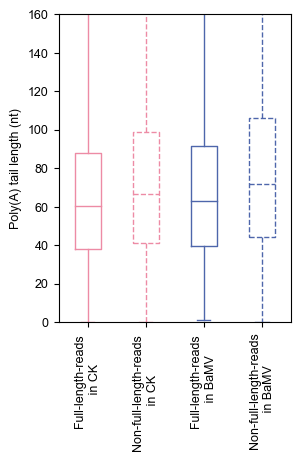

In [ ]:
fig, ax = plt.subplots(1,1, figsize=(3,4))
box = ax.boxplot(values, labels=labels, showfliers=False)
########
#colors = ["c", "c", "firebrick", "firebrick", "orange", "orange"]
#colors_w = ["c", "c", "c", "c","firebrick", "firebrick","firebrick", "firebrick", "orange", "orange","orange", "orange"]
#colors=["orangered","orangered","dodgerblue", "dodgerblue"]
#colors_w=["orangered","orangered","orangered","orangered","dodgerblue", "dodgerblue","dodgerblue", "dodgerblue"]
colors=['#ed8ba5','#ed8ba5','#4e66ab','#4e66ab']
colors_w=['#ed8ba5','#ed8ba5','#ed8ba5','#ed8ba5','#4e66ab','#4e66ab','#4e66ab','#4e66ab']
########
for patch, color in zip(box["medians"], colors):
    patch.set_color(color)
for patch, color in zip(box["boxes"], colors):
    patch.set_color(color)
for patch, color in zip(box["whiskers"], colors_w):
    patch.set_color(color)
for patch, color in zip(box["caps"], colors_w):
    patch.set_color(color)
for n in [1,3]:
    box["boxes"][n].set_linestyle('--')
    box["medians"][n].set_linestyle('--')
for n in [2,3,6,7]:
    box["whiskers"][n].set_linestyle('--')
#######
#######
ax.set_ylabel("Poly(A) tail length (nt)", fontsize=9)
ax.set_xticklabels(rotation=90, labels=labels, fontsize=9)
ax.set_ylim(0,160)
plt.savefig(fp+"Full-length and NO-Full-length PAL_2.pdf", bbox_inches="tight",transparent=True)

### 6. PAL & RNA modification

In [18]:
pal_fp='/home/qq/work/lxr/DRS/script_plot/bamv/PAL/'
ck_ratio_df=pd.read_csv(fp+"bamv/FILE/ck_ratio_df",sep='\t')
bm_ratio_df=pd.read_csv(fp+"bamv/FILE/bm_ratio_df",sep='\t')
bamv_psU=pd.read_csv(fp+"bamv/FILE/bamv_pseUreanno_df_0.8cut.csv")
ck_psU=pd.read_csv(fp+"bamv/FILE/ck_pseUreanno_df_0.8cut.csv")
smg_bm_geneid=pd.read_csv('/home/qq/work/lxr/DRS/script_plot/bamv/m6A/smg_bm_geneid.csv')
diff_polya=pd.read_csv(pal_fp+'Differential PAL in BaMV.csv',index_col=0)
bm_ck_site=pd.read_csv('/home/qq/work/lxr/DRS/script_plot/bamv/bm_ck_site.csv',index_col=0)

NameError: name 'fp' is not defined

In [8]:
anno_cds_level_groups = anno_cds_level.groupby(["gene_name", "label_group"])
# re-scale the widths of the 5'UTR and 3'UTR relative to the CDS (which is set constant to a width of 1 unit)
# 1.calculate a simple scale factor (SF)
utr5p_sf = (
    anno_gene_level.total_utr5p_length.dropna().median()
    / anno_gene_level.total_cds_length.dropna().median()
)
utr3p_sf = (
    anno_gene_level.total_utr3p_length.dropna().median()
    / anno_gene_level.total_cds_length.dropna().median()
)
# 2.The SF for the 5'UTR is 0.18 and for the 3'UTR is 0.34. Next, the following code rescales these relatively position accordingly
# re_bm_ratio_df = get_rel_pos_and_rescale(
#     bm_ratio_df, anno_gene_level, anno_cds_level_groups
# )
# re_ck_ratio_df = get_rel_pos_and_rescale(
#     ck_ratio_df, anno_gene_level, anno_cds_level_groups
# )

In [ ]:
diff_polya

In [11]:
a=bamv_psU[bamv_psU.gene_name.isin(set(set(bamv_psU.gene_name) - set(ck_psU.gene_name) ) & set(diff_polya[diff_polya['mark'].isin(['Up', 'Normal', 'Down'])].gene_name))]
#b=bm_ck_site[(bm_ck_site['gene_name'].isin(diff_polya[diff_polya['mark']!='None'].index)) & (bm_ck_site['diff_label']!='stable')]
b=bm_ck_site[(bm_ck_site['gene_name'].isin(diff_polya[diff_polya['mark'].isin(['Up', 'Normal', 'Down'])].gene_name)) & (bm_ck_site['gene_name'].isin(smg_bm_geneid.id))]

In [10]:
diff_polya['mark'].unique()

array([nan, 'Up', 'Normal', 'Down'], dtype=object)

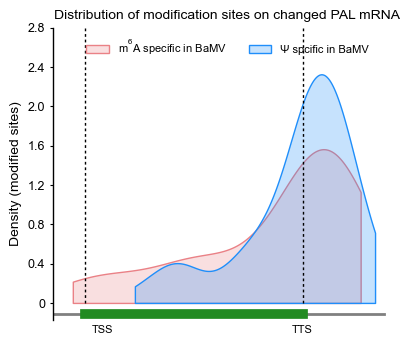

In [13]:

f, ax = plt.subplots(figsize=(4.5, 3.8))
# f, ax = plt.subplots(1,1,figsize=(10, 6))
#sns.set_style('ticks')
tss = utr5p_sf
tts = utr5p_sf + 1
end = utr5p_sf + utr3p_sf + 1


scale_ls_x = np.linspace(0, 1.6, 8)
index_ls_x = ["","TSS","","","","TTS","",""]
plt.xticks(scale_ls_x, index_ls_x,fontsize=8)

ax.set_ylim(-0.15,2.4)
# ax.set_xlim(-0.1,1.6)

ax.plot([tss, tss], [0, 2.4], linestyle=(0, (2, 2)), lw=1, color="black")
ax.plot([tts, tts], [0, 2.4], linestyle=(0, (2, 2)), lw=1, color="black")
ax.plot([0, end], [-0.1, -0.1], lw=2, color="grey")
ax.plot([tss, tts], [-0.1, -0.1], lw=7, color="forestgreen")

sns.kdeplot(
    a.rel_pos.dropna(),
    fill=True,
    cut=0,
    color='#ea8186',
    label="$\mathregular{m^6A}$ specific in BaMV",
    ax=ax,
)

sns.kdeplot(
    b.rel_pos.dropna(),
    fill=True,
    cut=0,
    color='#1f8efa',
    label="Ψ spcific in BaMV",
    ax=ax
)

# sns.kdeplot(
#     re_bm_ratio_df.rel_pos.dropna(),
#     fill=True,
#     cut=0,
#     color='#4e66ab',#"#e45f4d",
#     label="BaMV",
#     ax=ax,
# )


ax.legend(
    loc="upper center",
    fontsize=8,
    frameon=False,
    mode=None,
    ncol=4,
    #bbox_to_anchor=(0.1, 0.65, 0.8, 0.8),
)
ax=plt.gca()
ax.xaxis.set_tick_params(size=0)
ax.yaxis.set_tick_params(size=2)
#ax.yaxis.set_tick_params(length=1.5)
ax.grid(False)
ax.spines['bottom'].set_linewidth(0)
ax.spines['left'].set_linewidth(1)
ax.spines['right'].set_linewidth(0)
ax.spines['top'].set_linewidth(0)

ax.set_xlim(0,1.6)
# ax.set_ylim(-0.15,2.8)
ax.set_ylabel("Density (modified sites)", fontsize=10)
ax.set_xlabel('')
ax.set_yticks(np.linspace(0,2.4,8),[0,.4,.8,1.2,1.6,2.0,2.4,2.8],fontsize=9)
ax.set_title('Distribution of modification sites on changed PAL mRNA',fontsize=10)

plt.savefig(
    pal_fp+"Figure4.5_metagene_PAL_change_specificmodsites(nosig)_distribution.pdf",
    format="pdf",
    dpi=600,
    bbox_inches="tight",
)
##PAL change modified
plt.show()

## 08 Multilayer regulation

### 1. each changed factor after BaMV infection

In [6]:
fp='/home/qq/work/lxr/DRS/script_plot/'

In [7]:
ck_polya=pd.read_csv(fp+"bamv/FILE/ck_gene_median_mean_polya_length.csv")
bm_polya=pd.read_csv(fp+"bamv/FILE/bm_gene_median_mean_polya_length.csv")
ck_ratio_df=pd.read_csv(fp+"bamv/FILE/ck_ratio_df",sep='\t')
bm_ratio_df=pd.read_csv(fp+"bamv/FILE/bm_ratio_df",sep='\t')
bm_pseU=pd.read_csv(fp+"bamv/FILE/bamv_pseUreanno_df_0.8cut.csv")
ck_pseU=pd.read_csv(fp+"bamv/FILE/ck_pseUreanno_df_0.8cut.csv")
rna=pd.read_csv("/home/qq/work/lxr/DRS/wig/rnaseq_Dla_wig/deseq2_bamv_ck_res_1.5.csv")
pro=pd.read_csv("/home/qq/work/lxr/DRS/wig/rnaseq_Dla_wig/pro_abundance.csv",index_col=0)
bm_ck_site=pd.read_csv(fp+'bamv/FILE/bm_ck_site.csv',index_col=0)
bm_pac = pd.read_csv('/home/qq/work/lxr/DRS/script_plot/bamv/dla_pas_bm_rpm.csv')
ck_pac = pd.read_csv('/home/qq/work/lxr/DRS/script_plot/bamv/dla_pas_ck_rpm.csv')

In [8]:
bm_pac = pd.read_csv('/home/qq/work/lxr/DRS/script_plot/bamv/dla_pas_bm_rpm.csv')
ck_pac = pd.read_csv('/home/qq/work/lxr/DRS/script_plot/bamv/dla_pas_ck_rpm.csv')

In [9]:
dla_pas_bm_ck=pd.read_csv('/home/qq/work/lxr/DRS/script_plot/bamv/dla_pas_bm_ck_2.csv',sep='\t')
diff_polya=pd.read_csv('/home/qq/work/lxr/DRS/script_plot/bamv/PAL/Differential PAL in BaMV.csv',index_col=0)

In [9]:
bm_ck_site

,ck_mod_num,ck_total_num,bamv_mod_num,bamv_total_num,ck_unmod_num,bamv_unmod_num,pvalue,ck_ratio,bm_ratio,fc,fc_2,gene_name,diff_label,motif,pos,distance,rel_pos,label_group
id,,,,,,,,,,,,,,,,,,
evm.model.FRAGSCAFF_173.799_31202259,11,18,0,0,7,0,1.000000,0.611111,NaN,NaN,NaN,evm.model.FRAGSCAFF_173.799,stable,GAACA,31202259,828.0,0.696157,cds
evm.model.FRAGSCAFF_173.799_31203033,17,60,0,0,43,0,1.000000,0.283333,NaN,NaN,NaN,evm.model.FRAGSCAFF_173.799,stable,GGACA,31203033,1489.0,1.133326,cds
evm.model.FRAGSCAFF_173.799_31203098,22,65,6,26,43,20,0.451323,0.338462,0.230769,0.681818,-0.107692,evm.model.FRAGSCAFF_173.799,stable,AAACC,31203098,42.0,1.163478,utr3p
evm.model.FRAGSCAFF_173.799_31203616,21,100,9,38,79,29,0.817880,0.210000,0.236842,1.127820,0.026842,evm.model.FRAGSCAFF_173.799,stable,AAACA,31203616,560.0,1.347740,utr3p
evm.model.ORIGINAL_1673.113_33575264,9,14,0,0,5,0,1.000000,0.642857,NaN,NaN,NaN,evm.model.ORIGINAL_1673.113,stable,GAACT,33575264,2260.0,0.934079,cds
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
evm.model.ORIGINAL_979.17_21579365,0,0,7,28,0,21,1.000000,NaN,0.250000,NaN,NaN,evm.model.ORIGINAL_979.17,stable,GGACT,21579365,784.0,0.960132,cds
evm.model.ORIGINAL_1794.88.1_25461474,0,0,7,7,0,0,1.000000,NaN,1.000000,NaN,NaN,evm.model.ORIGINAL_1794.88.1,stable,GGACT,25461474,961.0,1.465943,utr3p
evm.model.FRAGSCAFF_232.291_56037447,0,0,6,13,0,7,1.000000,NaN,0.461538,NaN,NaN,evm.model.FRAGSCAFF_232.291,stable,GGACT,56037447,624.0,0.819506,cds


In [132]:
def mod_s(gene,pos):
    return gene+'_'+str(pos)

In [133]:
bm_pseU['id']=bm_pseU.apply(lambda row : mod_s(row['gene_name'],row['pos']),axis=1)
ck_pseU['id']=ck_pseU.apply(lambda row : mod_s(row['gene_name'],row['pos']),axis=1)

In [134]:
bm_specific=set(bm_pseU['pos'])-set(ck_pseU['pos'])
ck_specific=set(ck_pseU['pos'])-set(bm_pseU['pos'])

In [135]:
bm_sms = set(bm_ratio_df.gene_name)-set(ck_ratio_df.gene_name)
ck_sms = set(ck_ratio_df.gene_name)-set(bm_ratio_df.gene_name)

In [136]:
m6A_gene = set(bm_ck_site[bm_ck_site['diff_label']!='stable'].gene_name) | set(bm_sms) | set(ck_sms)
pseu_gene= set(set(ck_pseU.gene_name) - set(bm_pseU.gene_name)) | set(set(bm_pseU.gene_name) - set(ck_pseU.gene_name))
#polya_gene =set(diff_polya[diff_pola['mark']!='None'].index)
polya_gene =set(diff_polya[diff_polya['mark'].isin(['Up','Down'])].gene_name)
apa_gene = set(dla_pas_bm_ck[dla_pas_bm_ck['type']!='unchange'].gene_name)
rna_gene=set(rna[rna['sig']!='none'].transcript)
pro_gene=set(pro[pro['Dla1_(FC_1.5_label)']!='stable'].index)

In [137]:
def get_intersection(set1,set2):
    return int(len(set1& set2))

In [138]:
# factors_d={'m6A':r'm^6A','pseu':'Ψ','polya':'PAL','apa':"APA",'rna':'mRNA','pro':'Protein'}
# factors=['m6A','Ψ','PAL',"APA",'Transcript','Protein']
factors_d={'m6A':'m6A','Ψ':'pseu','PAL':'polya',"APA":'apa','Transcript':'rna','Protein':'pro'}
factors=['m6A','pseu','polya','apa','rna','pro']
intersection_matrix={}
for i in range(len(factors)):
    for j in range(i+1,len(factors)):
        if j <=5:
            print(factors[i],factors[j])
            intersection_matrix[
            (factors[i],factors[j])]=get_intersection(eval(factors[i]+'_gene'),eval(factors[j]+'_gene'))

m6A pseu
m6A polya
m6A apa
m6A rna
m6A pro
pseu polya
pseu apa
pseu rna
pseu pro
polya apa
polya rna
polya pro
apa rna
apa pro
rna pro


In [139]:
df=pd.DataFrame(np.zeros((len(factors),len(factors))),columns=factors,index=factors)
for (factor1,factor2),value in intersection_matrix.items():
    df.loc[factor1,factor2]=value
    df.loc[factor2,factor1]=value ##生成对称矩阵
# for i in factors:
#     df.loc[i,i]=int(len(eval(i+'_gene')))
df.index=factors_d.keys()
df.columns=factors_d.keys()

# df.loc['m6A','m6A']=int(len(m6A_gene-set(pseu_gene | polya_gene | apa_gene | rna_gene | pro_gene)))
# df.loc['Ψ','Ψ']=int(len(pseu_gene-set(m6A_gene | polya_gene | apa_gene | rna_gene | pro_gene)))
# df.loc['PAL','PAL']=int(len(polya_gene-set(pseu_gene | m6A_gene | apa_gene | rna_gene | pro_gene)))
# df.loc['APA','APA']=int(len(apa_gene-set(pseu_gene | m6A_gene | polya_gene | rna_gene | pro_gene)))
# df.loc['Transcript','Transcript']=int(len(rna_gene-set(pseu_gene | m6A_gene | polya_gene | apa_gene | pro_gene)))
# df.loc['Protein','Protein']=int(len(pro_gene-set(pseu_gene | m6A_gene | polya_gene | apa_gene | rna_gene)))


df.loc['m6A','m6A']=int(len(m6A_gene))
df.loc['Ψ','Ψ']=int(len(pseu_gene))
df.loc['PAL','PAL']=int(len(polya_gene))
df.loc['APA','APA']=int(len(apa_gene))
df.loc['Transcript','Transcript']=int(len(rna_gene))
df.loc['Protein','Protein']=int(len(pro_gene))
gene_counts=df.sum(axis=0)
df=df.round().astype(int) 

In [140]:
bar_dat=pd.DataFrame({'Factor':factors_d.keys(),'Num':[len(m6A_gene),len(pseu_gene),len(polya_gene),len(apa_gene),len(rna_gene),len(pro_gene)]})

In [141]:
mul_fp='/home/qq/work/lxr/DRS/script_plot/bamv/FILE/'

In [142]:
df.merge(bar_dat,left_index=True,right_on='Factor').to_csv(mul_fp+'factors_num_heatmapdat_2.csv',index=False)

<Figure size 500x400 with 0 Axes>

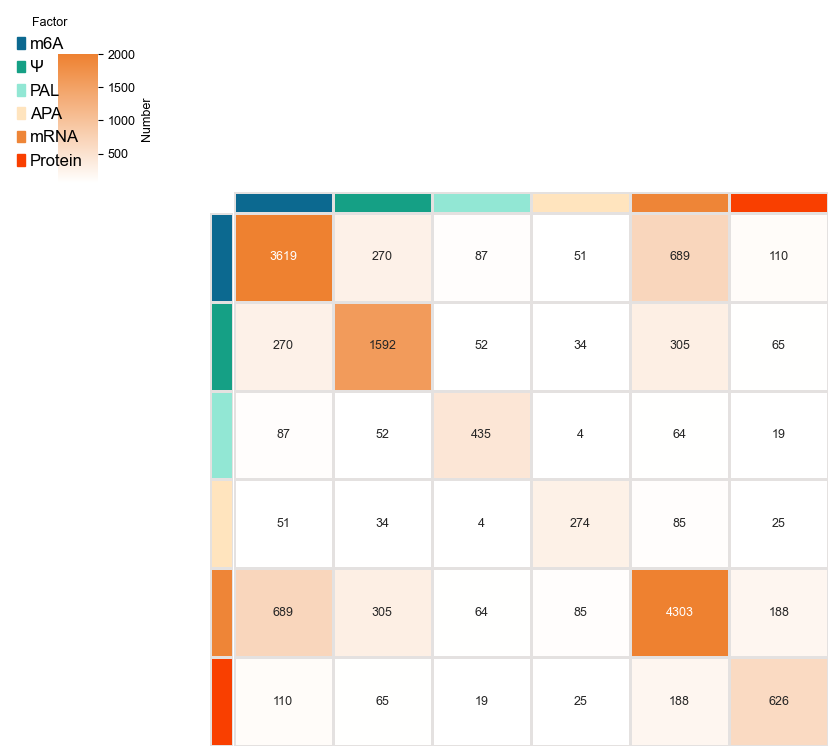

In [143]:
import matplotlib.colors as mcolors
colors={'m6A':'#0c6990','Ψ':'#15a085','PAL':'#92e7d4','APA':'#ffe4be','mRNA':'#ee8537','Protein':'#f93f00'}
# Create a custom color palette from white to deep orange
colors_hm = ["white", "#ee8130"]  # Custom gradient from white to orange
cmap = mcolors.LinearSegmentedColormap.from_list("custom_orange", colors_hm)
fig=plt.figure(figsize=(5,4))
sns.clustermap(df,figsize=(8,7.2),annot=True,fmt='d',vmin=50,vmax=2000,cmap=cmap,yticklabels=False,xticklabels=False,
               cbar_kws={'label':'Number'},linewidths=2,col_cluster=False,row_cluster=False,
            row_colors=list(colors.values()), linecolor='#e4e1e0',
            col_colors=list(colors.values()),cbar_pos=(0.02, 0.8, 0.05, 0.18))
legend_element=[mpatches.Patch(color=color,label=factor) for factor,color in colors.items()]
plt.legend(handles=legend_element,loc='lower right',title='Factor',fontsize=12,handlelength=0.5,handletextpad=0.3,frameon=False)
plt.savefig(mul_fp+'factors_num_heatmapdat_3.pdf',bbox_inches='tight',transparent='True')


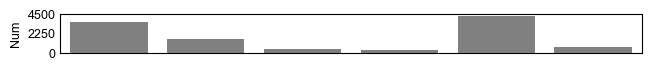

In [144]:
plt.figure(figsize=(7.5,0.5))
sns.barplot(x=bar_dat['Factor'],y=bar_dat['Num'],color='grey')
plt.ylim(0,4500)
plt.yticks(np.linspace(0,4500,3))
plt.xlabel('')
plt.xticks(np.arange(0,6),labels=[])
plt.tick_params(length=0)
plt.savefig(mul_fp+'factors_num_heatmapdat_bar.pdf',bbox_inches='tight',transparent='True')

In [145]:
diff_gene_all=set(bm_ck_site[bm_ck_site['diff_label']!='stable'].gene_name)

In [146]:
def mod_s(gene,pos):
    return gene+'_'+str(pos)

In [147]:
bm_ratio_df['id']=bm_ratio_df.apply(lambda row : mod_s(row['gene_name'],row['position']),axis=1)
ck_ratio_df['id']=ck_ratio_df.apply(lambda row : mod_s(row['gene_name'],row['position']),axis=1)
bm_sms = set(bm_ratio_df['id'])-set(ck_ratio_df['id'])
ck_sms = set(ck_ratio_df['id'])-set(bm_ratio_df['id'])

In [148]:
bm_specific_anddiff=bm_ck_site[bm_ck_site['gene_name'].isin(set(bm_ratio_df[bm_ratio_df.id.isin(bm_sms)].gene_name)) & (bm_ck_site['diff_label']!='stable')]
ck_specific_anddiff=bm_ck_site[bm_ck_site['gene_name'].isin(set(ck_ratio_df[ck_ratio_df.id.isin(ck_sms)].gene_name)) & (bm_ck_site['diff_label']!='stable')]

In [149]:
bm_specificandiff=[]
ck_specificandiff=[]
bm_specific_gene=[]
ck_specific_gene=[]
for gene,temp in bm_ck_site[bm_ck_site['gene_name'].isin(set(bm_ratio_df[bm_ratio_df.id.isin(bm_sms)].gene_name))& ~(bm_ck_site['gene_name'].isin(set(ck_ratio_df[ck_ratio_df.id.isin(ck_sms)].gene_name)))].groupby('gene_name'):
    if 'up' in temp['diff_label'].unique() or 'down' in temp['diff_label'].unique():
        bm_specificandiff.append(gene)
    elif 'up' not in temp['diff_label'].unique() and  'down' not in temp['diff_label'].unique():
        bm_specific_gene.append(gene)
for gene,temp in bm_ck_site[bm_ck_site['gene_name'].isin(set(ck_ratio_df[ck_ratio_df.id.isin(ck_sms)].gene_name)) & ~(bm_ck_site['gene_name'].isin(set(bm_ratio_df[bm_ratio_df.id.isin(bm_sms)].gene_name)))].groupby('gene_name'):
    if 'up' in temp['diff_label'].unique() or 'down' in temp['diff_label'].unique():
        ck_specificandiff.append(gene)
    elif 'up' not in temp['diff_label'].unique() and  'down' not in temp['diff_label'].unique():
        ck_specific_gene.append(gene)

In [150]:
len(ck_specificandiff)

165

In [151]:
ck_specific=bm_ck_site[bm_ck_site['gene_name'].isin(set(ck_ratio_df[ck_ratio_df.id.isin(ck_sms)].gene_name)) & (bm_ck_site['diff_label']=='stable')]
bm_specific=bm_ck_site[bm_ck_site['gene_name'].isin(set(bm_ratio_df[bm_ratio_df.id.isin(bm_sms)].gene_name)) & (bm_ck_site['diff_label']=='stable')]

In [152]:
bm_smg = set(bm_ratio_df['gene_name'])-set(ck_ratio_df['gene_name'])-diff_gene_all
ck_smg = set(ck_ratio_df['gene_name'])-set(bm_ratio_df['gene_name'])-diff_gene_all

In [153]:
def get_gene_from_id(id):
    gene_s=id.split('_')[:-1]
    return '_'.join(gene_s)

In [154]:
len(set(bm_specific_anddiff.gene_name))

264

In [155]:
len(set(bm_specific.gene_name) & set(bm_specific_anddiff.gene_name))

264

In [156]:
m6A_gene_ty={'Differential':len(diff_gene_all-set(set(ck_specificandiff) | set(bm_specificandiff))),
            'CK specific':len(set(ck_specific_gene)),
            'BaMV specific':len(set(bm_specific_gene)), #只包含bamv的特异位点不包含ck的特异位点
            'CK specific & Differential':len(set(ck_specificandiff)),
            'BaMV specific & Differential':len(set(bm_specificandiff)),
            'Common':len(set(set(bm_ratio_df.gene_name) | set(ck_ratio_df.gene_name))-diff_gene_all-set(ck_specific_gene)-set(bm_specific_gene)),
            'Other':len(gff_data.keys())-
            len(set(set(bm_ratio_df.gene_name) | set(ck_ratio_df.gene_name)))
            }

In [157]:
m6A_gene_ty

{'Differential': 281,
 'CK specific': 2305,
 'BaMV specific': 3741,
 'CK specific & Differential': 165,
 'BaMV specific & Differential': 156,
 'Common': 2792,
 'Other': 58210}

In [158]:
pseU_gene_ty={'CK specific':len(set(ck_pseU.gene_name) - set(bm_pseU.gene_name)),
                'BaMV specific':len(set(bm_pseU.gene_name)-set(ck_pseU.gene_name)),
                'Common':len(set(bm_pseU.gene_name)& set(ck_pseU.gene_name)),
                'Unmodified':len(gff_data)-len(set(bm_pseU.gene_name)|set(ck_pseU.gene_name))}

In [160]:
polya_gene_ty={'Differential':len(set(diff_polya[diff_polya['mark'].isin(['Up','Down'])].gene_name)),
               'Not significant':len(set(diff_polya[~diff_polya['mark'].isin(['Up','Down'])].gene_name)),
               'Other':len(gff_data)-len(set(diff_polya.gene_name))}
apa_gene_ty={'Differential':len(set(dla_pas_bm_ck[dla_pas_bm_ck['type']!='unchange'].gene_name)),
             'Not significant':len(set(dla_pas_bm_ck[dla_pas_bm_ck['type']=='unchange'].gene_name)),
             'BaMV specific':len(set(bm_pac.gene_name)-set(ck_pac.gene_name)), #不具有共有基因的BaMV组内基因发生远端近端变化
             'CK specific':len(set(ck_pac.gene_name)-set(bm_pac.gene_name)),
             'Other':len(gff_data)-len(set(bm_pac.gene_name) | set(ck_pac.gene_name))}

In [161]:
rna_gene_ty={'Differential':len(rna[rna['sig'].isin(['up','down'])]),
               'Not significant':len(set(rna[rna['sig']=='none']['transcript'])),
               'Other':len(gff_data)-len(set(rna['transcript']))}

In [162]:
pro_gene_ty={'Differential':len(pro[pro['Dla1_(FC_1.5_label)'].isin(['up','down'])].index),
             'Not significant':len(pro[pro['Dla1_(FC_1.5_label)']=='stable'].index),
             'Other':len(gff_data)-len(pro.index)}

In [163]:
t_df=pd.DataFrame.from_dict(m6A_gene_ty,orient='index',columns=['num']).reset_index()

In [164]:
ty_colors={'Differential':'#f73f01','BaMV specific':'#ee8130','CK specific':'#15a085','BaMV specific & Differential':'#ffe4bc','CK specific & Differential':'#0c6990','Common':'#92e7d4','Unmodified':'#bebebe','Not significant':'#8aadb8','Other':'#bebebe'}

m6A
[Text(1.1998978303468784, 0.01565875885419725, '0.4%'), Text(1.1893798860340328, 0.159296850871795, '3.4%'), Text(1.0986662743591862, 0.48263072590305, '5.5%'), Text(0.9935760572540101, 0.6729090714588235, '0.2%'), Text(0.9834350542210423, 0.6876448895536528, '0.2%'), Text(0.8803874780753459, 0.8154249741381069, '4.1%'), Text(-1.0865268538531536, -0.5093715695403185, '86.0%')]
pseU
[Text(1.19785047292775, 0.07179306726116337, '1.9%'), Text(1.1892748023240385, 0.16007949449295122, '0.4%'), Text(1.170932348604609, 0.26252130388083567, '2.3%'), Text(-1.1871252781459678, -0.1753099369313063, '95.3%')]
polya
[Text(1.1997551328560414, 0.024240899025870306, '0.6%'), Text(0.9999140382506048, 0.663454532058805, '17.4%'), Text(-1.0131122201066312, -0.6431202294055233, '82.0%')]
apa
[Text(1.1999028456932106, 0.015269606980377505, '0.4%'), Text(1.1994414477123805, 0.036608926638576046, '0.2%'), Text(1.1985571952470242, 0.058827287219339316, '0.4%'), Text(1.193367111889443, 0.12599577874139015,

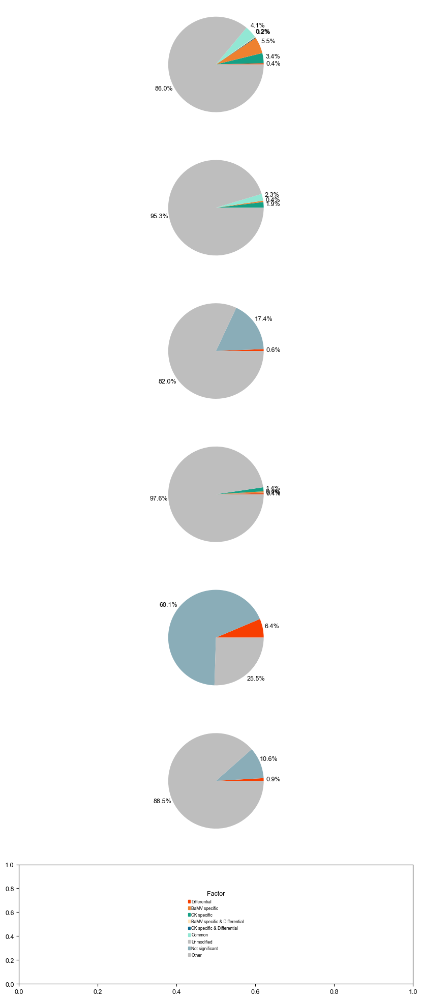

In [165]:
fig,ax=plt.subplots(7,1,figsize=(10,25))
factors_l=['m6A','pseU','polya','apa','rna','pro']
for i in range(len(factors_l)):
    dat=eval(factors_l[i]+'_gene_ty')
    n=len(dat)
    print(factors_l[i])
    #print(factors_l[i],plot_dat.colors)
    # Explode the slices (offset them slightly to avoid overlapping labels)
    explode = (0.1,)*n  # "explode" all slices slightly
    plot_dat=pd.DataFrame.from_dict(dat,orient='index',columns=['num']).reset_index()
    plot_dat['colors']=plot_dat['index'].map(ty_colors)
    wedges, texts, autotexts =ax[i].pie(x=plot_dat.num,autopct='%1.1f%%',colors=plot_dat['colors'],
               startangle=0,pctdistance=1.2,labeldistance=50.01)
    print(autotexts)
    # Add lines connecting labels to slices
    labels=list(dat.keys())
    for j, wedge in enumerate(wedges):
        angle = (wedge.theta2 - wedge.theta1) / 2. + wedge.theta1
        x = (1.1 * (wedge.r + 0.1)) * np.cos(np.radians(angle))  # Position of label
        y = (1.1 * (wedge.r + 0.1)) * np.sin(np.radians(angle))
        #ax[i].text(x, y, labels[j], ha='center', va='center', fontsize=12, color='black')

legend_element=[mpatches.Patch(color=color,label=factor) for factor,color in ty_colors.items()]
ax[6].legend(handles=legend_element,loc='center',title='Factor',fontsize=6,handlelength=0.5,handletextpad=0.3,frameon=False)
plt.savefig(mul_fp+'pie_typegene_2.pdf')

In [166]:
all_factor_gene=set(bm_ck_site.gene_name)|set(bm_pac.gene_name)|set(ck_pac.gene_name)|set(bm_polya.gene_name)|set(ck_polya.gene_name)|set(bm_pseU.gene_name)|set(ck_pseU.gene_name)|set(rna.transcript)|set(pro.dropna().index)


In [167]:
all_factor_gene_df=pd.DataFrame({'gene_name':list(all_factor_gene)})

In [168]:
m6A_gene_changety={'Differential':diff_gene_all-set(set(ck_specificandiff) | set(bm_specificandiff)),
            'CK specific':set(ck_specific_gene),
            'BaMV specific':set(bm_specific_gene), #只包含bamv的特异位点不包含ck的特异位点
            'CK specific & Differential':set(ck_specificandiff),
            'BaMV specific & Differential':set(bm_specificandiff)}
pseu_gene_changety={'CK specific':set(ck_pseU.gene_name) - set(bm_pseU.gene_name),
                'BaMV specific':set(bm_pseU.gene_name)-set(ck_pseU.gene_name)}
polya_gene_changety={'Longer':set(diff_pola[diff_pola['mark'].isin(['Up'])].gene_name),
               'Shorter':set(diff_pola[diff_pola['mark'].isin(['Down'])].gene_name)}
apa_gene_changety={'Distal':set(dla_pas_bm_ck[dla_pas_bm_ck['type']=='distal'].gene_name),
             'Proximal':set(dla_pas_bm_ck[dla_pas_bm_ck['type']=='proximal'].gene_name)}
rna_gene_changety={'Up':set(rna[rna['sig'].isin(['up'])].transcript),
             'Down':set(rna[rna['sig'].isin(['down'])].transcript),}
pro_gene_changety={'Up':set(pro[pro['Dla1_(FC_1.5_label)'].isin(['up'])].index),
                   'Down':set(pro[pro['Dla1_(FC_1.5_label)'].isin(['down'])].index)}

In [169]:
m6A_gene_changety

{'Differential': {'evm.model.FRAGSCAFF_1.45',
  'evm.model.FRAGSCAFF_112.63',
  'evm.model.FRAGSCAFF_119.151',
  'evm.model.FRAGSCAFF_120.141',
  'evm.model.FRAGSCAFF_120.212',
  'evm.model.FRAGSCAFF_121.229',
  'evm.model.FRAGSCAFF_121.367',
  'evm.model.FRAGSCAFF_121.539',
  'evm.model.FRAGSCAFF_123.139',
  'evm.model.FRAGSCAFF_127.644',
  'evm.model.FRAGSCAFF_128.244',
  'evm.model.FRAGSCAFF_128.302',
  'evm.model.FRAGSCAFF_129.1004.2',
  'evm.model.FRAGSCAFF_129.1078',
  'evm.model.FRAGSCAFF_129.1195',
  'evm.model.FRAGSCAFF_129.1577',
  'evm.model.FRAGSCAFF_129.1629',
  'evm.model.FRAGSCAFF_129.1700',
  'evm.model.FRAGSCAFF_129.454',
  'evm.model.FRAGSCAFF_132.17',
  'evm.model.FRAGSCAFF_132.24',
  'evm.model.FRAGSCAFF_133.253.1',
  'evm.model.FRAGSCAFF_133.289',
  'evm.model.FRAGSCAFF_133.31',
  'evm.model.FRAGSCAFF_143.190.1',
  'evm.model.FRAGSCAFF_146.335',
  'evm.model.FRAGSCAFF_149.296',
  'evm.model.FRAGSCAFF_149.554',
  'evm.model.FRAGSCAFF_154.153',
  'evm.model.FRAGSCAFF

In [170]:
df_cols=[]
for i in factors:
    dat=eval(i+'_gene_changety')
    for j in dat.keys():
        col=i+'_'+j
        df_cols.append(col)

In [171]:
def get_intersection(set1,set2):
    return int(len(set1& set2))

In [172]:
intersection_matrix={}
for i in df_cols:
    for j in df_cols:
        intersection_matrix[i,j]=get_intersection(eval(i.split('_')[0]+'_gene_changety')[i.split('_')[1]],eval(j.split('_')[0]+'_gene_changety')[j.split('_')[1]])

In [173]:
intersection_matrix.items()

dict_items([(('m6A_Differential', 'm6A_Differential'), 281), (('m6A_Differential', 'm6A_CK specific'), 0), (('m6A_Differential', 'm6A_BaMV specific'), 0), (('m6A_Differential', 'm6A_CK specific & Differential'), 0), (('m6A_Differential', 'm6A_BaMV specific & Differential'), 0), (('m6A_Differential', 'pseu_CK specific'), 23), (('m6A_Differential', 'pseu_BaMV specific'), 9), (('m6A_Differential', 'polya_Longer'), 6), (('m6A_Differential', 'polya_Shorter'), 2), (('m6A_Differential', 'apa_Distal'), 10), (('m6A_Differential', 'apa_Proximal'), 8), (('m6A_Differential', 'rna_Up'), 8), (('m6A_Differential', 'rna_Down'), 73), (('m6A_Differential', 'pro_Up'), 3), (('m6A_Differential', 'pro_Down'), 17), (('m6A_CK specific', 'm6A_Differential'), 0), (('m6A_CK specific', 'm6A_CK specific'), 2305), (('m6A_CK specific', 'm6A_BaMV specific'), 0), (('m6A_CK specific', 'm6A_CK specific & Differential'), 0), (('m6A_CK specific', 'm6A_BaMV specific & Differential'), 0), (('m6A_CK specific', 'pseu_CK speci

In [174]:
df=pd.DataFrame(np.zeros((len(df_cols),len(df_cols))),columns=df_cols,index=df_cols)
for (factor1,factor2),value in intersection_matrix.items():
    df.loc[factor1,factor2]=value

In [175]:
df=df.round().astype(int)

In [176]:
df_cols

['m6A_Differential',
 'm6A_CK specific',
 'm6A_BaMV specific',
 'm6A_CK specific & Differential',
 'm6A_BaMV specific & Differential',
 'pseu_CK specific',
 'pseu_BaMV specific',
 'polya_Longer',
 'polya_Shorter',
 'apa_Distal',
 'apa_Proximal',
 'rna_Up',
 'rna_Down',
 'pro_Up',
 'pro_Down']

In [177]:
colors={}
for i in df_cols:
    if 'm6A' in i:
        colors[i]='#0c6990'
    elif 'pseu' in i:
        colors[i]='#15a085'
    elif 'polya' in i:
        colors[i]='#92e7d4'
    elif 'apa' in i:
        colors[i]='#ffe4be'
    elif 'rna' in i:
        colors[i]='#ee8537'
    else:
        colors[i]='#f93f00'

In [178]:
df.to_csv(mul_fp+'factors_changetype_heatmapdat.csv')
bar_dat.to_csv(mul_fp+'factors_changetype_heatmap_barplotdat.csv')

In [ ]:
fp='F:\\project\\DRS\\result\\10_regulate\\'
df=pd.read_csv(fp+'factors_changetype_heatmapdat.csv',index_col=0)
bar_dat=pd.read_csv(fp+'factors_changetype_heatmap_barplotdat.csv')

<Figure size 500x400 with 0 Axes>

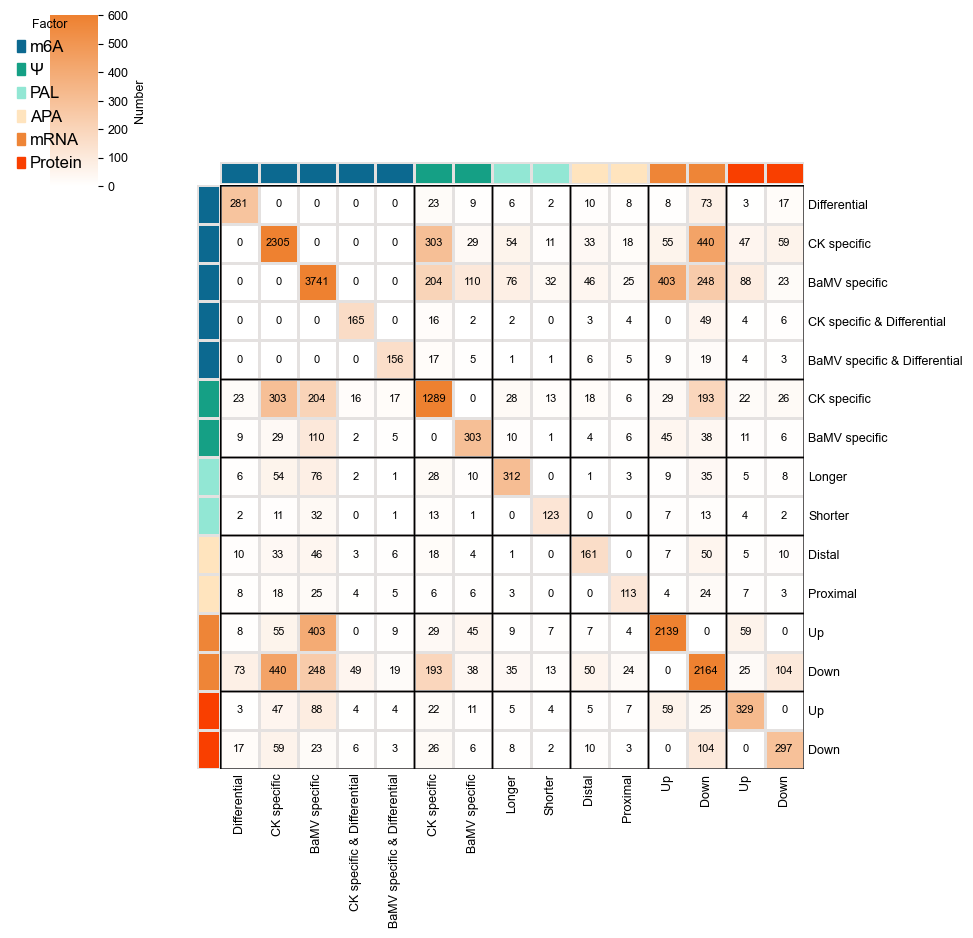

In [181]:
import matplotlib.colors as mcolors
from matplotlib.patches import Rectangle
colors_2={'m6A':'#0c6990','Ψ':'#15a085','PAL':'#92e7d4','APA':'#ffe4be','mRNA':'#ee8537','Protein':'#f93f00'}
# Create a custom color palette from white to deep orange
colors_hm = ["white", "#ee8130"]  # Custom gradient from white to orange
cmap = mcolors.LinearSegmentedColormap.from_list("custom_orange", colors_hm)
fig=plt.figure(figsize=(5,4))
g=sns.clustermap(df,figsize=(9.5,9.5),annot=True,fmt='d',vmin=0,vmax=600,cmap=cmap,yticklabels=[i.split('_')[1] for i in df_cols],xticklabels=[i.split('_')[1] for i in df_cols],
               cbar_kws={'label':'Number'},linewidths=0.9,col_cluster=False,row_cluster=False,
            row_colors=list(colors.values()), linecolor='#e4e1e0', annot_kws={"size": 8,'color':'black'},
            col_colors=list(colors.values()),cbar_pos=(0.02, 0.8, 0.05, 0.18))
g.ax_heatmap.tick_params(length=0,axis='x')
g.ax_heatmap.tick_params(length=0,axis='y')
ax = g.ax_heatmap
# g.ax_heatmap.ticklabel_format(size=9,axis='x')
# g.ax_heatmap.ticklabel_format(size=9,axis='y')
row_group=['m6A']*5 + ['Ψ']*2+['PAL']*2+['APA']*2+['Transcript']*2+['Protein']*2
col_group=['m6A']*5 + ['Ψ']*2+['PAL']*2+['APA']*2+['Transcript']*2+['Protein']*2
group_row_indices = [i for i, group in enumerate(row_group)]
group_col_indices = [i for i, group in enumerate(col_group)]
ax.add_patch(Rectangle((0, group_row_indices[0]), len(df.columns), len(group_row_indices), 
                       linewidth=1, edgecolor='black', facecolor='none'))
ax.add_patch(Rectangle((group_col_indices[0], 0), len(group_col_indices), len(df.index), 
                       linewidth=1, edgecolor='black', facecolor='none'))
for j in ['m6A','Ψ','PAL','APA','Transcript','Protein']:
   group_row_indices = [i for i, group in enumerate(row_group) if group==j]
   group_col_indices = [i for i, group in enumerate(col_group) if group==j]
   ax.add_patch(Rectangle((0, group_row_indices[0]), len(df.columns), len(group_row_indices), 
                       linewidth=1, edgecolor='black', facecolor='none'))
   ax.add_patch(Rectangle((group_col_indices[0], 0), len(group_col_indices), len(df.index), 
                       linewidth=1, edgecolor='black', facecolor='none'))
legend_element=[mpatches.Patch(color=color,label=factor) for factor,color in colors_2.items()]
plt.legend(handles=legend_element,loc='lower right',title='Factor',fontsize=12,handlelength=0.5,handletextpad=0.3,frameon=False)
plt.savefig(fp+'factors_changetype_heatmapdat_3.pdf',bbox_inches='tight',transparent='True')


In [182]:
pd.concat([pd.DataFrame.from_dict(m6A_gene_changety,orient='index').T,pd.DataFrame.from_dict(pseu_gene_changety,orient='index').T,pd.DataFrame.from_dict(polya_gene_changety,orient='index').T,
           pd.DataFrame.from_dict(rna_gene_changety,orient='index').T,pd.DataFrame.from_dict(pro_gene_changety,orient='index').T],axis=1).to_csv(mul_fp+'each_change_gene_list.csv',index=False)

In [183]:
factors=['m6A','pseu','polya','apa','rna','pro']
cols_num={}
for i in factors:
    dat=eval(i+'_gene_changety')
    for j in dat.keys():
        col=i+'_'+j
        cols_num[i+'_'+j]=dat[j]

### 2. changed gene with multiple factors

In [184]:
factor_diffgene={'m6A':set(bm_ck_site[bm_ck_site['diff_label']!='stable'].gene_name),
    'Ψ':set(set(ck_pseU.gene_name) - set(bm_pseU.gene_name)) |set(set(bm_pseU.gene_name) - set(ck_pseU.gene_name)) ,
    'PAL':set(diff_polya[diff_polya['mark'].isin(['Up','Down'])].gene_name),
    'APA':set(dla_pas_bm_ck[dla_pas_bm_ck['type']!='unchange'].gene_name),
    'Transcript':set(rna[rna['sig'].isin(['up','down'])].transcript),
    'Protein':set(pro[pro['Dla1_(FC_1.5_label)'].isin(['up','down'])].index)}

In [185]:
factor_diffgene_ty={'m6A':{}, 'Ψ':{}, 'PAL':{}, 'APA':{}, 'Transcript':{}, 'Protein':{}}
for i in factor_diffgene.keys():
    for gene in factor_diffgene[i]:
        factor_diffgene_ty[i][gene]=[]
        for k in factor_diffgene.keys():
            if i != k and k!='Transcript' and k!='Protein':
                dat=factor_diffgene[k]
                if gene in dat:
                    factor_diffgene_ty[i][gene].append(k)

In [188]:
len(set(factor_diffgene['m6A']) & set(factor_diffgene['PAL']))

12

In [189]:
df1=pd.DataFrame.from_dict(factor_diffgene_ty,orient='index').T

In [190]:
df1

,m6A,APA,Transcript,Ψ,Protein,PAL
evm.model.ORIGINAL_5515.15,[],NaN,NaN,NaN,NaN,NaN
evm.model.FRAGSCAFF_317.241,[APA],[m6A],NaN,NaN,NaN,NaN
evm.model.FRAGSCAFF_424.270,[APA],[m6A],NaN,NaN,NaN,NaN
evm.model.FRAGSCAFF_67.109,[],NaN,NaN,NaN,NaN,NaN
evm.model.FRAGSCAFF_167.41,[],NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...
evm.model.FRAGSCAFF_50.622,NaN,NaN,NaN,NaN,[],NaN
evm.model.FRAGSCAFF_390.400,NaN,NaN,NaN,NaN,[],NaN
evm.model.ORIGINAL_2167.206,NaN,NaN,NaN,NaN,[],NaN
evm.model.FRAGSCAFF_50.559,NaN,NaN,NaN,NaN,[],NaN


In [191]:
for i in df1.columns:
    print(i, len(df1.loc[:,i].dropna()))

m6A 602
APA 274
Transcript 4303
Ψ 1592
Protein 626
PAL 435


In [192]:
def get_multiple_num(ty_list):
    if ty_list is not np.NAN:
        return len(ty_list)

In [194]:
multiple_num

,count_x,count_y,count
m6A,,,
0.0,0.805648,0.740876,0.869161
1.0,0.189369,0.248175,0.119452
2.0,0.004983,0.010949,0.011387


In [204]:
multiple_num=pd.DataFrame()
n=0
for i in df1.columns:
    n +=1
    if n ==1:
        multiple_num=pd.DataFrame(df1[i].apply(get_multiple_num).value_counts()/len(factor_diffgene[i])).rename(columns={'count':i})
    else:
        temp=pd.DataFrame(df1[i].apply(get_multiple_num).value_counts()/len(factor_diffgene[i])).rename(columns={'count':i})
        print(i,temp.index)
        multiple_num=multiple_num.merge(temp,left_index=True,right_index=True,how='outer')

APA Index([0.0, 1.0, 2.0], dtype='float64', name='APA')
Transcript Index([0.0, 1.0, 2.0], dtype='float64', name='Transcript')
Ψ Index([0.0, 1.0, 2.0], dtype='float64', name='Ψ')
Protein Index([0.0, 1.0, 2.0], dtype='float64', name='Protein')
PAL Index([0.0, 1.0, 2.0], dtype='float64', name='PAL')


In [203]:
multiple_num

,m6A,APA,Transcript,Ψ,Protein,PAL
m6A,,,,,,
0.0,0.805648,0.740876,0.869161,0.902010,0.782748,0.845977
1.0,0.189369,0.248175,0.119452,0.096734,0.201278,0.151724
2.0,0.004983,0.010949,0.011387,0.001256,0.015974,0.002299


In [206]:
pd.DataFrame(df1['m6A'].apply(get_multiple_num).value_counts()/len(factor_diffgene['m6A'])).rename(columns={'count':'m6A'})

,m6A
m6A,
0.0,0.805648
1.0,0.189369
2.0,0.004983


In [209]:
plot_dat=multiple_num.T*100
plot_dat['Factor']=plot_dat.index
custom_order=['m6A', 'Ψ', 'PAL', 'APA', 'Transcript', 'Protein']
plot_dat['Factor']=pd.Categorical(plot_dat['Factor'],categories=custom_order,ordered=True)
plot_dat=plot_dat.sort_values(by='Factor')

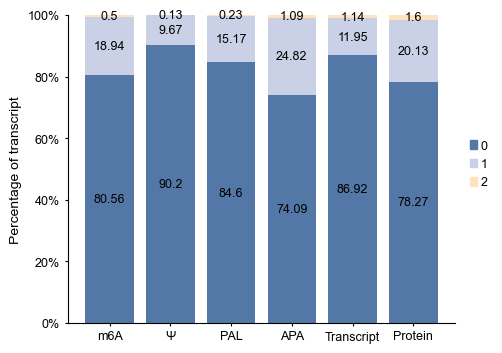

In [211]:
plt.figure(figsize=(5,4))
colors = ['#5377a7','#cad1e6','#ffe3bd']#,'#ea8186'
num_color={'0':'#5377a7','1':'#cad1e6','2':'#ffe3bd'} #,'3':'#ea8186'
num=plot_dat.columns
n=0
for i,color in zip(range(len(num)),colors):
    if n == 0 :
        bars=plt.bar(x=plot_dat['Factor'],height=plot_dat[i],color=color,label=num[i])
        for bar in bars:
            height=bar.get_height()
            if height !=0:
                plt.text(bar.get_x()+bar.get_width()/2,bar.get_y()+height/2,str(round(height,2)),fontsize=9, ha='center', va='center', color='black')
        n+=1
    else:
        y=plot_dat.iloc[:,:int(i)].apply(sum,axis=1)
        bars=plt.bar(x=plot_dat['Factor'],height=plot_dat[i],align='center',color=color,label=str(int(num[i])),bottom=y)
        n+=1
        for bar in bars:
            height=bar.get_height()
            if height !=0:
                plt.text(bar.get_x()+bar.get_width()/2,bar.get_y()+height/2,str(round(height,2)),fontsize=9, ha='center', va='center', color='black')
                
sns.despine()
plt.ylim(0,100)
plt.ylabel('Percentage of transcript',fontsize=10)
plt.tick_params(size=2)
plt.yticks(np.linspace(0,100,6),labels=['0%','20%','40%','60%','80%','100%'],fontsize=9)
plt.xticks(plot_dat.Factor,fontsize=9)
legend_element=[mpatches.Patch(color=color,label=factor) for factor,color in num_color.items()]
plt.legend(handles=legend_element,loc='lower left',title='',fontsize=9,handlelength=0.5,
           handletextpad=0.3,frameon=False,bbox_to_anchor=(1.01,0.4,2,5))
plt.savefig(mul_fp+'Factor_mutiple_change_barplot_2.pdf',bbox_inches='tight',transparent=True)

In [212]:
rna_regulate={'Transcript':{}, 'Protein':{}}
for i in ['Transcript','Protein']:
    for gene in factor_diffgene[i]:
        rna_regulate[i][gene]=[]
        for k in ['m6A','Ψ','PAL','APA']:
            #if i != k:                
            dat=factor_diffgene[k]
            if gene in dat:
                rna_regulate[i][gene].append(k)

In [213]:
df2=pd.DataFrame.from_dict(rna_regulate,orient='index').T.reset_index()

In [218]:
df2

,index,Transcript,Protein,rna_ty,pro_ty
0,evm.model.FRAGSCAFF_106.75,[],NaN,Unrelated,
1,evm.model.ORIGINAL_2671.264,[Ψ],NaN,Ψ,
2,evm.model.FRAGSCAFF_317.109,[],NaN,Unrelated,
3,evm.model.FRAGSCAFF_203.211,[],NaN,Unrelated,
4,evm.model.FRAGSCAFF_250.1075,[],NaN,Unrelated,
...,...,...,...,...,...
4736,evm.model.FRAGSCAFF_387.1262,NaN,[APA],,APA
4737,evm.model.FRAGSCAFF_390.400,NaN,[],,Unrelated
4738,evm.model.ORIGINAL_2167.206,NaN,[],,Unrelated
4739,evm.model.FRAGSCAFF_50.559,NaN,[],,Unrelated


In [219]:
df2[df2['pro_ty']=='Unrelated']

,index,Transcript,Protein,rna_ty,pro_ty
10,evm.model.ORIGINAL_3068.32,[],[],Unrelated,Unrelated
16,evm.model.ORIGINAL_5229.157,[],[],Unrelated,Unrelated
30,evm.model.ORIGINAL_6347.94.1,[],[],Unrelated,Unrelated
57,evm.model.FRAGSCAFF_132.583,[],[],Unrelated,Unrelated
187,evm.model.FRAGSCAFF_250.41,[],[],Unrelated,Unrelated
...,...,...,...,...,...
4735,evm.model.FRAGSCAFF_50.622,NaN,[],,Unrelated
4737,evm.model.FRAGSCAFF_390.400,NaN,[],,Unrelated
4738,evm.model.ORIGINAL_2167.206,NaN,[],,Unrelated
4739,evm.model.FRAGSCAFF_50.559,NaN,[],,Unrelated


In [216]:
def get_multiple_ty(ty_list):
    related_label=''
    if ty_list is not np.NAN:
        if len(ty_list) ==0:
            related_label='Unrelated'
        elif len(ty_list) >=2:
            related_label='Multiple'
        elif  len(ty_list) ==1:
            related_label=ty_list[0]
    return related_label

In [217]:
df2['rna_ty']=df2['Transcript'].apply(get_multiple_ty)
df2['pro_ty']=df2['Protein'].apply(get_multiple_ty)

In [240]:
pie_1_dat=pd.DataFrame({'rna_ty':['Related','Unrelated'],'num':[df2[(df2['Transcript'].notna()) & (df2['rna_ty']!='Unrelated')]['rna_ty'].value_counts().sum(),
                                                                df2[(df2['Transcript'].notna()) & (df2['rna_ty']=='Unrelated')]['rna_ty'].value_counts().sum()]})
related_sum=df2[(df2['Transcript'].notna()) & (df2['rna_ty']!='Unrelated')]['rna_ty'].value_counts().sum()
pie_2_dat=pd.DataFrame(df2[(df2['Transcript'].notna()) & (df2['rna_ty']!='Unrelated')]['rna_ty'].value_counts()/related_sum*100).reset_index()


In [241]:
pie_2_dat

,rna_ty,count
0,Ψ,47.779751
1,m6A,23.090586
2,APA,11.722913
3,PAL,8.703375
4,Multiple,8.703375


In [239]:
pie_2_dat

,num,count
0,Ψ,47.779751
1,m6A,23.090586
2,APA,11.722913
3,PAL,8.703375
4,Multiple,8.703375


In [236]:
pie_2_dat['color']=pie_2_dat['rna_ty'].map(pie2_color)

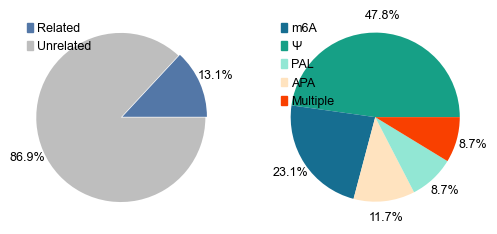

In [244]:
#'#5377a7','#cad1e6','#ffe3bd','#ea8186'
#pie_colors={'Related':'#5377a7','Unrelated':'#bebebe','m6A':'#cad1e6','Ψ':'#5377a7','APA':'#fee9c9','PAL':'#ed8233','Multiple':'#ea8186'}
pie2_color={'m6A':'#166e91','Ψ':'#16a086','PAL':'#92e7d4','APA':'#ffe3bf','Multiple':'#f94000'}
pie1_color={'Related':'#5377a7','Unrelated':'#bebebe'}
#pie2_color={'Ψ':'#5377a7','m6A':'#cad1e6','APA':'#fee9c9','PAL':'#ed8233','Multiple':'#ea8186'}
fig,ax=plt.subplots(1,2,figsize=(6,5))
pie_1_dat=pd.DataFrame({'rna_ty':['Related','Unrelated'],'num':[df2[(df2['Transcript'].notna()) & (df2['rna_ty']!='Unrelated')]['rna_ty'].value_counts().sum(),
                                                                df2[(df2['Transcript'].notna()) & (df2['rna_ty']=='Unrelated')]['rna_ty'].value_counts().sum()]})
related_sum=df2[(df2['Transcript'].notna()) & (df2['rna_ty']!='Unrelated')]['rna_ty'].value_counts().sum()
pie_2_dat=pd.DataFrame(df2[(df2['Transcript'].notna()) & (df2['rna_ty']!='Unrelated')]['rna_ty'].value_counts()/related_sum*100).reset_index().rename(columns={'num':'rna_ty','count':'num'})
pie_1_dat['color']=pie_1_dat['rna_ty'].map(pie1_color)
pie_2_dat['color']=pie_2_dat['rna_ty'].map(pie2_color)
ax[0].pie(x=pie_1_dat['num'],autopct='%1.1f%%',colors=pie_1_dat['color'],startangle=0,pctdistance=1.2,labeldistance=50.01,explode = (0.01,0.01))
ax[1].pie(x=pie_2_dat['num'],autopct='%1.1f%%',colors=pie_2_dat['color'],startangle=0,pctdistance=1.2,labeldistance=50.01)
legend_element=[mpatches.Patch(color=color,label=factor) for factor,color in pie1_color.items()]
ax[0].legend(handles=legend_element,loc='upper left',title='',fontsize=9,handlelength=0.5,handletextpad=0.3,frameon=False)
legend_element=[mpatches.Patch(color=color,label=factor) for factor,color in pie2_color.items()]
ax[1].legend(handles=legend_element,loc='upper left',title='',fontsize=9,handlelength=0.5,handletextpad=0.3,frameon=False)
plt.savefig(mul_fp+'diff_rna_typie.pdf',transparent=True,bbox_inches='tight')

In [245]:
pie_1_dat=pd.DataFrame({'pro_ty':['Related','Unrelated'],'num':[df2[(df2['Protein'].notna()) & (df2['pro_ty']!='Unrelated')]['pro_ty'].value_counts().sum(),
                                                                df2[(df2['Transcript'].notna()) & (df2['pro_ty']=='Unrelated')]['pro_ty'].value_counts().sum()]})
related_sum=df2[(df2['Protein'].notna()) & (df2['rna_ty']!='Unrelated')]['pro_ty'].value_counts().sum()
pie_2_dat=pd.DataFrame(df2[(df2['Protein'].notna()) & (df2['pro_ty']!='Unrelated')]['pro_ty'].value_counts()/related_sum*100).reset_index()


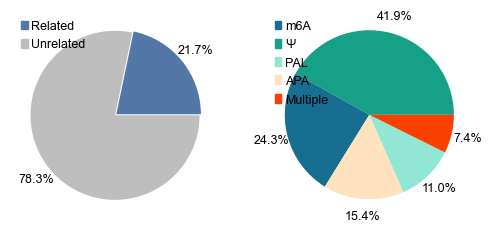

In [247]:
#'#5377a7','#cad1e6','#ffe3bd','#ea8186'
#pie_colors={'Related':'#5377a7','Unrelated':'#bebebe','m6A':'#cad1e6','Ψ':'#5377a7','APA':'#fee9c9','PAL':'#ed8233','Multiple':'#ea8186'}
pie2_color={'m6A':'#166e91','Ψ':'#16a086','PAL':'#92e7d4','APA':'#ffe3bf','Multiple':'#f94000'}
pie1_color={'Related':'#5377a7','Unrelated':'#bebebe'}
#pie2_color={'Ψ':'#5377a7','m6A':'#cad1e6','APA':'#fee9c9','PAL':'#ed8233','Multiple':'#ea8186'}
fig,ax=plt.subplots(1,2,figsize=(6,5))
pie_1_dat=pd.DataFrame({'pro_ty':['Related','Unrelated'],'num':[df2[(df2['Protein'].notna()) & (df2['pro_ty']!='Unrelated')]['pro_ty'].value_counts().sum(),
                                                                df2[(df2['Protein'].notna()) & (df2['pro_ty']=='Unrelated')]['pro_ty'].value_counts().sum()]})
related_sum=df2[(df2['Protein'].notna()) & (df2['pro_ty']!='Unrelated')]['pro_ty'].value_counts().sum()
pie_2_dat=pd.DataFrame(df2[(df2['Protein'].notna()) & (df2['pro_ty']!='Unrelated')]['pro_ty'].value_counts()/related_sum*100).reset_index().rename(columns={'num':'rna_ty','count':'num'})
pie_1_dat['color']=pie_1_dat['pro_ty'].map(pie1_color)
pie_2_dat['color']=pie_2_dat['pro_ty'].map(pie2_color)
ax[0].pie(x=pie_1_dat['num'],autopct='%1.1f%%',colors=pie_1_dat['color'],startangle=0,pctdistance=1.2,labeldistance=50.01,explode = (0.01,0.01))
ax[1].pie(x=pie_2_dat['num'],autopct='%1.1f%%',colors=pie_2_dat['color'],startangle=0,pctdistance=1.2,labeldistance=50.01)
legend_element=[mpatches.Patch(color=color,label=factor) for factor,color in pie1_color.items()]
ax[0].legend(handles=legend_element,loc='upper left',title='',fontsize=9,handlelength=0.5,handletextpad=0.3,frameon=False)
legend_element=[mpatches.Patch(color=color,label=factor) for factor,color in pie2_color.items()]
ax[1].legend(handles=legend_element,loc='upper left',title='',fontsize=9,handlelength=0.5,handletextpad=0.3,frameon=False)
# plt.savefig(fp+'diff_pro_typie.pdf',transparent=True,bbox_inches='tight')

In [248]:
pd.DataFrame(df2[(df2['Protein'].notna()) & (df2['pro_ty']!='Unrelated')]['pro_ty'].value_counts())

,count
pro_ty,
Ψ,57
m6A,33
APA,21
PAL,15
Multiple,10


In [249]:
pd.DataFrame(df2[(df2['Transcript'].notna()) & (df2['rna_ty']!='Unrelated')]['rna_ty'].value_counts()).sum()

count    563
dtype: int64

In [251]:
df2.to_csv(mul_fp+'change_rna_pro_type.csv',index=False)

In [8]:
mul_fp='/home/qq/work/lxr/DRS/script_plot/bamv/FILE/'
df2=pd.read_csv(mul_fp+'change_rna_pro_type.csv')

In [9]:
df2.rna_ty.value_counts()

rna_ty
Unrelated    3740
Ψ             269
m6A           130
APA            66
PAL            49
Multiple       49
Name: count, dtype: int64

In [253]:
df2.pro_ty.value_counts()

pro_ty
             4115
Unrelated     490
Ψ              57
m6A            33
APA            21
PAL            15
Multiple       10
Name: count, dtype: int64

In [10]:
pd.DataFrame(df2[df2['rna_ty']=='Unrelated']['index'].unique(),columns=['id']).to_csv(mul_fp+'rna_Unrelated_gene.csv',index=False)
pd.DataFrame(df2[df2['pro_ty']=='Unrelated']['index'].unique(),columns=['id']).to_csv(mul_fp+'pro_Unrelated_gene.csv',index=False)

In [11]:
pd.DataFrame(df2[(df2['rna_ty']!='Unrelated') & (df2['Transcript'].notna())]['index'].unique(),columns=['id']).to_csv(mul_fp+'rna_related_gene.csv',index=False)
pd.DataFrame(df2[(df2['pro_ty']!='Unrelated') & (df2['Protein'].notna())]['index'].unique(),columns=['id']).to_csv(mul_fp+'pro_related_gene.csv',index=False)

In [20]:
pie2_color={'m6A':'#166e91','Ψ':'#16a086','PAL':'#92e7d4','APA':'#ffe3bf','Multiple':'#f94000'}
for i in pie2_color.keys():
    pd.DataFrame(df2[(df2['rna_ty']==i) & (df2['Transcript'].notna())]['index'].unique(),columns=['id']).to_csv(mul_fp+'related_unrelated_kegg'+'/'+i+'_rna_related_gene.csv',index=False)
    pd.DataFrame(df2[(df2['pro_ty']==i) & (df2['Protein'].notna())]['index'].unique(),columns=['id']).to_csv(mul_fp+'related_unrelated_kegg'+'/'+i+'_pro_related_gene.csv',index=False)

### 3. KEGG plot

In [ ]:
related_unrelated_kegg=pd.read_csv(mul_fp+"related_unrelated_kegg.csv")

In [ ]:
def get_gr(str_gr):
    split_gr=str_gr.split("/")
    return round(int(split_gr[0])/int(split_gr[1]),4)

In [17]:
related_unrelated_kegg['gene_ratio']=related_unrelated_kegg['GeneRatio'].apply(get_gr)
related_unrelated_kegg['Count']=related_unrelated_kegg['Count'].astype(float)
related_unrelated_kegg['-log10pvalue']=-np.log10(related_unrelated_kegg['pvalue'])

In [ ]:
related_unrelated_kegg[related_unrelated_kegg['type'].str.contains('rna')]

In [ ]:
fig,ax=plt.subplots(1,2,figsize=(6,3.5))
plot_dat_1=related_unrelated_kegg[related_unrelated_kegg['type'].str.contains('rna')]
plot_dat_1['label']='rna'
plot_dat_2=related_unrelated_kegg[related_unrelated_kegg['type'].str.contains('pro')]
plot_dat_2['label']='pro'
f1=sns.scatterplot(x=plot_dat_1['gene_ratio'],ax=ax[0],y=plot_dat_1['Description'],size=plot_dat_1['Count'],
                palette='vlag',sizes=(80, 180),legend=True,c=plot_dat_1['-log10pvalue'])
norm = plt.Normalize( plot_dat_1['-log10pvalue'].max(),plot_dat_1['-log10pvalue'].min())
sm = plt.cm.ScalarMappable(cmap="viridis", norm=norm)
sm.set_array([])
plt.colorbar(sm, label='-log10pvalue', fraction=0.05, pad=0,ax=ax[0])
f2=sns.scatterplot(x=plot_dat_2['gene_ratio'],ax=ax[1],y=plot_dat_2['Description'],size=plot_dat_2['Count'],
                palette='vlag',sizes=(80, 180),legend=True,c=plot_dat_2['-log10pvalue'])

f2.yaxis.set_ticks_position('right')
f2.yaxis.set_label_position('right') 
# norm = plt.Normalize( plot_dat_2['-log10pvalue'].max(),plot_dat_2['-log10pvalue'].min())
# sm = plt.cm.ScalarMappable(cmap="viridis", norm=norm)
# sm.set_array([])
# plt.colorbar(sm, label='-log10pvalue', fraction=0.05, pad=1)
# f1=sns.scatterplot(x='gene_ratio', y='Description', size='Count', hue='-log10pvalue', data=plot_dat_1, sizes=(80, 200), palette="viridis", legend="full",ax=ax[0])
#plt.clim(0,1.0)

ax[0].set_ylabel('')
ax[1].set_ylabel('')
ax[0].set_xlabel('GeneRatio')
ax[1].set_xlabel('GeneRatio')
plt.savefig('F:\\project\\DRS\\result\\10_regulate\\related_unrelated_kegg\\'+'related_unrelated_5kegg.pdf',transparent=True,bbox_inches='tight')

multiple plot KEGG

In [257]:
pie2_color={'m6A':'#166e91','Ψ':'#16a086','PAL':'#92e7d4','APA':'#ffe3bf','Multiple':'#f94000'}

In [ ]:
pro_multiple=pd.read_csv(mul_fp+'Multiple_pro_related_gene_kegg.csv')

In [ ]:
rna_multiple=pd.read_csv(fp+'Multiple_rna_related_gene_kegg.csv')

In [ ]:
pro_multiple['type']='pro'
rna_multiple['type']='rna'

In [ ]:
related_unrelated_kegg=pd.concat([pro_multiple,rna_multiple])

In [ ]:
related_unrelated_kegg['gene_ratio']=related_unrelated_kegg['GeneRatio'].apply(get_gr)
related_unrelated_kegg['Count']=related_unrelated_kegg['Count'].astype(float)
related_unrelated_kegg['-log10pvalue']=-np.log10(related_unrelated_kegg['pvalue'])

In [ ]:
related_unrelated_kegg

In [ ]:
fig,ax=plt.subplots(2,1,figsize=(4,6))
plot_dat_1=related_unrelated_kegg[related_unrelated_kegg['type'].str.contains('rna')]
plot_dat_1['label']='rna'
plot_dat_2=related_unrelated_kegg[related_unrelated_kegg['type'].str.contains('pro')]
plot_dat_2['label']='pro'
f1=sns.scatterplot(x=plot_dat_1['gene_ratio'],ax=ax[0],y=plot_dat_1['Description'],size=plot_dat_1['Count'],
                palette='vlag',sizes=(80, 180),legend=True,c=plot_dat_1['-log10pvalue'])
norm = plt.Normalize( plot_dat_1['-log10pvalue'].max(),plot_dat_1['-log10pvalue'].min())
sm = plt.cm.ScalarMappable(cmap="viridis", norm=norm)
sm.set_array([])
plt.colorbar(sm, label='-log10pvalue', fraction=0.05, pad=0,ax=ax[0])
f2=sns.scatterplot(x=plot_dat_2['gene_ratio'],ax=ax[1],y=plot_dat_2['Description'],size=plot_dat_2['Count'],
                palette='vlag',sizes=(80, 180),legend=True,c=plot_dat_2['-log10pvalue'])

f2.yaxis.set_ticks_position('right')
f2.yaxis.set_label_position('right') 
# norm = plt.Normalize( plot_dat_2['-log10pvalue'].max(),plot_dat_2['-log10pvalue'].min())
# sm = plt.cm.ScalarMappable(cmap="viridis", norm=norm)
# sm.set_array([])
# plt.colorbar(sm, label='-log10pvalue', fraction=0.05, pad=1)
# f1=sns.scatterplot(x='gene_ratio', y='Description', size='Count', hue='-log10pvalue', data=plot_dat_1, sizes=(80, 200), palette="viridis", legend="full",ax=ax[0])
#plt.clim(0,1.0)

ax[0].set_ylabel('')
ax[1].set_ylabel('')
ax[0].set_xlabel('GeneRatio')
ax[1].set_xlabel('GeneRatio')
plt.savefig(mul_fp+'related_unrelated_5kegg.pdf',transparent=True,bbox_inches='tight')